This is the notebook containing the code to create the visualizations of my master thesis "Integrating Algorithm Selection and Configuration:A Proof of Concept for the Modular CMA-ES". 

This is part of a GitHub repository: https://github.com/Dvermetten/CMA_ES_hyperparam, which also contains the source code for the experiments and the raw data.

This notebook is structured differently than the thesis, but the major subsections should match those of the thesis. Each figure from the experiments described in the thesis is generated by this notebook. 

In addition to the content of the thesis, this notebook also contains some additional (mostly exploratory) experiments, which did not fit into the main document. They are included here for completeness, and might be expanded upon in future work.

# Initialization

Load required modules

In [391]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as ss
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as colors
from matplotlib.patches import Rectangle
import seaborn as sns
import scipy.stats

Matplotlib settings

In [392]:
font = {'size'   : 12}

plt.rc('font', **font)
%matplotlib nbagg

Set data locations. Download required data_files at https://surfdrive.surf.nl/files/index.php/s/dRS0L5NE4XarYYo and change these parameters to the folder where the data is stored.

In [393]:
Data_loc = "D:/Master/data/"

Main_folder = "D:/Master/data/"

Data_location = f"{Main_folder}Data_npy/"
budget_folder = f"{Main_folder}Budget/"
parameter_folder = f"{Main_folder}Parameters/"
two_stage_folder = f"{Main_folder}TwoStage"

Default functions for dealing with configurations

In [394]:
conf_names = ["active","elitist","mirrored","orthogonal","sequential","threshold","tpa","selection","weights","sampler","ipop"]
def intToRepr(integer):
    """
        Dencode the ES-structure from a single integer back to the mixed base-2 and 3 representation.
        Reverse of :func:`~reprToInt`

        >>> intToRepr(93)
        >>> [0,0,0,0,0,1,0,1,0,1,0]

        :param integer: Integer (e.g. outoutput from reprToInt() )
        :returns:       String consisting of all structure choices concatenated,
    """
    max_length = 11
    factors = [2304, 1152, 576, 288, 144, 72, 36, 18, 9, 3, 1]
    representation = []
    for i in range(max_length):
        if integer >= factors[i]:
            gene = integer // factors[i]
            integer -= gene * factors[i]
        else:
            gene = 0
        representation.append(gene)

    return representation

def reprToInt(representation):
    """
        Encode the ES-structure representation to a single integer by converting it to base-10 as if it is a
        mixed base-2 or 3 number. Reverse of :func:`~intToRepr`

        >>> reprToInt([0,0,0,0,0,1,0,1,0,1,0])
        >>> 93

        :param representation:  Iterable; the genotype of the ES-structure
        :returns:               String consisting of all structure choices concatenated,
    """
    # TODO FIXME Hardcoded
    max_length = 11
    factors = [2304, 1152, 576, 288, 144, 72, 36, 18, 9, 3, 1]
    integer = 0
    for i in range(max_length):
        integer += representation[i] * factors[i]

    return integer

In [28]:
intToRepr(2345)

[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 2]

Function to calculate the Kendall rank correlation coefficient

In [395]:
def kendall_rank_coeff(l1, l2):
    rank_pre = ss.rankdata(l1)
    rank_post = ss.rankdata(l2)
    x = 0
    tot = len(l1)*(len(l1)-1)/2
    for i in range(len(l1)):
        for j in range(i+1,len(l1)):
            #0.1 is added to deal with equal ranks
            if rank_pre[i] == rank_pre[j] or rank_post[i] == rank_post[j]:
                continue
            else:
                x += np.sign(rank_pre[i]-rank_pre[j]) * np.sign(rank_post[i]-rank_post[j])
    return x/tot

Function to calculate ERT from a list of hitting times

In [396]:
def calc_ert(x, budget=25000):
    x = np.array(x)
    x[x >= budget] = budget
    return np.sum(x)/(len(x)-np.sum([y==budget for y in x]))

# Exploration of hyperparameters

## Initial exploration

For the first experiment, we choose 10 static configurations from the previously determined adaptive configurations: the 5 best  and 5 worst (out of the top ~50 best) unique C_1's.

These configurations were run until the final target (10^-8), optimized using the Bayesian optimizer with a Gaussian process internal model, with a budget of 50 evaluations. Each evaluation consists of 5 times 5 runs.

The hyperparameters which were optimized are: 'c_1', 'c_mu' and 'c_c', with a valid range of [0,1] for all of them.

<IPython.core.display.Javascript object>


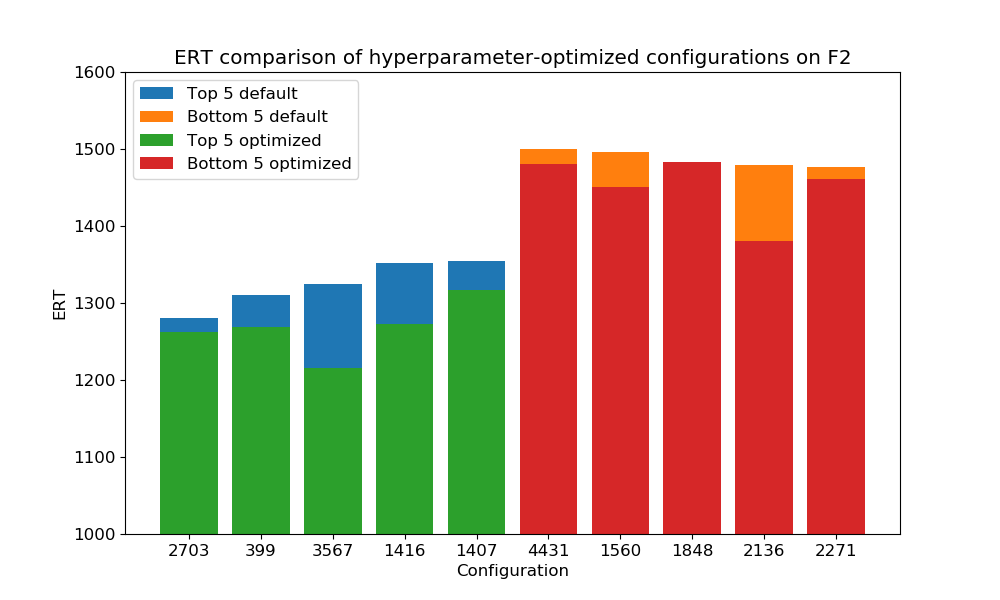

In [8]:
fid = 2

#configuration info
top5 = np.load(f"F{fid}_Best_C1.npy")
bot5 = np.load(f"F{fid}_worst_C1.npy") #worst of the saved ~50 best configurations

#data from the optimization process
data = np.load(f"{Data_location}Statics_hyperparams_F{fid}.npy")
data2 = np.load(f"{Data_location}Statics_hyperparams_F{fid}_worst.npy")

confs = [int(top5[i][1]) for i in range(5)]
splits = [int(top5[i][0]) for i in range(5)]
for i in range(5):
    confs.append(int(bot5[i][1]))
    splits.append(int(bot5[i][0]))
    
plt.figure(figsize=(10,6))
plt.bar(range(5), [top5[i][-1] for i in range(5)], label='Top 5 default')
plt.bar(range(5,10), [bot5[i][-1] for i in range(5)], label ='Bottom 5 default')
plt.bar(range(5),[26/25*data[i][4][1] for i in range(5)], label = 'Top 5 optimized')
plt.bar(range(5,10),[26/25*data2[i][4][1] for i in range(5)], label= 'Bottom 5 optimized')
plt.ylim(1000,1600)
plt.ylabel('ERT')
plt.xticks(range(10),confs)
plt.xlabel('Configuration')
plt.legend()
plt.title(f"ERT comparison of hyperparameter-optimized configurations on F{fid}")
plt.show()

In [14]:
np.mean([1-j/i for i,j in zip([top5[i][-1] for i in range(5)], [26/25*data[i][4][1] for i in range(5)])]),np.mean([1-j/i for i,j in zip([bot5[i][-1] for i in range(5)], [26/25*data2[i][4][1] for i in range(5)])])

(0.04278943045455876, 0.02373673425681009)

From this figure, we can see that some improvement is achievable within as little as 50 evaluations. However, the improvements average only ~3%. In the next experiment, we will attempt to determine a better budget to use.

## Budget determination

We now run the hyperparameter optimization with a budget of 600 to determine how many evaluations would be required to achieve a good balance between improvement and required computation time. In the following figure we show the progression of the best-so-far ERT relative to the number of evaluations used.

<IPython.core.display.Javascript object>


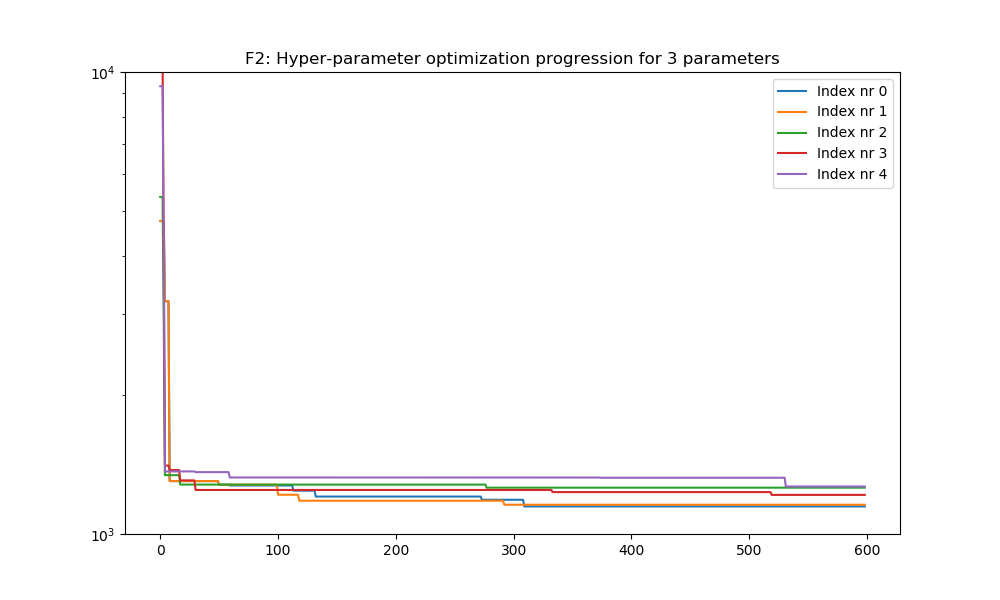

In [12]:
fid = 2

plt.figure(figsize=(10,6))
for i in range(5):
    budget_data = pd.read_csv(f"{budget_folder}F{fid}budget_600_nr{i}", index_col=0)
    budget_array = np.array(budget_data).T[-1]
    budget_progression = [min(budget_array[:j+1]) for j in range(599)]
    plt.plot(budget_progression, label=f"Index nr {i}")
plt.legend()
plt.title(f"F{fid}: Hyper-parameter optimization progression for 3 parameters")
plt.ylim(1000,10000)
plt.yscale('log')
plt.show()

From this figure, we see that during the first few evaluations, a lot of improvement is achieved. After this initial improvement, only relatively minor improvements are present. Based on this, we decide that a budget of 200 should be sufficient to get a decent improvement without needing too much computation time.

## Parameter bounds

Now that we have decided upon a budget to use, we need to determine bounds for the parameters. Since the value of the default parameters is dependent on the configuration, we will use this information to create our bounded parameter space as follows:
- The minimum value is always 0
- The maximum value is the default value for a configuration, times 2, plus 0.1
This allows the new parameter values to become quite a bit larger than the defaults, without getting unreasonable values which would only waste evaluations.

# Experiments on static configurations

## F21

### General

Read configurations, which were chosen as follows: take the 50 best static configurations, and add a few random ones. Note that we do include configurations with (B)IPOP as well.

Read original static data

In [218]:
confs = np.load(f"{Data_loc}/other/Statics_F21.npy")
df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f21.csv", index_col=0)

Determine the predicted ERT based on the original static data

In [223]:
temp = np.array(df['10e-8.0'])
preds = [np.sum(temp[(i)*25:25*(i+1)])/(25-np.sum(temp[(i)*25:25*(i+1)]==np.nan)) for i in range(4608)]

Process the data from the hyperparameter optimization

In [224]:
data_full = {}
for conf in confs:
    data = {}
    data["Rec"] = pd.read_csv(f"{Data_loc}Statics_F21/Results/F21_st_{conf}", index_col=0)
    data["Full"] = pd.read_csv(f"{Data_loc}Statics_F21/Full/F21_rep{conf}.csv")
    data["Best_ERT"] = np.min(data["Rec"]["fitness"])
    best_ert_idx = np.argmin(data["Rec"]["fitness"])
    data["Best_var"] = np.std(np.array(data["Full"])[best_ert_idx-1])
    data["Default_var"] = np.std(np.array(data["Full"])[18])
    data["Default_ERT"] = data["Rec"]["fitness"][19]
    data["Predicted_ERT"] = preds[conf]
    data_full[conf] = data

In [54]:
f21_rerun_confs = np.load("statics_F21.npy")

Show the best achieved ERT during the optimization relative to the ERT with the default hyperparameter settings. 

Note: The default values are rerun during the optimization, as part of the initial sample of size 20. This ensures that a negative improvement should never be possible (if variance is ignored, which is a matter we will look at later on).

<IPython.core.display.Javascript object>


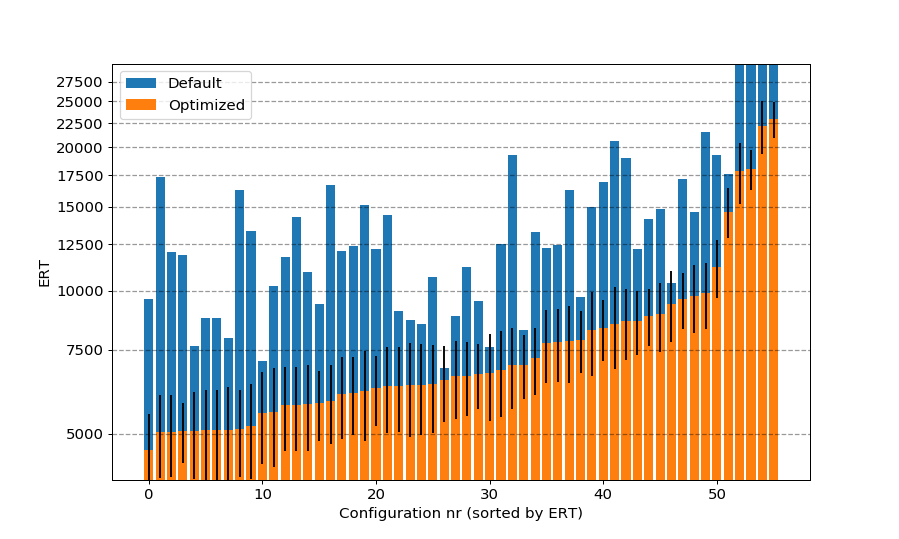

In [72]:
plt.figure(figsize=(10,6))
plt.yscale('log')
plt.axhline(5000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(7500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(10000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(12500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(15000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(17500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(20000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(22500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(25000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(27500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.yticks([5000+(2500*i) for i in range(10)],[5000+(2500*i) for i in range(10)])
plt.minorticks_off()
# plt.ylables([5000+(2500*i) for i in range(10)])
order = np.argsort([data_full[i]["Best_ERT"] for i in confs])
plt.bar(range(56),[data_full[i]["Default_ERT"] for i in [confs[j] for j in order]], label="Default")
plt.bar(range(56),[data_full[i]["Best_ERT"] for i in [confs[j] for j in order]], label="Optimized", yerr= [data_full[i]["Best_var"]/5 for i in [confs[j] for j in order]])
plt.xlabel("Configuration nr (sorted by ERT)")
plt.ylabel("ERT")
plt.legend()
plt.ylim(4000,30000)
plt.savefig("F21_initial.pdf")

From this figure, we can see that the improvements in ERT are quite substantial for most configurations. To further illustrate this point, we will plot the percentage improvements in the figure below. 

<IPython.core.display.Javascript object>


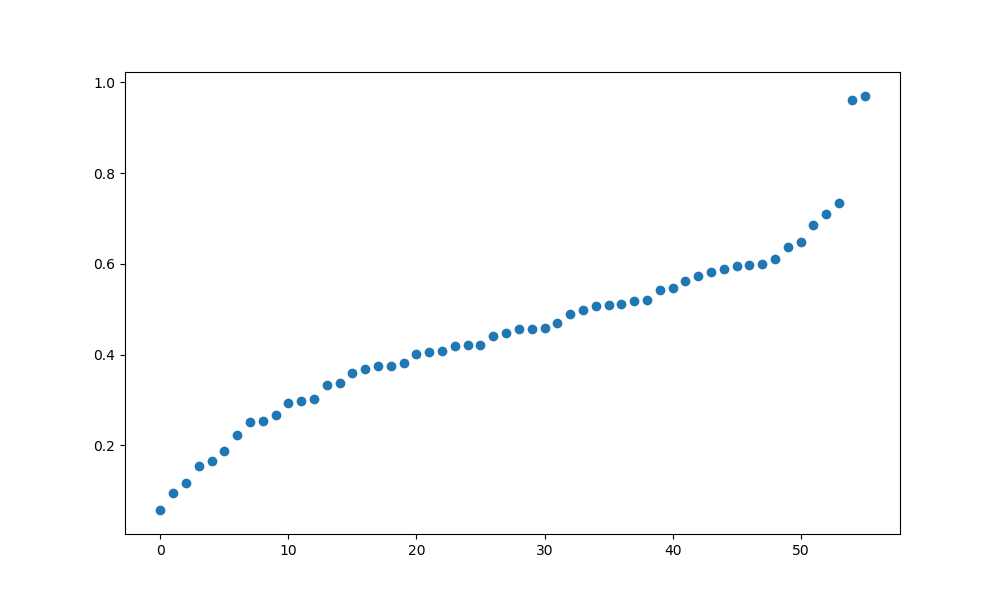

0.4522315584492723


In [36]:
plt.figure(figsize=(10,6))

plt.scatter(range(56),np.sort([1-data_full[i]["Best_ERT"]/data_full[i]["Default_ERT"] for i in [confs[j] for j in order]]))
plt.show()
print(np.median([1-data_full[i]["Best_ERT"]/data_full[i]["Default_ERT"] for i in [confs[j] for j in order]]))
# plt.bar(range(56),[data_full[i]["Best_ERT"] for i in [confs[j] for j in order]], yerr= [data_full[i]["Best_var"]/5 for i in [confs[j] for j in order]])

# plt.ylim(4000,30000)

As can be seen from this figure, the relative improvements are quite large, with a median of over $40\%$. This is a very promising result, but we need to be careful that this is not just the case for this specific function and for configurations with BIPOP. 
We still need to investigate the following issues to determine how viable these improvements are in the adaptive case:
1. Are similar improvements present in other functions?
2. Does a good hyperparameter setting translate well to the adaptive case? i.e. is a good hyperparameter setting for target 10^{-8} also good for a specific splitpoint and vice-versa?
3. How similar are the rankings of configurations before and after hyperparameter optimizations?

We will first focus on question 3. using the data we have already gathered for F21. Afterwards, we will try to answer question 1 by collecting data for a different function.

### Ranking

To determine how similar the rankings before and after the optimization are, we will create a figure showing 2 rankings: 
- The ranking as rerun during the optimization loop
- The ranking using the optimized hyperparameters

<IPython.core.display.Javascript object>


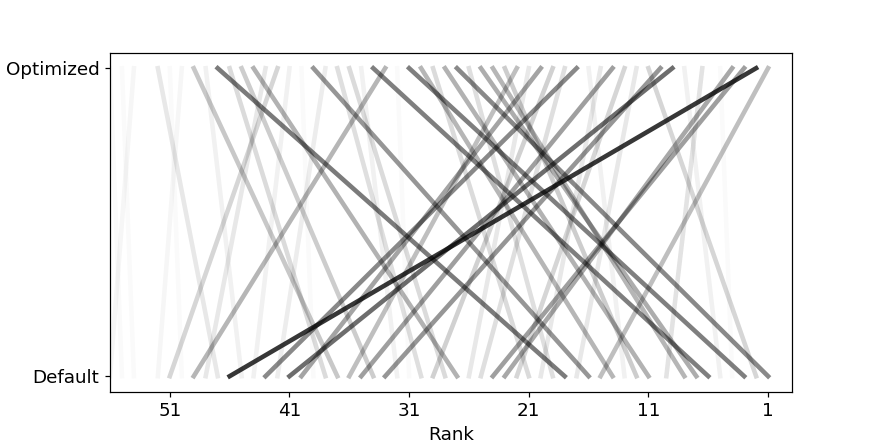

In [299]:
plt.figure(figsize=(8,4))
for [i,j,k] in zip(ss.rankdata([data_full[i]["Predicted_ERT"] for i in confs]),ss.rankdata([data_full[i]["Default_ERT"] for i in confs]),ss.rankdata([data_full[i]["Best_ERT"] for i in confs])):
    plt.plot((j,k),range(2),linewidth=3,color='k', alpha=min(1,abs(min(j,k)-max(j,k))/56))
plt.xlim(56,-1)
plt.xlabel("Rank")
plt.yticks([0,1],["Default","Optimized"])
plt.xticks([10*i+1 for i in range(6)])
# plt.title("Ranking before and after optimization")
# plt.xtitle("Rank")
plt.savefig("F21_rank_rotated_var2.pdf")

The following figure also shows the ranking based on the original 25-run data

<IPython.core.display.Javascript object>


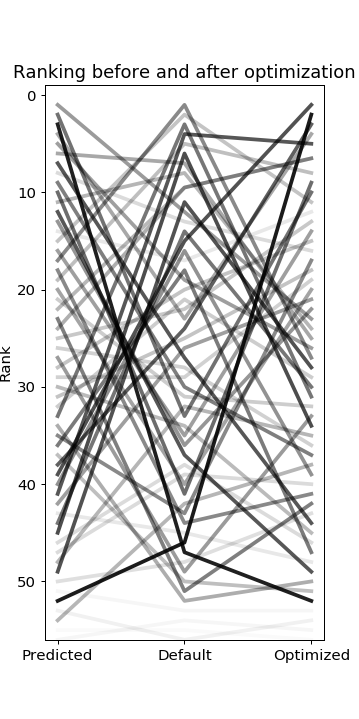

In [78]:
plt.figure(figsize=(4,8))
for [i,j,k] in zip(ss.rankdata([data_full[i]["Predicted_ERT"] for i in confs]),ss.rankdata([data_full[i]["Default_ERT"] for i in confs]),ss.rankdata([data_full[i]["Best_ERT"] for i in confs])):
    plt.plot(range(3),(i,j,k),linewidth=3,color='k', alpha=min(1,abs(min(i,j,k)-max(i,j,k))/56))
plt.ylim(56,-1)
plt.ylabel("Rank")
plt.xticks([0,1,2],["Predicted","Default","Optimized"])
plt.title("Ranking before and after optimization")
plt.savefig("F21_rank.pdf")

From this figure, we observe that the ranking are quire different. Even between the predicted and default values the changes in ranking are quite large. This is likely caused by the large variance present. To further investigate this claim, we will to the following experiment:
- Determine the AHT and the standard deviation for all configurations
- Simulate a new ranking by generation new AHTs according to random normal distributions with mean equal to AHT 
- Calculate the kendall rank coefficient for the two rankings

In [258]:
means = [np.mean(np.array(data_full[x]["Full"])[18]) for x in confs]
stds = [data_full[x]["Default_var"] for x in confs]
orig_erts = [data_full[x]["Default_ERT"] for x in confs]

tot = np.zeros((1000,))
for i in range(1000):
    sim_erts = np.zeros(len(confs),)
    for j in range(len(confs)):
        simulated_runs = np.random.normal(means[j],stds[j],(25,))
        simulated_runs[simulated_runs < 0] = 0
        simulated_runs[simulated_runs > 25000] = 25000
        sim_erts[j] = np.sum(simulated_runs)/ (25-np.sum(simulated_runs == 25000))
    tot[i] = kendall_rank_coeff(sim_erts, orig_erts)
np.mean(tot)

0.6482844155844155

In [56]:
scipy.stats.kendalltau([data_full[i]["Default_ERT"] for i in confs],[data_full[i]["Best_ERT"] for i in confs])

KendalltauResult(correlation=0.40480831708901877, pvalue=1.0661945362547201e-05)

From this experiments, we can see that the difference in ranking is not solely explained by variance.
However, we still do not know exactly what causes this difference. To determine whether this is solely a property of F21, we will now do a more thorough experiment on a different function. These experiments are in section 3.2

### Robustness

This section explores the impact of variance on the ERT improvements we saw previously. First, the data is loaded.

In [226]:
def_vals21 = []
opt_vals21 = []
def_var21 = []
opt_var21 = []
def_vals_split21 = []
opt_vals_split21 = []
def_var_split21 = []
opt_var_split21 = []
confs_tot21 = []
data_full21 = []
for c in confs:
    try:
        default_val21 = np.array(pd.read_csv(f"{Data_loc}250runs/F21_rep{c}.csv", header = None))
    #     print(np.mean(default_val))
    #     print(np.mean(opt_val))
        ert_def21 = np.sum(default_val21[1])/250-np.sum(default_val21[1]>=25000)
        ert_opt21 = np.sum(default_val21[0])/250-np.sum(default_val21[0]>=25000)
        def_var21.append(np.std(default_val21[1]))
        opt_var21.append(np.std(default_val21[0]))

        def_vals21.append(ert_def21)
        opt_vals21.append(ert_opt21)
        data_full21.append(default_val21[0])
    except:
        print(c)

The following figure shows the ERTs of the configurations from Section 3.1.1, rerun 250 times to give more reliable results

<IPython.core.display.Javascript object>


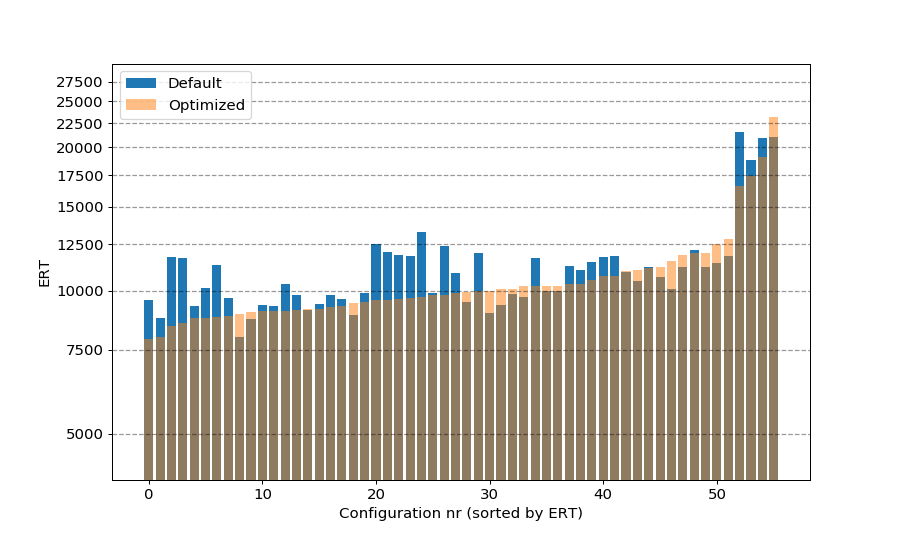

In [80]:
plt.figure(figsize=(10,6))
plt.yscale('log')
plt.axhline(5000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(7500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(10000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(12500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(15000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(17500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(20000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(22500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(25000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(27500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.yticks([5000+(2500*i) for i in range(10)],[5000+(2500*i) for i in range(10)])
plt.minorticks_off()
# plt.ylables([5000+(2500*i) for i in range(10)])
order = np.argsort(opt_vals21)
plt.bar(range(56),[def_vals21[i] for i in order], label="Default")
plt.bar(range(56),[opt_vals21[i] for i in order], label="Optimized", alpha=0.5)
plt.xlabel("Configuration nr (sorted by ERT)")
plt.ylabel("ERT")
plt.legend()
plt.ylim(4000,30000)
plt.savefig("F21_robust.pdf")

The figure above shows that the predicted improvement have mostly disappeared, leading to an average improvement of only 5% remaining

In [50]:
order = np.argsort(opt_vals21)

np.mean([1-opt_vals21[i]/def_vals21[i] for i in order])

0.05327107880698949

In [139]:
impr_opt = []
impr_def = []
imprs_tot = []
for i in range(len(confs)):
    temp_def = data_full[confs[i]]["Default_ERT"]
    temp_opt = data_full[confs[i]]["Best_ERT"]
    impr_def.append(1-def_vals21[i]/temp_def)
    impr_opt.append(1-opt_vals21[i]/temp_opt)
    imprs_tot.append(1-opt_vals21[i]/def_vals21[i])
np.mean(impr_def),np.mean(impr_opt), np.mean(imprs_tot)

(0.1449291122947171, -0.4418616269417906, 0.053271078806989496)

To investigate this phenomenon, we perform the following experiment:
we assume that for a given configuration around 10\% of tested hyperparameter values have the same hitting time distribution as the optimal hyperparameter value found by MIP-EGO. If we then sample $k$ runs on each instance from the set of 50 runs whose hitting times we have gathered, we end up with 20 sets of $5\cdot k$ hitting times, from which we then take the one with the best ERT. We can then compare its ERT to that of the original sample to see how much improvement we can find.

In [137]:
impr_per_sample = []
for k in range(1,50):
    max_impr = []
    for x, ert_x in zip(data_full21, opt_vals21):
        temp = []
        for j in range(100):
            p1 = x[:50]
            p2 = x[50:100]
            p3 = x[100:150]
            p4 = x[150:200]
            p5 = x[200:250]
            fake_imprs = []
            for i in range(20):
                temp_vals = []
                temp_vals.append(np.random.choice(p1,(k,), replace = False))
                temp_vals.append(np.random.choice(p2,(k,), replace = False))
                temp_vals.append(np.random.choice(p3,(k,), replace = False))
                temp_vals.append(np.random.choice(p4,(k,), replace = False))
                temp_vals.append(np.random.choice(p5,(k,), replace = False))
                temp_ert = np.sum(temp_vals)/(5*k)-np.sum([i>=25000 for i in temp_vals])
                fake_imprs.append(1-ert_x/temp_ert)
            temp.append(min(fake_imprs))
        max_impr.append(np.mean(temp))
    impr_per_sample.append(np.mean(max_impr))

<IPython.core.display.Javascript object>


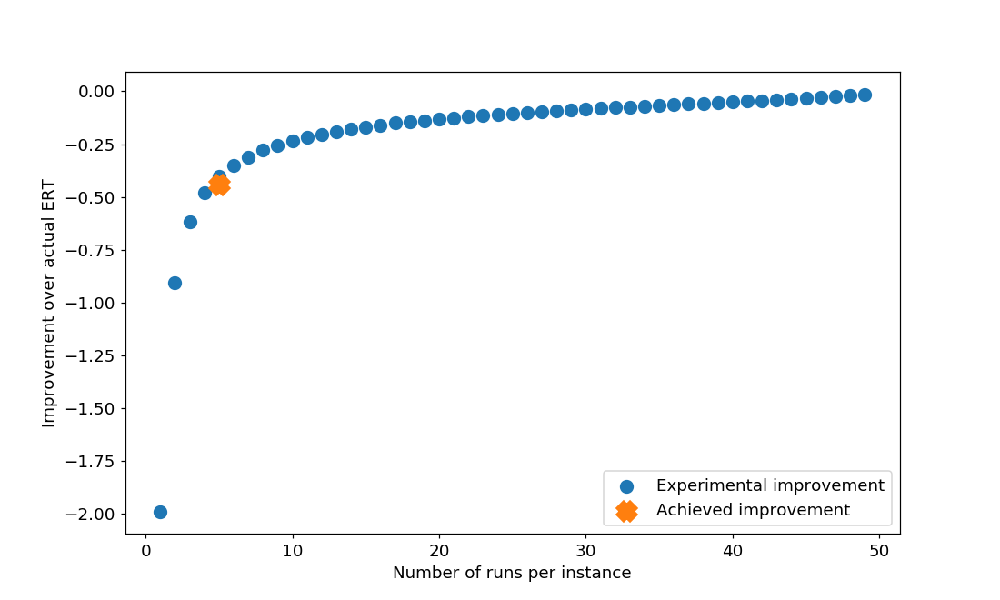

In [150]:
plt.figure(figsize=(10,6))
plt.scatter(range(1,50), impr_per_sample, label="Experimental improvement", linewidth=4)
plt.scatter(5, np.mean(impr_opt), label="Achieved improvement", marker='x', linewidth=15)
plt.legend()
plt.xlabel("Number of runs per instance")
plt.ylabel("Improvement over actual ERT")
plt.savefig("F21_impr_exp.pdf")

we can see that the observed worsening of the ERTs can be explained well by this sampling. In other words, during the running of MIP-EGO, we might sample from many similar distributions, and because we choose only the best one, we are likely to over-fit on the used seeds. This indicates that we need to be careful in interpreting our results and always repeat experiments on unseen seeds to verify generalizability of the selected hyperparameters.

In [227]:
f21_def_25 = []
f21_def_250 = []
f21_opt_25 = []
f21_opt_250 = []

for i in range(len(confs)):
    f21_def_25.append(data_full[confs[i]]["Default_ERT"])
    f21_opt_25.append(data_full[confs[i]]["Best_ERT"])
    f21_def_250.append(def_vals21[i])
    f21_opt_250.append(opt_vals21[i])


<IPython.core.display.Javascript object>


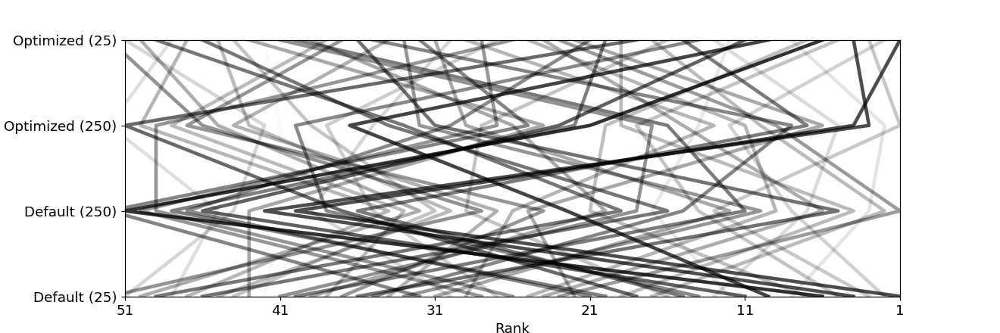

In [271]:
plt.figure(figsize=(12,4))
for [i,j,k,l] in zip(ss.rankdata(f21_def_25),ss.rankdata(f21_def_250),ss.rankdata(f21_opt_250),ss.rankdata(f21_def_25)):
    plt.plot((i,j,k,l),range(4),linewidth=3,color='k', alpha=min(1,abs(min(j,k,i,l)-max(j,k,i,l))/56))
plt.xlim(56,-1)
plt.xlabel("Rank")
plt.ylim(0,3)
plt.yticks([0,1,2,3],["Default (25)","Default (250)","Optimized (250)","Optimized (25)"])
plt.xticks([10*i+1 for i in range(6)])
# plt.title("Ranking before and after optimization")
# plt.xtitle("Rank")
plt.savefig("F21_rank_rotated_var3.pdf")

In [235]:
ss.kendalltau(f21_opt_250, f21_def_250)

KendalltauResult(correlation=0.39311241065627023, pvalue=1.9021959218685858e-05)

### Population size

The following experiment aims to include population size in the hyperparameter tuning process. This experiment is run for 4 different configurations.

This section is only an initial exploration, and not included in the thesis.

In [13]:
f21_rerun_confs = np.load("Statics_F21_lambda.npy")

In [31]:
for c in f21_rerun_confs:
    print(c, preds[c], preds[c-1], preds[c-2])
    data_param = pd.read_csv(f"{Data_loc}Lambda/F21_st_{c-2}_lambda", index_col=0)
    print(min(data_param["fitness"]))
    idx_min = np.argmin(data_param["fitness"])
    print(data_param["i0"][idx_min])
    print(data_param["fitness"][49])

4253 14428.6 nan nan
12699.7
49
36834.5
743 nan nan nan
24110.2
5
157092.57142857142
4487 14418.4 nan nan
35043.318181818184
11
131874.375
1877 8216.44 nan nan
37820.40909090909
76
74369.38461538461


The following figure shows the distribution of population sizes tested during the execution of MIP-EGO. Sizes were limited between 4 and 250. The performance of the same configurations with BIPOP enabled is shown as dashed lines.

<IPython.core.display.Javascript object>


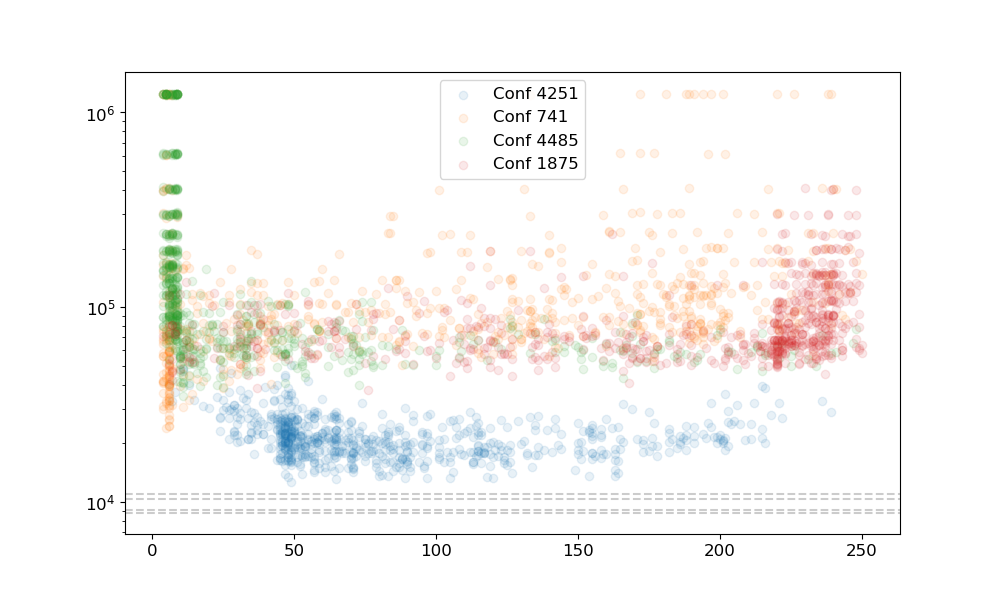

In [74]:
plt.figure(figsize=(10,6))
for i in range(len(f21_rerun_confs)):
    c = f21_rerun_confs[i]
    plt.axhline(opt_vals21[i], c='k', ls='--', alpha=0.2)
    data_param = pd.read_csv(f"{Data_loc}Lambda/F21_st_{c-2}_lambda", index_col=0)
    lambdas = data_param["i0"]
    vals = data_param["fitness"]
    plt.scatter(lambdas, vals,alpha=0.1, label=f"Conf {c-2}")
plt.yscale("log")
plt.legend()

The following figure shows the distributions of mean and variance of hitting times found during the runs described above.

<IPython.core.display.Javascript object>


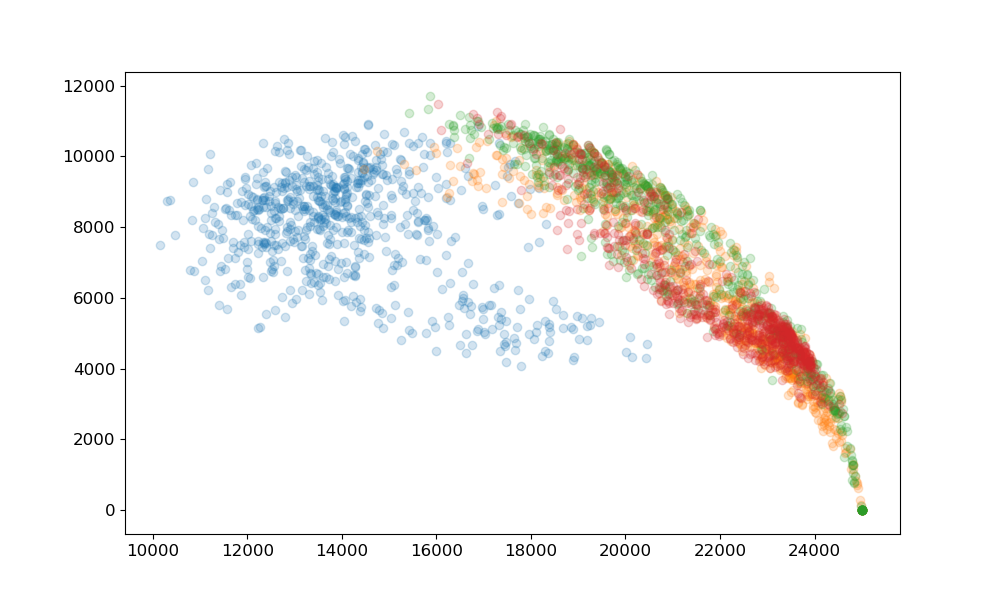

In [76]:
plt.figure(figsize=(10,6))
for c in f21_rerun_confs:
    data_temp = pd.read_csv(f"{Data_loc}/Lambda/F21_rep{c-2}.csv", header=None)
    means = np.mean(np.array(data_temp), axis=1)
    var_s = np.std(np.array(data_temp), axis=1)
    plt.scatter(means, var_s, alpha=0.2)

The final figure of this section shows the convergence of ERT during the MIP-EGO run.

<IPython.core.display.Javascript object>


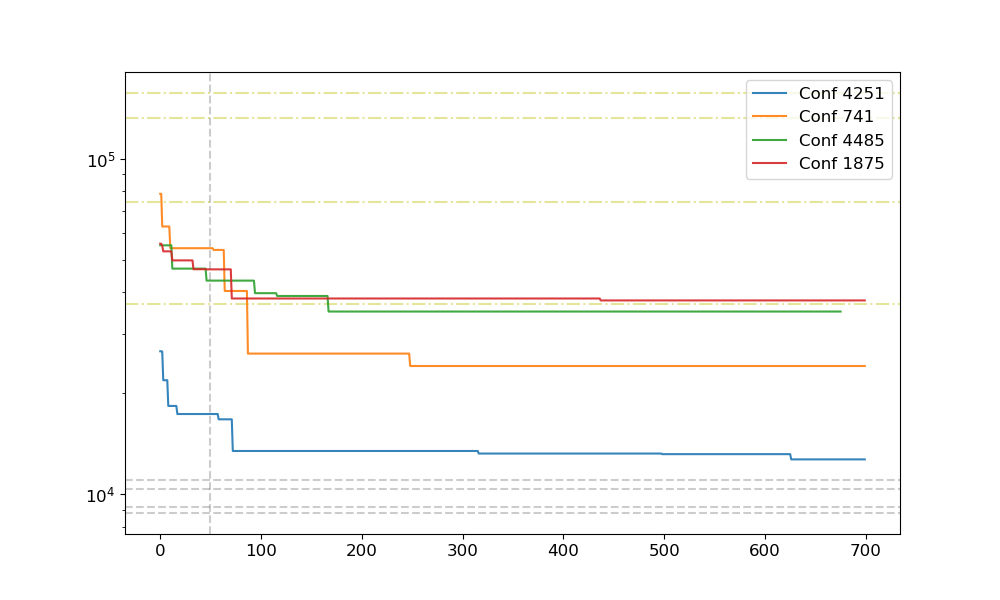

In [84]:
plt.figure(figsize=(10,6))
for i in range(len(f21_rerun_confs)):
    c = f21_rerun_confs[i]
    plt.axhline(opt_vals21[i], c='k', ls='--', alpha=0.2)
    data_param = pd.read_csv(f"{Data_loc}Lambda/F21_st_{c-2}_lambda", index_col=0)
    lambdas = data_param["i0"]
    vals = data_param["fitness"]
    plt.axhline(vals[49], color='y', alpha=0.4, ls='-.')
    plt.plot(range(len(vals)), [min(vals[:i+1]) for i in range(len(vals))],alpha=0.9, label=f"Conf {c-2}")
plt.axvline(49, color='k', ls='--', alpha=0.2)
plt.yscale("log")
plt.legend()

In [ ]:
for c in f21_rerun_confs:
    data_param = pd.read_csv(f"{Data_loc}Lambda/F21_st_{c-2}_lambda", index_col=0)
    vals = data_param["fitness"]
    min_vals = [min(vals[:i+1]) for i in range(len(vals))]
    change_idxs = []
    for i in range(50, len(min_vals)):
        if min_vals[i] < min_vals[i-1]:
            change_idxs.append(i)
    for idx in change_idxs:
        print(data_param["i0"][idx],(data_param["r0"][idx],data_param["r1"][idx],data_param["r2"][idx]))
    print("_______________________________________________________________________________________________")

## F12

### General

To get some more understanding of how the ranking changes between default and optimized hyperparameters, we have gathered data from three seperate groups of configurations on F12:
- The top 50 static configurations (+ the ones that occur in the best 50 adaptive configurations)
- Configurations ranked 200-256
- 56 random configurations

Note that for this experiment, we did not include BIPOP-configurations in the search space, as part of the data had already been gathered before the support for this was added.

In [236]:
df = pd.read_csv(f"{Data_loc}Static_orig/ERT_data_5D-f12.csv")

confs = np.load("Statics_F12_mid.npy")
confs2 = np.load(f"{Data_loc}other/Statics_F12.npy")
confs3 = np.load("Statics_F12_mid_new.npy")

data = {}
best_erts = {}
default_erts = {}
pred_ert = {}
best_params = {}

for c in confs:
    data[c] = pd.read_csv(f"{Data_loc}Statics_F21/Results/F12_st_{c}", index_col=0)
    best_erts[c] = min(data[c]['fitness'])
    default_erts[c] = data[c]['fitness'][19]
    pred_ert[c] = df['10e-8.0'][c]
    best_idx = np.argmin(data[c]['fitness'])
    best_params[c] = (data[c]['c_1'][best_idx], data[c]['c_c'][best_idx], data[c]['c_mu'][best_idx])
    
for c in confs2:
    data[c] = pd.read_csv(f"{Data_loc}Statics_F12/F12_st_{c}", index_col=0)
    best_erts[c] = min(data[c]['fitness'])
    default_erts[c] = data[c]['fitness'][19]
    pred_ert[c] = df['10e-8.0'][c]
    best_idx = np.argmin(data[c]['fitness'])
    best_params[c] = (data[c]['c_1'][best_idx], data[c]['c_c'][best_idx], data[c]['c_mu'][best_idx])
    
for c in confs3:
    temp = pd.read_csv(f"{Data_loc}Statics_F12/F12_rep{c}.csv", header=None)
    best_erts[c] = np.min(np.mean(temp,axis=1)) #AHT = ERT when all succceed
    default_erts[c] = np.mean(temp,axis=1)[19]    
    pred_ert[c] = df['10e-8.0'][c]
    data[c] = pd.read_csv(f"{Data_loc}Statics_F12/F12_st_{c}", index_col=0)
    best_idx = np.argmin(np.mean(temp,axis=1))
    best_params[c] = (data[c]['c_1'][best_idx], data[c]['c_c'][best_idx], data[c]['c_mu'][best_idx])

c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\numpy\core\fromnumeric.py:61: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return bound(*args, **kwds)


First, we will show an overview of the achieved optimized ERTs compared to the predicted static ERT and the ERT with the default parameter values

<IPython.core.display.Javascript object>


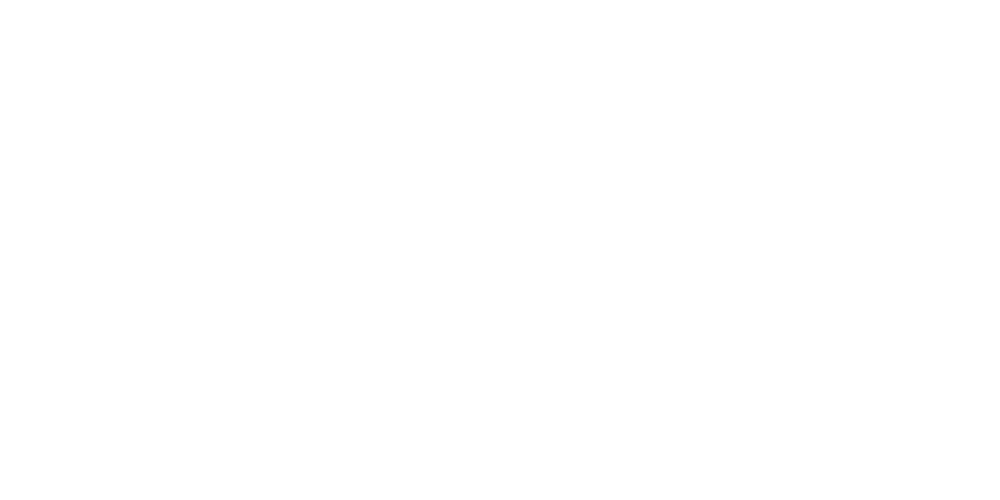

In [256]:
order = np.argsort([best_erts[x] for x in confs])
order2 = np.argsort([best_erts[x] for x in confs2])
order3 = np.argsort([best_erts[x] for x in confs3])


plt.figure(figsize=(10,5))
plt.bar(range(len(confs2)), ([best_erts[confs2[x]] for x in order2]), color = 'r', label="Group 1")
plt.bar([i + len(confs2) for i in range(len(confs3))], ([best_erts[confs3[x]] for x in order3]), color = 'g', label="Group 2")
plt.bar([i + len(confs2) + len(confs3) for i in range(len(confs))], ([best_erts[confs[x]] for x in order]), color = 'b', label="Group 3")

# plt.bar(range(len(confs2)), ([pred_ert[confs2[x]] for x in order2]),alpha=0.6, color = 'r')
# plt.bar([i + len(confs2) for i in range(len(confs3))], ([pred_ert[confs3[x]] for x in order3]),alpha=0.6, color = 'g')
# plt.bar([i + len(confs2) + len(confs3) for i in range(len(confs))], ([pred_ert[confs[x]] for x in order]),alpha=0.6, color = 'b')

plt.bar(range(len(confs2)), ([default_erts[confs2[x]] for x in order2]),alpha=0.3, color = 'r')
plt.bar([i + len(confs2) for i in range(len(confs3))], ([default_erts[confs3[x]] for x in order3]),alpha=0.3, color = 'g')
plt.bar([i + len(confs2) + len(confs3) for i in range(len(confs))], ([default_erts[confs[x]] for x in order]),alpha=0.3, color = 'b')

plt.yscale('log')
plt.ylim(1000,15000)

plt.axhline(5000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(7500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(10000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(12500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(15000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(2500,color='k',linewidth=1,alpha=0.4,linestyle='--')

plt.yticks([2500+(2500*i) for i in range(6)],[2500+(2500*i) for i in range(6)])

plt.legend()
plt.xlabel("Configuration nr (sorted by ERT per group)")
plt.ylabel("ERT")

plt.show()
# plt.savefig("F12_Initial_ERT.pdf")

Since this figure is hard to read, we will now show the improvement of the optimized vs default ERT

<IPython.core.display.Javascript object>


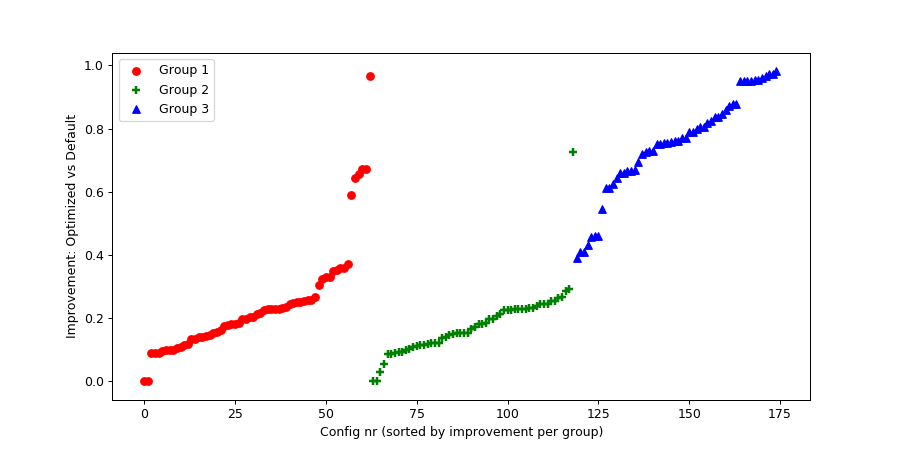

In [14]:
# order = np.argsort([pred_ert[x] for x in confs])
# order2 = np.argsort([pred_ert[x] for x in confs2])
# order3 = np.argsort([pred_ert[x] for x in confs3])


plt.figure(figsize=(10,5))
plt.scatter(range(len(confs2)), (np.sort([1-best_erts[confs2[x]]/default_erts[confs2[x]] for x in order2])), color = 'r', label='Group 1')
plt.scatter([i + len(confs2) for i in range(len(confs3))], (np.sort([1-best_erts[confs3[x]]/default_erts[confs3[x]] for x in order3])), color = 'g', label='Group 2', marker='+', linewidth=2)
plt.scatter([i + len(confs2) + len(confs3) for i in range(len(confs))], (np.sort([1-best_erts[confs[x]]/default_erts[confs[x]] for x in order])), color = 'b', label='Group 3', marker='^')
plt.legend()
plt.xlabel("Config nr (sorted by improvement per group)")
plt.ylabel("Improvement: Optimized vs Default")
plt.show()
plt.savefig("F12_imprs.pdf")

In [264]:
records = []
for i in [confs2[x] for x in order2]:
    records.append((1-best_erts[i]/default_erts[i], 1, 25))
    try:
        default_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_default.csv", header = None))
        opt_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_optimized.csv", header = None))
        ert_def = np.sum(default_val[0])/250-np.sum(default_val[0]==50000)
        ert_opt = np.sum(opt_val[0])/250-np.sum(opt_val[0]==50000)
        records.append((1-ert_opt/ert_def,1, 250))
    except:
        print(i)
for i in [confs3[x] for x in order3]:
    records.append((1-best_erts[i]/default_erts[i], 2, 25))
    default_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_default.csv", header = None))
    opt_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_optimized.csv", header = None))
    ert_def = np.sum(default_val[0])/250-np.sum(default_val[0]==50000)
    ert_opt = np.sum(opt_val[0])/250-np.sum(opt_val[0]==50000)
    records.append((1-ert_opt/ert_def,2, 250))
for i in [confs[x] for x in order]:
    records.append((1-best_erts[i]/default_erts[i], 3, 25))
    default_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_default.csv", header = None))
    opt_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{i}_optimized.csv", header = None))
    ert_def = np.sum(default_val[0])/250-np.sum(default_val[0]==50000)
    ert_opt = np.sum(opt_val[0])/250-np.sum(opt_val[0]==50000)
    records.append((1-ert_opt/ert_def,3, 250))
df_temp = pd.DataFrame.from_records(records, columns=["Relative Improvement", "Group Number", "Version"])

510


<IPython.core.display.Javascript object>


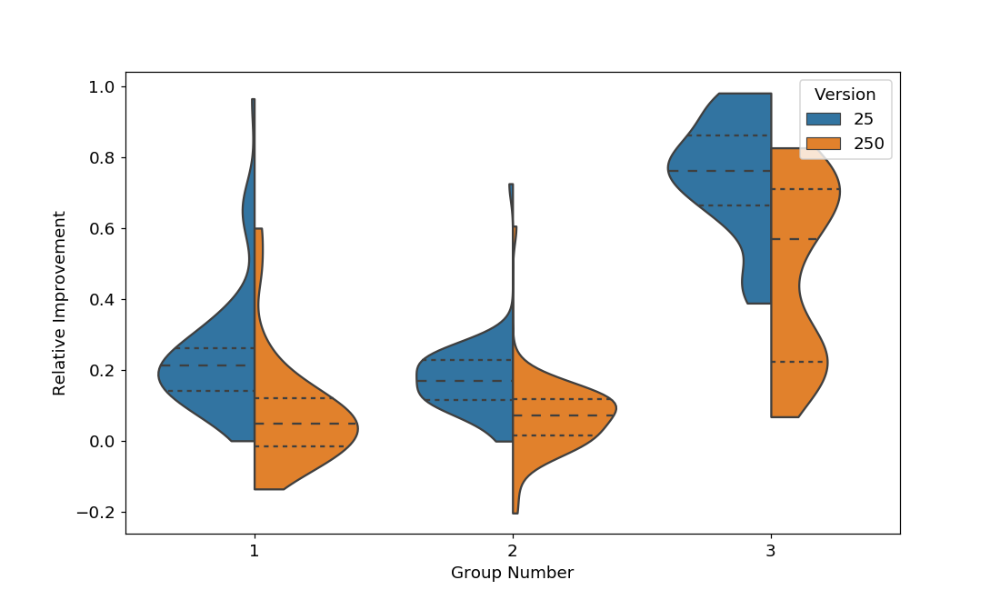

In [267]:
fig, ax = plt.subplots(figsize=(10,6))

sns.violinplot(data=df_temp, x="Group Number", y="Relative Improvement", hue="Version", split=True, cut=0, ax=ax, inner='quartile')
fig.savefig("F12_imprs_violinplot.pdf")
fig.show()

From this figure, we can see that the improvements are fairly consistent around 10 to 20%. This is a lot lower than we saw for F21. This might indicate that the default parameter values are already more suited to F12 than to F21, and thus there is less improvement to gain.

### Ranking

Next, we take another look at the ranking of ERTs in three stages: predicted, default and optimized. 

<IPython.core.display.Javascript object>


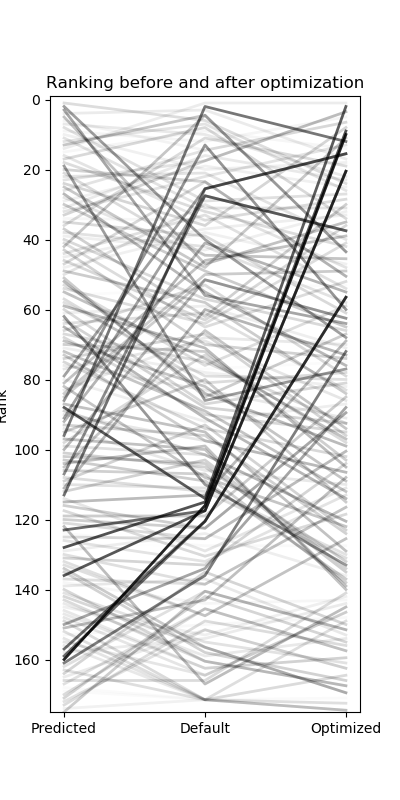

Text(0.5, 1.0, 'Ranking before and after optimization')

In [315]:
confs_full = np.append(np.append(confs, confs2), confs3)
rank_post = ss.rankdata([best_erts[x] for x in confs_full])
rank_def = ss.rankdata([default_erts[x] for x in confs_full])
rank_pre = ss.rankdata([pred_ert[x] for x in confs_full])
plt.figure(figsize=(4,8))
for [i,j,k] in zip(rank_def, rank_post, rank_pre):
    plt.plot(range(3),(k,i,j),linewidth=2,color='k', alpha=min(1,max(abs(i-j),abs(i-k),abs(j-k))/len(rank_post)))
plt.ylim(len(rank_post), -1)
plt.ylabel("Rank")
plt.xticks([0,1,2],["Predicted","Default","Optimized"])
plt.title("Ranking before and after optimization")

In [316]:
kendall_rank_coeff([best_erts[x] for x in confs_full],[default_erts[x] for x in confs_full])

0.6999671592775041

In [317]:
kendall_rank_coeff([pred_ert[x] for x in confs_full],[default_erts[x] for x in confs_full])

0.7103448275862069

From this figure, we can see that some configurations perform much better after the hyperparameter optimization, but in general the trend is less severe than it was for F21. The difference between predicted and default is also a lot smaller. This is confirmed by a much lower ranking coefficient. 

Note: We can not repeat the experiment we did for F21 since we have not recorded the individual hitting times for all configurations.

### Robustness

To get some additional insight in the stability of our data, we rerun the configurations with the optimized hyperparameter values we determined. We run them for $5\times 50$ runs. 


In [237]:
def_vals = []
opt_vals = []
def_var = []
opt_var = []
def_vals_split = []
opt_vals_split = []
def_var_split = []
opt_var_split = []
confs_tot = []
data_full = []
data_full_def = []
for c in np.append(confs,np.append(confs2,confs3)):
    try:
        default_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_default.csv", header = None))
        opt_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_optimized.csv", header = None))
        default_val_split = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_default_split.csv", header = None))
        opt_val_split = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_optimized_split.csv", header = None))
    #     print(np.mean(default_val))
    #     print(np.mean(opt_val))
        ert_def = np.sum(default_val[0])/250-np.sum(default_val[0]==50000)
        ert_opt = np.sum(opt_val[0])/250-np.sum(opt_val[0]==50000)
        def_var.append(np.std(default_val[0]))
        opt_var.append(np.std(opt_val[0]))

        def_vals.append(ert_def)
        opt_vals.append(ert_opt)
        
        ert_def_split = np.sum(default_val_split[0])/250-np.sum(default_val_split[0]==50000)
        ert_opt_split = np.sum(opt_val_split[0])/250-np.sum(opt_val_split[0]==50000)
        def_var_split.append(np.std(default_val_split[0]))
        opt_var_split.append(np.std(opt_val_split[0]))

        def_vals_split.append(ert_def_split)
        opt_vals_split.append(ert_opt_split)
        data_full.append(opt_val[0])
        data_full_def.append(default_val[0])
        confs_tot.append(c)
    except:
        print(c)

510


The following figure shows the resulting ERTs, similar to the first figure of Section 3.2.1, but for 250 runs

<IPython.core.display.Javascript object>


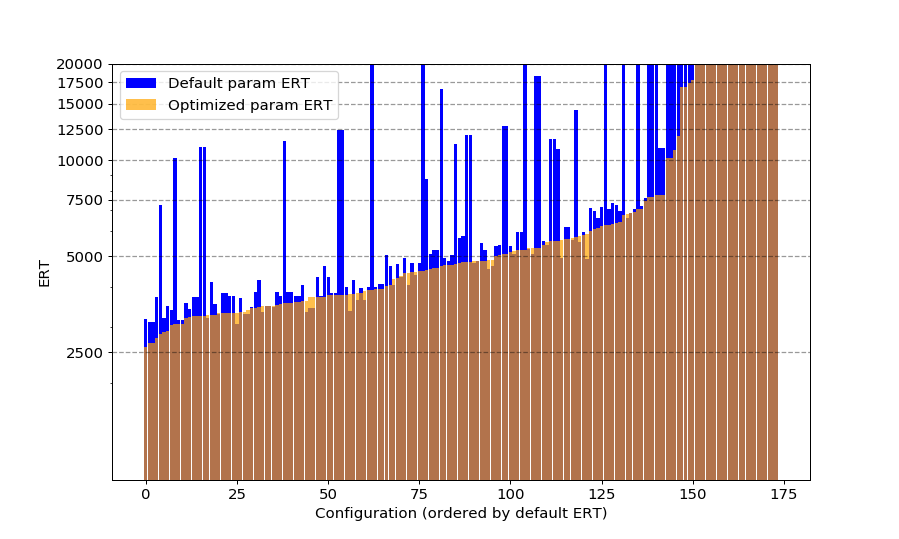

In [51]:
plt.figure(figsize=(10,6))
order = np.argsort(opt_vals)
plt.bar([i for i in range(len(order))], [def_vals[i] for i in order],color='b',width=0.9,label="Default param ERT")
plt.bar([i for i in range(len(order))], [opt_vals[i] for i in order],color='orange',width=0.9, label="Optimized param ERT",alpha=0.7)
# plt.title("F12: ERT with default vs optimized hyperparameters (250 runs)")
# plt.bar([i+0.25 for i in range(118)], [best_erts[confs_tot[i]] for i in order],color='r', alpha=0.5, label="optimized")
# plt.bar([i-0.25 for i in range(118)], [default_erts[confs_tot[i]] for i in order],alpha=0.7,color='g',width=0.5, label="default")
# plt.yscale('log')
plt.yscale('log')
plt.ylim(1000,20000)

plt.axhline(5000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(7500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(10000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(12500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(15000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(17500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(20000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(2500,color='k',linewidth=1,alpha=0.4,linestyle='--')

plt.yticks([2500+(2500*i) for i in range(8)],[2500+(2500*i) for i in range(8)])

plt.legend()
# plt.xlabel("Configuration nr (sorted by ERT per group)")
plt.ylabel("ERT")

plt.xlabel("Configuration (ordered by default ERT)")
plt.savefig("F12_rerun.pdf")

We again see that the large improvement mostly disappear, with some exceptions. This has an impact on the ranking, which we visualize in the figure below.

<IPython.core.display.Javascript object>


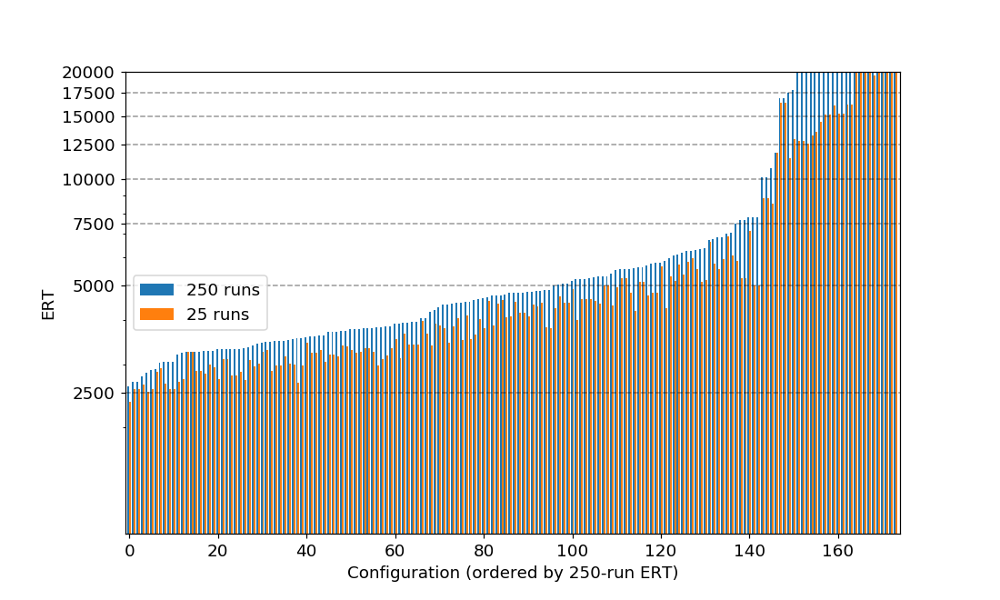

In [278]:
plt.figure(figsize=(10,6))
order = np.argsort(opt_vals)
plt.bar([i-0.2 for i in range(len(opt_vals))], np.sort(opt_vals), width=0.4, label="250 runs")
plt.bar([i+0.2 for i in range(len(opt_vals))], [best_erts[confs_tot[i]] for i in order], width=0.4, label="25 runs")
plt.yscale('log')
plt.ylim(1000,20000)

plt.axhline(5000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(7500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(10000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(12500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(15000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(17500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(20000,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.axhline(2500,color='k',linewidth=1,alpha=0.4,linestyle='--')
plt.yticks([2500+(2500*i) for i in range(8)],[2500+(2500*i) for i in range(8)])
plt.xlim(-1, 174)
plt.legend()
plt.ylabel("ERT")

plt.xlabel("Configuration (ordered by 250-run ERT)")
plt.savefig("Pred_vs_Ach_ERT_F12.pdf")
plt.show()

<IPython.core.display.Javascript object>


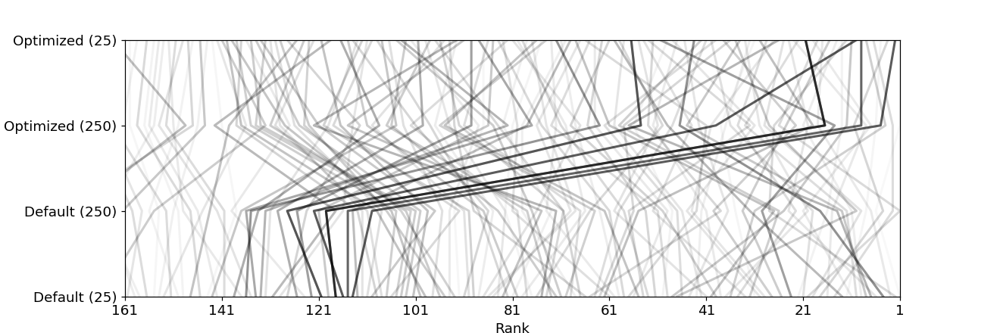

In [270]:
rank_post_250 = ss.rankdata(opt_vals)
rank_def_250 = ss.rankdata(def_vals)
rank_def_25 = ss.rankdata([default_erts[c] for c in confs_tot])
rank_post_25 = ss.rankdata([best_erts[c] for c in confs_tot])

plt.figure(figsize=(12,4))
for [i,j,k,l] in zip(rank_def_25, rank_def_250, rank_post_250, rank_post_25):
    plt.plot((i,j,k,l),range(4),linewidth=2,color='k', alpha=min(1,abs(min(j,k,i,l)-max(j,k,i,l))/len(rank_post_250)))
plt.xlim(len(rank_post_250), -1)
plt.xlabel("Rank")
plt.yticks([0,1,2,3],["Default (25)","Default (250)","Optimized (250)","Optimized (25)"])
plt.ylim(0,3)
# for tick in plt.xticks():
#     tick.rotate(20)
plt.xticks([i*20+1 for i in range(9)])
# plt.title("Ranking before and after optimization")
# kendall_rank_coeff(opt_vals, def_vals)
plt.savefig("F12_rank_rotated_var3.pdf")

In [268]:
ss.kendalltau(rank_def_25,rank_def_250)

KendalltauResult(correlation=0.8954261881668477, pvalue=1.6213267504645356e-68)

We can then calculate the kendall correlation, as well as the correlation if we sample randomly from normal distributions with the same mean and variance. This should indicate how much of the difference can be explained by the inherent randomness

In [263]:
tot = np.zeros((1000,))
for j in range(1000):
    erts = []
    for i in range(len(confs_tot)):
        samples = np.random.normal(def_vals[i], def_var[i],(25,))
        samples[samples < 0 ] = 0
        samples[samples > 50000] = 50000
        erts.append( np.sum(samples) / (25 - np.sum(samples == 50000)) )
    tot[j] = kendall_rank_coeff(erts, def_vals)
np.mean(tot)

0.7867782123714326

In [519]:
kendall_rank_coeff(opt_vals, def_vals)

0.7053351936748389

We see that large parts of the difference could be explained by randomness, but not everything. In the Appendix, this is explored in more detail to show why these large changes in ranking happen for some configurations.

<IPython.core.display.Javascript object>


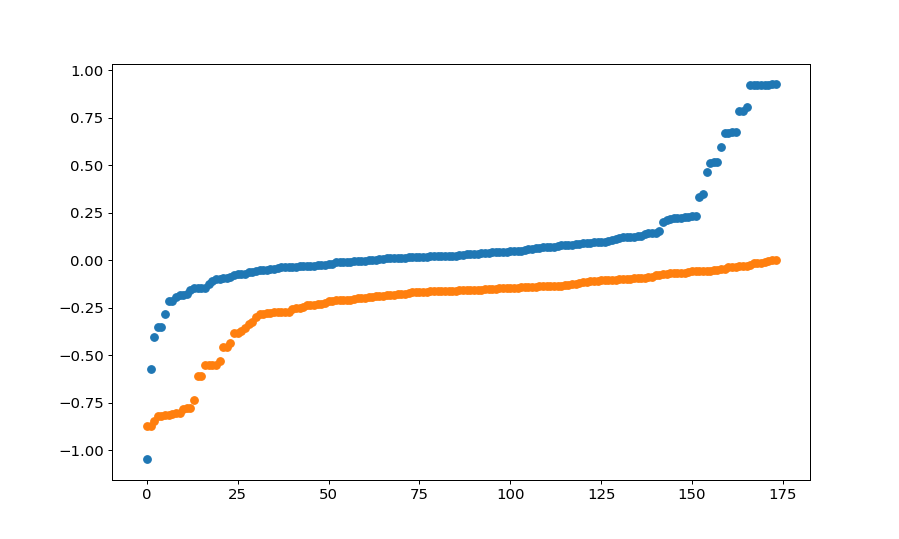

In [24]:
plt.figure(figsize=(10,6))
plt.scatter(range(len(def_vals)),np.sort(([1-def_vals[i]/default_erts[confs_tot[i]] for i in range(len(def_vals))])))
plt.scatter(range(len(def_vals)),np.sort(([1-opt_vals[i]/best_erts[confs_tot[i]] for i in range(len(def_vals))])))

In [53]:
np.median([1-opt_vals[i]/def_vals[i] for i in order])

0.11783230628641272

Unfortunately, we do not manage to achieve the improvement we expected to get when running the 250 configurations. We end up only getting ~6% improvement over the default hyperparameters. We will now do some small experiments to explain why this might have occurred.

In [187]:
np.mean([1-opt_vals[i]/best_erts[confs_tot[i]] for i in order])

-0.15358133797664406

In [154]:
np.mean([1-def_vals[i]/default_erts[confs_tot[i]] for i in order])

0.01580098409821096

As we can see from these two numbers, the mean ERT as determined in 25 runs is very similar to the ERT in 250 runs when using the default hyperparameters. However, when using the optimized hyperparameters, the 250 run ERT is ~15% worse. 
This might be caused by the following:
- When selecting the hyperparameters, we have many values which have similar 'real' performance. 
- Every time we sample one of the 'good' parameter values, we get 25 random samples from some distribution with as mean the 'real' AHT and some variance.
- If we assume we sample these 'good' configurations 5% of the time, we end up with ~10 of these random samples, of which we choose the one with the best mean

To determine if this process might explain the drop in performance, we perform a small-scale simulation:

In [189]:
max_impr = []
for x in data_full:
    temp = []
    for j in range(100):
        fake_imprs = []
        for i in range(10):
            fake_imprs.append(1-np.mean(x)/np.mean(np.random.choice(x,(25,))))
        temp.append(min(fake_imprs))
    max_impr.append(np.mean(temp))
np.mean(max_impr)

-0.19087150171504955

The above seems to confirm our claim. However, it does not take into account the differences between instances, so we modify it slightly:

In [60]:
max_impr = []
for x in data_full:
    temp = []
    for j in range(100):
        p1 = x[:50]
        p2 = x[50:100]
        p3 = x[100:150]
        p4 = x[150:200]
        p5 = x[200:250]
        fake_imprs = []
        for i in range(10):
            temp_vals = []
            temp_vals.append(np.random.choice(p1,(5,)))
            temp_vals.append(np.random.choice(p2,(5,)))
            temp_vals.append(np.random.choice(p3,(5,)))
            temp_vals.append(np.random.choice(p4,(5,)))
            temp_vals.append(np.random.choice(p5,(5,)))
            fake_imprs.append(1-np.mean(x)/np.mean(temp_vals))
        temp.append(min(fake_imprs))
    max_impr.append(np.mean(temp))
np.mean(max_impr)

-0.14995066497510884

This matches the observed differences quite closely, so it might indeed be the case that the variance is the major reason for poorer performance of the 'optimized' hyperparameters

### Optimizing for splitpoint 

When collecting the data of the 250 run, we also record the hitting times of $10^{-2}$, which is often chosen as splitpoint for F12.

<IPython.core.display.Javascript object>


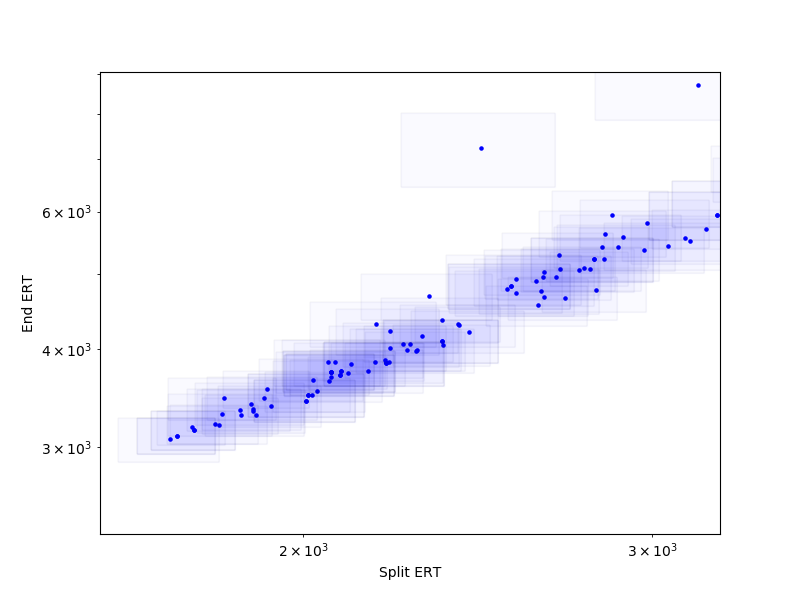

In [196]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111)
order = np.argsort(def_vals)
for i in order:
    vals_end = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{confs_tot[i]}_default.csv", header = None)).flatten()
    vals_split = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{confs_tot[i]}_default_split.csv", header = None)).flatten()
    s = (np.mean(vals_split), np.std(vals_split)/np.sqrt(250))
    e = (np.mean(vals_end), np.std(vals_end)/np.sqrt(250))
#     plt.plot([0,1],[s[0],e[0]],color = colors[i%5])
#     plt.fill_between([0,1],[s[0]-2*s[1],e[0]-2*e[1]],[s[0]+2*s[1],e[0]+2*e[1]], alpha=0.1,color = colors[i%5])
    ax.scatter(s[0],e[0],c='b', s=5)
    width = 2*2*s[1]
    height = 2*2*e[1]
    a_x = s[0]
    a_y = e[0]
    ax.add_patch(Rectangle(xy=(a_x-width/2, a_y-height/2) ,width=width, height=height, linewidth=1, color='blue', fill=True, alpha=0.02))
    ax.add_patch(Rectangle(xy=(a_x-width/2, a_y-height/2) ,width=width, height=height, linewidth=0.05, color='k', fill=False, alpha=0.5))
ax.set_xlabel("Split ERT")
ax.set_ylabel("End ERT")
ax.set_yscale('log')
ax.set_xscale('log')

From this figure, we can see that the split-ERT and final ERT are more-or-less linearly related. 

<IPython.core.display.Javascript object>


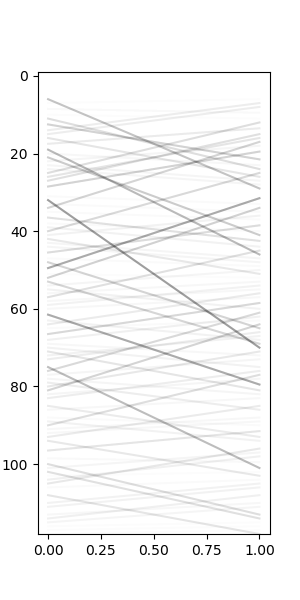

In [198]:
plt.figure(figsize=(3,6))
rank_split = ss.rankdata(opt_vals_split)
rank_end = ss.rankdata(opt_vals)

for [i,j] in zip(rank_split, rank_end):
    plt.plot(range(2), (i, j), color = 'k', alpha = abs(i-j)/100)
plt.ylim(len(rank_end), -1)
plt.show()

In [199]:
kendall_rank_coeff(opt_vals_split, opt_vals)

0.9390120237577865

The ranking confirms that the configurations which perform well at the splitpoint are also those which perform well overall. 

#### Optional figure showing individual runs

<IPython.core.display.Javascript object>


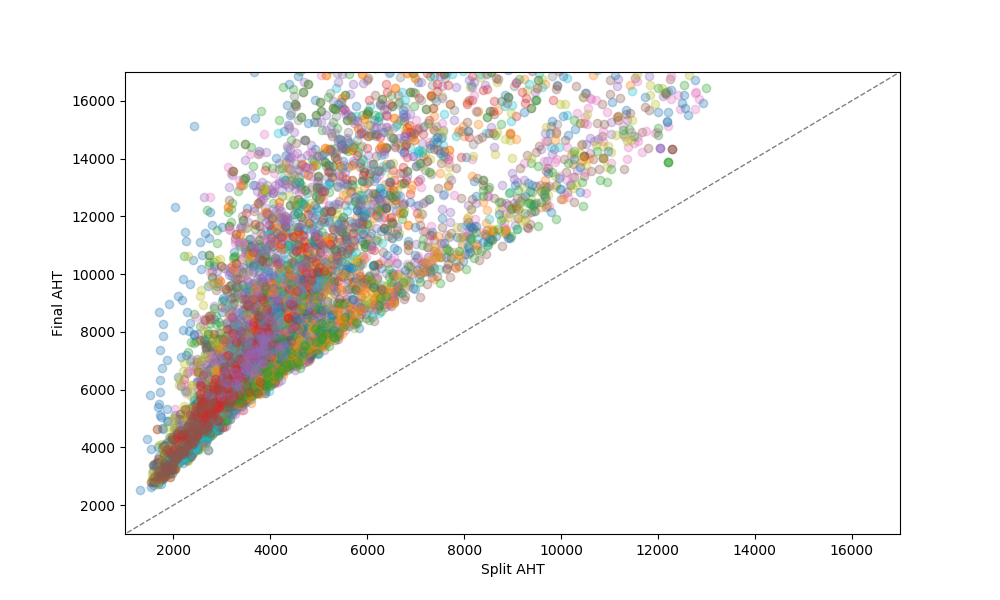

In [202]:
data3 = {}
split_erts = np.zeros((56,))
end_erts = np.zeros((56, ))
i = 0
for c in confs3:
    data3[c] = {}
    data3[c]["params"] = pd.read_csv(f"{Data_loc}Statics_F12/F12_st_{c}", index_col=0)
    data3[c]["split"] = pd.read_csv(f"{Data_loc}Statics_F12/F12_rep{c}_split.csv", header=None)
    data3[c]["end"] = pd.read_csv(f"{Data_loc}Statics_F12/F12_rep{c}.csv", header=None)
    split_erts[i] = np.min(np.mean(np.array(data3[c]["split"]),axis=1))
    end_erts[i] = np.min(np.mean(np.array(data3[c]["end"]),axis=1))
    i += 1
    
plt.figure(figsize=(10,6))
for c in confs3:
#     c = confs3[51]
    temp = data3[c]
    aht_split_t = np.mean(np.array(temp["split"]), axis=1)
    aht_end_t = np.mean(np.array(temp["end"]), axis=1)
    plt.scatter(aht_split_t, aht_end_t, alpha=0.3)
# plt.xscale('log')
# plt.yscale('log')
plt.ylim(1000,17000)
plt.xlim(1000,17000)
plt.xlabel("Split AHT")
plt.ylabel("Final AHT")
plt.plot([0,25000],[0,25000], color='k', ls = '--', lw='1', alpha=0.5)
plt.show()

### Similarities in parameter values

Next to the pure performance, we are also interested in the patterns present in the hyperparameter values. To do this, we first take a look at the distribution of ERTs among the parameter space of a single configuration.

<IPython.core.display.Javascript object>


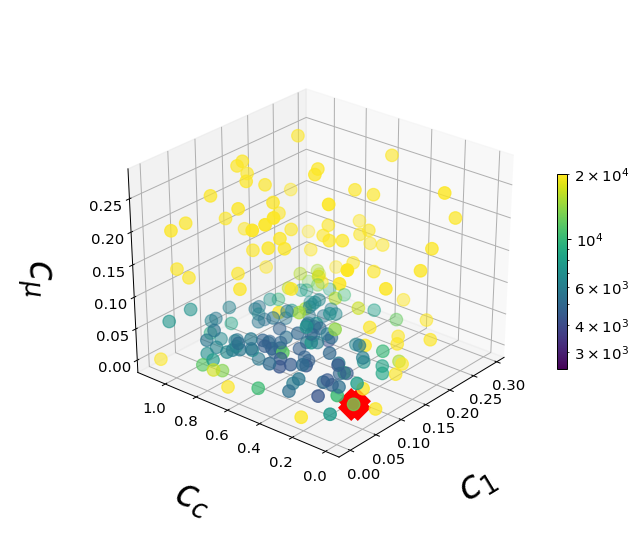

In [130]:
idx_nr = 10
data_single = np.array(data[confs2[idx_nr]]).T
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(data_single[0], data_single[1], data_single[2], c=data_single[-1],cmap='viridis', vmin=2500, vmax=20000, s=100, norm=colors.LogNorm(vmin=2500, vmax=20000))
ax.scatter(data_single[0][19], data_single[1][19], data_single[2][19], color='r', s=250, marker='x', lw=15)
ax.set_xlabel("\n$c_1$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_ylabel("\n$c_c$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_zlabel("\n$c_{\mu}$", fontsize=30, rotation = 0, linespacing=3.2)
ax.view_init(30, 220)
fig.colorbar(p, label="ERT", fraction=0.02, pad=0.01)
# plt.title(f"F12 (config {confs2[idx_nr]}): Distribution of ERT-values during hyperparameter optimization")
plt.show()
plt.savefig("F12_3D_param_1.pdf")

From this figure, we see that for parameter values near the edges of the parameter space, the ERTs are quite high. This supports our earlier conclusion of not having a too large parameter space, but restricting to $default*2+0.1$.

We also see that there are quite a few parameter setting with relatively similar ERTs, which supports our statements in section 3.2.3.


Next, we will create an aggregation over all configurations. 

<IPython.core.display.Javascript object>


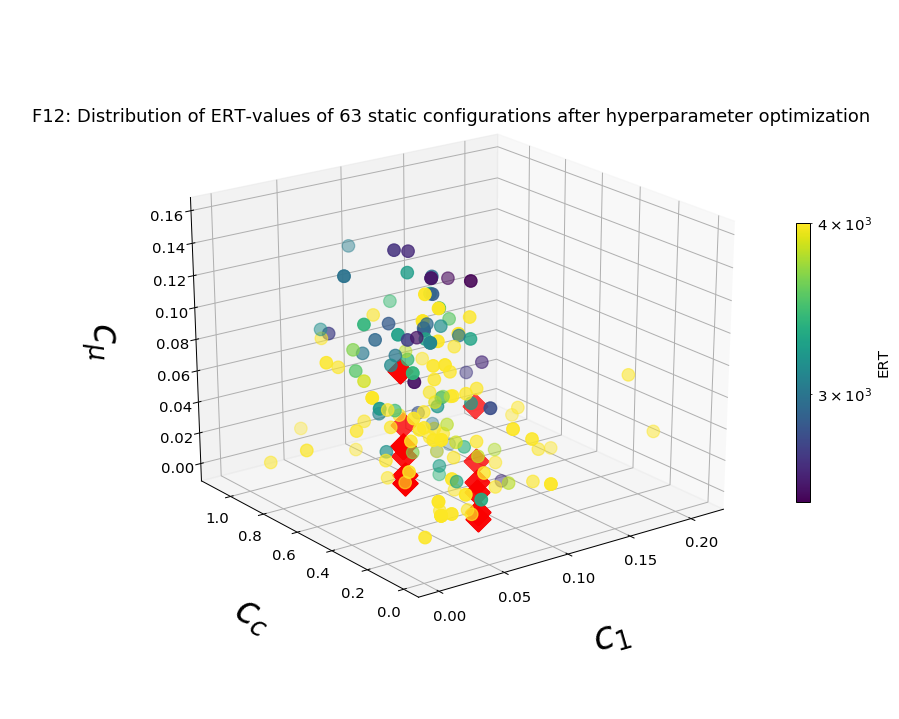

In [133]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter([best_params[c][0] for c in confs_tot], [best_params[c][1] for c in confs_tot], [best_params[c][2] for c in confs_tot], c=[best_erts[c] for c in confs_tot], cmap='viridis', vmin=2500, vmax=4000, s=100, norm=colors.LogNorm(vmin=2500, vmax=20000))
for c in confs_tot:
    data_single = np.array(data[c]).T
    ax.scatter(data_single[0][19], data_single[1][19], data_single[2][19], c='r',linewidth=15,s=100,marker='x',alpha=0.2)

ax.set_xlabel("\n$c_1$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_ylabel("\n$c_c$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_zlabel("\n$c_{\mu}$", fontsize=30, rotation = 0, linespacing=3.2)
fig.colorbar(p, label="ERT", fraction=0.02, pad=0.01)
plt.title(f"F12: Distribution of ERT-values of 63 static configurations after hyperparameter optimization")
plt.show()

From this figure, we can see that the best parameter values are quite spread out over the parameter space. We will try to use a different method to visualize the common parameter setting which perform well for most configurations, and compare this to the default parameter values. 

To visualize this, we do the following:
- Create an array of points evenly split among the parameter space.
- For each point and each configuration, add the mean value of its 3 nearest-neighbors
- Divide this by the number of configuration to get an average nearest-neighbor value among all configurations

In [31]:
centerpoints = []

for i in range(41):
    for j in range(41): 
        for k in range(41):
            centerpoints.append((i/40*0.3,j/40*1.2,k/40*0.3))

In [34]:
from sklearn.neighbors import NearestNeighbors
res = np.zeros((len(centerpoints)))

best_50 = [confs_tot[x] for x in np.argsort([best_erts[c] for c in confs_tot])[:50]]

for conf in best_50:
    dt = data[conf]
    nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(np.array(dt[['c_1','c_c','c_mu']]))
    distances, indices = nbrs.kneighbors(centerpoints)
    for i in range(len(indices)):
        res[i] += np.mean(np.array(dt['fitness'])[indices[i]])
         
res = res/len(best_50)

In [47]:
from mpl_toolkits.axes_grid1 import make_axes_locatable


<IPython.core.display.Javascript object>


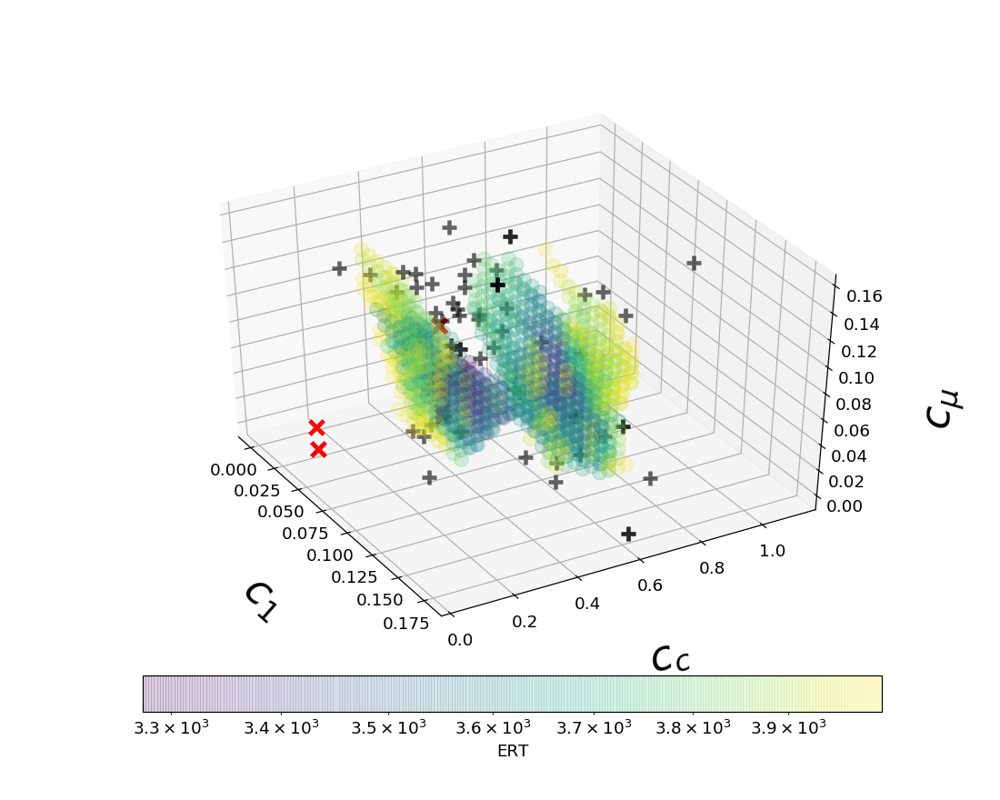

In [54]:
good_idx = res.flatten() < 4000
np.sum(good_idx)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
xs = np.array(centerpoints).T[0][good_idx]
ys = np.array(centerpoints).T[1][good_idx]
zs = np.array(centerpoints).T[2][good_idx]
cs = res.flatten()[good_idx]
# rgba_colors = np.zeros((np.sum(good_idx),4))
# rgba_colors[:,0] = 1.0
# rgba_colors[:, 3] = 1-(cs-np.min(cs))/(np.max(cs)-np.min(cs))


# p = ax.scatter(xs, ys, zs, color=rgba_colors)

p = ax.scatter(xs, ys, zs, c=cs, cmap='viridis', vmin=np.min(cs), vmax=np.max(cs), s=100, norm=colors.LogNorm(vmin=np.min(cs), vmax=np.max(cs)), alpha=0.2)

ax.set_xlabel("\n$c_1$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_ylabel("\n$c_c$", fontsize=30, rotation = 0, linespacing=3.2)
ax.set_zlabel("\n$c_{\mu}$", fontsize=30, rotation = 0, linespacing=3.2)
fig.colorbar(p, label="ERT", fraction=0.06, pad=0.06, orientation="horizontal")
for conf in confs2:
    ax.scatter([data[conf]['c_1'][19]], [data[conf]['c_c'][19]], [data[conf]['c_mu'][19]], c='r',linewidth=3,s=100,marker='x',alpha=0.8)

    argbest = np.argmin(data[conf]['fitness'])
    ax.scatter([data[conf]['c_1'][argbest]], [data[conf]['c_c'][argbest]], [data[conf]['c_mu'][argbest]], c='k',linewidth=3,s=100,marker='+',alpha=0.6)
ax.view_init(40, 330)

# plt.title(f"F12 comparison of default, best and average ERT values")
plt.show()
plt.savefig("F12_param_common_var2.pdf")

From this figure, we can see that for most configurations, the default hyperparameter values lie within a zone of good hyperparameter values. However, the best hyperparameter values for each individual configuration often lie outside of this area. 

### Combined Module Activations


Since we have a set of 176 configurations, we can investigate the differences in the top configurations, to determine if a module becomes much better or worse after the hyperparameter tuning. This can be visualized in the combined module activation plots below.

<IPython.core.display.Javascript object>


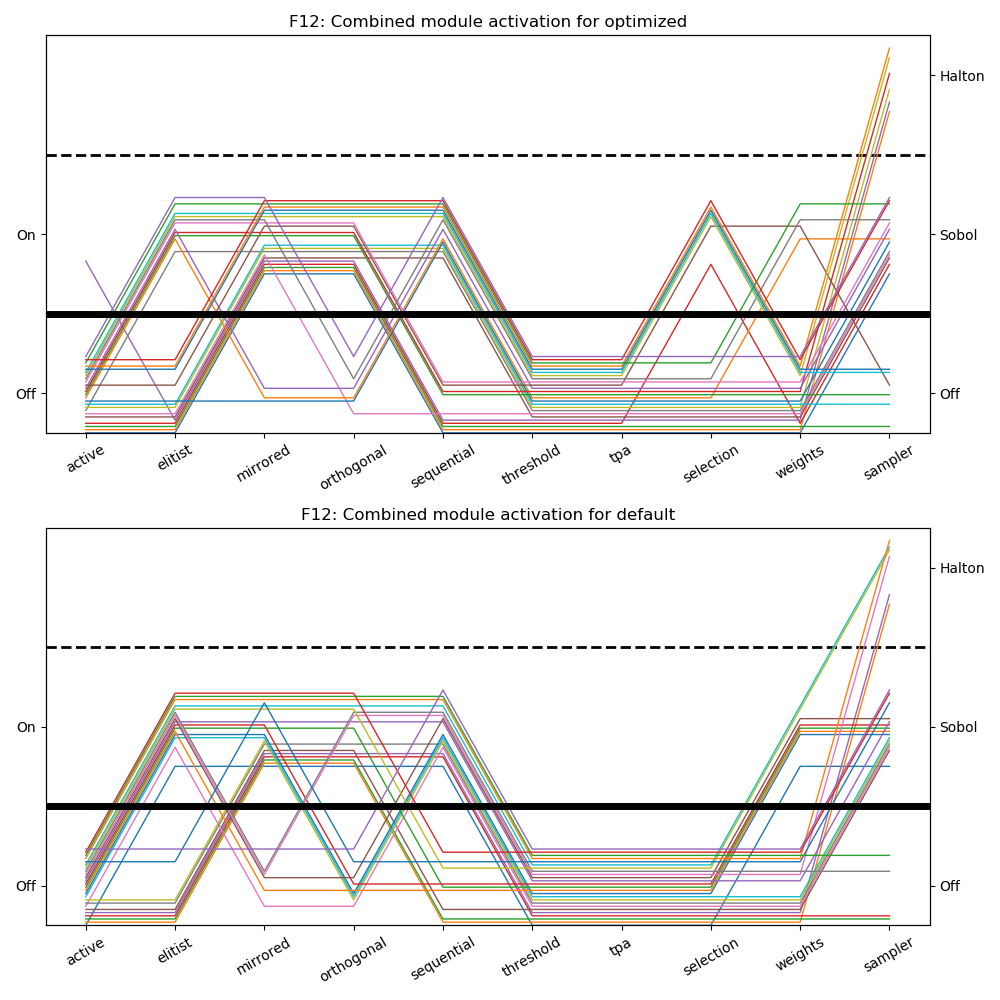

In [244]:
sortedargs = np.argsort(opt_vals)[:25]
sortedargs_def = np.argsort(def_vals)[:25]
configs = [confs_tot[i] for i in sortedargs]
configs_def = [confs_tot[i] for i in sortedargs_def]

colors = ['r','g','b']


# fig, ax = plt.subplots(1,1,figsize=(10,6))
# ax.set_title(f"F12: Combined module activation for best after optimization")
# ax.set_xticks(range(10))
# ax.set_xticklabels(conf_names[:10])
# ax.set_yticks([0.5,2.5])
# ax.set_yticklabels(["Off","On"])

# for i in range(len(sortedargs)):
#     ax.plot([2*j +i/118 for j in intToRepr(int(configs[i]))[:10]],alpha=1,lw=1)

# ax.axhline(1.5,color='k',lw=5)

fig, ax = plt.subplots(2,1,figsize=(10,10))
ax[0].set_title(f"F12: Combined module activation for optimized")
ax[0].set_xticks(range(10))
ax[0].set_xticklabels(conf_names[:10])
ax[0].set_yticks([0.5,2.5])
ax[0].set_yticklabels(["Off","On"])
ax[0].axhline(3.5,color='k',lw=2,ls='--')
axy = ax[0].twinx()
axy.set_ylim(0,5)
ax[0].set_ylim(0,5)
axy.set_yticks([0.5,2.5,4.5])
axy.set_yticklabels(["Off","Sobol","Halton"])
for tick in ax[0].get_xticklabels():
    tick.set_rotation(30)
ax[1].set_title(f"F12: Combined module activation for default")
ax[1].set_xticks(range(10))
ax[1].set_xticklabels(conf_names[:10])
ax[1].set_yticks([0.5,2.5])
ax[1].set_yticklabels(["Off","On"])
axy1 = ax[1].twinx()
axy1.set_ylim(0,5)
ax[1].set_ylim(0,5)
axy1.set_yticks([0.5,2.5,4.5])
axy1.set_yticklabels(["Off","Sobol","Halton"])
ax[1].axhline(3.5,color='k',lw=2,ls='--')

for tick in ax[1].get_xticklabels():
    tick.set_rotation(30)

#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")
for i in range(len(sortedargs)):
    ax[0].plot([2*j +i/25 for j in intToRepr(int(configs[i]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")

for i in range(len(sortedargs_def)):
    ax[1].plot([2*j +i/25 for j in intToRepr(int(configs_def[i]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
ax[1].axhline(1.5,color='k',lw=5)
ax[0].axhline(1.5,color='k',lw=5)

plt.tight_layout()


### Additional Exploratory Experiments

The following experiments were not used, and only left in this notebook for completeness. Because of this, they are not documented. 

In summary, these experiments tried to look at the following questions:
- How many runs are needed to get a representative sample?
- How much improvement can we gain from only hyperparameter optimization? How does this compare to adaptive configurations?
- How can we analyze the samples we have to get a more statistically sound idea of the ranking?
- Are there clear relations between the modules and the optimal hyperparameter settings?

#### How much improvement?

In [319]:
1-min([best_erts[x] for x in confs_full])/min([default_erts[x] for x in confs_full])

0.2249105827898169

In [322]:
1-min(opt_vals)/min(def_vals)

0.15238848296713536

In [343]:
df12 = pd.read_csv(f"{Data_loc}Static_orig/interpolated_ART_data_5D-f12.csv", index_col=0)

In [348]:
pred_std = np.std(np.array(df12['10e-8.0'])[25*2019:25*2020])
pred_val_full = np.array(df12['10e-8.0'])[25*2019:25*2020]

<IPython.core.display.Javascript object>


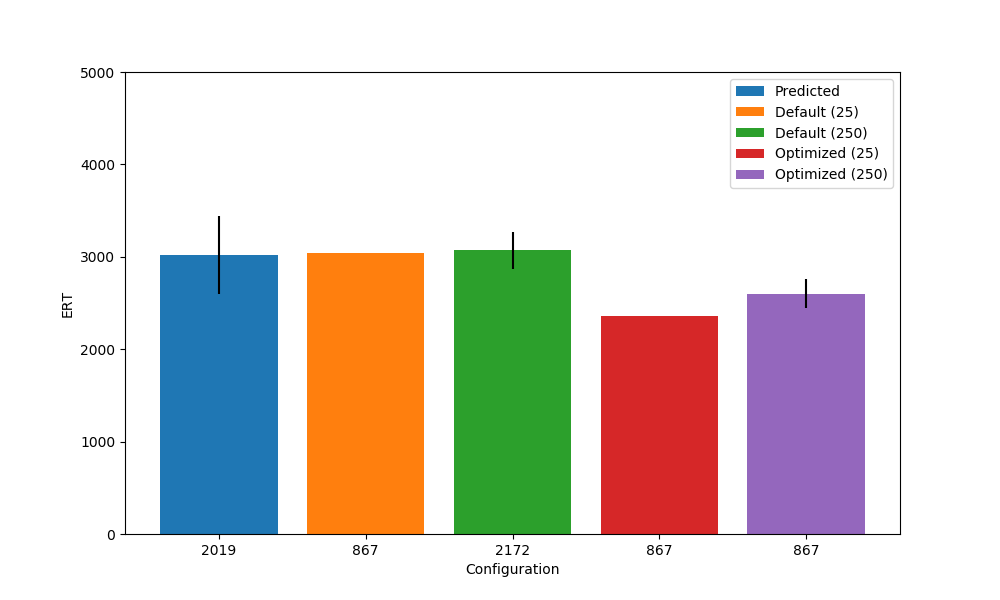

Text(0, 0.5, 'ERT')

In [370]:
plt.figure(figsize=(10,6))
plt.bar(0,[np.nanmin([pred_ert[x] for x in confs_full])],label="Predicted", yerr = pred_std*2/5)
plt.bar(1,[np.nanmin([default_erts[x] for x in confs_full])],label="Default (25)")
plt.bar(2,[min(def_vals)],label="Default (250)", yerr = def_var[np.argmin(def_vals)]*2/np.sqrt(250))
plt.bar(3,[np.nanmin([best_erts[x] for x in confs_full])],label="Optimized (25)")
plt.bar(4,[min(opt_vals)],label="Optimized (250)", yerr = opt_var[np.argmin(opt_vals)]*2/np.sqrt(250))
plt.xticks(range(5),[confs_full[np.nanargmin([pred_ert[x] for x in confs_full])], confs_full[np.nanargmin([default_erts[x] for x in confs_full])], confs_tot[np.nanargmin([def_vals])], confs_full[np.nanargmin([best_erts[x] for x in confs_full])], confs_tot[np.nanargmin([opt_vals])]])
plt.legend()
plt.ylim(0,5000)
plt.xlabel("Configuration")
plt.ylabel("ERT")

In [360]:
reprToInt([0,0,1,1,0,0,0,0,0,1,0])

867

In [380]:
def_vals[np.argmax([x == 867 for x in confs_tot])], opt_vals[np.argmax([x == 867 for x in confs_tot])], confs_tot[np.argmax([x == 867 for x in confs_tot])], def_var[np.argmax([x == 867 for x in confs_tot])]

(3183.008, 2602.72, 867, 1259.7706616428245)

In [381]:
def_var[np.argmax([x == 867 for x in confs_tot])]*2/np.sqrt(250)

159.3497848099457

Some observations: 
- improvement seems to be statistically significant in the 250-run case. 
- Inconsistency between previous 250 run (ERT of 3463) and current with default parameters (ERT of 3183)?
- Reduction in improvement for optimized configurations might be consistent for all configurations?

#### How many runs?

<IPython.core.display.Javascript object>


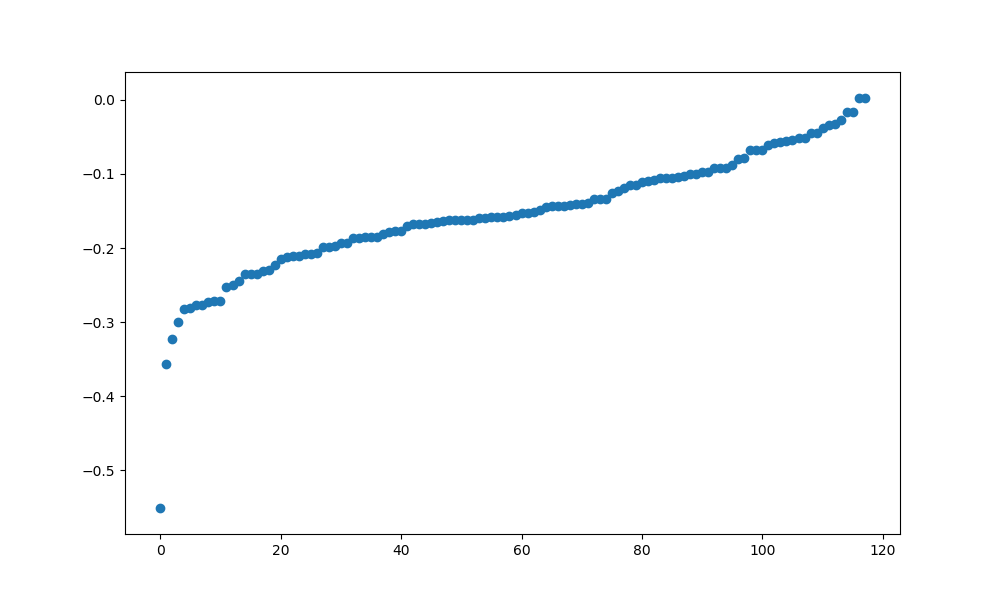

In [430]:
real_impr = []
for i in range(len(confs_tot)):
    c = confs_tot[i]
    ert1 = best_erts[c]
    ert2 = opt_vals[i]
    real_impr.append(1-ert2/ert1)
plt.figure(figsize=(10,6))
plt.scatter(range(len(confs_tot)),np.sort(real_impr))

<IPython.core.display.Javascript object>


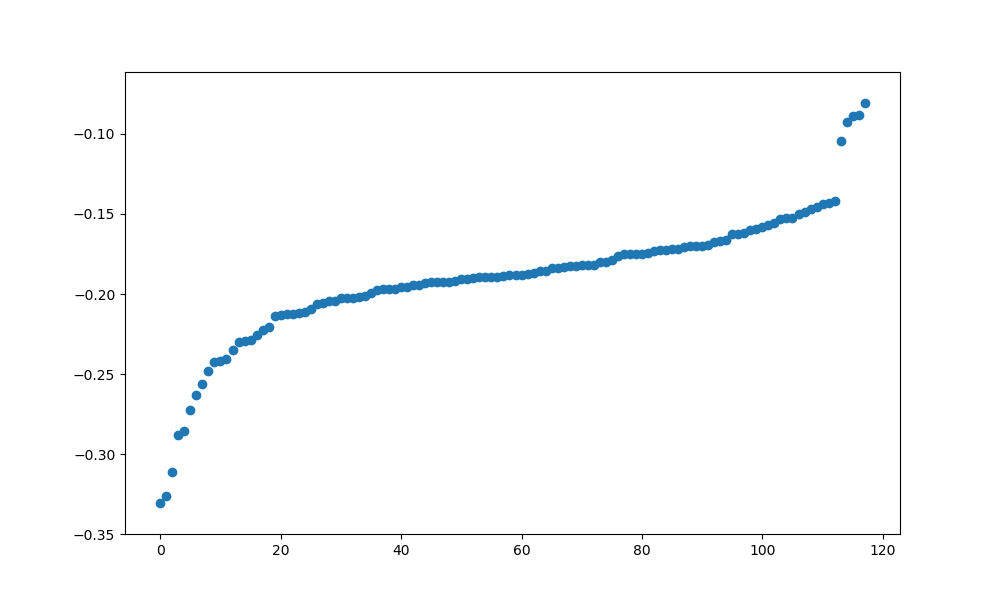

In [428]:
max_impr = []
for x in data_full:
    temp = []
    for j in range(100):
        fake_imprs = []
        for i in range(10):
            fake_imprs.append(1-np.mean(x)/np.mean(np.random.choice(x,(25,))))
        temp.append(min(fake_imprs))
    max_impr.append(np.mean(temp))
plt.figure(figsize=(10,6))
plt.scatter(range(len(max_impr)),np.sort(max_impr))

In [ ]:
nrs_good = []
for c in confs_tot:
    vals = data[c]['fitness']
    nrs_good.append(np.sum(vals < min(vals)*1.1))
nrs_good

In [395]:
len(nrs_good)

118

<IPython.core.display.Javascript object>


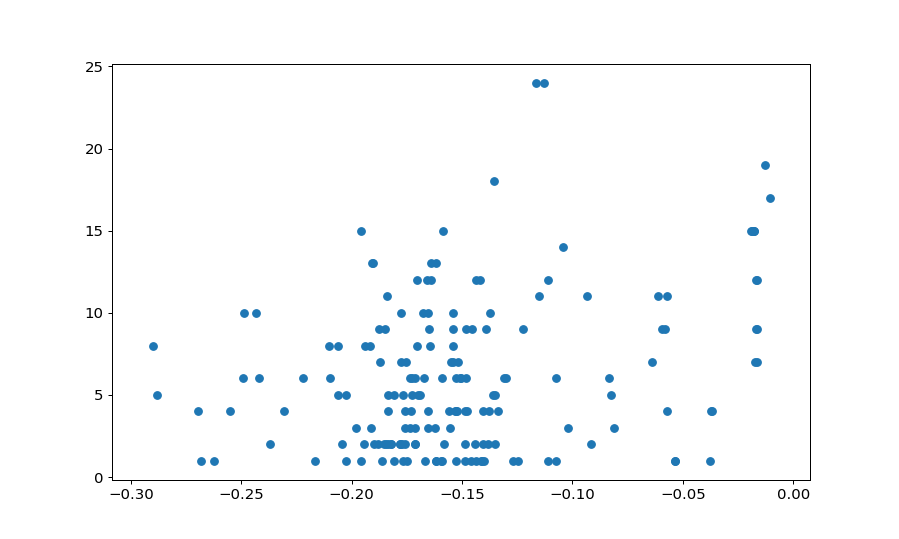

In [61]:
plt.figure(figsize=(10,6))
plt.scatter(max_impr, nrs_good)

In [407]:
impr_per_sample = []
for k in range(1,50):
    max_impr = []
    for x in data_full:
        temp = []
        for j in range(100):
            p1 = x[:50]
            p2 = x[50:100]
            p3 = x[100:150]
            p4 = x[150:200]
            p5 = x[200:250]
            fake_imprs = []
            for i in range(10):
                temp_vals = []
                temp_vals.append(np.random.choice(p1,(k,)))
                temp_vals.append(np.random.choice(p2,(k,)))
                temp_vals.append(np.random.choice(p3,(k,)))
                temp_vals.append(np.random.choice(p4,(k,)))
                temp_vals.append(np.random.choice(p5,(k,)))
                fake_imprs.append(1-np.mean(x)/np.mean(temp_vals))
            temp.append(min(fake_imprs))
        max_impr.append(np.mean(temp))
    impr_per_sample.append(np.mean(max_impr))

<IPython.core.display.Javascript object>


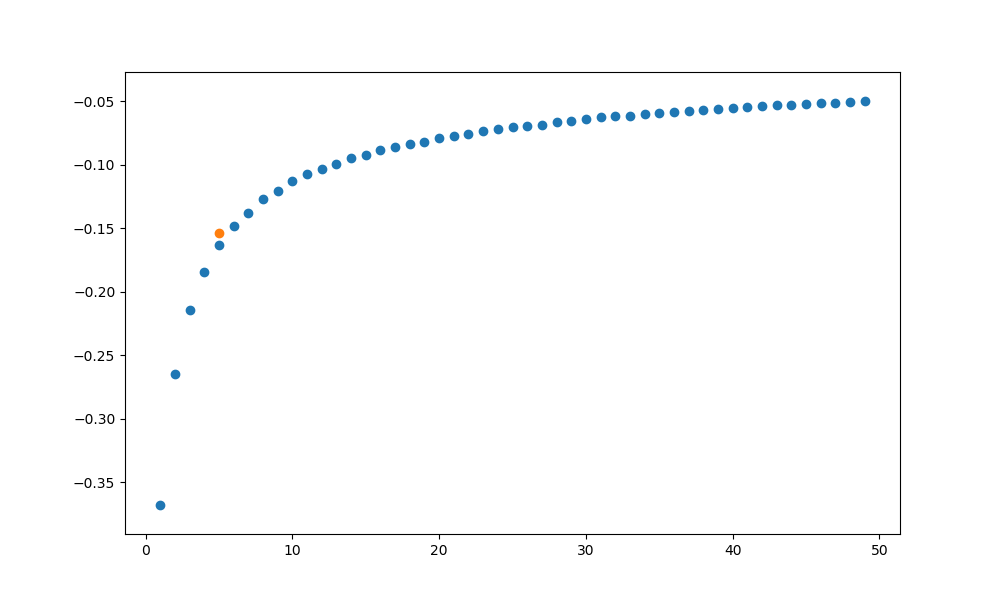

In [432]:
plt.figure(figsize=(10,6))
plt.scatter(range(1,50), impr_per_sample)
plt.scatter(5, np.mean(real_impr))

In [ ]:
impr_per_sample = []
for k in range(1,50):
    max_impr = []
    for x in data_full:
        temp = []
        for j in range(100):
            p1 = x[:50]
            p2 = x[50:100]
            p3 = x[100:150]
            p4 = x[150:200]
            p5 = x[200:250]
            fake_imprs = []
            for i in range(10):
                temp_vals = []
                temp_vals.append(np.random.choice(p1,(k,)))
                temp_vals.append(np.random.choice(p2,(k,)))
                temp_vals.append(np.random.choice(p3,(k,)))
                temp_vals.append(np.random.choice(p4,(k,)))
                temp_vals.append(np.random.choice(p5,(k,)))
                fake_imprs.append(1-np.mean(x)/np.mean(temp_vals))
            temp.append(min(fake_imprs))
        max_impr.append(np.mean(temp))
    impr_per_sample.append(np.mean(max_impr))

In [421]:
kendall_coeffs = []
for k in range(1,50):
    temp = []
    for rep in range(100):
        fake_erts = []
        for x in data_full:
            p1 = x[:50]
            p2 = x[50:100]
            p3 = x[100:150]
            p4 = x[150:200]
            p5 = x[200:250]
            fake_imprs = []
            temp_vals = []
            temp_vals.append(np.random.choice(p1,(k,)))
            temp_vals.append(np.random.choice(p2,(k,)))
            temp_vals.append(np.random.choice(p3,(k,)))
            temp_vals.append(np.random.choice(p4,(k,)))
            temp_vals.append(np.random.choice(p5,(k,)))
            fake_erts.append(np.mean(temp_vals))
        temp.append(kendall_rank_coeff(fake_erts, opt_vals))
    kendall_coeffs.append(np.mean(temp))

In [424]:
kendall_rank_coeff(def_vals, opt_vals)

0.7149065623641895

<IPython.core.display.Javascript object>


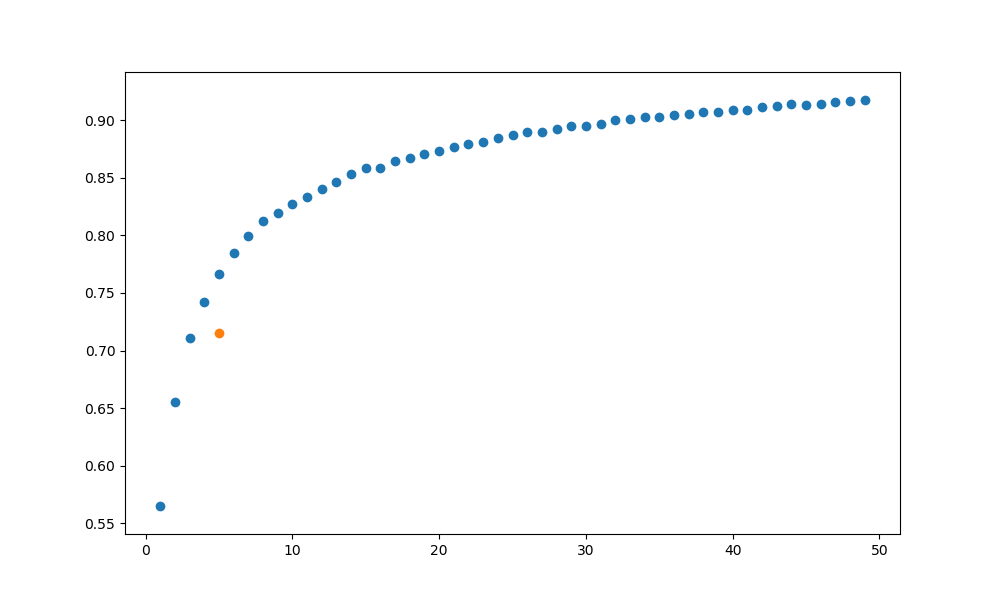

In [427]:
plt.figure(figsize=(10,6))
plt.scatter(range(1,50),kendall_coeffs)
plt.scatter(5, kendall_rank_coeff(def_vals, opt_vals))

#### Statistical analysis

<IPython.core.display.Javascript object>


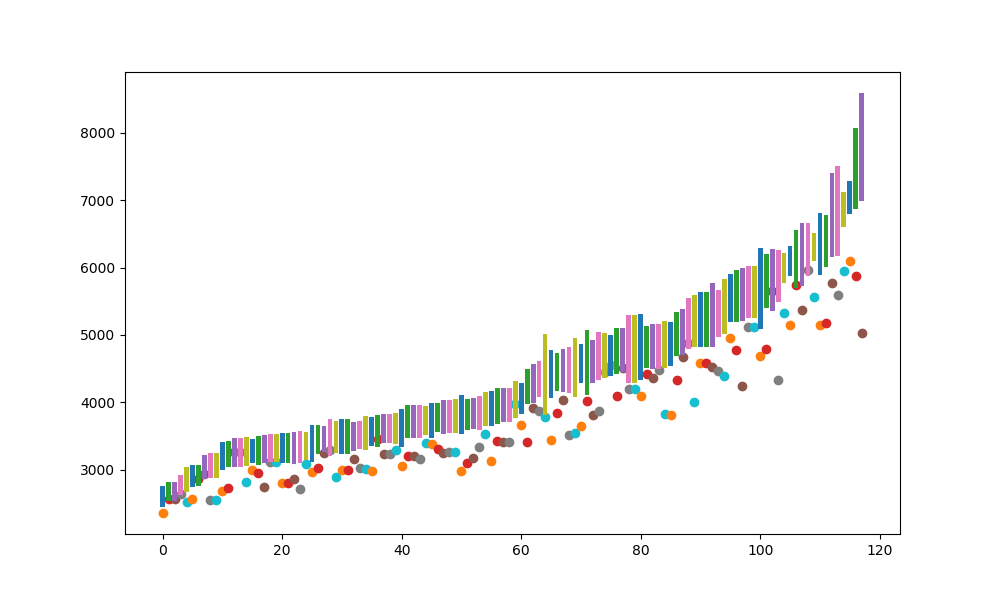

0.8559322033898306

In [470]:
order = np.argsort(opt_vals)
plt.figure(figsize=(10,6))
nrs_real = []
for j in range(len(confs_tot)):
    i = order[j]
    c = confs_tot[i]
    ert_25_opt = best_erts[c]
    ert_25_def = default_erts[c]
    ert_250_opt = opt_vals[i]
    ert_250_def = def_vals[i]
    lower_opt = ert_250_opt - 2*opt_var[i]/np.sqrt(250)
    lower_def = ert_250_def - 2*def_var[i]/np.sqrt(250)
    upper_opt = ert_250_opt + 2*opt_var[i]/np.sqrt(250)
    upper_def = ert_250_def + 2*def_var[i]/np.sqrt(250)
    nrs_real.append(ert_25_opt < lower_opt)
#     print(ert_25_def < upper_def and ert_25_def > lower_def)
#     plt.bar(j, bottom = lower_def, height = upper_def-lower_def)
#     plt.scatter(j, ert_25_def)
    plt.bar(j, bottom = lower_opt, height = upper_opt-lower_opt)
    plt.scatter(j, ert_25_opt)
np.mean(nrs_real)

In [468]:
k = 5
nrs = []
for i in range(len(data_full)):
    x = data_full[i]
    p1 = x[:50]
    p2 = x[50:100]
    p3 = x[100:150]
    p4 = x[150:200]
    p5 = x[200:250]
    fake_imprs = []
    fake_erts = []
    for rep in range(100):
        fake_erts2 = []
        for j in range(5):
            temp_vals = []
            temp_vals.append(np.random.choice(p1,(k,)))
            temp_vals.append(np.random.choice(p2,(k,)))
            temp_vals.append(np.random.choice(p3,(k,)))
            temp_vals.append(np.random.choice(p4,(k,)))
            temp_vals.append(np.random.choice(p5,(k,)))
            fake_erts2.append(np.mean(temp_vals))
        fake_erts.append(np.min(fake_erts2))
    lower = opt_vals[i] - 2*opt_var[i]/np.sqrt(250)
    nrs.append(np.sum(fake_erts < lower))
np.mean(nrs)

77.08474576271186

In [471]:
impr_per_sample = []
for k in range(1,50):
    max_impr = []
    for x in data_full:
        temp = []
        for j in range(100):
            p1 = x[:50]
            p2 = x[50:100]
            p3 = x[100:150]
            p4 = x[150:200]
            p5 = x[200:250]
            fake_imprs = []
            for i in range(10):
                temp_vals = []
                temp_vals.append(np.random.normal(np.mean(p1), np.std(p1),(k,)))
                temp_vals.append(np.random.normal(np.mean(p2), np.std(p2),(k,)))
                temp_vals.append(np.random.normal(np.mean(p3), np.std(p3),(k,)))
                temp_vals.append(np.random.normal(np.mean(p4), np.std(p4),(k,)))
                temp_vals.append(np.random.normal(np.mean(p5), np.std(p5),(k,)))
                fake_imprs.append(1-np.mean(x)/np.mean(temp_vals))
            temp.append(min(fake_imprs))
        max_impr.append(np.mean(temp))
    impr_per_sample.append(np.mean(max_impr))

KeyboardInterrupt: 

In [473]:
len(impr_per_sample)

32

<IPython.core.display.Javascript object>


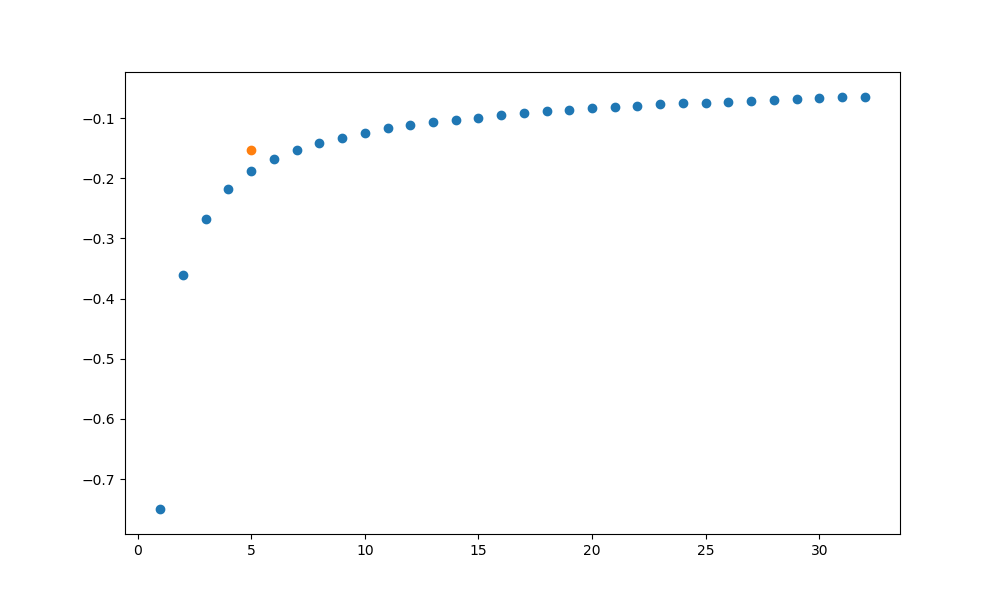

In [476]:
plt.figure(figsize=(10,6))
plt.scatter(range(1,len(impr_per_sample)+1), impr_per_sample)
plt.scatter(5, np.mean(real_impr))

#### Exploration: correlation between param values and modules

In [18]:
par[np.argmin(opt_vals)]

867

In [19]:
best_params[867]

(0.07674210949214576, 0.2877980157050455, 0.1420801768479136)

<IPython.core.display.Javascript object>


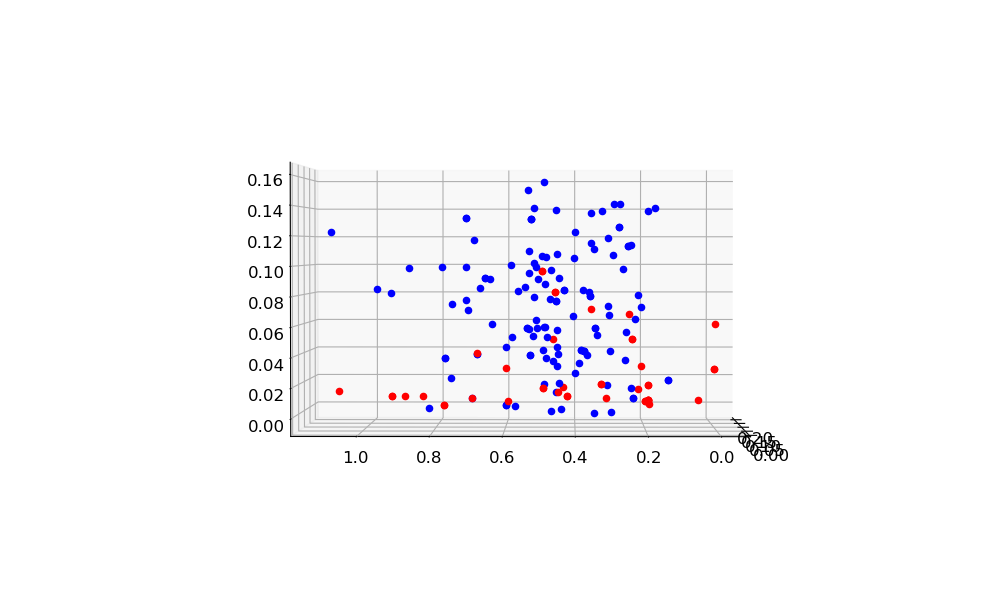

In [145]:
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')

mod_idx = 5

for c in confs_tot:
    if intToRepr(c)[mod_idx] == 0:
        ax.scatter(best_params[c][0], best_params[c][1], best_params[c][2], color='b')
    elif intToRepr(c)[mod_idx] == 1:
        ax.scatter(best_params[c][0], best_params[c][1], best_params[c][2], color='r')
    else:
        ax.scatter(best_params[c][0], best_params[c][1], best_params[c][2], color='y')
#     print(intToRepr(c), best_params[c])

In [158]:
model = RandomForestRegressor(100)
rep_vector = []
selected_idx = np.random.choice(range(len(confs_tot)), (150,), replace=False)
values = []
for i in selected_idx:
    c = confs_tot[i]
    rep = intToRepr(c)[:10]
    rep_vector.append(rep)
    values.append(best_params[c])
model.fit(rep_vector, values)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [159]:
test_set = np.setdiff1d(range(len(confs_tot)), selected_idx)
rep_vector_test = []
real_values = []
for i in test_set:
    c = confs_tot[i]
    rep = intToRepr(c)[:10]
    rep_vector_test.append(rep)
    real_values.append(best_params[c])
preds = model.predict(rep_vector_test)

In [160]:
for i in range(len(preds)):
    diff = [1-min(preds[i][j],real_values[i][j])/max(preds[i][j],real_values[i][j]) for j in range(3)]
    print(np.mean(diff))

0.26191832086171213
0.43030507608333807
0.46691095600096216
0.2754265923573121
0.1607992888061607
0.13484153478278615
0.5568162540614314
0.5020644168980603
0.25350069578870676
0.4166062880838326
0.3285458544305394
0.3179696993412714
0.28576462077503306
0.1954389592403154
0.2230840649512618
0.13663848426120062
0.10629009546187167
0.22785532932013805
0.13644326680556895
0.4835522351554484
0.11674098112056286
0.3662005491084799
0.6281410419954275
0.3985693668674532


In [186]:
c = confs_tot[0]
model = RandomForestRegressor(100)

rep_vector = []
selected_idx = np.random.choice(range(len(data[c])), (50,), replace=False)
values = []
for i in selected_idx:
    rep = [data[c]['c_1'][i],data[c]['c_c'][i],data[c]['c_mu'][i]]
    rep_vector.append(rep)
    values.append(data[c]['fitness'][i])
model.fit(rep_vector, values)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [187]:
test_set = np.setdiff1d(range(len(confs_tot)), selected_idx)
rep_vector_test = []
real_values = []
for i in test_set:
    rep = [data[c]['c_1'][i],data[c]['c_c'][i],data[c]['c_mu'][i]]
    rep_vector_test.append(rep)
    real_values.append(data[c]['fitness'][i])
preds = model.predict(rep_vector_test)

In [188]:
diffs = []
for i in range(len(preds)):
    diffs.append(1-min(preds[i],real_values[i])/max(preds[i],real_values[i]))
print(np.mean(diffs))

0.26533023319868565


In [189]:
real_values[np.argmin(preds)],np.min(real_values),np.min(preds)

(13713.6, 12761.28, 15015.810262002838)

# ML model for ERT-prediction

This section aims to create a RF-model to predict the ERT of configuration on F12 based only on the module settings. We try to both predict ERT with default hyperparameters as ERT after hyperparameter tuning.

## Initialization

In [397]:
from sklearn.ensemble import RandomForestRegressor 

## Model creation

For this initial experiment, we use the default settings of a random forest regression model. 
We will train the model on 100 (out of 174) configurations to predict the ERTs (default hyperparameters)

In [55]:
model = RandomForestRegressor(100)
rep_vector = []
selected_idx = np.random.choice(range(len(confs_tot)), (100,), replace=False)
values = []
for i in selected_idx:
    c = confs_tot[i]
    rep = intToRepr(c)[:10]
    rep_vector.append(rep)
    values.append(def_vals[i])
model.fit(rep_vector, values)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

After training the model, we will predict the ERT-values of the remaining configurations for which we have the ERT-data.

In [56]:
test_set = np.setdiff1d(range(len(confs_tot)), selected_idx)
rep_vector_test = []
real_values = []
for i in test_set:
    c = confs_tot[i]
    rep = intToRepr(c)[:10]
    rep_vector_test.append(rep)
    real_values.append(def_vals[i])
preds = model.predict(rep_vector_test)

We will not look at the mean an median difference in ERT, as well as the difference in ranking of the remaining configurations

In [57]:
diffs = []
for i,j in zip(preds,real_values):
    diffs.append(1-min(i,j)/max(i,j))
np.mean(diffs), np.median(diffs)

(0.1149719644511803, 0.060650512880257634)

In [25]:
kendall_rank_coeff(preds, real_values)

0.8622732321362458

We will also plot the distribution of the differences between the predicted and achieved values

<IPython.core.display.Javascript object>


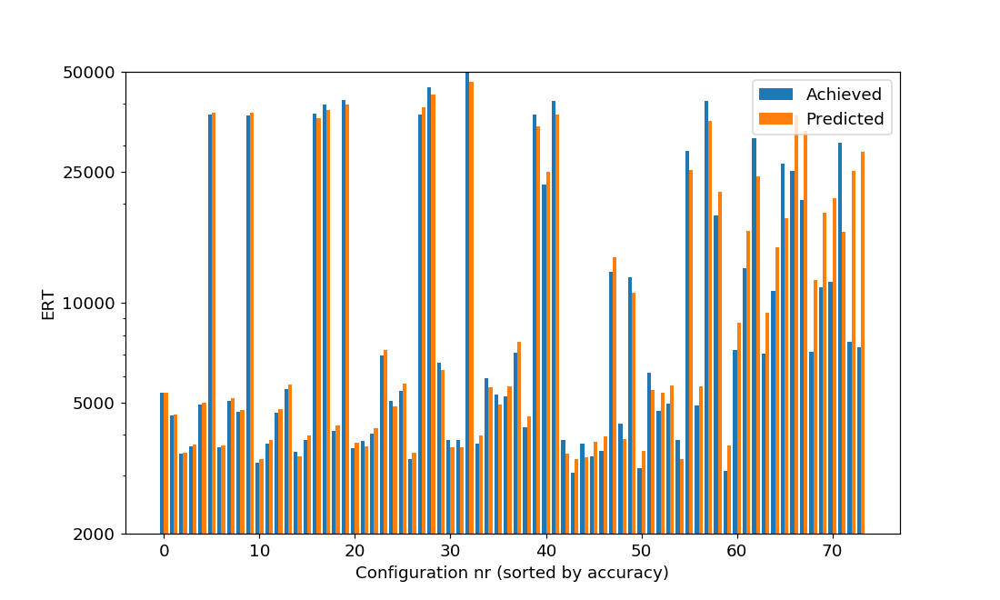

In [318]:
plt.figure(figsize=(10,6))
order = np.argsort(diffs)
plt.bar([i - 0.2 for i in range(len(preds))], [real_values[i] for i in order], width=0.4, label='Achieved')
plt.bar([i + 0.2 for i in range(len(preds))], [preds[i] for i in order], width=0.4, label="Predicted")
plt.yscale('log')
plt.ylim(2000,50000)
plt.yticks([2000,5000,10000,25000,50000], [2000,5000,10000,25000,50000])
plt.ylabel("ERT")
plt.xlabel("Configuration nr (sorted by accuracy)")
# plt.title("Predicted vs actual ERT")
plt.legend()
plt.savefig("ML_Pred_vs_Achieved.pdf")
# plt.scatter(range(len(preds)),np.sort(diffs))

<IPython.core.display.Javascript object>


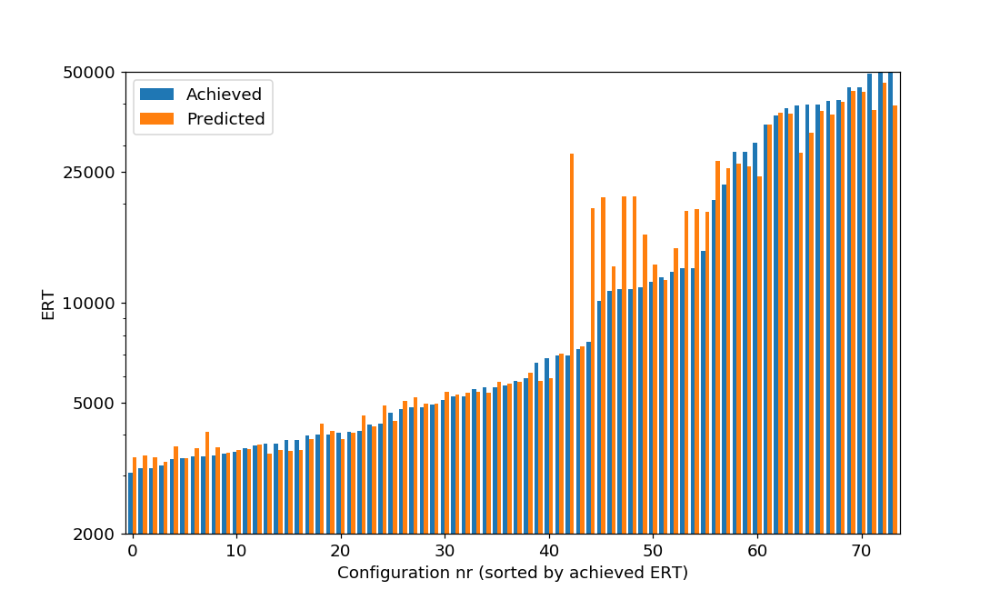

In [216]:
plt.figure(figsize=(10,6))
order = np.argsort(real_values)
plt.bar([i - 0.2 for i in range(len(preds))], [real_values[i] for i in order], width=0.4, label='Achieved')
plt.bar([i + 0.2 for i in range(len(preds))], [preds[i] for i in order], width=0.4, label="Predicted")
plt.yscale('log')
plt.ylim(2000,50000)
plt.yticks([2000,5000,10000,25000,50000], [2000,5000,10000,25000,50000])
# plt.scatter(range(len(diffs)), np.sort(diffs))
# plt.ylabel("Prediction Error")
# plt.xlabel("Configuration nr (sorted by accuracy)")
plt.ylabel("ERT")
plt.xlabel("Configuration nr (sorted by achieved ERT)")
plt.xlim(-0.7,73.7)
# plt.title("Predicted vs actual ERT")
plt.legend()
plt.savefig("ML_Pred_vs_Achieved_absolute.pdf")

From this, we see that the predictions are quite accurate for the configurations for which we have already gathered data. 
This is however not a completely representative sample of configurations, and so we will perform another experiment with the model: 
- Predict the ERT-values for all remaining configurations
- Determine which configurations are predicted to perform well (and where we do not have the needed data)
- Run those configurations to verify the prediction


In [58]:
vector_new = []
for i in range(1508):
    vector_new.append(intToRepr(3*i)[:10])
preds_new = model.predict(vector_new)    

In [59]:
best_idxs = 3*np.argsort(preds_new)[:45]

In [60]:
 new_confs = np.setdiff1d(best_idxs,confs_tot)

Now we will take a quick look at the ERT-values for these configuration on 25 runs.

In [61]:
new_confs = np.load("F12_new.npy")
pred_vals_new = []
achieved_vals_new = []
pred_vals_25 = []

df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{12}.csv", index_col=0)


for c in new_confs:
    default_val = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_default.csv", header = None))

    ert_def = np.sum(default_val[0])/250-np.sum(default_val[0]==50000)
    pred_val1 = np.array(df["10e-8.0"])[25*c:25*(c+1)]
    pred_val1[np.isnan(pred_val1)] = 50000
    pred_val = np.sum(pred_val1)/ (25- np.sum(pred_val1 == 50000))
    pred_vals_25.append(pred_val)
    achieved_vals_new.append(ert_def)
    pred_vals_new.append(preds_new[int(c/3)])
#     print(vector_new[int(c/3)])
#     print(ert_def, preds_new[int(c/3)])
#     print(pred_val)
#     print("________________________________")

<IPython.core.display.Javascript object>


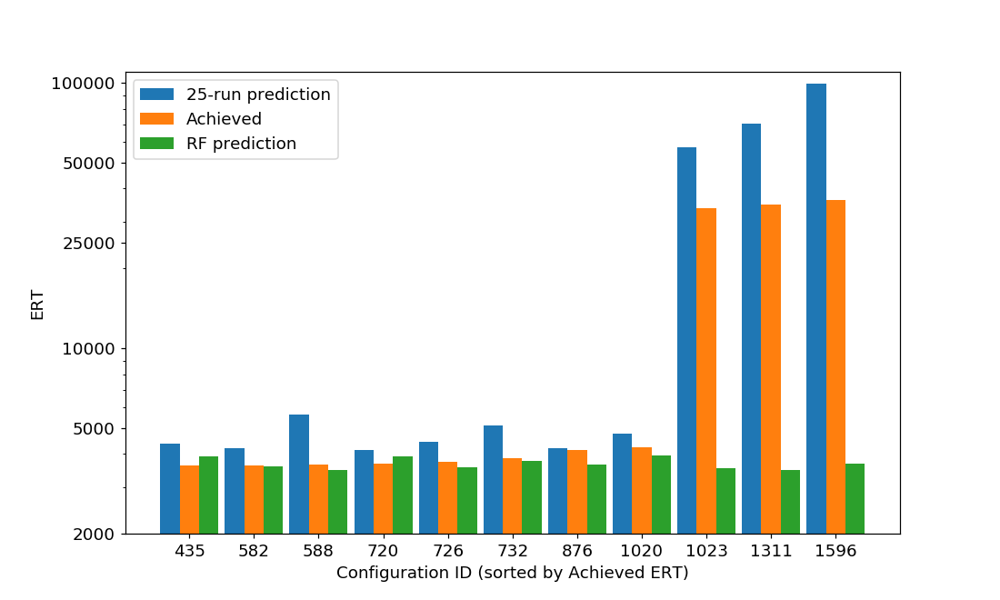

In [67]:
plt.figure(figsize=(10,6))
order = np.argsort(achieved_vals_new)
plt.bar([i - 0.3 for i in range(len(new_confs))], [pred_vals_25[i] for i in order], label="25-run prediction", width=0.3)
plt.bar([i for i in range(len(new_confs))], [achieved_vals_new[i] for i in order], label="Achieved", width=0.3)
plt.bar([i + 0.3 for i in range(len(new_confs))], [pred_vals_new[i] for i in order], label="RF prediction", width=0.3)
plt.legend()
plt.yscale('log')
plt.ylim(2000,110000)
plt.yticks([2000,5000,10000,25000,50000, 100000], [2000,5000,10000,25000,50000, 100000])
plt.ylabel("ERT")
plt.xlabel("Configuration ID (sorted by Achieved ERT)")
plt.xticks(range(len(new_confs)),new_confs)
# plt.title("Predicted vs achieved ERT based on RF-model")
plt.show()
plt.savefig("ML-pred_default_var3.pdf")

From this figure, we can see that even tough there are a few outliers, for most configuration the prediction of the model is as accurate if not more so than the 25-run data

## Model creation comparison 
Compare predicting default ERT vs ERT after hyperparameter optimization

For this section, we will compare the performance of the prediction to a model which predicts the ERTs after hyperparameter optimization as well as a model which predicts random ERTs

In [15]:
def model_check(to_predict, nr_samples=100):
    diff_vals = []
    coeffs = []
    for rep in range(100):
        model = RandomForestRegressor(10)
        rep_vector = []
        selected_idx = np.random.choice(range(len(confs_tot)), nr_samples, replace=False)
        values = []
        for i in selected_idx:
            c = confs_tot[i]
            rep = intToRepr(c)[:10]
            rep_vector.append(rep)
            values.append(to_predict[i])
        model.fit(rep_vector, values)
        test_set = np.setdiff1d(range(len(confs_tot)), selected_idx)
        rep_vector_test = []
        real_values = []
        for i in test_set:
            c = confs_tot[i]
            rep = intToRepr(c)[:10]
            rep_vector_test.append(rep)
            real_values.append(to_predict[i])
        preds = model.predict(rep_vector_test)
        diffs = []
        for i,j in zip(preds,real_values):
            diffs.append(1-min(i,j)/max(i,j))
        diff_vals.append(np.mean(diffs))
        coeffs.append(kendall_rank_coeff(preds, real_values))
#     print(np.mean(diff_vals), np.mean(coeffs))
    return (np.mean(diff_vals), np.mean(coeffs))

<IPython.core.display.Javascript object>


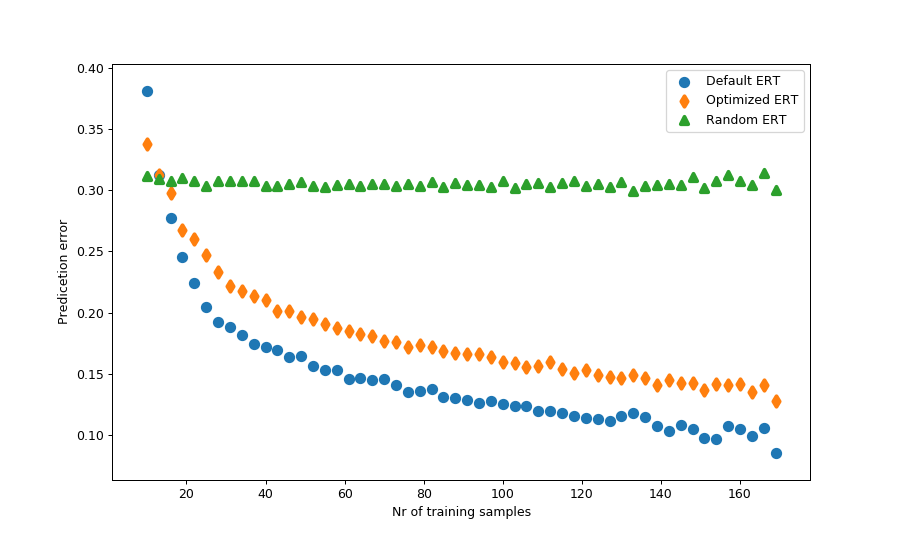

In [19]:
sample_points = [10+3*i for i in range(54)]
sample_def = [model_check(def_vals, x) for x in sample_points]
sample_opt = [model_check(opt_vals, x) for x in sample_points]
sample_random = [model_check(fake_erts, x) for x in sample_points]

plt.figure(figsize=(10,6))
plt.scatter(sample_points, [x[0] for x in sample_def], label= "Default ERT", linewidth=3)
plt.scatter(sample_points, [x[0] for x in sample_opt], label= "Optimized ERT", marker='d', linewidth=3)
plt.scatter(sample_points, [x[0] for x in sample_random], label= "Random ERT", marker='^', linewidth=3)
plt.xlabel("Nr of training samples")
plt.ylabel("Predicetion error")
# plt.title("Relation between training samples and error rate")
plt.legend()
plt.show()
plt.savefig("ML_pred_error.pdf")

In [18]:
fake_erts = np.random.normal(np.mean(def_vals),np.mean(def_var), (174,))

# model_check(def_vals)
# model_check(opt_vals)
# model_check(fake_erts)

From this, we see that predicting the ERTs of the default hyperparameter values is slightly easier than predicting the ERT after hyperparameter optimization. However, both predictions are substantially better than random, indicating that the model is at least learning something about the configurations.

# Comparing MIP-EGO to irace

This section compares irace to MIP-EGO on the hyperparameter tuning task. For 5 configurations, irace was run with the same total budget as MIP-EGO, and the results are visualized in the following figures

In [68]:
irace_confs = [867, 870, 864, 2172, 744]

irace_res = {}
irace_res_old = {}
irace_res[864] = [2768,2728,4720,2840,2416,2528,3472,3336,2040,3424,3376,2968,3792,3952,4232,2936,3160,3584,3400,3000,4232,2664,3352,3960,2880,3976,2512,3216,2648,4144,3016,2648,2728,3960,2752,3752,2784,3328,2208,2664,3376,2648,4456,4360,3232,2336,2920,3848,2936,2504,3416,1424,5112,4400,1488,1552,3384,4576,1352,1504,1496,1856,1528,1456,2776,3448,1512,1448,1304,3120,2624,1432,1416,1336,1528,3760,1408,1184,1464,1608,4560,1536,1288,1624,1536,1728,3344,1600,3136,2880,1616,1424,1320,3336,1552,4872,1488,1456,1600,1680,3000,3864,5088,3880,4392,3216,3400,2960,3080,4824,3224,3888,3368,2888,3384,2704,4256,3144,3480,3728,3976,3216,3840,3248,4424,3280,4016,2888,3432,4392,3336,2952,1064,3016,4888,4608,2888,3688,3552,3736,4712,3512,3864,3848,4512,4184,3728,2992,4264,4864,4984,4880,3904,1584,2800,1456,1696,1552,1272,1456,4096,1640,1528,1480,1504,3936,5352,1576,1496,1368,1736,3320,4880,1488,4680,1616,1536,4648,1568,4208,1512,1664,1312,1776,1656,1296,1392,5096,1272,3888,1568,1464,1344,1536,1680,3888,1600,4208,4792,1776,1920,4936,1888,1736,1896,1848,2104,2344,1600,2040,1984,2040,1840,1504,2016,1960,1888,2064,1896,1808,3880,2016,2120,1832,2136,1928,1760,1784,1968,1880,2072,1704,1816,1936,1840,1984,1936,1848,1584,1936,2016,1928,1808,1688,2160,1928,1960,2096,1824,2056]
# irace_res_old[867] = [2456,2968,2760,3184,2576,2864,2624,3184,4376,2344,3480,3112,2656,2168,3296,2752,3336,3632,2784,3248,3760,3576,3200,3480,4048,2800,3312,3160,3424,3864,2800,2968,2800,3312,3016,4208,3120,2704,2272,1832,3568,3072,2408,3392,3640,4008,4240,3504,4384,2536,1624,3560,1584,1520,3832,1616,3448,2976,1704,1352,3280,1632,3152,1328,1536,2800,1544,1504,1368,1288,1616,2528,1496,1472,1536,1472,1392,1280,1504,1456,1408,3096,1200,1504,3592,1304,1448,3424,1280,4208,1504,3304,3088,1432,4128,1512,1480,1328,1616,1696,3216,3120,4120,2992,3560,3040,4160,4176,3592,3456,3072,3728,2888,3112,3192,4000,3272,4608,3336,3304,3776,3688,3312,4312,4456,2768,4384,3768,2952,3968,3192,2936,3056,3976,3192,4160,2712,2984,3920,2552,3016,3096,3312,3608,4296,3408,2536,3328,3168,4216,1536,1336,3520,1568,1312,3064,1704,1544,3248,1424,1416,1736,1440,1360,1464,1496,1528,1464,4456,3016,3336,1424,1416,1504,5096,1480,1464,3256,1624,1544,1616,9776,1296,1544,1672,4128,5544,1408,1312,1336,1496,1392,1336,4008,1752,1608,3624,4800,1712,1672,2104,1816,5032,1896,2008,2104,2120,1704,1696,1872,5200,2168,1816,1968,1696,1928,2096,1880,1992,1824,2200,1824,1872,1728,2320,2192,2016,2008,1752,2080,1984,1976,1744,2144,3728,1696,1928,1664,2024,1624,1984,1960,1888,1912,2248,1896,1880,1896,1864,1920]
# irace_res_old[2172] = [3609,4749,2920,3181,4419,3659,3726,3321,4862,4487,3265,3967,4410,4362,3280,4135,2394,3374,3215,3517,2721,3438,5135,3057,3341,3522,3054,2244,4400,3305,4528,3328,4295,4585,3843,2530,4773,2077,2942,3883,3998,4000,2664,4108,3988,3100,3806,3416,3701,2584,1414,1896,2248,3563,1490,1682,1574,1499,1438,1548,1737,1274,4098,1599,1588,3376,3939,1513,1487,5594,1367,1580,1784,1491,1376,3639,1590,1500,4204,1399,3827,1641,1525,4040,6091,1380,1515,1654,1369,3928,1771,3399,1606,1668,3333,5036,1526,1769,1367,4265,4537,4138,5563,5935,4340,6298,4580,4530,6160,5044,5835,3735,4953,4085,3835,4394,3707,6349,3914,3628,5654,3999,3944,3755,5021,4332,5833,5799,4745,5788,3249,3750,3246,4082,4625,4424,3777,6247,4630,4508,5267,5990,3065,5201,5521,3758,5446,4135,5735,3796,1533,1727,1541,8878,1903,1749,6489,1715,1508,7419,4398,1609,1798,1861,1811,1661,1476,5211,1610,1711,1466,1779,3414,7366,1260,9201,1632,1497,1578,1583,1785,1414,1451,1398,2124,1443,4842,10752,1532,5850,1875,1612,1666,1772,1499,1785,1666,7241,1436,1334,1964,2181,1890,2673,2384,2245,1847,11957,2106,2283,2347,2070,2759,12099,2294,11167,1951,2166,4524,4672,1991,4706,2705,1987,2020,2231,6150,10513,2459,2969,2338,2253,1818,2199,2198,1981,2209,2686,5266,2145,2581,2260,2034,4485,1822,2376,1957,2183,2263,2121]
irace_res[867] = [3584,2592,3984,7104,3088,3888,3048,2664,3176,2520,2160,2728,2568,2832,2816,3328,2512,2872,2416,3048,3344,2104,2392,2424,3296,3536,2560,3120,2232,3392,2656,3536,3856,3232,6384,2704,2824,2296,2784,2400,4192,3440,2664,2608,3512,2080,3680,2712,6552,3968,1600,1480,1616,1400,3464,1464,3152,1464,1632,1408,3064,1680,1320,1296,1336,1320,3656,1432,1336,1424,1408,1360,1360,3504,1560,3072,2888,1248,1464,1512,1544,1416,4088,1640,3184,1280,1240,1432,2600,3096,1312,3776,3224,1408,1480,1488,3504,1416,1544,1472,3560,3784,7984,4248,7936,3936,3128,2976,2536,2808,7352,4200,2696,2960,3080,4384,4160,2904,2688,3936,7528,3032,3520,3080,3248,3424,3432,3896,3680,3272,7616,4032,2704,6280,7200,4296,2824,3416,2544,3088,4048,2752,3088,3032,3816,3280,3008,2792,3936,7416,1416,1480,1696,1408,1624,3056,1608,1496,1248,1248,3592,1640,1456,1376,1520,5320,1448,1424,5488,1528,1488,1272,4096,1464,1520,7688,1304,1088,1392,1448,5312,3960,1288,1808,3152,3728,1432,1376,1248,1128,1544,1200,1224,3608,1472,1424,1392,1624,1616,1560,1736,7672,2040,1816,1760,1808,1992,1760,1328,1720,1904,2280,1704,1656,2024,1872,1752,1864,1792,1976,1736,2096,2080,5888,2040,1968,1832,1712,1800,1832,1944,1712,1640,1872,1984,1624,1720,4072,1960,1800,1928,1768,1616,1704,1792,6024,1808,2024,3392,2112]
irace_res[2172] = [4322,4243,5852,3319,4444,2972,3369,4725,4206,4743,5285,4126,4263,4179,3207,4199,3542,4136,3068,3694,2491,5081,3013,4433,5024,3590,4444,3895,3239,2107,3630,3379,3809,3148,3796,2574,5128,3721,3444,3052,5771,5073,4315,2894,5020,3303,3216,4908,3192,2628,3110,6284,4298,1682,4380,3230,1438,1825,1285,1569,1853,1272,1645,1642,1884,1513,1455,1678,1401,1815,1348,1595,2009,1699,1361,1876,1773,3403,1539,1359,1735,1544,1481,4376,1764,3368,4012,1740,1479,1458,4488,1730,1370,1848,1480,1848,1624,5064,1458,1206,2957,4777,5362,5034,5296,5441,3944,4077,4102,5716,2998,3723,5823,4361,3770,4153,5693,4984,4428,4936,2733,6029,3933,4238,4516,4027,5446,4577,3750,4910,3714,5068,3835,3760,6605,4490,4582,5440,3422,3710,5337,3689,4557,3914,3883,3398,3757,4761,4283,4060,1471,4765,4560,4943,1891,9507,6620,1498,1285,5860,1856,2247,1726,1653,9778,1566,1453,4270,4000,9845,1352,1551,4963,10021,9536,1947,5868,1697,10743,1354,1799,1464,1627,1574,9849,1453,5275,5216,1622,1448,8761,2006,1549,1827,1464,1767,1711,1919,4909,1394,2306,11530,2086,4235,2509,2517,6133,2587,2026,2676,2362,1923,2636,2208,4273,6123,1810,5756,2173,2555,1900,3112,2238,2388,1977,6395,2735,2179,2528,1907,2688,2223,2084,4595,3012,2342,2118,2658,4803,1935,2704,2179,2432,9848,1805,2066,10380,2406,1894,1852]
irace_res[870] = [4096,3600,4368,3144,3592,3280,3752,3552,2464,4224,3056,2776,3720,3200,3712,2672,3320,3248,4304,3256,2608,4712,4392,3960,4640,3960,2616,3224,2672,4528,4128,2488,2320,3488,4016,3584,3392,2800,2824,2232,3888,2496,3992,3000,4528,4272,3808,2560,3632,3776,1560,1456,1720,1520,3736,1528,1648,1552,2064,1440,1416,5760,1560,1328,1536,1448,1464,1552,1432,1416,1504,1568,1456,1376,3760,1600,1384,3344,3136,1536,3768,1400,1328,1512,1600,1704,1504,1632,1312,3664,2176,1360,1376,1520,3240,1328,3760,1456,1712,3832,4432,4032,5424,4176,3384,4472,3048,4992,4712,3832,4144,3608,3056,4080,2792,2912,3536,3784,2896,4616,4128,3576,3496,4960,3312,3520,4544,2832,3400,4344,3800,4416,1928,2976,2552,4656,4120,2600,2904,2472,3152,3136,4648,4160,2736,3000,3600,3176,4272,3152,1768,4424,1728,5392,1544,1632,6368,1600,1328,1576,1464,1736,1432,1384,4832,1432,1608,4512,3936,1424,3696,1440,1616,1416,1696,3640,1560,1480,1616,1576,1648,3904,1288,3560,1672,6192,1560,1328,1448,5160,1688,1520,1400,1520,3728,1496,1496,4752,4224,1680,2144,1880,2176,1976,1864,2032,1816,5744,1680,1888,1848,1944,2056,2088,1680,3664,2232,1808,1616,1960,2464,1928,1768,1680,1928,4216,1768,1936,1984,1800,1928,1864,1688,1984,4952,6640,1872,1808,6312,1872,2376,1752,3624,1776,7144,2056,1864,1744,2072,2256]
irace_res[744] = [4327,3813,4423,3728,4610,5237,3101,5217,5233,4117,3046,4827,3907,4084,3667,3585,4909,3578,4714,4343,4701,3742,3588,3514,3860,4104,3602,5222,4342,3447,4466,4619,4340,5206,3580,3556,3614,3171,4094,4312,2509,5131,4047,3269,2561,6003,4154,3540,4267,3932,2046,1923,5169,5728,2003,5311,2101,2042,5227,1945,2188,6022,2052,1721,2081,1735,2184,6154,5037,1838,2214,1760,4804,2251,1899,1956,3806,1963,2035,2049,2045,4482,1803,4735,3724,2073,4839,2063,2301,1867,2024,4710,1778,1943,1966,2174,1915,3799,3711,2231,5061,5046,6313,6166,4244,3866,5376,3921,6232,5241,4824,4023,6143,4361,5222,3451,5116,4615,5674,3996,5942,5360,5244,4287,4659,4820,4006,4131,4712,5766,5115,4546,3301,5430,4186,4583,4626,4502,5091,4880,4246,4560,5357,4663,5113,4268,3737,6071,5751,5190,2308,5736,2164,2015,8063,1891,9496,2094,5525,2257,2117,2135,2014,2079,2013,4679,1902,6489,2045,2003,1919,5269,1946,4196,4545,2108,1822,1919,7727,2413,2190,1900,5044,2033,2140,2465,1795,2035,5516,1709,2157,2083,1819,1859,2234,6009,4783,1760,6612,2145,2379,2796,4805,2600,2460,2384,2446,2649,2621,2869,2667,2820,2065,2406,2779,2432,3087,4394,5683,2675,2744,2431,2739,2082,3061,2806,2392,2838,4932,2533,2382,2361,2433,2563,2547,2604,2815,2339,5508,2223,2527,2645,2241,2648,4699,2837,2485,2347,2992,2730]
irace_pred = {}
# irace_pred_old = {}
# irace_pred_old[867] = 2278.222222
# irace_pred_old[2172] = 2787.533333
irace_pred[744] = 3518.847059
irace_pred[870] = 2532.991453
irace_pred[867] = 2419.923077 
irace_pred[864] = 2565.259259
irace_pred[2172] = 3275.664286

irace_idx = {}
for c in irace_confs:
    irace_idx[c] = np.where(np.array(confs_tot) == c)[0][0]

<IPython.core.display.Javascript object>


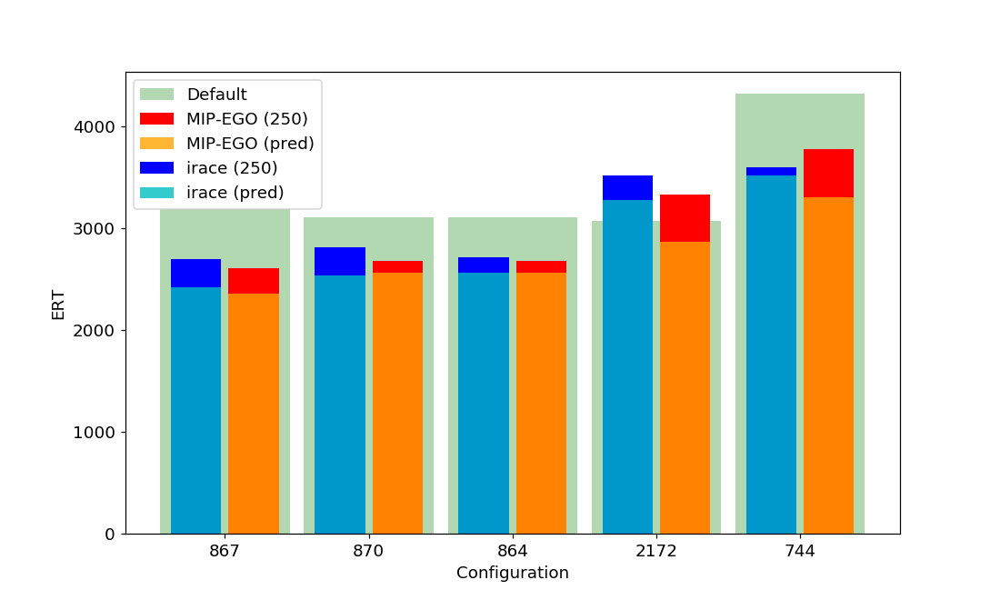

In [311]:
plt.figure(figsize=(10,6))
plt.bar([i  for i in range(5)],[def_vals[irace_idx[c]] for c in irace_confs], width=0.9, label='Default', color='g', alpha=0.3)
plt.bar([i + 0.2 for i in range(5)],[opt_vals[irace_idx[c]] for c in irace_confs], width=0.35, label='MIP-EGO (250)', color='r')
plt.bar([i + 0.2 for i in range(5)],[best_erts[c] for c in irace_confs], width=0.35, label='MIP-EGO (pred)', alpha=0.8, color='orange')
plt.bar([i - 0.2 for i in range(5)], [np.mean(irace_res[c]) for c in irace_confs], width=0.35, label='irace (250)', color='b')
plt.bar([i - 0.2 for i in range(5)], [irace_pred[c] for c in irace_confs], width=0.35, label='irace (pred)', alpha=0.8, color='c')
plt.legend()
plt.xticks(range(5), irace_confs)
plt.xlabel("Configuration")
plt.ylabel("ERT")
# plt.title("Irace vs MIP-EGO: predicted vs 250 run ERT")
plt.show()
plt.savefig("Irace_comparison_pred_var2.pdf")

<IPython.core.display.Javascript object>


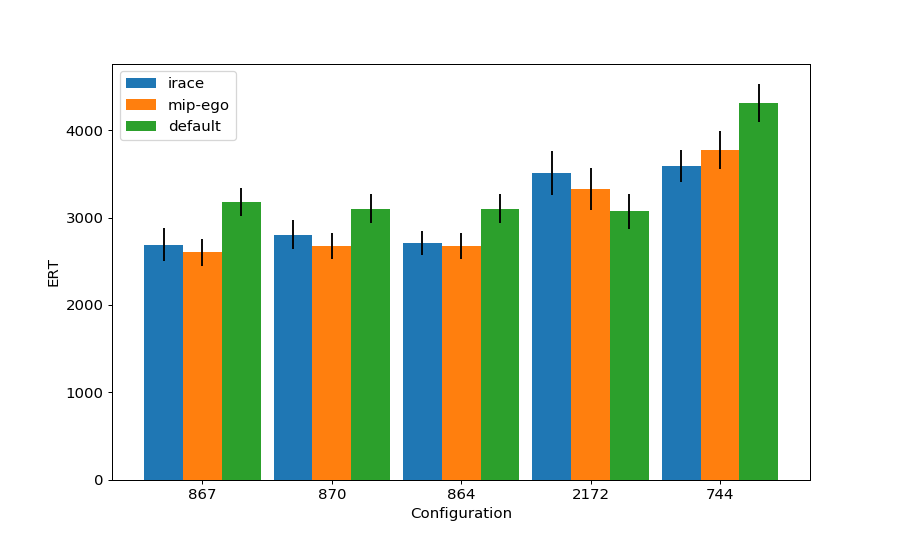

In [336]:
plt.figure(figsize=(10,6))
# plt.bar([-1,5], [np.mean(irace_res_old[867]), np.mean(irace_res_old[2172])])
plt.bar([i - 0.3 for i in range(5)],[np.mean(irace_res[c]) for c in irace_confs], width=0.3, label='irace', yerr = [(2/np.sqrt(250))*np.std(irace_res[c]) for c in irace_confs])
plt.bar([i for i in range(5)],[opt_vals[irace_idx[c]] for c in irace_confs], width=0.3, label='mip-ego', yerr = [(2/np.sqrt(250))*np.std(np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_optimized.csv", header = None))) for c in irace_confs])
plt.bar([i + 0.3 for i in range(5)],[def_vals[irace_idx[c]] for c in irace_confs], width=0.3, label='default', yerr = [(2/np.sqrt(250))*np.std(np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_default.csv", header = None))) for c in irace_confs])
# plt.errorbar([i - 0.3 for i in range(5)],[np.std(irace_res[c]) for c in irace_confs])
plt.legend()
plt.xticks(range(5), irace_confs)
plt.xlabel("Configuration")
plt.ylabel("ERT")
# plt.title("ERT over 250 runs: irace vs MIP-EGO with errorbars")
plt.show()
plt.savefig("Irace_comparison_errorbar.pdf")

Next, a wilcoxon ranked-sum test is performed to test whether the results form irace and mip-ego are significantly different in the statistical sense.

In [245]:
for c in irace_confs:
    irace = irace_res[c]
    mipego = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{c}_optimized.csv", header = None))[0]
#     print(len(irace), len(mipego))
    print(scipy.stats.wilcoxon(irace,mipego))

WilcoxonResult(statistic=14395.0, pvalue=0.41356594029703864)
WilcoxonResult(statistic=15251.0, pvalue=0.7842279582239833)
WilcoxonResult(statistic=14227.5, pvalue=0.20206821421485044)
WilcoxonResult(statistic=14836.0, pvalue=0.456884784363492)
WilcoxonResult(statistic=13107.0, pvalue=0.03089905763757204)


Seeds used for Irace:

744: seed nr 7 

2172: seed nr 4 + 5

876: seed nr 3 + 6

870: seed nr 8

864: seed nr 9

# Integrated algorithm selection and configuration

For the first experiment, we only use instance 1. We first determine the ERT-values reached by the hyperparameter optimization done previously.

In [ ]:
i1_vals = []
for i in range(len(confs_tot)):
    i1_vals.append(np.mean(data_full[i][:50]))
np.sort(i1_vals)

Next, we read the results from irace (manually) and get the following configuration number:

In [70]:
best_found_config = [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]
reprToInt(best_found_config)

867

We find that this matches the 4th best configuration found in the regular hyperparameter optimization

In [268]:
confs_tot[np.argsort(i1_vals)[3]]

867

Next, we run the configuration we got and determine the actual ERT:

In [71]:
res_250 = [3800,2800,2696,3880,3968,3008,2208,3416,3712,2824,2864,3000,3392,3632,2912,2968,4032,2808,2312,3248,4048,3240,3376,3648,3200,3240,2392,2896,3448,2672,3224,1576,2224,2680,4048,3512,4176,3024,1904,2664,3720,3728,4112,4144,2288,3080,2584,3824,3088,2656,1512,1496,1712,1600,1496,1488,1680,1440,1800,3040,3760,1608,1464,1456,1552,2968,1552,1488,1432,1328,1552,2712,1592,1480,1664,1472,1504,1304,1352,3688,1592,3072,1400,1528,1400,1312,1360,4896,1304,1248,1496,1368,2832,1472,1528,1496,1568,1528,4176,1688,2160,3560,3632,3440,3928,3904,2216,3536,3112,2800,2880,3592,3000,3648,4280,3672,2976,3512,3056,3160,2800,3400,3424,2872,4000,2936,3384,3496,4384,3400,2944,3016,3160,4008,2904,3176,2920,4048,3040,2672,4944,2976,2424,3816,4184,4208,4024,3944,4216,4400,1680,3288,1584,1592,1680,4720,1800,1464,3760,1488,3280,1672,4256,4632,1640,1488,1648,1504,1568,1480,1608,1536,1608,1584,1736,1568,1472,3704,1464,4256,4600,1512,3728,1696,1648,3056,1504,3928,1216,1304,1496,1408,1320,1536,1560,1608,1464,4000,1624,1736,1872,2064,4768,2176,3160,1872,2208,2808,1600,3584,4208,1992,1952,1840,1968,1896,1856,2224,2056,3816,3720,2120,1944,1792,2328,1936,2016,1600,1928,2024,2120,1992,1824,2024,2024,1856,2184,1848,1976,1856,1864,1816,1584,7080,1992,1832,1808,1928,1864,2200]
np.mean(res_250[:50])

3157.92

From this, we see that there is only one configuration which performed better on this instance after the hyperparameter optimization. This run of the one-shot irace was very effective. 

Note: The predicted value by irace was 3026.109453 (~200 runs); rerunning 500 times gives ERT of 3155.456

We repeat this experiment another time to see how robust the data is and get the following configuration with corresponding ERT

In [72]:
conf2_found = [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
reprToInt(conf2_found)

2191

In [73]:
res_250_2 = [3109,5128,4956,5260,3351,3806,4033,3972,3734,5387,4523,3237,4282,2754,4032,4439,2612,3134,2812,1928,3081,5188,3507,5282,4656,5290,4139,3635,3912,2941,3805,4031,4030,3141,4908,3760,3445,4206,4980,3582,3361,3708,3672,2926,2709,5005,3583,4634,3443,4313,1623,1904,1661,1711,1748,3298,1578,1579,1381,6073,1535,1453,1440,2416,1551,3962,1341,1708,1910,2953,4952,4413,3145,1868,3630,1927,1598,1670,1417,1527,1429,1489,1561,1366,1471,1561,2927,1537,1546,1850,1623,1535,1757,4794,6264,1698,3463,1995,1653,1515,4225,5043,4407,4117,4015,4197,3561,3515,4455,2744,4976,4519,4449,4861,3063,5073,5388,4268,4745,3560,4049,4281,4841,3823,4392,4249,4359,4878,3224,4531,2477,5072,3997,2523,3639,5225,4567,4426,4148,4945,3387,4846,4476,4435,3456,5235,4141,4828,4501,2951,1575,4633,4350,5245,12237,1607,1401,1588,1747,6820,1513,1462,1616,1697,8270,1672,4383,1824,1767,1375,1424,3968,1714,6425,1725,1816,1567,1925,1463,1428,1493,1604,1477,8883,1667,4937,1594,1800,9790,1665,1552,4272,4454,4366,1573,1739,1626,3908,1702,1836,2327,2857,2342,2268,2117,1982,1994,6192,1999,2102,2001,2081,2146,2253,2118,1989,5826,2167,2483,5615,1664,2223,2169,2251,6643,2326,1946,8290,1974,7873,1731,1920,2103,1968,1979,2021,4100,1982,4835,2549,2203,10252,2086,2091,5098,2328,10433,5216,2588,2144]
np.mean(res_250_2[:50])

3907.24

From this, we can see that the method is not very robust. This might be caused by the fact that the settings for irace are not optimal for the size of our search space, as we only have a few elite configurations after every race. This might lead to an imbalance between exploration and exploitation.

Note: the predicted value by irace was 3570.039526 (~250 runs); rerunning 500 times gives ERT of 3715.034

<IPython.core.display.Javascript object>


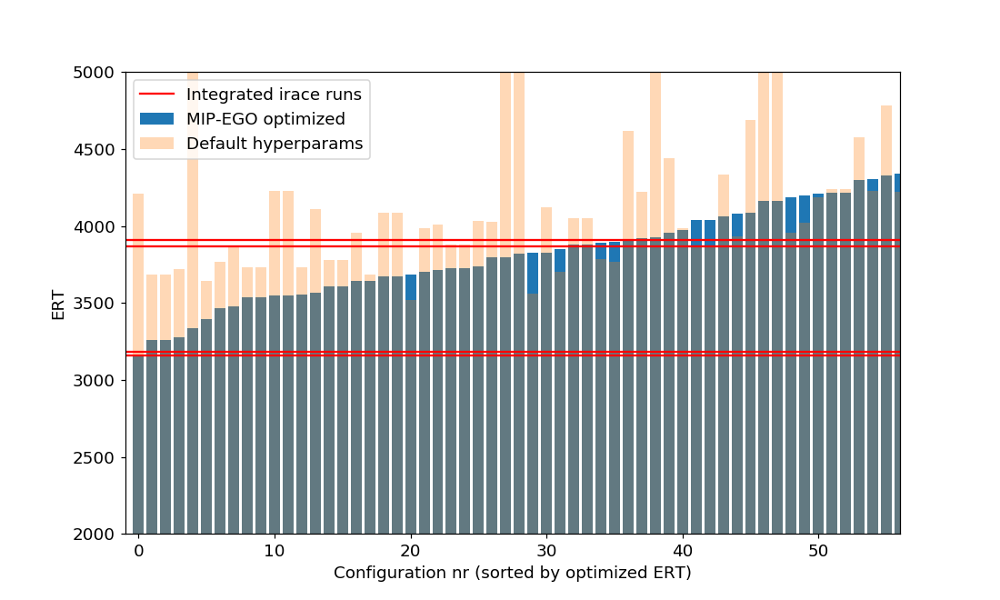

In [76]:
plt.figure(figsize=(10,6))
order = np.argsort(i1_vals)
plt.bar(range(len(i1_vals)), np.sort(i1_vals), label="MIP-EGO optimized")
plt.bar(range(len(i1_vals)), [np.mean(np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{confs_tot[i]}_default.csv", header = None))[0][:50]) for i in order], alpha=0.3, label="Default hyperparams")
plt.xlim(-1,56)
plt.ylim(2000,5000)
plt.xlabel("Configuration nr (sorted by optimized ERT)")
plt.ylabel("ERT")
legend_added = False
for x in achieved_vals_irace_1inst:
    if not legend_added:
        plt.axhline(np.mean(x[:50]), color='r', label="Integrated irace runs")
        legend_added = True
    else:
        plt.axhline(np.mean(x[:50]), color='r')
plt.legend()
# plt.title("ERT values achieved by MIP-EGO vs one-shot irace search (1 instance)")
plt.show()
plt.savefig("irace_F12_1inst.pdf")

Note to self:
- Seeds 1, 2, 5 and 6: 1 instance 
- Seeds 3, 4: 5 instances

First, look at the other one-instance runs

In [75]:
confs_irace_1inst = []
confs_irace_1inst.append(reprToInt([0, 0, 1, 1, 0, 0, 0, 0, 0, 1,  0]))
confs_irace_1inst.append(reprToInt([0, 1, 1, 1, 1, 0, 0, 1, 1, 1,  1]))
confs_irace_1inst.append(reprToInt([0, 0, 1, 1, 0, 0, 0, 0, 0, 1,  2]))
confs_irace_1inst.append(reprToInt([0, 1, 0, 0, 0, 0, 0, 0, 0, 1,  0]))

pred_vals_irace_1inst = []
pred_vals_irace_1inst.append(3040.195918)
pred_vals_irace_1inst.append(3570.039526)
pred_vals_irace_1inst.append(3016.587156)
pred_vals_irace_1inst.append(3536.333333)

achieved_vals_irace_1inst = []
achieved_vals_irace_1inst.append([3800,2800,2696,3880,3968,3008,2208,3416,3712,2824,2864,3000,3392,3632,2912,2968,4032,2808,2312,3248,4048,3240,3376,3648,3200,3240,2392,2896,3448,2672,3224,1576,2224,2680,4048,3512,4176,3024,1904,2664,3720,3728,4112,4144,2288,3080,2584,3824,3088,2656,1512,1496,1712,1600,1496,1488,1680,1440,1800,3040,3760,1608,1464,1456,1552,2968,1552,1488,1432,1328,1552,2712,1592,1480,1664,1472,1504,1304,1352,3688,1592,3072,1400,1528,1400,1312,1360,4896,1304,1248,1496,1368,2832,1472,1528,1496,1568,1528,4176,1688,2160,3560,3632,3440,3928,3904,2216,3536,3112,2800,2880,3592,3000,3648,4280,3672,2976,3512,3056,3160,2800,3400,3424,2872,4000,2936,3384,3496,4384,3400,2944,3016,3160,4008,2904,3176,2920,4048,3040,2672,4944,2976,2424,3816,4184,4208,4024,3944,4216,4400,1680,3288,1584,1592,1680,4720,1800,1464,3760,1488,3280,1672,4256,4632,1640,1488,1648,1504,1568,1480,1608,1536,1608,1584,1736,1568,1472,3704,1464,4256,4600,1512,3728,1696,1648,3056,1504,3928,1216,1304,1496,1408,1320,1536,1560,1608,1464,4000,1624,1736,1872,2064,4768,2176,3160,1872,2208,2808,1600,3584,4208,1992,1952,1840,1968,1896,1856,2224,2056,3816,3720,2120,1944,1792,2328,1936,2016,1600,1928,2024,2120,1992,1824,2024,2024,1856,2184,1848,1976,1856,1864,1816,1584,7080,1992,1832,1808,1928,1864,2200])
achieved_vals_irace_1inst.append([3109,5128,4956,5260,3351,3806,4033,3972,3734,5387,4523,3237,4282,2754,4032,4439,2612,3134,2812,1928,3081,5188,3507,5282,4656,5290,4139,3635,3912,2941,3805,4031,4030,3141,4908,3760,3445,4206,4980,3582,3361,3708,3672,2926,2709,5005,3583,4634,3443,4313,1623,1904,1661,1711,1748,3298,1578,1579,1381,6073,1535,1453,1440,2416,1551,3962,1341,1708,1910,2953,4952,4413,3145,1868,3630,1927,1598,1670,1417,1527,1429,1489,1561,1366,1471,1561,2927,1537,1546,1850,1623,1535,1757,4794,6264,1698,3463,1995,1653,1515,4225,5043,4407,4117,4015,4197,3561,3515,4455,2744,4976,4519,4449,4861,3063,5073,5388,4268,4745,3560,4049,4281,4841,3823,4392,4249,4359,4878,3224,4531,2477,5072,3997,2523,3639,5225,4567,4426,4148,4945,3387,4846,4476,4435,3456,5235,4141,4828,4501,2951,1575,4633,4350,5245,12237,1607,1401,1588,1747,6820,1513,1462,1616,1697,8270,1672,4383,1824,1767,1375,1424,3968,1714,6425,1725,1816,1567,1925,1463,1428,1493,1604,1477,8883,1667,4937,1594,1800,9790,1665,1552,4272,4454,4366,1573,1739,1626,3908,1702,1836,2327,2857,2342,2268,2117,1982,1994,6192,1999,2102,2001,2081,2146,2253,2118,1989,5826,2167,2483,5615,1664,2223,2169,2251,6643,2326,1946,8290,1974,7873,1731,1920,2103,1968,1979,2021,4100,1982,4835,2549,2203,10252,2086,2091,5098,2328,10433,5216,2588,2144])
achieved_vals_irace_1inst.append([2928,2336,3240,3112,3552,4328,3744,3784,3656,3744,3640,3208,2672,3040,3152,3768,2048,3360,2664,2328,2080,3144,3800,4368,3024,2424,2640,2792,3384,2824,2440,3056,2640,2368,3736,3680,3760,2576,3728,3768,3040,3712,3768,2960,3376,2984,3312,2800,4040,2696,1496,3776,1544,1408,6040,1504,1400,1384,1256,3216,3448,1304,1464,1480,3328,3096,3192,1592,1624,1240,1152,1560,1528,1696,1496,1440,1376,1632,1280,1240,3792,1312,3672,1112,1368,1392,3088,1408,1456,1504,1200,3584,3168,3008,1552,1536,1424,1728,1544,1560,3616,4224,2272,2976,4280,3520,3024,3544,3400,3528,3520,3160,3216,3768,2992,2792,2696,3336,4032,3480,2640,3944,3160,3248,3048,4520,3248,4096,3144,2808,3216,2864,3632,4208,3688,3168,3200,3104,3128,4168,4104,3024,4408,4272,2808,3504,3368,2904,3528,3312,1528,1200,4016,1504,1464,1592,1368,1488,1400,1432,4720,1328,1616,1400,1464,1440,1320,1680,1744,1232,3448,1640,1560,3848,1640,1224,4760,1664,1304,3104,1368,1576,1464,1280,1456,3856,1512,1376,1560,1488,1320,1544,1440,1552,3824,1704,1400,1624,1520,8368,4256,1696,5792,2024,2112,1848,1720,1800,1976,1776,1768,1944,1792,2072,1992,2080,1632,1848,1824,1616,1472,2120,1864,1928,1712,2056,1624,2008,1536,1464,1808,1992,1808,1544,6288,1672,1840,1904,4320,2032,1752,1912,4864,5608,2112,2112,1928,4296,4520,1840])
achieved_vals_irace_1inst.append([3344,3080,4464,4048,3272,2760,4088,4144,3144,4216,4152,5224,3400,5440,4296,4168,4472,4344,4008,3496,4232,3976,4232,2776,4824,2832,3632,4296,3632,4320,3656,2960,5032,4272,4472,3632,1816,3376,3464,4008,4016,4912,2392,2952,4120,3424,3472,4432,3296,5392,1960,1888,5744,1728,1608,6128,1720,3600,4040,1752,3864,2152,4336,3080,1592,1352,1848,1784,5080,1552,1992,2296,2144,1640,2192,4168,2424,1392,1800,4672,1928,4952,4312,2016,4712,2360,2160,3800,1384,4832,1832,1640,1960,1840,2152,1776,2024,1944,1752,6192,5208,5160,4168,2992,3000,2816,5512,4832,4576,5080,4904,4048,3240,4368,4824,2848,4752,4336,4408,3280,4544,3224,4032,4440,4328,4624,3568,4472,3400,4704,5608,4184,3472,3984,5552,4832,4016,4928,3480,3360,4264,4088,3632,2264,5536,4144,3272,4392,4552,4136,4824,7728,4192,4184,4640,8128,5688,6336,1592,1576,1688,2232,8152,1552,1712,4176,6160,1664,1816,1728,4760,1808,3816,1456,6104,4976,4816,1464,1808,2040,9440,6256,1488,1888,1816,1560,1656,5608,3776,5896,1784,6368,1544,7624,2112,1648,6056,4992,2160,4888,6096,7848,4624,4600,2152,2384,2448,2472,1952,2152,1776,2896,9120,2224,4920,2176,2064,1976,2136,2320,2872,2200,2368,1968,2296,2248,2024,2184,2144,2600,2704,5376,1952,8936,5224,2784,2344,3656,5304,2000,5960,2392,2160,8240,2376,2312,1928,2440,2160,2440])

irace_param_vals = []
irace_param_vals.append([0.0802, 0.5568, 0.1183])
irace_param_vals.append([0.0942, 0.6316, 0.0259])
irace_param_vals.append([0.0812, 0.5486, 0.1663])
irace_param_vals.append([0.0698, 0.6451, 0.0946])

In [33]:
for x in achieved_vals_irace_1inst:
    print(np.mean(x), np.mean(x[:50]))

2580.96 3157.92
3329.884 3907.24
2590.112 3184.48
3580.768 3868.16


In [560]:
param_vals = np.load("Default_param_vals.npy")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in double_scalars
  import sys


<IPython.core.display.Javascript object>


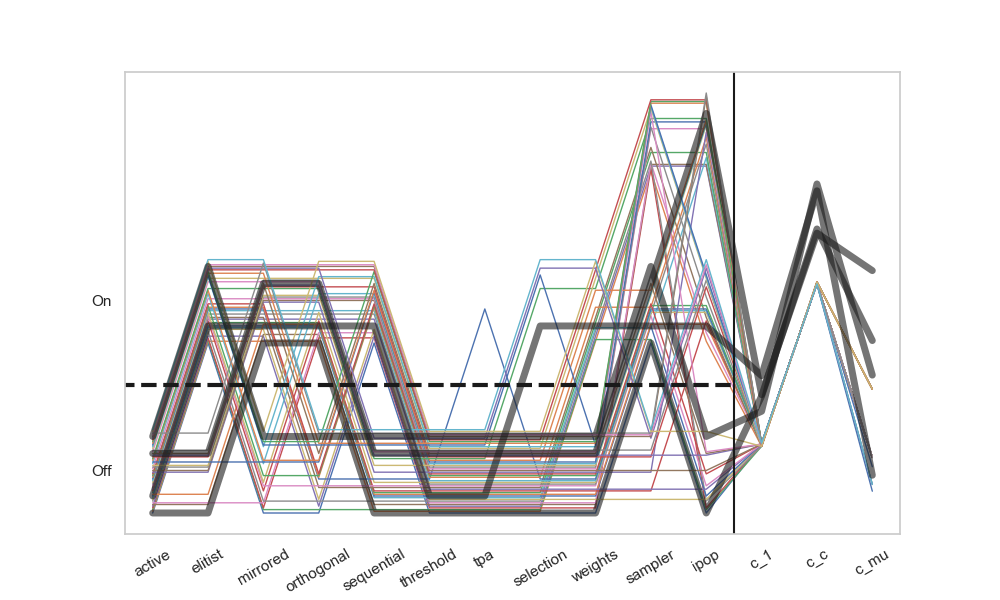

In [591]:
fid = 12
df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
erts_fx = []
for c in range(4608):
    hts = np.array(df['10e-8.0'])[25*c:25*c+5]
    hts[np.isnan(hts)] = 50000
    erts_fx.append(np.sum(hts)/ (5-np.sum(hts == 50000)))
configs = np.argsort(erts_fx)[:50]
colors = ['r','g','b']

fig, ax = plt.subplots(1,1,figsize=(10,6))
# ax.set_title(f"F{fid}: Combined module activation for best statics")
ax.set_xticks(range(14))
conf_param_names = conf_names[:11]
conf_param_names.append("c_1")
conf_param_names.append("c_c")
conf_param_names.append("c_mu")
ax.set_xticklabels(conf_param_names)
ax.set_yticks([0.5,2.5])
ax.set_yticklabels(["Off","On"])
ax.grid(False)
# axy1 = ax.twinx()
# axy1.set_ylim(0,6)
# axy1.set_yticks([0,3,6])
# axy1.set_yticklabels(["0%","50%","100%"])
# axy1.set_ylabel("% of maximum value")
# axy1.grid(False)
#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")

max_vals = [0.35,1,0.35]
for i in range(len(configs)):
#     if int(configs[i]) in confs_irace_1inst:
#         ax.plot([2*j +i/50 for j in intToRepr(int(configs[i]))[:11]],alpha=1,lw=5, color='k')
#     else:
    conf_plot_vals = [2*j +i/50 for j in intToRepr(int(configs[i]))[:11]]
    for j in range(3):
        conf_plot_vals.append(param_vals[configs[i]][j]*6/max_vals[j])
    ax.plot(range(14), conf_plot_vals,alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()

offsets = [0,0.2,0.7,0.9]

for i in np.argsort([np.mean(x) for x in achieved_vals_irace_1inst]):#range(len(confs_irace_1inst)):
    conf_plot_vals = [2*j + offsets[i] for j in intToRepr(int(confs_irace_1inst[i]))[:11]]
    for j in range(3):
        conf_plot_vals.append(irace_param_vals[i][j]*6/max_vals[j])
    ax.plot(range(14),conf_plot_vals,alpha=0.6,lw=5, color='k')


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")
for tick in ax.get_xticklabels():
    tick.set_rotation(30)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
ax.plot([-1,10.5],[1.5,1.5],color='k',lw=3, ls='--')
ax.axvline(10.5, color='k')
# ax.plot([10.5,13.5],[2.5,2.5],color='k',lw=3, ls='--')

ax.set_xlim(-0.5,13.5)
plt.savefig("F12_CMA_with_irace_var2.pdf")
fig.show()

In [78]:
confs_irace_5inst = []
confs_irace_5inst.append(reprToInt([1, 0, 1, 1, 1, 0, 0, 0, 0, 1,  2]))
confs_irace_5inst.append(reprToInt([1, 0, 1, 1, 0, 0, 0, 0, 0, 1,  1]))

pred_vals_irace_5inst = []
pred_vals_irace_5inst.append(2867.588235)
pred_vals_irace_5inst.append(2432.069565)

achieved_vals_irace_5inst = []
achieved_vals_irace_5inst.append([4967,3684,3543,2384,3564,3197,3178,3698,3029,4039,2828,4523,4259,3188,3301,4008,3414,3417,4451,4051,3364,2844,4865,3757,3412,3011,4347,3457,4350,2346,3715,3936,3672,3544,3616,2866,3935,2448,3157,3706,2641,2974,2546,4122,3011,4272,3664,4596,4834,2963,1631,1484,1844,1677,3755,1502,1613,1482,1667,3471,1578,1525,1612,1558,4186,1667,1481,4126,1865,1280,1338,1821,1705,1699,1575,1724,5147,1663,1502,3875,4859,1617,1609,3949,1614,1633,1604,3031,1748,1737,3845,1686,1712,1613,3895,1788,3879,4157,1637,1683,4455,5813,4576,4271,4047,4902,4418,4552,4905,4509,4637,4904,3629,3310,4875,3727,3691,4541,5210,4438,3094,3899,4094,5312,4413,5178,4204,3539,2916,3706,4539,4659,4534,4504,3385,3828,5110,4321,3434,4732,6004,4515,4767,5076,4369,4739,3724,3722,2737,5121,1627,1379,1789,1669,4367,1760,4821,5257,4159,5566,1656,1565,1519,1805,1799,1638,4437,1797,5384,1694,1437,1723,1776,5939,5567,1431,5702,1888,1474,3341,1473,1571,1598,1676,1515,1560,4686,1727,4465,1803,1709,6384,1788,1460,1649,1789,1579,1824,1798,1733,2217,2299,2189,2074,2203,1891,1813,2410,1933,4383,2279,2139,2177,2134,2157,2112,1966,5720,2195,1942,1890,3964,2114,2240,2215,2367,4304,2246,2200,1772,2218,2335,2146,2222,2185,5809,1863,5251,2466,2370,2111,2404,5246,2113,2074,2453,2312,2163,4646,2280])
achieved_vals_irace_5inst.append([2040,2096,2496,3328,3152,2664,2576,2384,2656,3456,2616,2736,2648,2712,4064,3336,3096,3360,3824,2360,2616,3824,4008,3688,3456,3552,2000,4584,3456,2760,3272,3640,4008,2992,3600,2952,2712,2992,6928,3576,2672,3624,3600,2904,3728,2256,2440,3480,2368,2688,1440,4128,1560,1472,1512,1384,1360,1464,1464,1432,1352,1192,1464,1568,3688,1528,2880,7912,1584,1168,1216,1648,3760,5904,3168,3112,2728,1688,1280,1176,1272,1416,1480,1152,1416,1472,1432,2648,1400,1440,1304,1544,4272,3944,1408,1632,1544,1624,1496,1440,3376,4168,3688,3360,2816,3200,3888,2096,2792,3952,4400,3856,4304,3936,3008,4016,3624,4336,3336,2424,2624,3304,3576,4064,2872,3976,3296,4136,2800,3944,3200,4128,3656,3880,4000,3048,2688,2952,3280,3824,3752,2912,3176,3728,3952,4328,4200,4648,3312,3608,1440,1264,1568,1432,1512,1472,1520,6280,3416,1408,1368,3928,1392,1560,1488,3816,4664,4864,1512,1368,1208,1488,2856,1568,1512,1136,1424,3104,4664,3544,1344,4264,1560,1232,1520,1536,1456,1536,1576,1632,1400,1512,1640,6384,1592,1728,3536,4568,1552,3752,3056,3720,2024,5560,3704,1752,1632,1680,3272,1720,1624,1672,2336,1832,1864,2056,1920,2016,1952,1352,1656,1840,1992,3864,4368,3560,2144,2360,1648,1776,1760,1704,1808,1608,1912,2136,1800,2064,2120,1920,1912,1936,3632,1848,6032,2168,1808,2128,2008,2072])


In [32]:
for x in achieved_vals_irace_5inst:
    print(np.mean(x), np.mean(x[:50]))

3074.372 3573.88
2677.632 3159.52


In [31]:
np.sort(opt_vals)[:12]

array([2602.72 , 2677.408, 2677.408, 2772.96 , 2851.232, 2900.844,
       2912.992, 3041.48 , 3059.136, 3061.968, 3061.968, 3196.944])

In [20]:
confs_irace_5inst

[3317, 3172]

<IPython.core.display.Javascript object>


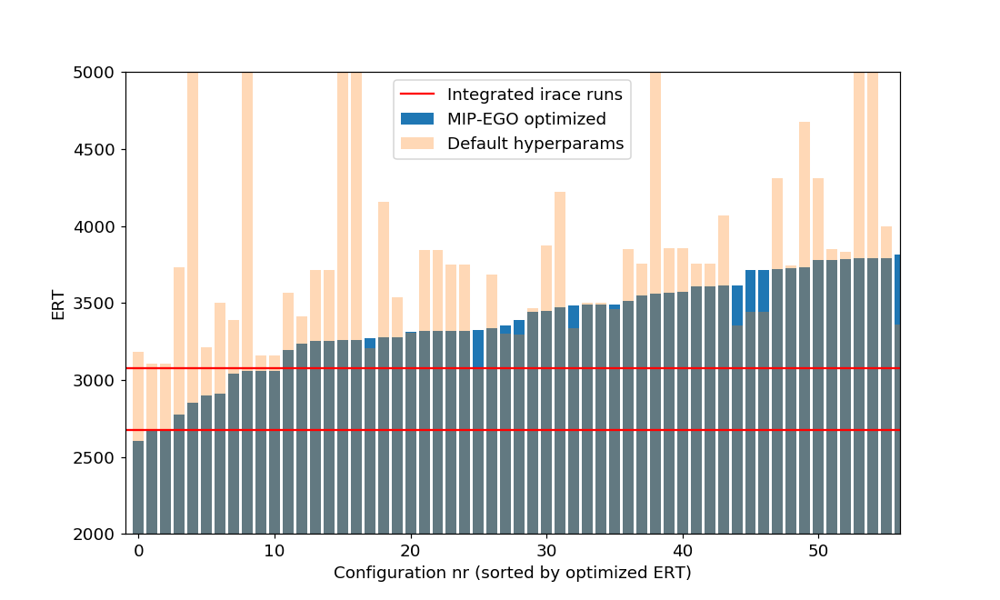

In [79]:
plt.figure(figsize=(10,6))
order = np.argsort(opt_vals)
plt.bar(range(len(opt_vals)), np.sort(opt_vals), label="MIP-EGO optimized")
plt.bar(range(len(opt_vals)), [def_vals[i] for i in order], alpha=0.3, label="Default hyperparams")
plt.xlim(-1,56)
plt.ylim(2000,5000)
plt.xlabel("Configuration nr (sorted by optimized ERT)")
plt.ylabel("ERT")
legend_added = False
for x in achieved_vals_irace_5inst:
    if not legend_added:
        plt.axhline(np.mean(x), color='r', label="Integrated irace runs")
        legend_added = True
    else:
        plt.axhline(np.mean(x), color='r')
plt.legend()
# plt.title("ERT values achieved by MIP-EGO vs one-shot irace search (5 instances)")
plt.show()
plt.savefig("irace_F12_5inst.pdf")

# Integrated algorithm selection and configuration: All functions


## Combined module activations

<IPython.core.display.Javascript object>


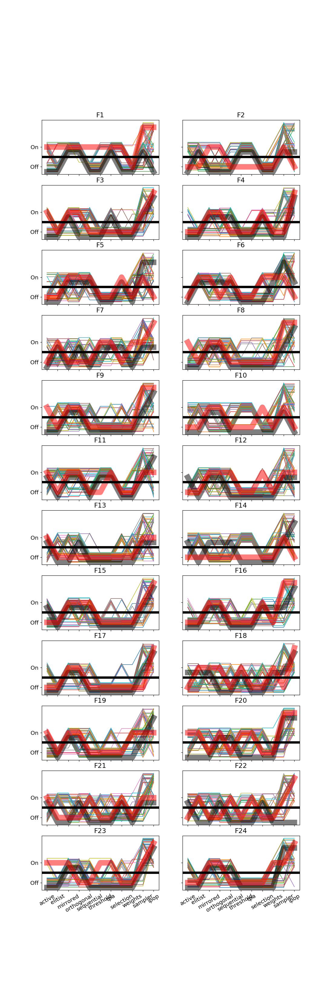

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in double_scalars


In [191]:
# plt.figure(figsize=(20,40))
fig, ax = plt.subplots(12,2,figsize=(10,30), sharex=True, sharey=True)
ax = ax.flatten()
# irace_idx = 0
for fid in [i+1 for i in range(24)]:
    data_fx = pd.read_csv(f"{Data_loc}mipego/F{fid}_one", index_col=0)
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    erts_fx = []
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    configs = np.argsort(erts_fx)[:50]
    colors = ['r','g','b']

#     fig, ax = plt.subplots(1,1,figsize=(10,6))
    ax[fid-1].set_title(f"F{fid}")
    ax[fid-1].set_xticks(range(11))
    ax[fid-1].set_xticklabels(conf_names[:11])
    ax[fid-1].set_yticks([0.5,2.5])
    ax[fid-1].set_yticklabels(["Off","On"])


    #     plt.figure(figsize=(20,10))
    #     plt.title(f"F{fid}: Combined module activation for part 1")
    for i in range(len(configs)):
        ax[fid-1].plot([2*j +i/50 for j in intToRepr(int(configs[i]))[:11]],alpha=1,lw=1)
    #     plt.xticks(range(10),conf_names[:10])
    #     plt.show()
    idx = np.argmin(data_fx["fitness"])
    ax[fid-1].plot([2*data_fx["d0"][idx], 2*data_fx["d1"][idx], 2*data_fx["d2"][idx], 2*data_fx["d3"][idx], 2*data_fx["d4"][idx], 2*data_fx["d5"][idx], 2*data_fx["d6"][idx], 2*data_fx["d7"][idx], 2*data_fx["d8"][idx], 2*data_fx["d9"][idx], 2*data_fx["d10"][idx]]
                   ,lw=12, color='k', alpha=0.5)
#     if fid != 5 and fid != 20:
    ax[fid-1].plot([0.5+2*x for x in irace_vals[fid-1][4:]],lw=12, color='r', alpha=0.5 )
#     irace_idx = irace_idx + 1
    #     plt.figure(figsize=(20,10))
    #     plt.title(f"F{fid}: Combined module activation for part 2")
    for tick in ax[fid-1].get_xticklabels():
        tick.set_rotation(30)
    #     plt.xticks(range(10),conf_names[:10])
    #     plt.show()
    ax[fid-1].axhline(1.5,color='k',lw=5)
fig.subplots_adjust()
fig.show()

## Comparing MIP-EGO and irace

In [398]:
powers = np.round(np.linspace(2, -8, 51), decimals=1)
target_values = np.power([10]*51, powers)
target_strs = [f"10e{x}" for x in powers]
target_strs[50]
targets_per_fid = [target_strs[x-1] for x in np.load("targets.npy")]

In [91]:
best_statics = []
best_mip_ego = []
best_static_confs = []
mip_ego_confs = []
for fid in [i+1 for i in range(24)]:
    data_fx = pd.read_csv(f"{Data_loc}mipego/F{fid}_one", index_col=0)
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    erts_fx = []
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    best_statics.append(np.min(erts_fx))
    best_static_confs.append(np.argmin(erts_fx))
    best_mip_ego.append(np.min(data_fx["fitness"]))
#     print(np.min(erts_fx),np.min(data_fx["fitness"]))
    idx = np.argmin(data_fx["fitness"])
#     print(intToRepr(np.argmin(erts_fx)))
    mip_ego_confs.append(reprToInt([data_fx["d0"][idx], data_fx["d1"][idx], data_fx["d2"][idx], data_fx["d3"][idx], data_fx["d4"][idx], data_fx["d5"][idx], data_fx["d6"][idx], data_fx["d7"][idx], data_fx["d8"][idx], data_fx["d9"][idx], data_fx["d10"][idx]]))
 


c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in double_scalars


<IPython.core.display.Javascript object>


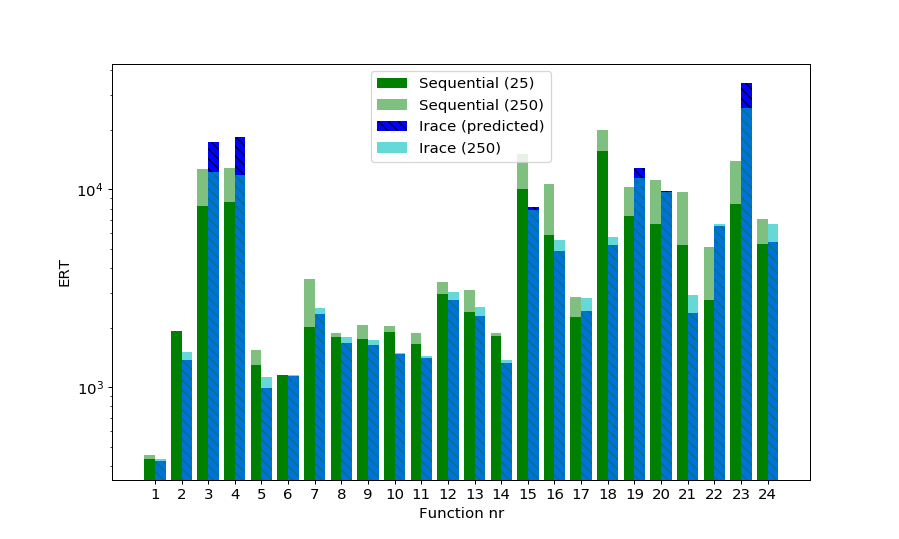

In [469]:
plt.figure(figsize=(10,6))
plt.bar([i-0.2 for i in range(24)], def_with_params_pred, label="Sequential (25)",width=0.4, color='g')
plt.bar([i-0.2 for i in range(24)], def_with_params, label="Sequential (250)",width=0.4, alpha=0.5, color='g')
plt.bar([i+0.2 for i in range(24)], irace_ert_25, label="Irace (predicted)",width=0.4, color='b', hatch='\\\\\\')
plt.bar([i+0.2 for i in range(24)], irace_250, alpha=0.6, label="Irace (250)",width=0.4, color='c')
# plt.bar([i+0.2 for i in range(24)], best_mip_ego, label="MIP-EGO (25)",width=0.4, color='r', hatch='///')
# plt.bar([i+0.2 for i in range(24)], mip_ego_erts_250, alpha=0.5, label="MIP-EGO (250)",width=0.4, color='r')

# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function nr")
plt.xticks(range(24),[i+1 for i in range(24)])
plt.savefig("irace_one_search_var2.pdf")
# plt.savefig("MIP_EGO_one_search_var2.pdf")

plt.show()

<IPython.core.display.Javascript object>


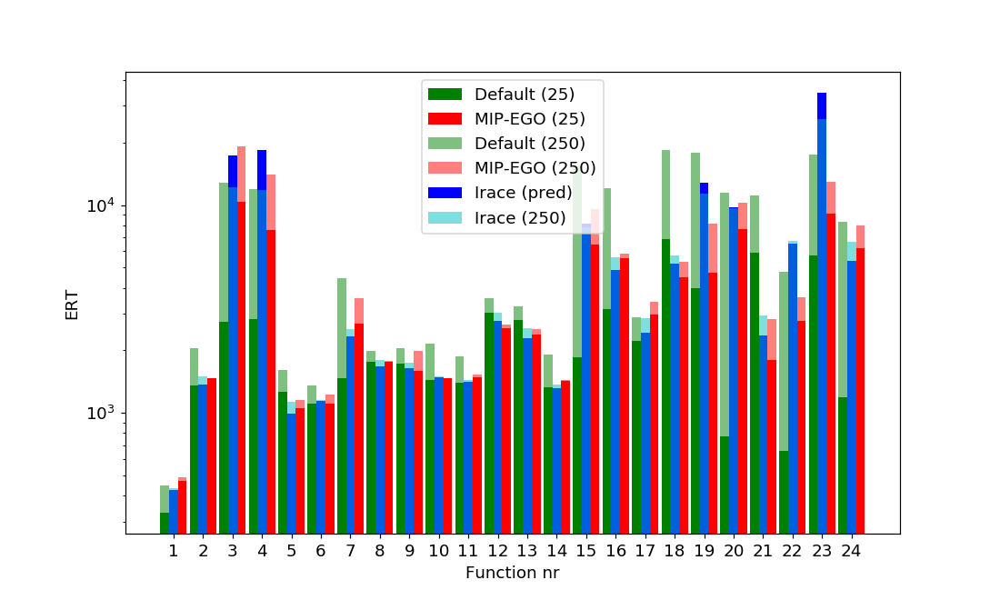

In [186]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], best_statics, label="Default (25)",width=0.3, color='g')
plt.bar([i+0.3 for i in range(24)], best_mip_ego, label="MIP-EGO (25)",width=0.3, color='r')
plt.bar([i-0.3 for i in range(24)], def_erts_250, label="Default (250)",width=0.3, alpha=0.5, color='g')
plt.bar([i+0.3 for i in range(24)], mip_ego_erts_250, alpha=0.5, label="MIP-EGO (250)",width=0.3, color='r')
plt.bar([i for i in range(24)], irace_ert_25, label="Irace (pred)",width=0.3, color='b')
plt.bar([i for i in range(24)], irace_250, label="Irace (250)",width=0.3, alpha=0.5, color='c')

# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function ID")
plt.xticks(range(24),[i+1 for i in range(24)])
plt.savefig("irace_vs_MIP_EGO_one_search.pdf")
plt.show()

In [90]:
def_erts_250 = np.load("default_erts_per_fid.npy")
mip_ego_erts_250 = np.load("mip_ego_erts_per_fid.npy")

In [194]:
common_fid_mip = []
common_fid_irace = []

impr_fid = []
for fid in [i+1 for i in range(24)]:
    data_fx = pd.read_csv(f"{Data_loc}mipego/F{fid}_one", index_col=0)
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    erts_fx = []
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    configs = np.argsort(erts_fx)[:50]
    idx = np.argmin(data_fx["fitness"])
    impr_fid.append(1-np.min(data_fx["fitness"])/np.min(erts_fx))
    commonality = 0
    for j in range(11):
        temp = 0
        for k in configs:
            temp += (intToRepr(k)[j] == data_fx[f"d{j}"][idx])
        commonality = temp + commonality
    commonality = commonality/550
    common_fid_mip.append(commonality)
    commonality = 0
    for j in range(11):
        temp = 0
        for k in configs:
            temp += (intToRepr(k)[j] == irace_vals[fid-1][4+j])
        commonality = temp + commonality
    commonality = commonality/550
    common_fid_irace.append(commonality)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in double_scalars


In [67]:
[(x,y,1-w/v) for x,y,w,v in zip(common_fid_,impr_fid,mip_ego_erts_250,def_erts_250)]

[(0.58, -0.43398058252427174, -0.08971240520818435),
 (0.62, -0.08869699397608244, 0.2960101523439107),
 (0.62, -2.758429877952433, -0.49348250624440704),
 (0.6, -1.6723804723773004, -0.1767955213786081),
 (1.0, 0.16913225877677174, 0.28538821877846865),
 (0.76, -0.004121624064499896, 0.09561070168491848),
 (0.74, -0.8283166109253066, 0.19425362752376907),
 (0.58, -0.0015411114132899417, 0.10641625020151535),
 (0.48, 0.08074534161490687, 0.030289277861675568),
 (0.98, -0.02229520973084309, 0.3221024258760108),
 (0.86, -0.054563123445851236, 0.18669971792460893),
 (1.0, 0.15541185200890484, 0.2560446262017507),
 (0.62, 0.14522240173860812, 0.22337075101936044),
 (1.0, -0.06845273931366647, 0.25115682632125047),
 (0.72, -2.5052215315529947, 0.38015160014194893),
 (0.88, -0.7688967881173032, 0.5127953973999034),
 (0.48, -0.3484447984936814, -0.18309282004142058),
 (0.84, 0.34752220295338687, 0.7110607862167166),
 (0.8, -0.18339308245378616, 0.5444979236856254),
 (0.92, -8.962004892520689,

<IPython.core.display.Javascript object>


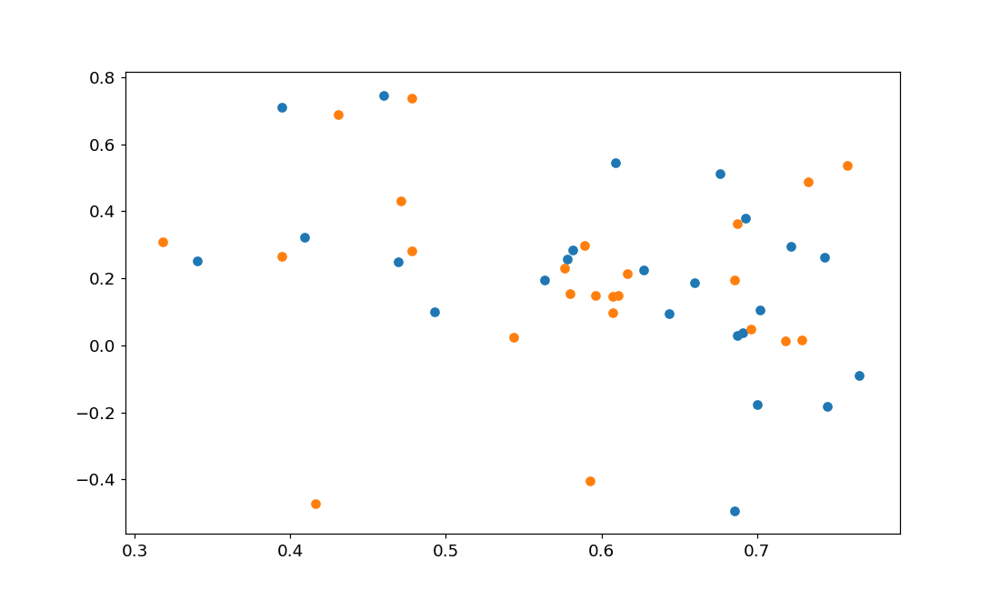

In [196]:
plt.figure(figsize=(10,6))
plt.scatter(common_fid_mip,[1-w/v for w,v in zip(mip_ego_erts_250,def_erts_250)])
plt.scatter(common_fid_irace,[1-w/v for w,v in zip(irace_250,def_erts_250)])

<IPython.core.display.Javascript object>


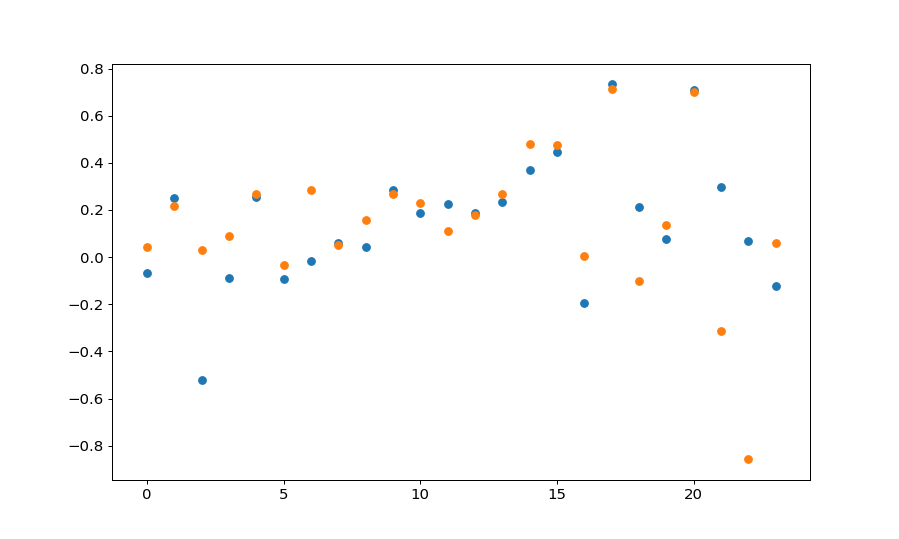

In [365]:
plt.figure(figsize=(10,6))
plt.scatter(range(24),[1-w/v for w,v in zip(mip_ego_erts_250,def_with_params)])
plt.scatter(range(24),[1-w/v for w,v in zip(irace_250,def_with_params)])


In [95]:
np.mean([1-w/v for w,v in zip(mip_ego_erts_250,def_erts_250)]),np.median([1-w/v for w,v in zip(mip_ego_erts_250,def_erts_250)])

(0.20199813127966346, 0.2359634493788786)

In [96]:
np.sum([w<v  for w,v in zip(mip_ego_erts_250,def_erts_250)])

20

In [89]:
irace_vals = []
irace_vals.append([1, 0.0175, 0.0043, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2])
irace_vals.append([2, 0.1018, 0.5909, 0.2367, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0])
irace_vals.append([3, 0.1711, 0.5482, 0.1003, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 2])
irace_vals.append([4, 0.0475, 0.7739, 0.0776, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 2])
irace_vals.append([5, 0.2435, 0.3396, 0.143, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0])
irace_vals.append([6, 0.0916, 0.6798, 0.0003, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0])
irace_vals.append([7, 0.1538, 0.7346, 0.0636, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 2])
irace_vals.append([8, 0.1456, 0.5658, 0.0814, 1, 0, 1, 1, 0, 0, 0, 0, 0, 2, 2])
irace_vals.append([9, 0.1234, 0.5201, 0.0925, 1, 0, 1, 1, 0, 0, 0, 0, 0, 2, 2])
irace_vals.append([10, 0.1279, 0.3708, 0.1443, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0])
irace_vals.append([11, 0.0212, 0.2419, 0.2576, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1])
irace_vals.append([12, 0.092, 0.4358, 0.0881, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1])
irace_vals.append([13, 0.0809, 0.2569, 0.1579, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1])
irace_vals.append([14, 0.1019, 0.4212, 0.202, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0])
irace_vals.append([15, 0.122, 0.5868, 0.0711, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 2])
irace_vals.append([16, 0.0281, 0.1776, 0.0409, 0, 0, 1, 1, 0, 0, 0, 1, 0, 2, 2])
irace_vals.append([17, 0.0527, 0.3392, 0.0474, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 2])
irace_vals.append([18, 0.0383, 0.3115, 0.004, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 2])
irace_vals.append([19, 0.1151, 0.4718, 0.2221, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1])
irace_vals.append([20, 0.1023, 0.4994, 0.0444, 1, 1, 0, 1, 0, 1, 1, 0, 0, 2, 2])
irace_vals.append([21, 0.1919, 0.5932, 0.174, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1])
irace_vals.append([22, 0.0895, 0.6451, 0.0908, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 2])
irace_vals.append([23, 0.0542, 0.7563, 0.0499, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 2])
irace_vals.append([24, 0.052, 0.5011, 0.0245, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 2])

In [88]:
irace_ert_25 = []
irace_ert_25.append(425.3760000)
irace_ert_25.append(1368.075829)
irace_ert_25.append(17388.55656)
irace_ert_25.append(18328.40201)
irace_ert_25.append(992.6425993)
irace_ert_25.append(1138.934579)
irace_ert_25.append(2333.934783)
irace_ert_25.append(1668.834043)
irace_ert_25.append(1633.873016)
irace_ert_25.append(1480.088889)
irace_ert_25.append(1405.278008)
irace_ert_25.append(2756.713287)
irace_ert_25.append(2281.227907)
irace_ert_25.append(1319.634286)
irace_ert_25.append(8118.502041)
irace_ert_25.append(4881.351111)
irace_ert_25.append(2433.669065)
irace_ert_25.append(5206.218009)
irace_ert_25.append(12770.76000)
irace_ert_25.append(9771.819820)
irace_ert_25.append(2365.352000)
irace_ert_25.append(6529.352041)
irace_ert_25.append(34607.21693)
irace_ert_25.append(5393.174468)

In [98]:
irace_to_rep = [(x[0],reprToInt(x[4:]),x[1],x[2],x[3]) for x in irace_vals]

In [181]:
irace_rep2 = [irace_to_rep[4], irace_to_rep[19]]
irace_rep2

[(5, 1029, 0.2435, 0.3396, 0.143), (20, 3860, 0.1023, 0.4994, 0.0444)]

In [182]:
np.save("rerun_confs_irace2", irace_rep2)

In [100]:
irace_250 = np.load("irace_erts_per_fid_partial.npy")
irace_250_p2 = np.load("irace_erts_per_fid_partial2.npy")

In [101]:
irace_250 = np.insert(irace_250, 4, irace_250_p2[0])
irace_250 = np.insert(irace_250, 19, irace_250_p2[1])

In [163]:
np.mean([1-min(w,v)/max(v,w)  for w,v in zip(def_with_params,def_with_params_pred)])

0.23199412041311987

In [147]:
pred_err_mip = [1-min(w,v)/max(v,w)  for w,v in zip(mip_ego_erts_250,best_mip_ego)]
pred_err_seq = [1-min(w,v)/max(v,w)  for w,v in zip(def_with_params,def_with_params_pred)]
pred_err_ira = [1-min(w,v)/max(v,w)  for w,v in zip(irace_250,irace_ert_25)]
# pred_err_def = [1-min(w,v)/max(v,w)  for w,v in zip(def_erts_250,best_statics)]

In [148]:
np.mean(pred_err_mip),np.mean(pred_err_seq), np.mean(pred_err_ira)

(0.17400321225437496, 0.23199412041311987, 0.10646630665618617)

<IPython.core.display.Javascript object>


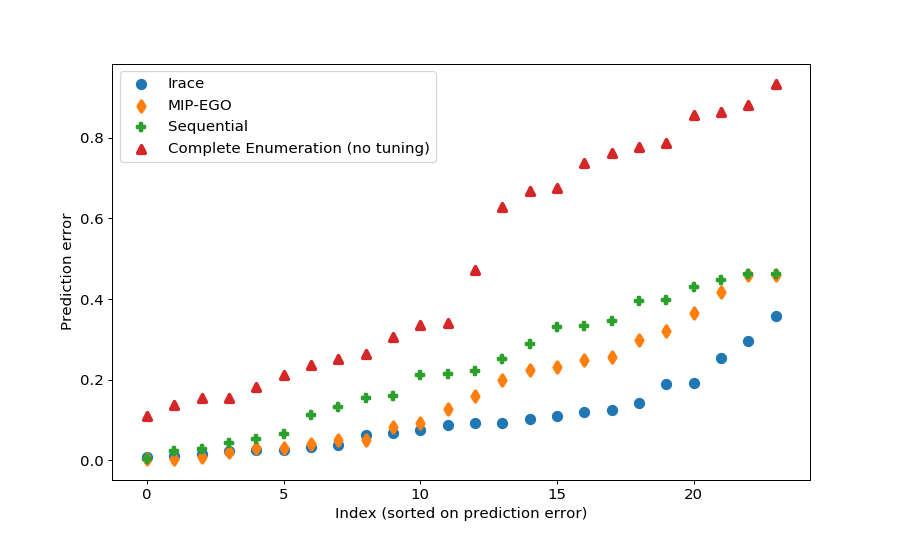

In [415]:
plt.figure(figsize=(10,6))
plt.scatter(range(24),np.sort([1-min(w,v)/max(v,w)  for w,v in zip(irace_250,irace_ert_25)]), label="Irace", linewidth=3)
plt.scatter(range(24),np.sort([1-min(w,v)/max(v,w)  for w,v in zip(mip_ego_erts_250,best_mip_ego)]), label="MIP-EGO", marker='d', linewidth=3)
plt.scatter(range(24),np.sort([1-min(w,v)/max(v,w)  for w,v in zip(def_with_params,def_with_params_pred)]), label="Sequential", linewidth=2, marker='P')
plt.scatter(range(24),np.sort([1-min(w,v)/max(v,w)  for w,v in zip(def_erts_250,best_statics)]), label="Complete Enumeration (no tuning)", marker='^', linewidth=3)

plt.legend()
plt.ylabel("Prediction error")
plt.xlabel("Index (sorted on prediction error)")
plt.savefig("Prediction_error_onesearch_var2.pdf")
# plt.yscale('log')

In [249]:
mip_ego_static_rerun = []
for fid in range(24):
    fid = fid+1
#     try:
    erts_fx = []
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (20-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    config = np.argsort(erts_fx)[0]
    print(config)
    data_mip = pd.read_csv(f"{Data_loc}mipego/F{fid}_best_mip_{config}", index_col=0)
    idx = np.argmin(data_mip['fitness'])
    mip_ego_static_rerun.append((fid,conf,data_mip['c_1'][idx],data_mip['c_c'][idx],data_mip['c_mu'][idx]))
#     except:
#         print(fid)
np.save("rerun_mip_static_best", mip_ego_static_rerun)

921


TypeError: append() takes exactly one argument (5 given)

In [81]:
num_uniques = []
for fid in [i+1 for i in range(24)]:
    data_fx = pd.read_csv(f"{Data_loc}mipego/F{fid}_one", index_col=0)
    confs = []
    for idx in range(1000):
        confs.append(reprToInt([data_fx["d0"][idx], data_fx["d1"][idx], data_fx["d2"][idx], data_fx["d3"][idx], data_fx["d4"][idx], data_fx["d5"][idx], data_fx["d6"][idx], data_fx["d7"][idx], data_fx["d8"][idx], data_fx["d9"][idx], data_fx["d10"][idx]]))
    num_uniques.append(len(np.unique(confs[250:])))

In [258]:
perc_uniques_irace = [0.02311192, 0.03900524, 0.02315841, 0.02293052, 0.03607880, 0.03231903, 0.02804177, 0.02110358, 0.02402402, 0.02622254, 0.01936946, 0.02181128, 0.02123764, 0.03436356, 0.02071197, 0.03218449, 0.02227134, 0.02263701, 0.01670031, 0.02182741, 0.02362031, 0.02386364, 0.03792896, 0.02986591]

In [80]:
nr_unique_irace = [127, 149,  94, 100, 152, 171, 239, 109,  96, 111,  94,  92, 116, 169,  96, 127, 131, 114,  91,  86, 107,  84, 126, 147]

In [167]:
np.mean(nr_unique_irace)

122.0

<IPython.core.display.Javascript object>


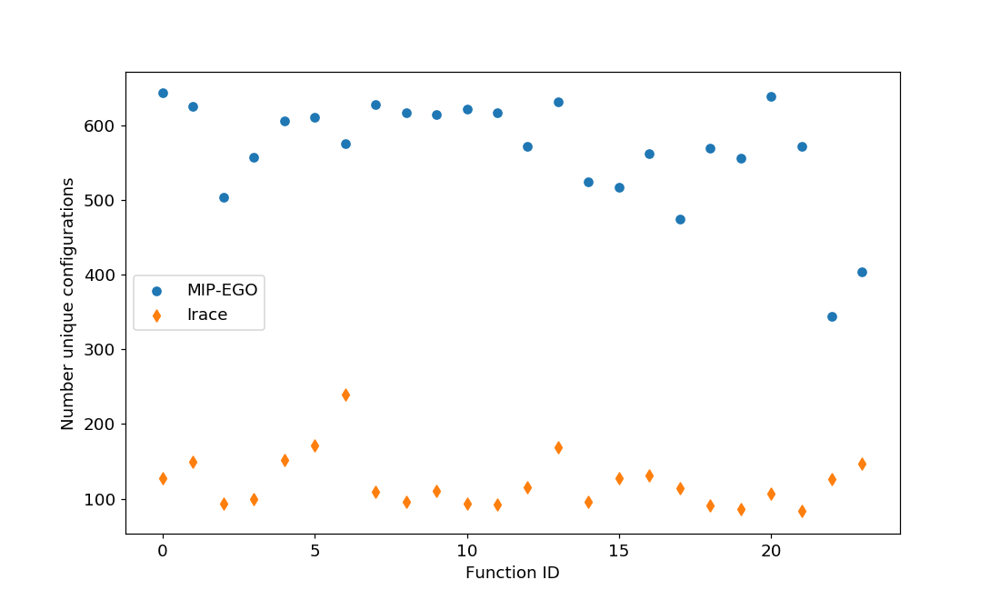

In [82]:
plt.figure(figsize=(10,6))
plt.scatter(range(24), [x for x in num_uniques], label="MIP-EGO")
plt.scatter(range(24), nr_unique_irace, label="Irace", marker='d')
plt.xlabel("Function ID")
plt.ylabel("Number unique configurations")
plt.legend()
plt.savefig("Irace_mipego_number_confs.pdf")
plt.show()

In [275]:
np.mean([x/750 for x in num_uniques]),np.mean(perc_uniques_irace)

(0.7543888888888889, 0.026016213333333333)

In [276]:
nr_max_perc_irace = [0.8020018, 0.8337696, 0.8716433, 0.4505847, 0.8193686, 0.8748819, 0.8454769, 0.8377541, 0.6091091, 0.9314907, 0.8473109, 0.9016121, 0.8564628, 0.8607157, 0.5044229, 0.8758236, 0.9214553, 0.8989277, 0.3987888, 0.7657360, 0.8467991, 0.5803977, 0.8585190, 0.8644860]

In [278]:
np.mean(nr_max_perc_irace)

0.7857307625000001

<IPython.core.display.Javascript object>


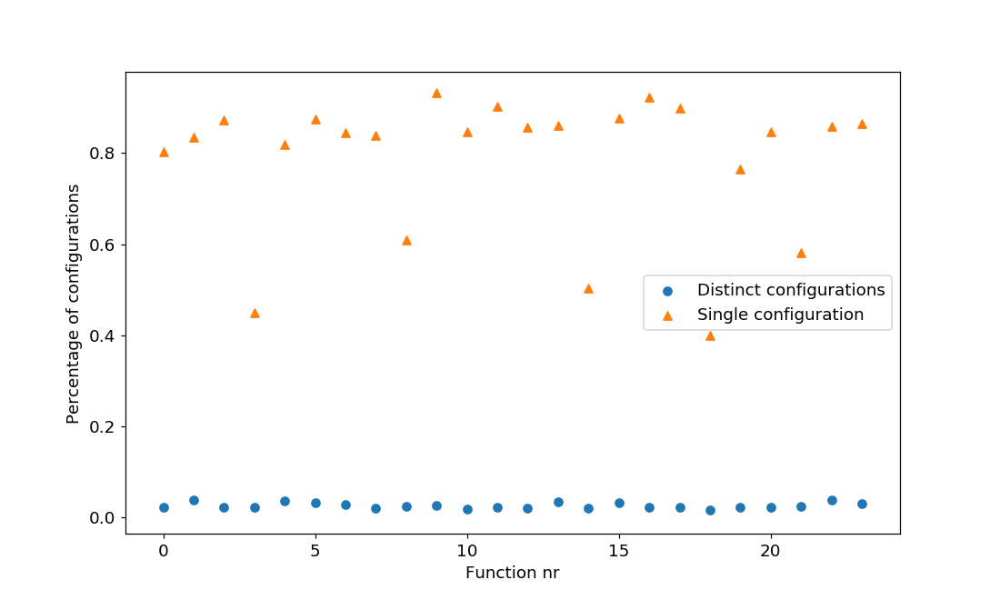

In [279]:
plt.figure(figsize=(10,6))
plt.scatter(range(24), perc_uniques_irace, label="Distinct configurations")
plt.scatter(range(24), nr_max_perc_irace, label="Single configuration", marker='^')
# plt.scatter(range(24), [x/750 for x in num_uniques], label="MIP-EGO", marker='d')
plt.xlabel("Function nr")
plt.ylabel("Percentage of configurations")
plt.legend()
# plt.savefig("Irace_mipego_perc_confs.pdf")
plt.show()

In [391]:
# num_uniques = []
# for fid in [i+1 for i in range(24)]:
fid = 12
data_fx = pd.read_csv(f"{Data_loc}mipego/F{fid}_one", index_col=0)
confs = []
for idx in range(1000):
    confs.append(reprToInt([data_fx["d0"][idx], data_fx["d1"][idx], data_fx["d2"][idx], data_fx["d3"][idx], data_fx["d4"][idx], data_fx["d5"][idx], data_fx["d6"][idx], data_fx["d7"][idx], data_fx["d8"][idx], data_fx["d9"][idx], data_fx["d10"][idx]]))
confs
        #     num_uniques.append(len(np.unique(confs[250:])))

[3436,
 4572,
 340,
 455,
 2541,
 800,
 3510,
 3673,
 1597,
 4532,
 2744,
 1296,
 2834,
 1913,
 247,
 2132,
 3152,
 237,
 967,
 361,
 606,
 2467,
 2763,
 831,
 2357,
 4163,
 3765,
 1886,
 4118,
 4219,
 3427,
 4130,
 4005,
 51,
 4583,
 3830,
 474,
 2050,
 1924,
 996,
 2951,
 2812,
 2769,
 4034,
 3692,
 1231,
 3242,
 1482,
 219,
 2061,
 2616,
 3692,
 1401,
 676,
 806,
 479,
 2027,
 1404,
 3251,
 312,
 903,
 356,
 1532,
 990,
 2336,
 1553,
 4512,
 1002,
 1361,
 2676,
 1710,
 4375,
 3218,
 3806,
 2513,
 2723,
 3944,
 1833,
 2462,
 1586,
 2059,
 4542,
 2990,
 4442,
 1175,
 2630,
 4146,
 664,
 2428,
 296,
 2773,
 2284,
 3187,
 1120,
 2524,
 4011,
 294,
 3336,
 3154,
 531,
 334,
 3277,
 834,
 3242,
 2671,
 184,
 981,
 2446,
 2071,
 4027,
 162,
 3575,
 4532,
 3984,
 3238,
 3887,
 4563,
 2925,
 2221,
 1942,
 2250,
 3840,
 339,
 1766,
 1084,
 2178,
 3661,
 4202,
 1452,
 4360,
 2738,
 3324,
 2374,
 3579,
 1060,
 4210,
 797,
 3140,
 260,
 1232,
 2774,
 1621,
 2591,
 1723,
 2011,
 3474,
 1387,
 373

In [396]:
confs_irace = pd.read_csv("Confs_F12", index_col=0)["x"]

In [402]:
len(np.sort(np.array(confs_irace)))

array([ 292,  292,  292, ..., 4490, 4490, 4499], dtype=int64)

In [405]:
distr_0 = np.zeros((11,))
distr_1 = np.zeros((11,))

for conf in np.unique(confs_irace):
    conf_rep = intToRepr(conf)
    for i in range(11):
        distr_0[i] += conf_rep[i]

In [407]:
distr_0

array([ 36.,  52.,  71.,  82.,  44.,   8.,  11.,  43.,  21.,  95., 122.])

<IPython.core.display.Javascript object>


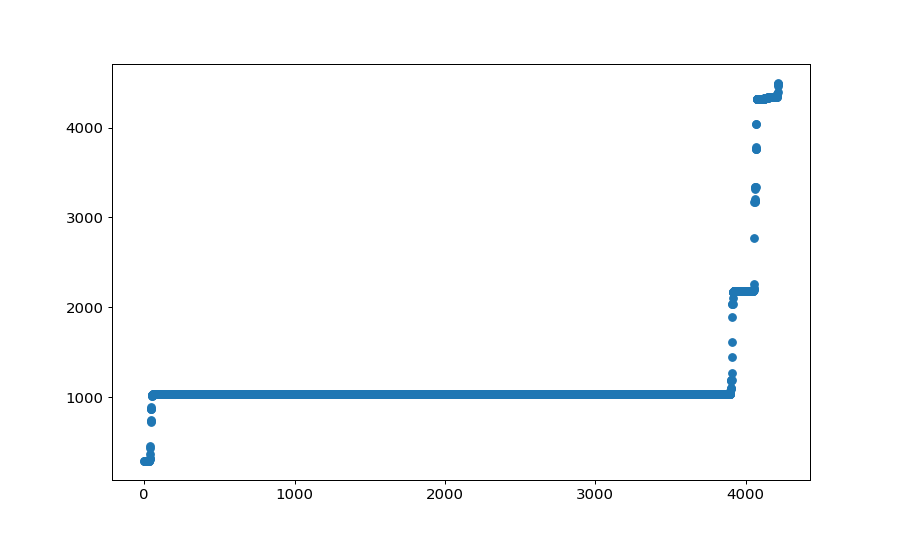

In [403]:
plt.figure(figsize=(10,6))
# plt.scatter(range(1000),np.sort(confs))
plt.scatter(range(len(confs_irace)), np.sort(np.array(confs_irace)))

In [146]:
statics_conf = np.load("rerun_confs_def.npy")
statics_conf_param = []
def_with_params_pred = []
for (fid,conf) in statics_conf:
    data_mip = pd.read_csv(f"{Data_loc}mipego/F{fid}_best_mip_{conf}", index_col=0)
    idx = np.argmin(data_mip['fitness'])
    def_with_params_pred.append(data_mip['fitness'][idx])
    statics_conf_param.append((fid, conf, data_mip['c_1'][idx], data_mip['c_c'][idx], data_mip['c_mu'][idx]))

In [286]:
np.save("rerun_statics_param",statics_conf_param)

In [96]:
def_with_params = np.load("def_with_params.npy")

<IPython.core.display.Javascript object>


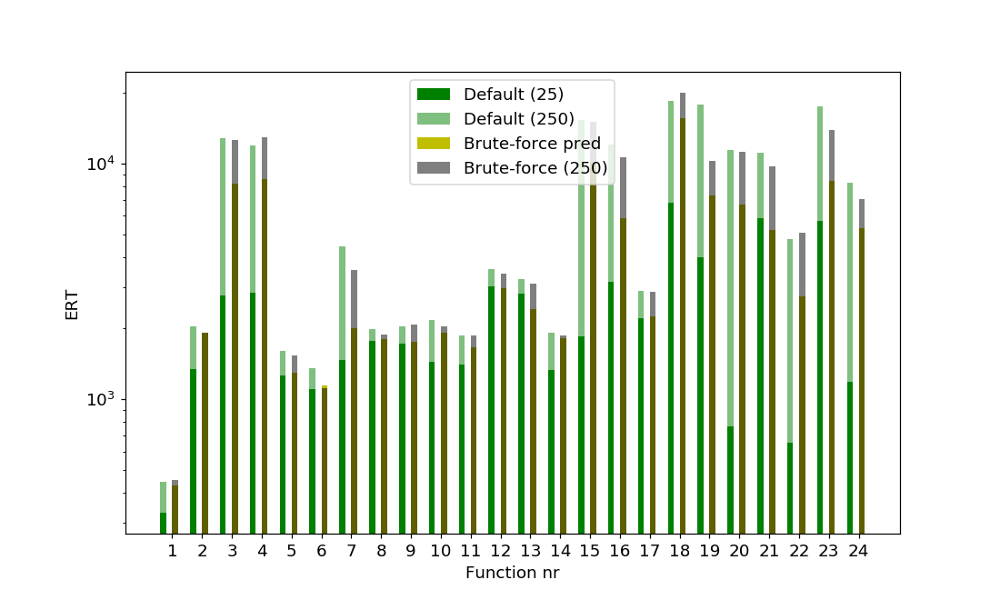

In [294]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], best_statics, label="Default (25)",width=0.2, color='g')
# plt.bar([i+0.3 for i in range(24)], best_mip_ego, label="MIP-EGO (25)",width=0.2, color='r')
plt.bar([i-0.3 for i in range(24)], def_erts_250, label="Default (250)",width=0.2, alpha=0.5, color='g')
# plt.bar([i+0.3 for i in range(24)], mip_ego_erts_250, alpha=0.5, label="MIP-EGO (250)",width=0.2, color='r')
# plt.bar([i-0.1 for i in range(24)], irace_ert_25, label="Irace (pred)",width=0.2, color='b')
# plt.bar([i-0.1 for i in range(24)], irace_250, label="Irace (250)",width=0.2, alpha=0.5, color='c')
plt.bar([i+0.1 for i in range(24)], def_with_params_pred, label="Brute-force pred",width=0.2, color='y')
plt.bar([i+0.1 for i in range(24)], def_with_params, label="Brute-force (250)",width=0.2, alpha=0.5, color='k')
# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function nr")
plt.xticks(range(24),[i+1 for i in range(24)])
# plt.savefig("irace_vs_MIP_EGO_one_search.pdf")
plt.show()

<IPython.core.display.Javascript object>


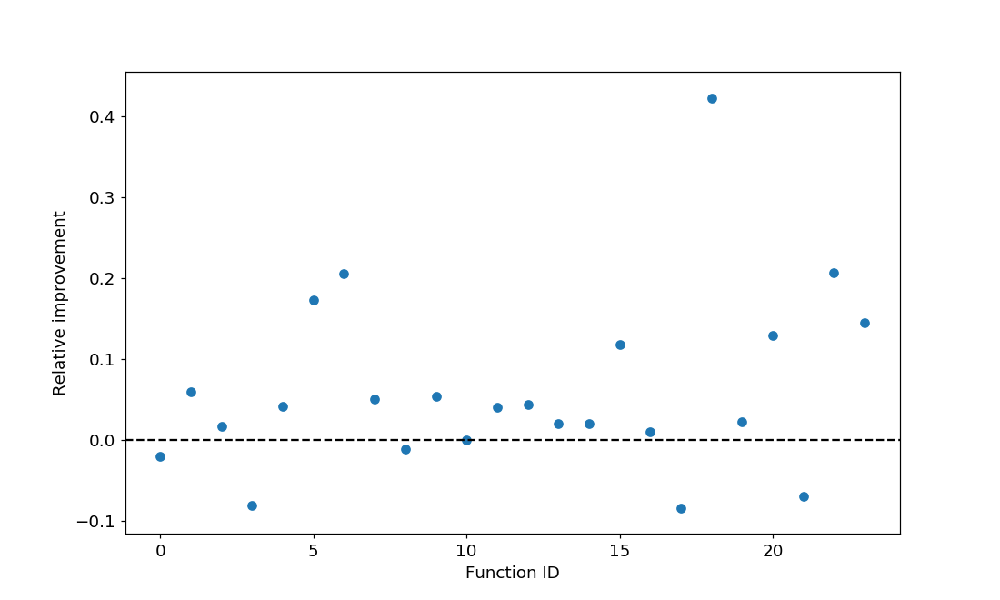

In [227]:
plt.figure(figsize=(10,6))
# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(mip_ego_erts_250,def_with_params)]))
# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(irace_250,def_with_params)]))
plt.scatter(range(24),[1-w/v for w,v in zip(def_with_params,def_erts_250)], label="Hyperparameter tuning")
# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(def_with_params_pred,best_statics)]))
# plt.scatter(range(24),[1-w/v for w,v in zip(def_with_params_pred,def_erts_250)])
# plt.scatter(range(24),np.sort([x/100 for x in [1.4,14.6,1.4,6.3,24,21.3,13.5,0.8,-0.1,11.5,9.4,6,-8.9,3.3,-3.7,-3.7,3.7,-19.2,12.8,9.6,50.9,20.6,4.8,-9.4]]), label="Configuration Switching", marker='^', linewidth=3)
plt.xlabel("Function ID")
plt.ylabel("Relative improvement")
# plt.legend()
# plt.legend()
plt.axhline(0,color='k',ls='--')
# plt.savefig("Brute-force_perc_impr.pdf")
plt.show()

In [173]:
# np.sum([w<=v for w,v in zip(def_with_params,def_erts_250)])
# print(np.sum([w<=v for w,v in zip(irace_250,def_with_params)]))
# print(np.sum([w<=v for w,v in zip(irace_250,def_with_params)]))
# print(np.sum([w<=v for w,v in zip(irace_250,mip_ego_erts_250)]))
# print(np.mean([1-w/v for w,v in zip(irace_250,def_with_params)]))

print(np.sum([u == min(u,w,v) for u,w,v in zip(mip_ego_erts_250,irace_250,def_with_params)]))
print(np.sum([w == min(u,w,v) for u,w,v in zip(mip_ego_erts_250,irace_250,def_with_params)]))
print(np.sum([v == min(u,w,v) for u,w,v in zip(mip_ego_erts_250,irace_250,def_with_params)]))


10
13
1


<IPython.core.display.Javascript object>


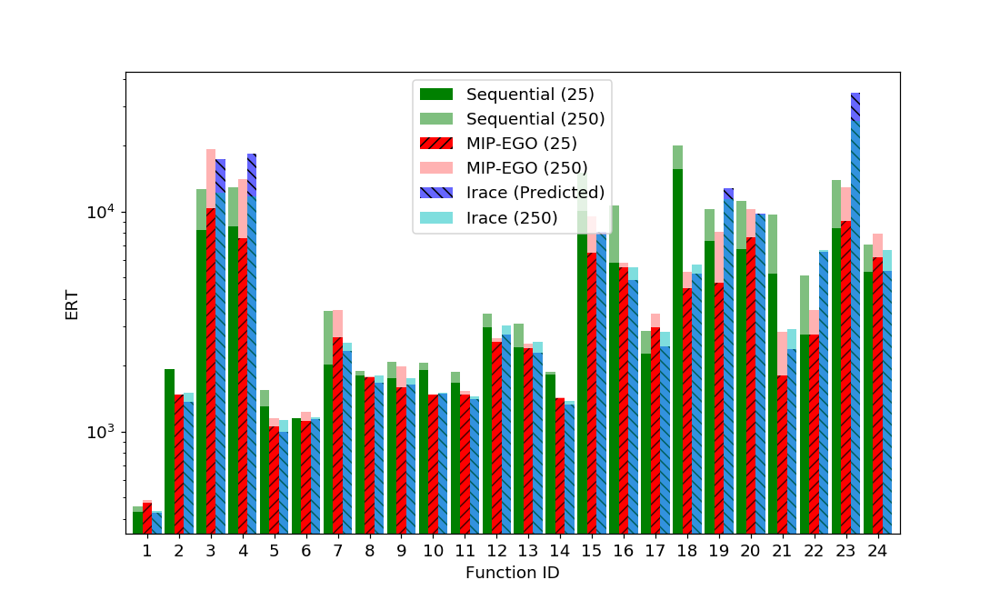

In [365]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], def_with_params_pred, label="Sequential (25)",width=0.3, color='g')
plt.bar([i-0.3 for i in range(24)], def_with_params, label="Sequential (250)",width=0.3, alpha=0.5, color='g')
plt.bar([i for i in range(24)], best_mip_ego, label="MIP-EGO (25)",width=0.3, color='r', hatch='///')
plt.bar([i for i in range(24)], mip_ego_erts_250, alpha=0.3, label="MIP-EGO (250)",width=0.3, color='r')
plt.bar([i+0.3 for i in range(24)], irace_ert_25, label="Irace (Predicted)",width=0.3, color='b', hatch='\\\\\\', alpha=0.6)
plt.bar([i+0.3 for i in range(24)], irace_250, label="Irace (250)",width=0.3, alpha=0.5, color='c')

# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.xlim(-0.7,23.7)
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function ID")
plt.xticks(range(24),[i+1 for i in range(24)])
plt.savefig("irace_vs_MIP_EGO_one_search_var2.pdf")
plt.show()

## Impact of Variance

Full runtime data from F1

### Loading data

In [204]:
def load_data_f1():
    full_25_run_data = []
    full_25_run_data.append([400,376,496,472,488,520,528,328,408,568,440,504,424,424,448,568,368,528,464,488,544,560,472,496,504])
    full_25_run_data.append([472,472,448,536,392,408,488,480,608,576,464,424,416,448,440,456,504,448,384,424,384,480,456,496,488])
    full_25_run_data.append([504,464,456,440,512,528,600,368,496,536,432,512,352,528,440,584,448,392,480,472,544,456,432,400,544])
    full_25_run_data.append([592,496,416,544,432,496,512,472,456,464,496,480,432,456,616,584,384,488,496,376,424,440,400,376,456])
    full_25_run_data.append([320,424,368,440,360,456,408,400,440,496,376,480,352,344,424,488,336,528,496,464,464,464,512,456,424])
    full_25_run_data.append([368,408,384,496,408,592,368,376,432,424,456,400,488,552,432,464,488,384,416,384,440,480,408,496,488])
    full_25_run_data.append([440,392,440,424,408,504,472,528,432,592,424,496,504,464,464,424,528,488,456,416,528,488,488,456,432])
    full_25_run_data.append([560,416,440,440,624,560,576,528,496,512,528,496,464,368,488,552,560,464,584,432,584,416,520,520,576])
    full_25_run_data.append([456,448,464,488,496,552,432,456,456,592,624,472,480,472,464,576,528,456,416,416,528,448,424,352,344])
    full_25_run_data.append([416,448,416,512,496,552,424,376,480,560,488,440,496,440,440,424,400,528,440,336,464,456,440,496,488])
    full_25_run_data.append([488,464,440,464,472,504,520,456,520,448,520,384,448,416,512,488,440,472,408,464,456,472,416,464,472])
    full_25_run_data.append([344,424,456,512,496,432,424,536,472,432,528,368,528,416,424,504,408,392,352,480,432,424,464,464,400])
    full_25_run_data.append([448,352,488,424,424,464,432,560,424,456,496,584,440,424,504,496,400,552,464,392,368,608,384,344,440])
    full_25_run_data.append([360,336,392,336,352,400,368,392,408,336,336,344,376,392,328,408,384,352,384,352,360,344,336,400,384])
    full_25_run_data.append([568,416,424,536,536,600,544,456,616,376,440,480,392,360,528,544,440,480,376,576,440,480,544,520,456])

    full_250_run_data = []
    full_250_run_data.append([400,376,496,472,488,480,440,424,408,424,504,408,496,400,368,528,480,456,440,408,472,416,520,408,616,472,488,392,432,560,408,464,448,472,520,480,480,424,472,416,424,432,440,448,416,464,592,576,560,528,520,528,328,408,568,592,440,464,424,456,576,368,520,528,552,704,472,416,392,408,528,584,504,504,496,496,544,528,632,616,624,536,496,512,448,456,416,384,520,512,528,464,456,488,512,608,552,512,472,528,440,504,424,424,448,448,584,440,504,392,472,432,464,600,456,464,504,560,552,424,472,584,432,592,560,584,424,416,480,600,424,464,576,424,480,568,488,544,544,488,544,664,440,504,440,408,504,432,464,616,568,368,528,464,488,488,472,464,544,552,560,480,424,392,664,528,544,536,464,392,472,560,568,576,448,448,592,520,512,400,480,536,536,480,472,552,480,464,432,544,488,464,528,408,512,496,408,528,408,512,544,560,472,496,504,464,512,408,512,448,416,488,312,368,456,504,584,384,544,400,384,616,480,512,488,576,528,544,512,408,424,552,424,472,512,544,528,432,400,536,440,536,536,440,432,576,464,520,480,488])
    full_250_run_data.append([472,472,448,536,392,464,416,440,464,360,424,472,496,488,464,368,480,448,360,392,520,432,448,424,440,416,416,488,416,336,512,352,328,384,464,464,376,424,432,424,432,424,488,480,328,440,480,488,528,480,408,488,480,608,576,472,416,488,528,408,544,456,560,560,472,456,528,560,456,464,480,432,384,464,536,352,520,504,448,552,464,464,496,408,552,504,648,520,392,480,576,448,432,376,520,504,472,400,600,560,464,424,416,448,440,488,464,472,512,424,464,488,448,456,424,440,400,408,576,488,520,440,432,576,600,424,480,416,448,480,480,440,488,448,568,496,536,440,488,416,488,576,480,392,520,504,368,536,512,400,456,504,448,384,424,488,536,416,464,392,384,416,416,448,424,496,440,464,456,432,544,520,560,440,472,472,472,456,536,464,576,464,456,440,440,496,520,472,488,528,432,560,416,448,600,496,376,464,568,480,384,480,456,496,488,496,312,488,376,560,528,456,424,472,432,544,464,392,488,464,440,480,528,400,480,456,520,432,464,400,480,376,400,496,408,520,448,392,528,504,480,360,480,536,488,480,352,528,344,600
    ])
    full_250_run_data.append([408,496,400,520,496,392,352,512,480,488,520,488,408,512,448,400,424,424,560,432,600,376,576,592,536,448,480,496,416,552,424,480,576,448,504,432,336,448,544,376,512,432,568,424,480,528,440,488,432,512,488,456,456,456,456,536,528,408,496,600,536,464,584,504,520,504,440,464,456,512,368,472,592,448,536,600,592,408,528,536,552,424,496,496,552,504,392,416,504,408,432,520,512,488,472,456,616,552,600,464,464,440,456,544,344,440,448,608,424,464,440,368,424,448,432,504,480,384,440,432,536,576,512,400,448,520,472,536,584,408,520,368,576,432,400,504,472,456,640,424,640,472,408,448,520,528,480,608,632,488,640,432,600,400,408,496,336,376,488,432,536,400,360,472,584,512,440,488,512,400,464,608,576,592,480,512,496,456,424,416,520,328,440,368,504,416,440,504,424,480,480,440,512,368,528,464,528,400,488,464,488,488,480,472,432,432,488,488,592,584,432,480,448,496,480,480,520,560,632,384,480,568,536,432,448,528,456,528,576,400,440,432,568,384,584,480,544,592,432,432,568,472,552,480,400,440,336,520,392,456
    ])
    full_250_run_data.append([456,456,472,592,384,360,472,560,424,400,472,376,496,536,408,456,480,400,424,432,448,448,440,512,456,464,464,448,416,488,384,536,352,456,416,528,472,464,400,320,416,448,456,344,424,472,368,568,504,528,480,488,456,568,504,480,488,440,408,344,424,344,512,504,432,576,520,488,424,464,448,408,392,456,536,504,384,456,536,528,488,392,400,464,480,496,512,544,520,400,504,456,480,400,544,456,560,536,536,424,424,440,504,464,440,448,488,600,520,440,448,400,408,448,496,408,488,400,480,520,464,544,608,528,552,464,504,464,512,376,376,392,424,400,456,536,472,424,384,472,440,480,424,472,488,424,416,480,512,520,480,448,496,392,368,456,464,448,472,424,440,400,392,488,520,480,424,424,440,448,464,512,512,392,448,408,560,464,432,472,584,560,440,528,416,408,464,448,544,448,472,496,384,416,440,472,544,472,488,384,344,552,456,472,464,504,472,496,544,528,440,504,416,512,544,424,496,568,488,568,528,440,496,472,472,464,448,464,464,496,520,408,464,480,336,520,400,432,456,448,384,376,448,384,616,496,496,488,320,440
    ])
    full_250_run_data.append([488,472,320,472,312,480,352,400,360,560,464,368,384,384,336,376,376,488,376,384,352,552,448,512,488,384,344,432,472,488,352,400,400,424,408,288,336,416,384,408,304,456,440,432,264,296,464,384,272,456,416,344,504,576,384,432,544,488,528,624,464,416,400,512,464,392,464,312,432,480,376,360,464,456,496,360,344,432,504,504,400,488,400,400,432,440,408,440,496,384,368,384,664,360,512,424,416,416,480,416,424,432,312,312,360,424,368,408,400,408,352,368,424,392,352,440,376,344,504,432,472,320,440,448,472,432,432,504,400,400,456,424,408,312,352,408,464,344,520,440,440,496,336,520,312,504,376,456,456,424,424,352,408,496,464,512,424,376,456,520,304,448,344,456,448,456,392,400,368,464,480,432,432,464,440,344,488,400,432,392,464,432,424,368,440,416,384,416,376,376,408,352,480,472,464,416,392,360,344,432,400,448,392,328,408,536,408,392,464,512,416,320,376,456,344,472,408,392,464,408,464,440,480,344,384,352,400,408,400,456,400,384,408,368,344,408,384,456,496,400,416,392,464,368,440,520,344,384,512,440
    ])
    full_250_run_data.append([448,384,456,464,424,576,576,448,400,376,376,392,400,360,416,464,480,472,400,392,416,432,496,304,496,472,448,392,368,376,432,424,440,408,520,400,344,488,432,352,376,520,512,320,312,304,528,408,464,472,544,376,584,552,408,416,488,408,480,376,472,512,488,488,440,520,432,568,440,456,512,400,616,472,472,472,528,480,504,528,376,576,304,424,456,504,552,488,384,408,528,448,504,408,520,440,416,512,424,376,440,384,528,504,464,512,464,424,456,448,520,424,544,456,424,384,488,344,360,488,480,416,464,496,424,440,448,408,456,448,352,360,504,456,464,496,432,440,352,504,440,560,456,384,440,432,400,416,480,536,440,400,448,344,384,352,392,400,528,432,392,480,512,464,472,496,432,448,464,352,448,424,408,456,464,528,456,504,488,456,512,368,520,536,416,480,472,496,488,480,480,448,584,568,464,448,496,504,416,400,496,432,424,424,392,408,440,416,464,488,440,480,520,440,376,424,368,456,400,392,464,440,496,480,408,424,424,472,584,392,520,456,480,480,400,400,544,528,440,472,376,408,472,464,400,368,440,464,408,416
    ])
    full_250_run_data.append([440,392,440,424,408,496,496,512,512,416,448,512,480,464,496,552,488,496,464,520,424,440,416,536,448,408,432,520,376,504,464,392,472,464,472,520,408,488,472,440,496,488,440,536,432,528,496,544,544,488,504,472,528,432,592,488,544,360,608,320,440,464,520,560,576,472,592,440,464,528,496,512,488,496,480,472,568,480,576,496,536,440,520,488,488,512,472,424,488,376,520,560,496,424,464,480,480,504,520,432,424,496,504,464,464,424,592,544,432,504,576,448,440,544,512,496,512,408,480,472,528,480,480,576,456,440,424,464,512,464,488,576,416,568,464,536,456,552,440,376,520,504,552,408,472,440,520,576,520,464,424,528,488,456,416,400,376,488,504,312,408,448,520,488,472,568,424,600,512,472,448,496,568,400,512,432,472,504,536,488,440,448,488,504,512,408,400,432,544,520,392,528,440,432,488,576,440,568,536,560,528,488,488,456,432,544,576,472,608,560,488,480,440,472,512,488,424,496,528,504,528,512,536,560,488,584,456,472,504,656,552,368,472,576,360,584,536,552,512,552,456,432,552,536,528,488,536,448,296,480
    ])
    full_250_run_data.append([432,456,480,448,392,456,424,424,352,520,488,536,464,552,400,536,544,544,432,488,424,464,464,456,496,512,376,472,432,488,488,376,528,368,464,520,464,520,440,440,432,400,464,416,480,488,496,552,400,544,480,448,480,496,496,504,480,536,512,448,608,480,512,464,408,512,512,456,552,416,496,496,480,512,456,512,456,496,496,512,488,400,504,544,456,456,496,536,496,576,464,520,456,568,568,488,544,640,560,568,440,520,520,424,424,400,480,440,504,496,552,472,456,520,336,456,472,552,504,392,400,520,536,456,528,456,440,544,560,464,488,480,480,392,392,624,536,568,560,584,576,504,488,488,480,456,440,592,560,528,528,440,504,464,584,472,496,496,472,552,504,576,400,624,448,464,488,472,424,440,568,456,576,480,488,504,496,552,504,440,464,456,520,480,496,408,472,392,544,456,464,472,544,384,520,680,456,536,576,536,464,512,424,440,632,536,448,512,552,512,416,520,448,384,456,488,472,504,456,680,528,536,640,568,624,584,528,464,512,328,496,504,520,464,560,480,600,608,480,528,552,400,544,472,488,520,496,440,488,472
    ])
    full_250_run_data.append([456,448,464,488,496,544,560,496,432,400,496,424,440,504,392,496,480,400,344,536,504,432,480,464,456,456,424,488,480,408,480,400,440,408,496,448,472,456,504,424,432,432,600,376,512,472,400,528,424,440,552,432,456,456,592,560,440,432,440,408,528,432,424,456,520,496,584,392,520,528,552,544,464,528,560,408,408,456,416,496,336,448,504,496,560,488,568,456,552,384,528,536,416,504,464,424,432,536,488,504,624,472,480,472,464,424,416,424,600,664,384,552,472,584,464,448,432,448,376,408,616,536,480,520,416,536,472,448,424,368,432,488,520,424,424,584,488,544,512,408,512,552,576,424,472,560,560,488,392,456,576,528,456,416,416,496,416,336,496,368,512,416,480,504,424,632,464,376,488,536,512,416,472,520,456,408,392,416,408,528,632,440,392,456,560,456,544,496,464,480,472,464,496,488,384,440,592,456,456,488,528,448,424,352,344,448,432,424,456,400,528,376,528,432,504,416,464,536,464,488,592,520,440,408,456,496,480,464,464,408,488,328,400,544,400,456,432,552,504,488,488,320,504,576,512,408,576,512,320,480
    ])
    full_250_run_data.append([392,448,488,600,456,488,384,416,440,408,408,480,520,440,456,408,552,376,424,424,496,400,440,424,472,416,496,408,448,416,464,440,424,520,496,400,392,448,424,376,384,448,440,432,448,448,472,496,456,496,424,528,344,488,400,416,440,400,560,416,456,400,448,448,448,528,488,400,376,520,464,392,496,456,504,336,496,472,520,608,336,480,424,408,472,536,552,480,400,376,472,496,456,544,536,488,424,568,552,440,432,456,448,536,480,456,480,560,536,408,552,520,504,368,344,504,528,288,552,352,480,496,568,472,520,440,448,448,480,384,400,352,488,432,496,480,368,472,336,496,440,560,456,456,560,496,384,472,464,504,464,424,480,480,488,400,400,464,432,384,416,416,392,464,456,456,432,416,392,464,584,536,432,568,520,480,408,408,480,368,480,392,424,504,448,496,488,400,408,440,392,448,416,504,480,520,480,488,424,400,432,496,448,456,528,440,336,464,480,440,560,384,544,472,432,408,472,488,560,440,520,408,560,568,456,448,472,552,408,440,496,352,376,480,392,440,496,376,456,488,424,288,400,416,552,424,456,528,352,520
    ])
    full_250_run_data.append([456,432,600,392,368,384,424,528,384,408,368,520,368,376,456,440,504,448,408,424,416,504,384,424,536,536,488,464,512,432,360,440,376,464,456,408,264,464,440,360,456,424,408,408,432,528,384,536,416,472,504,280,424,504,440,696,520,488,464,440,528,416,376,456,392,504,400,480,520,464,600,432,600,456,480,464,448,304,408,464,520,536,448,472,520,424,480,448,552,576,512,536,584,616,376,480,520,536,456,656,400,400,576,392,456,440,416,480,480,320,480,352,448,632,352,544,416,440,464,288,328,480,384,536,400,568,464,472,512,576,464,504,432,472,480,536,376,472,520,512,360,464,504,432,376,520,464,624,576,328,552,496,504,544,416,512,584,384,360,456,536,384,352,416,424,544,432,504,384,480,288,536,504,464,584,384,448,512,640,504,504,448,480,456,512,440,456,488,584,368,336,456,416,592,416,464,472,440,432,448,552,480,488,432,512,400,576,432,392,616,488,432,456,488,416,464,528,520,360,488,376,408,424,344,456,432,416,624,456,504,472,432,432,360,480,464,504,472,520,448,456,552,440,432,408,416,496,416,448,472
    ])
    full_250_run_data.append([344,424,456,512,496,424,472,480,360,376,456,392,400,408,472,496,440,392,432,464,424,400,456,480,416,520,440,456,504,424,488,432,368,440,488,536,416,432,472,392,400,536,488,472,392,496,488,408,424,312,432,424,536,472,432,552,560,416,528,344,488,376,416,424,496,480,448,424,432,344,520,416,536,424,368,368,504,488,496,488,408,424,312,424,456,496,496,392,544,368,512,464,384,368,400,496,448,424,464,480,528,368,528,416,424,384,376,336,448,432,432,376,480,424,400,416,432,384,472,456,592,448,408,528,520,424,328,440,456,408,408,424,512,448,472,472,432,616,440,408,424,424,544,304,432,448,464,440,368,480,504,408,392,352,480,408,448,504,384,360,448,528,440,496,384,448,360,456,416,432,416,480,400,376,392,512,440,456,368,536,528,376,464,488,432,496,512,480,456,416,480,456,368,488,472,496,408,576,432,424,432,424,464,464,400,552,344,488,496,472,416,504,496,544,472,472,328,360,456,480,416,416,464,384,528,520,496,424,432,496,432,368,360,600,392,472,504,496,496,560,496,440,448,472,392,424,512,528,344,504
    ])
    full_250_run_data.append([448,352,488,424,424,392,352,448,344,448,496,400,496,336,376,448,456,448,528,536,552,544,440,432,584,456,288,504,400,432,392,360,376,504,496,496,360,472,456,384,400,488,536,424,408,480,440,472,520,464,464,432,560,424,456,360,416,432,488,320,504,472,520,464,472,520,568,448,520,408,464,552,488,504,520,384,376,384,448,608,512,480,480,480,560,464,432,464,488,512,440,432,432,424,592,504,456,376,424,464,496,584,440,424,504,536,600,424,512,416,488,352,512,472,376,536,504,408,448,352,456,456,440,472,480,464,416,592,472,448,408,464,504,520,424,464,488,560,376,456,480,576,392,520,440,584,424,440,568,456,496,400,552,464,392,464,472,408,432,296,408,408,376,472,424,528,464,448,408,472,440,480,568,528,480,408,480,496,352,552,536,488,496,480,504,456,416,480,496,432,464,568,592,440,432,568,480,520,424,512,368,608,384,344,440,504,472,504,464,376,424,480,616,488,496,496,384,400,464,480,432,392,544,432,456,504,544,432,448,464,536,376,504,584,288,512,448,480,456,584,480,440,432,400,432,512,464,488,464,424
    ])
    full_250_run_data.append([360,336,392,336,352,328,320,392,280,352,328,336,376,352,304,432,312,344,376,312,384,336,352,392,328,336,376,376,360,424,336,304,288,384,400,312,320,360,360,352,400,384,368,320,384,336,352,320,328,352,400,368,392,408,336,424,384,328,408,352,424,328,368,376,376,360,496,328,392,352,448,488,440,416,352,352,368,304,424,456,384,376,320,320,320,344,432,360,400,440,400,360,376,376,408,384,376,416,328,448,336,344,376,392,328,296,416,416,400,384,384,432,368,392,344,328,376,400,336,376,312,312,440,480,320,352,368,416,376,360,408,408,400,424,368,328,384,368,376,408,464,312,376,368,296,360,424,424,360,352,408,384,352,384,352,416,336,368,376,328,368,400,336,368,376,496,336,416,344,352,432,408,368,392,304,344,344,328,360,320,504,360,344,304,424,400,392,352,424,416,352,424,336,264,424,400,384,360,496,504,360,344,336,400,384,368,344,376,360,424,352,352,408,424,384,456,344,296,328,368,376,408,400,368,408,352,360,376,384,368,328,384,384,336,408,392,360,376,352,392,368,296,408,464,424,376,440,320,384,360
    ])
    full_250_run_data.append([568,416,424,536,536,392,488,512,560,472,560,368,464,464,600,328,536,504,528,392,440,520,544,448,536,488,360,368,328,408,472,408,392,400,448,408,440,496,432,496,376,480,376,504,368,560,352,528,456,432,600,544,456,616,376,416,456,392,536,480,544,416,472,464,536,480,592,448,504,408,432,472,464,544,480,576,472,520,552,384,496,360,512,480,456,480,592,472,520,504,464,464,488,448,400,528,480,472,640,608,440,480,392,360,528,440,528,440,504,440,456,424,408,376,512,408,336,528,424,400,496,568,496,536,416,560,456,472,448,480,416,448,368,440,344,480,456,416,464,488,520,488,480,456,408,416,456,448,464,520,544,440,480,376,576,480,392,464,496,424,520,480,568,520,528,440,528,512,416,456,472,520,528,528,368,464,344,464,456,560,456,472,568,384,472,480,464,424,608,520,504,528,656,392,472,504,408,512,472,416,440,480,544,520,456,424,528,392,456,480,400,496,512,376,392,448,416,624,464,512,352,520,608,480,424,552,648,496,488,360,472,464,472,552,496,424,496,496,448,384,472,504,456,504,480,328,432,464,448,440
    ])
    return full_25_run_data, full_250_run_data

def load_data_f20():
    full_250_run_data = []
    full_250_run_data.append([699,4628,2783,23243,4252,25000,2555,2481,9322,25000,9038,618,25000,2640,690,5849,25000,537,8753,4391,3887,12473,19301,25000,4210,8038,2329,7688,15254,8524,25000,25000,4402,8658,4410,25000,5685,2590,2684,5786,5407,9873,21382,537,3191,25000,12843,7808,3337,7428,2766,653,789,2403,632,3301,2529,524,23867,2579,12481,5895,14718,2525,2774,9428,2700,11673,5236,6630,9421,8682,754,5077,563,8337,9417,25000,2095,9902,2600,13643,3316,9405,5476,5954,9490,25000,4652,9275,8766,1207,13778,9819,12571,2617,10003,25000,4181,16336,9312,8924,18906,2322,25000,5983,9072,21355,11087,3419,2426,6848,8471,4317,597,3536,8771,4329,9462,18382,9030,9052,9730,9469,6130,25000,21609,296,3934,8777,3234,12656,22540,460,8593,25000,5815,24765,3827,233,433,2997,2381,11666,4902,4188,2501,8483,743,602,9653,2463,9238,17119,514,2924,641,4484,9437,6940,22884,25000,9746,3051,660,20747,17736,4625,444,23491,8371,2506,7457,11083,9686,8840,5564,15898,13773,5256,17518,15603,5757,3896,21128,25000,25000,8103,8103,9530,4122,24540,369,7937,17990,7202,2481,12071,3514,24171,20549,4895,4875,5490,2867,631,13038,16505,9450,2303,4202,3043,4854,25000,25000,25000,8359,25000,9426,3233,9969,5509,944,2913,4237,25000,6684,9808,595,6287,14199,9942,6329,12251,25000,25000,832,9571,4478,17770,573,4751,604,10939,12533,12798,5988,2704,15201,4500
    ])
    full_250_run_data.append([14065,25000,1238,25000,1709,15943,904,23081,830,10581,13904,22671,1115,13209,13682,22952,1046,638,14153,13965,8890,22403,25000,25000,6987,17825,948,7632,537,25000,2936,6194,912,12285,11420,8572,15308,5539,15805,3465,25000,15935,3950,844,3089,25000,4332,16472,24027,5991,2176,3375,3253,10302,6305,1098,5386,23704,3838,3167,7254,4896,25000,5686,25000,6405,12642,20660,9483,3482,6694,4025,15413,1150,1200,8668,7035,25000,6875,2958,25000,25000,12465,8817,21247,8240,6019,4656,25000,3934,25000,3058,4198,971,25000,2004,14265,3953,880,12373,3484,11928,3304,15724,15748,25000,7860,1041,3317,994,25000,12721,14109,25000,25000,11785,451,3716,1028,4366,2837,2776,25000,20915,771,7677,13820,8956,1282,21330,3609,20423,3124,3659,10253,22286,25000,659,16758,6628,7032,1015,834,23590,4512,4052,3382,6220,3677,3518,15013,1037,5599,770,18041,1038,25000,25000,4295,14411,4676,25000,6160,25000,6107,25000,925,25000,12450,885,25000,12301,3179,25000,24090,1014,25000,10124,24214,1131,25000,5740,25000,4838,3090,25000,7500,20067,979,8008,848,928,5319,681,1137,25000,25000,7691,969,5950,25000,25000,25000,7771,4330,23073,15128,21172,1452,4652,7996,7079,3557,25000,10708,6332,4005,1029,8685,22365,12512,1056,25000,25000,25000,25000,6084,18320,8559,25000,7759,14104,25000,956,1732,3313,7656,5255,4504,13868,12325,25000,1002,18180,17500,11367,9442,25000,22977,3107
    ])
    full_250_run_data.append([6712,1264,11032,984,11232,25022,12184,1304,6368,984,1080,22360,8376,1752,1272,968,3248,25048,6688,16728,2656,12032,25016,1616,25054,1360,976,10224,1088,14906,712,6624,1360,1072,4296,6640,5792,3352,1016,1200,864,4856,4744,10864,4552,1384,17760,1136,3488,1096,1528,888,3672,23720,3272,1024,20254,1176,25056,7520,1680,6880,1320,1024,1296,2848,864,12592,6712,968,960,7936,3320,1240,16168,25011,11912,1416,1144,6560,4520,7088,14312,6536,3016,3480,1024,10696,21770,6776,2984,8384,9304,1280,20412,15704,7872,11232,25024,6352,1328,6592,7464,7568,888,7568,3696,3600,11312,11096,18429,6584,6360,18824,6984,1792,8272,8848,25013,1312,20064,5776,9256,24410,1456,752,3448,6360,6424,3304,25038,17436,8176,2792,896,1144,25040,7112,19240,1232,1176,888,6648,3280,7464,2184,6896,6896,7480,1088,6520,624,11992,1696,3384,25021,568,3008,12128,16032,3024,6888,6456,3360,1240,10136,20525,1808,1800,2992,2904,17310,12848,1240,3496,5152,6376,7208,6584,6664,25048,1024,22993,6808,10352,6872,23027,14824,1008,25008,1152,6624,13504,24331,7592,14456,1240,7224,7088,18747,16792,1264,13312,7760,19268,8400,14680,19832,7280,1152,14080,6904,1424,25000,1136,3224,2984,7176,7488,632,17347,25018,15576,25016,7024,12920,824,7392,7168,1008,22254,25025,3320,14104,25014,8872,3704,14936,1304,1080,1248,6928,11624,11496,9808,7448,25043,25010,25056,8736
    ])
    full_250_run_data.append([2560,4864,6176,4864,23091,25030,2352,25009,6480,12352,616,15512,6112,2784,8496,25038,18270,25018,6408,2528,11360,25064,5656,10120,608,10832,15864,632,17662,11144,15528,560,2432,16480,704,24354,9624,712,6760,25040,432,7488,952,25009,664,24584,25030,22123,18927,7600,760,840,984,7672,6856,25029,12712,592,25034,25069,4704,488,17826,2784,14656,10104,2552,4648,19589,5320,424,5944,25017,968,25060,6048,4520,2944,4200,23752,25035,5056,4560,2384,9584,25068,10512,10520,7736,10512,21784,25007,4448,4368,7608,10784,4152,25027,6864,4680,4768,25036,2832,12440,7560,2776,11456,10280,6488,24085,25053,4960,672,25002,10568,25053,4816,2560,4784,6096,25027,24137,18424,2872,10320,25059,4720,4968,25008,592,17136,3312,25010,25056,20184,576,4512,14776,12272,2648,16626,696,7688,11368,5016,2736,2424,784,25058,2728,768,1048,2984,3024,11048,2568,11600,6664,584,19116,824,544,19468,25047,18769,25048,384,6736,656,25012,384,2856,5864,896,11320,25016,4768,20199,5528,25060,5584,25053,5920,2416,25016,6496,25008,768,25048,768,4472,25007,632,25035,2848,6432,17524,6136,25023,2728,800,11144,25033,656,2616,18026,4720,12424,25013,2720,19184,17848,616,12728,6384,25054,24645,11544,11576,464,2832,5760,2968,25022,16904,25039,9936,25043,488,18104,4912,23428,10808,25035,25025,6032,24552,11464,19768,21166,4760,25008,10464,25004,20299,5296,2632,25014,25045,7432
    ])
    full_250_run_data.append([698,676,25000,4754,9146,9602,25000,600,25000,9087,2107,8629,12770,10621,2495,2794,573,25000,7780,25000,13126,9368,5795,3095,4393,4571,5912,8468,7449,7263,727,809,4662,11688,5780,2082,2406,2724,14147,5142,2321,557,376,23724,599,5920,426,21364,2794,15764,17126,13898,25000,2729,2874,13766,2784,5541,711,20930,5750,843,5518,2329,4278,3222,652,9162,25000,4457,5607,10333,3289,25000,2479,25000,13264,2015,2834,2403,11714,12941,486,12624,553,589,8552,25000,17559,12735,472,789,5231,20310,5721,754,12301,13330,9077,14791,504,4547,5990,25000,8735,5569,25000,2890,668,2712,25000,525,15932,25000,5699,775,25000,7560,4343,782,10310,12375,14354,11651,5968,9754,2275,13670,4380,2542,8271,10117,2709,2405,9082,6641,3077,24748,2492,17041,745,678,3938,7921,9421,14172,541,786,21602,2596,2700,6052,2590,5630,2530,2791,25000,5090,22494,11950,2111,2578,24119,11809,9832,4546,593,2369,22664,21858,8610,10310,2764,10539,2578,621,25000,2152,13519,2809,867,25000,694,4996,2370,16340,2800,4746,538,10579,2589,25000,8916,25000,6594,8856,2349,2541,8855,9643,24434,2540,844,25000,10028,577,2736,2762,9286,504,394,4470,4722,3048,10217,3184,11525,3056,16636,2598,25000,25000,8872,17080,5780,5258,25000,25000,25000,25000,9439,4694,2785,687,2264,4503,3007,25000,599,15275,9766,2987,419,9947,14579,690,603,25000,15518,12275
    ])
    full_250_run_data.append([19079,9070,1489,5173,1652,1824,25000,1332,1562,5200,8147,3100,8038,1451,10274,3476,12628,8423,9885,4873,1637,3330,6807,1554,7019,4532,1394,6313,20661,1796,6843,339,3134,2754,8016,3161,1405,12068,9311,12305,14083,5277,14218,5872,10791,1229,25000,1414,6608,7978,6576,25000,9392,1437,11890,3139,11270,3071,6472,14566,10156,2949,14174,25000,1216,13288,17930,25000,5317,6853,4815,262,4588,9546,15899,14256,25000,1498,14965,3388,4247,9393,8118,21409,16636,11397,4897,4528,9024,25000,1226,5248,13556,2680,4942,5323,8974,3010,17775,25000,5222,3240,25000,9488,14395,24463,8304,6134,6719,18039,25000,6548,1359,3092,6792,16095,1447,12276,1685,7813,7784,6742,16675,5124,10933,24177,6668,6580,8388,25000,25000,19515,1398,1525,1232,1785,1518,1614,16476,5226,3491,1412,9011,2817,2948,1967,25000,7831,1687,9668,4591,6856,8288,17290,5348,1366,1275,4812,19454,17496,25000,3123,10517,6230,3302,22178,3234,12951,25000,1532,3084,9955,1286,14171,1488,10079,20329,4736,5020,13505,1376,3397,7392,6186,3197,6093,3729,11550,7156,225,13665,13741,9327,4294,2115,1547,223,1566,25000,3060,25000,14130,6331,2901,6020,6377,3271,5501,9354,1513,6160,1189,10340,25000,3537,1424,7956,25000,9412,4788,1380,1983,14940,10276,14143,25000,1434,8132,3928,11929,10112,3576,3087,3193,17959,8497,1283,25000,3327,1633,8368,22095,1330,3860,5952,1313,10780,11112,6419,1320
    ])
    full_250_run_data.append([577,10492,3484,4540,6807,8322,7988,15763,12376,3058,25000,4617,8051,9541,2210,11951,1779,25000,11342,1885,4428,10062,1466,4422,2209,11590,6987,3447,9006,6946,5564,5416,9750,4727,395,7009,1645,2187,17614,3648,15144,9265,22011,13291,666,18228,2335,4506,2456,9116,3299,2258,8373,2453,8171,8383,21228,6931,4304,19660,14808,18602,10566,13067,8915,25000,25000,16623,7417,2141,7788,20829,3766,25000,674,1409,5020,15466,16832,14599,2197,12450,9986,21664,813,17315,720,4327,3107,1306,8115,7451,7897,437,14423,14967,678,2862,15664,4413,7064,17169,3184,19976,15232,4216,4188,4347,16782,647,4492,25000,7403,1835,5410,657,16786,6716,17235,6921,19218,2445,17840,3800,22923,6499,4980,4905,15311,3195,5523,19878,3550,12951,3425,351,15816,11401,7409,7534,1799,517,15588,17579,8254,7043,7709,15057,4219,2483,1765,2302,3452,1842,3825,17410,23995,20289,3670,4706,25000,20236,13465,20400,3853,3385,7078,2301,16096,8872,1981,9305,4164,5924,18762,10426,18112,3756,8782,3229,10841,15693,25000,12307,2268,19177,15963,2032,10742,4002,4408,17269,10791,15597,4070,6837,18203,18848,17786,1276,882,9390,17497,4590,7271,5800,2256,404,3764,6266,9427,8298,1679,13202,4417,2188,16484,9536,920,4091,18112,14148,7411,13732,455,10924,2125,5031,5314,19417,9782,9836,15380,139,404,376,3780,7251,10772,16476,1665,2775,25000,12086,8710,17942,395,922,3435,16163
    ])
    full_250_run_data.append([25000,2570,9233,25000,6554,1322,25000,3138,1581,25000,5932,25000,25000,2721,6817,904,1088,2201,1453,428,25000,25000,4954,24256,1613,1311,1521,25000,1131,25000,1277,25000,2500,25000,5000,4720,17456,3585,25000,9232,25000,633,23933,5511,4028,616,3023,25000,25000,20205,3385,1302,25000,2447,11291,3202,19727,6768,4362,5380,25000,1338,25000,1824,5300,16277,10342,6727,3394,8318,25000,21582,3812,2211,322,25000,9842,5486,7235,1749,2387,25000,2834,968,25000,1712,25000,9754,7216,2240,974,299,25000,1889,25000,25000,395,17217,5518,7376,4931,25000,1277,1866,14279,1421,15024,3988,25000,6492,25000,6421,13786,2255,11162,1665,21028,7787,25000,1483,25000,5214,25000,3168,1612,24433,25000,25000,1455,25000,283,304,25000,2858,1697,25000,1833,25000,6426,10268,3492,25000,25000,996,4243,6393,8413,25000,25000,1478,146,4238,25000,25000,3987,6141,740,1343,2088,836,25000,3435,16853,2243,7447,3946,25000,25000,25000,1052,25000,1710,25000,25000,1252,238,3041,25000,2047,15454,25000,25000,22439,23221,410,3768,25000,25000,3881,5061,19541,1887,1029,14406,1978,4190,4941,25000,1268,25000,3847,1229,2389,25000,3062,8273,755,7101,25000,1385,1000,16817,25000,1617,25000,14078,327,1044,14166,3775,2118,12021,23093,274,2578,5242,1512,926,25000,645,3897,25000,2234,25000,17919,6887,25000,4178,25000,5133,11186,1037,1173,13536,25000,19738,2083,1560,1676,1644
    ])
    full_250_run_data.append([15724,6594,1666,21146,18291,1346,7786,6071,11790,1285,6074,18192,25000,25000,1409,1332,17794,2988,6206,8166,8217,5208,23443,5888,5332,6742,12299,2970,9324,9066,9538,10142,1353,2182,7133,8603,3026,2920,9630,14871,24337,10740,2968,7631,8356,7846,10808,643,2837,17928,12576,2763,3355,4593,4505,12022,6615,6802,25000,6018,1636,25000,1264,1422,3106,24933,10490,1425,1402,2857,3099,4989,10615,11008,1387,9829,1500,1343,12667,1791,14811,4840,13047,1199,1625,9140,1447,9380,3504,1465,2679,4626,9916,25000,3189,2964,25000,1535,14725,14991,16910,1219,6646,5900,17399,4500,227,281,1503,21224,2767,7991,3267,5427,12706,6269,6560,25000,14809,19772,6284,7457,25000,8700,1773,2997,15689,8523,7864,7793,9421,11358,9040,10823,25000,1089,15092,25000,421,1306,25000,2936,3088,13067,23992,5927,1497,3334,6444,19109,5910,6376,14212,9090,1144,7271,8344,2862,1369,270,10212,6374,1509,1255,5803,1279,5142,4696,2678,164,8073,21354,1403,19693,359,1799,7754,2975,2915,11814,1653,6974,8710,1468,1227,5790,1859,6849,1305,1253,15787,1139,4306,15344,1140,1466,8510,25000,25000,1229,7132,6520,1341,2997,8962,10913,25000,25000,1435,286,3119,4249,23525,14941,11313,290,2725,25000,8727,1603,4330,1261,12500,25000,6630,3125,3241,1684,6810,2870,8480,2774,8927,5022,2710,22514,1522,4780,1271,6840,5129,3151,25000,1357,14377,3063,7236,6275,5311,2776
    ])
    full_250_run_data.append([5456,10872,6384,1888,3848,18786,20198,7040,3536,6008,7664,10624,5552,25054,4816,3568,3080,2344,3952,9224,2424,8128,9856,11446,25057,4672,3784,12624,864,448,16420,10096,10104,4488,10912,2384,5056,20048,1936,21244,1992,10440,376,3104,12597,3232,1784,4536,20611,17978,7328,13206,4544,17320,5160,3512,1944,11187,1832,14833,464,4760,3800,2320,22136,7176,7968,22000,464,2168,12020,352,11568,14201,13908,6744,9080,2208,4160,8912,11194,9328,25040,10032,19456,19858,20044,5080,13569,20656,7664,11632,3528,688,3720,13633,528,2928,11496,6704,2736,7632,6632,480,10512,2312,7768,12448,2072,20520,8304,8744,2648,2496,4336,9896,3792,8752,2208,3824,8672,3648,4096,2152,5272,25011,5144,344,10288,6432,13864,9648,25052,8688,19520,25047,4040,25058,9144,23086,9168,4016,25012,12838,6448,9368,17616,7648,5168,6888,16930,6808,9248,2640,616,9784,2616,10559,1968,1888,2144,8632,20973,2376,10368,11200,3008,20932,6808,11552,8616,6336,21042,20502,9768,11544,25027,8008,8208,5288,11704,21081,2016,9800,2752,8992,15640,9968,18162,1968,9584,7680,432,2840,4960,3528,18648,9120,2816,25015,488,9848,3880,2696,592,8984,2376,12048,10304,9312,5336,1968,2160,16052,832,11200,9536,8312,384,2216,8288,504,6104,6104,9544,3584,8624,312,608,3896,25009,9744,25004,6792,5864,3984,5432,2480,5760,10712,10952,3776,19418,15040,4728,2224,13808,12640,8632,14650
    ])
    full_250_run_data.append([928,8520,22964,25009,8032,4952,456,7952,2408,5272,19622,8632,8448,19124,2432,1864,400,25060,2488,8128,25038,4056,2712,12773,12720,10056,9264,24582,7496,5176,20013,8816,2064,512,8128,2368,2440,816,25055,5672,5384,13166,25032,20811,1352,5016,12088,8456,8176,8728,25085,9056,1000,2632,9024,5080,7720,3928,23954,6400,6984,3512,25009,9344,8936,4560,14735,632,11396,448,368,9136,712,6080,23344,3272,4112,3064,22462,3856,9328,5520,15788,8776,12319,3288,25042,9600,25009,20703,2264,6592,9376,5368,24358,12052,3848,8776,18442,5320,896,9496,8344,2608,2768,640,7656,12734,560,488,5304,4912,616,13292,3936,512,9136,2840,25037,1944,15971,4496,6160,4704,680,2896,5992,14818,3592,6848,2432,5528,12371,2896,2344,16654,4800,5552,3048,25064,464,6624,616,11073,4800,20868,2320,5784,2544,2568,19628,4768,4480,2136,2272,2736,25040,8312,128,2744,5104,10736,5160,4432,3904,2120,384,4224,2680,2200,6312,648,2312,2808,4400,3056,25037,4616,3936,11886,21937,14187,2480,4160,5480,520,18864,14385,25020,688,512,8792,8504,22430,2848,20362,8304,23006,2592,632,12904,25075,18451,632,976,9008,496,25007,4312,25012,8392,5488,2456,9392,4408,480,9096,8944,8464,392,10848,656,600,4848,25013,1184,15923,25059,11374,25042,312,6152,9192,10456,5768,25028,552,6928,3280,8912,9936,840,600,2968,664,5568,4448,25016,5416,8424
    ])
    full_250_run_data.append([184,25000,1698,2780,186,25000,697,25000,25000,11251,23677,1680,2436,1934,1689,1206,1191,3273,25000,6573,13965,3664,1298,25000,2799,917,25000,233,25000,6039,996,1557,8269,1617,932,846,1190,1601,25000,2635,2016,21665,25000,3880,12105,3816,25000,1238,90,25000,4531,1201,953,1659,2413,25000,4749,14615,3470,593,3309,25000,259,2559,25000,1365,976,4507,961,704,13143,1134,25000,25000,2938,25000,25000,2092,2093,1569,25000,25000,25000,464,25000,25000,1807,25000,614,756,591,6035,499,25000,25000,4444,5736,16065,704,25000,2651,1101,790,3491,4268,7155,11395,25000,25000,5038,1470,1545,4238,17978,484,1648,251,1198,2839,1584,25000,25000,3671,682,25000,3395,938,632,15417,109,25000,902,25000,3353,22103,19898,14936,25000,14087,5279,949,1732,320,1838,24196,1962,1811,25000,25000,1215,1420,25000,4282,1852,668,25000,5887,557,25000,5614,967,5355,425,300,2718,11942,2031,1161,1175,1012,414,204,25000,1375,13429,4814,2948,236,3467,2940,7020,406,15416,2396,1438,25000,2695,11876,768,780,25000,7407,2291,3365,525,25000,509,717,2234,860,25000,6279,334,14686,784,9197,25000,3921,3051,25000,4505,25000,5903,25000,25000,162,14925,25000,914,4387,1546,3044,1534,3914,25000,574,25000,25000,2558,5876,5335,873,220,623,9988,25000,1324,21216,453,1141,356,1261,3679,3169,25000,25000,430,1194,2058,1246
    ])
    full_250_run_data.append([4043,2994,738,25000,2480,11056,4337,20041,9911,2669,2061,3684,2445,2724,4202,2492,9151,5061,2727,4972,25000,5716,10706,691,2677,2277,12729,4124,19316,630,14530,3256,19099,4081,2130,14536,13956,4159,2384,3086,4046,749,25000,9951,2621,805,4256,617,565,773,13795,5151,22634,5252,2228,710,22411,8248,4592,24570,19790,25000,8319,17032,25000,7331,2576,614,2670,25000,578,5189,19529,989,2131,18789,2697,3522,4086,11198,13485,5463,506,6941,2481,668,4945,3048,3962,13778,451,23071,8501,22591,4942,705,25000,13187,2239,9748,4361,853,728,25000,8790,2608,21283,25000,4892,5570,6472,14325,13995,22244,8373,3002,4917,8000,25000,18408,2028,8602,5749,5021,15306,2302,4102,25000,3864,283,2056,23315,2590,5205,3981,25000,2998,5943,2185,25000,612,2246,293,11168,510,2669,5195,6032,14104,8427,425,8325,23594,558,10652,2371,13489,9106,12517,12163,25000,5839,25000,2651,4047,9155,7855,585,5631,2828,5619,15631,4228,4314,3855,13876,20757,14051,14598,2082,4547,4623,7992,4081,2191,18319,2820,2845,8917,3024,8225,12401,4154,25000,8121,686,2554,2533,8417,2596,25000,25000,25000,21431,5633,2702,6531,2207,11664,626,3746,14919,23253,13144,5614,3050,4121,2651,12753,4600,9104,21947,2777,2537,2689,21573,8743,23470,11366,14586,25000,10163,14046,558,9028,22532,2878,2649,21451,3301,2811,2942,2700,8434,25000,8115,11356,23173,16368,9017
    ])
    full_250_run_data.append([1848,6064,7992,10072,5632,9608,3048,25000,5760,25000,11904,3256,10832,3840,1672,25000,1504,6768,25000,12824,6976,8272,1488,3016,2872,328,3376,6544,5744,4832,22256,8576,1576,4408,7648,9832,1520,3680,9632,4664,17280,6328,6112,4424,4560,3168,15696,7080,2272,14304,5744,4456,1744,16008,4296,1848,20392,14176,13512,22896,1176,6680,13424,11608,7824,25000,456,14416,2840,1424,25000,1472,15328,1672,25000,23456,25000,9744,11680,1688,4448,1800,25000,3384,3632,5752,23088,3296,3472,25000,10888,304,23640,12888,2208,6400,12464,1464,16096,9200,1704,14824,2704,9632,4696,1472,3216,280,2472,22360,7808,5952,1808,14104,2808,992,9144,7512,14240,3440,25000,12432,392,5336,432,2344,896,6776,3544,1472,6256,264,16424,528,3264,3048,4056,24888,3160,6528,5592,3264,5968,10408,456,25000,9240,4448,5080,2584,3800,25000,8888,25000,3160,1536,1896,17856,13120,25000,2080,23480,8768,1552,15296,9264,17120,1600,8376,6152,19280,9344,6328,10312,392,1416,1536,1608,248,21552,3544,3024,25000,1288,432,12664,14120,5648,1424,6808,13944,1584,16056,1176,12600,12672,20456,10144,6168,13216,2776,4920,3288,1464,1552,4648,12256,4984,4128,10032,2728,4512,5160,10936,3088,10072,4568,4208,376,4336,16264,240,6968,3280,4752,1416,10488,5648,18176,17768,25000,3384,7208,4280,3128,12632,256,3768,7520,1392,18464,4328,5336,25000,5048,3480,3144,6384,3232,4344
    ])
    full_250_run_data.append([1328,6488,4896,8672,2840,3328,15056,6136,15464,25016,12016,6960,4560,2984,3216,8848,3104,9392,3032,5000,25024,8992,6144,4336,1720,1584,14032,8272,1464,6048,1424,15888,1520,1328,240,4616,5216,5024,13120,12040,19496,9728,12680,12736,11088,15584,2920,7688,1440,25000,3104,4840,1368,1192,9872,12632,3552,1608,4376,10224,6112,1440,6472,8128,4728,5728,3984,22096,4320,2920,6600,5184,11640,13256,13376,3880,11152,5048,5080,1424,18904,1744,13112,18600,792,13200,520,1488,25048,5352,5152,5416,12192,2912,9312,4304,6752,4352,4032,2424,1568,368,10808,1616,568,5608,1224,1296,456,15360,8792,23064,8720,1472,11384,3160,17160,15728,1888,3160,1504,6016,2840,6792,2624,2832,6912,25024,1592,12000,10496,7184,8720,6544,2616,3456,6064,3000,1680,3152,312,664,2944,2680,440,1336,3296,9104,1392,1480,1544,14480,10696,2928,3080,320,1696,448,2872,11608,6344,3152,6368,4248,25000,8656,10848,13224,1560,3088,272,3336,2848,9992,12792,4088,8040,25016,3400,4328,8032,4488,13160,12808,2776,5224,5288,2776,6032,6000,14672,10400,22088,2624,1384,12920,25000,11016,8856,1360,1616,1808,5312,3352,1440,1504,1928,1480,9032,1432,13168,12440,3848,7792,25000,1592,312,1648,1504,1352,4680,1856,25000,5856,6368,6512,600,25000,1312,6016,2712,10640,12624,2888,2928,4768,4400,6152,16632,8352,3576,11728,3264,4880,5752,3128,4248,7736,1664,11808
    ])

    full_25_run_data = []
    full_25_run_data.append([699,4628,2783,23243,4252,2766,653,789,2403,632,9312,9347,18906,2322,25000,9653,2463,3418,10369,514,11528,9383,10172,15564,2945
    ])
    full_25_run_data.append([6695,8754,13081,7659,4603,15911,3253,740,3214,755,875,3416,16692,17376,1061,790,7631,8862,5409,16895,13773,11930,4971,6038,1312
    ])
    full_25_run_data.append([6712,2952,7352,17768,5256,7120,888,3672,7520,1304,1328,1056,1656,11984,888,7872,624,11992,1912,24082,1752,1264,6976,7768,6760
    ])
    full_25_run_data.append([2560,4864,6176,4864,23091,760,840,984,7672,6856,4768,25036,2832,12440,7560,768,1048,2984,3024,11048,800,11144,25033,656,2616
    ])
    full_25_run_data.append([4531,2693,2748,16260,2790,13835,775,12398,547,605,4785,22294,21397,4508,10433,2781,886,5930,296,15803,1023,612,14258,4268,802
    ])
    full_25_run_data.append([17048,1454,6394,1469,1565,3145,1427,14647,1334,1373,1169,326,1874,5070,1582,5624,6255,21555,3102,12038,1502,20015,11410,586,1472
    ])
    full_25_run_data.append([577,10492,3484,4540,6807,3299,2258,8373,2453,8171,7064,17169,3184,19976,15232,1765,2302,3452,1842,3825,882,9390,17497,4590,7271
    ])
    full_25_run_data.append([89,15557,2501,4175,1743,8187,25000,2397,1768,246,2241,2087,25000,25000,2354,1950,2464,4335,1576,2306,1160,2160,2522,650,756
    ])
    full_25_run_data.append([10005,8505,9977,1357,14593,7697,6679,5142,1374,1850,1236,15947,2742,2949,1177,1142,4514,1642,4412,17810,1773,7237,13818,1692,2593
    ])
    full_25_run_data.append([5456,10872,6384,1888,3848,7328,13206,4544,17320,5160,2736,7632,6632,480,10512,16930,6808,9248,2640,616,488,9848,3880,2696,592
    ])
    full_25_run_data.append([928,8520,22964,25009,8032,14656,9056,1000,2632,9024,896,9496,8344,2608,2768,11208,4768,4480,2136,2272,6592,6104,6016,632,976
    ])
    full_25_run_data.append([184,25000,1698,2780,186,4531,1201,953,1659,2413,2651,1101,790,3491,4268,1420,25000,4282,1852,668,25000,6279,334,14686,784
    ])
    full_25_run_data.append([10657,2076,925,5472,25000,474,6446,8868,4018,2437,17929,801,5717,5833,4004,4654,8783,699,9815,19779,404,5006,5052,644,2602
    ])
    full_25_run_data.append([25000,5816,6608,1496,7624,1320,2672,9936,320,2920,17128,1824,13808,1944,10152,9128,2736,3080,1360,4184,2920,20648,3568,2192,1488
    ])
    full_25_run_data.append([1328,6488,4896,8672,2840,3104,4840,1368,1192,9872,1568,368,10808,1616,568,1544,14480,10696,2928,3080,1616,1808,5312,3352,1440
    ])
    return full_25_run_data, full_250_run_data


In [205]:
def load_f1_data_irace():
    confs = []
    pred_erts = []
    achieved_erts = []
    confs.append([0.0398, 0.2375, 0.0389, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1,  1])
    pred_erts.append(438.1505376)
    achieved_erts.append([448,520,360,472,344,376,448,424,424,432,384,424,424,504,392,344,480,408,464,448,440,472,480,368,448,480,424,392,536,456,360,456,376,400,568,504,384,504,336,288,336,480,488,408,408,456,424,424,488,400,424,432,440,472,440,472,472,328,496,320,480,376,440,496,472,360,512,488,360,400,472,472,488,464,448,424,504,464,456,552,488,464,456,360,496,496,472,440,416,448,464,440,472,408,376,408,472,488,544,496,472,480,432,480,400,448,560,496,552,528,472,472,416,456,376,464,440,408,384,392,448,424,544,400,456,464,448,384,504,448,416,504,496,400,400,416,448,472,344,440,504,488,528,496,368,368,376,480,464,448,528,424,424,488,368,456,456,416,424,352,464,488,472,504,488,360,416,336,376,400,504,560,504,488,608,448,376,408,408,488,448,360,440,456,432,464,504,376,408,456,416,528,504,496,456,528,480,568,464,432,448,512,440,368,448,360,480,456,480,392,432,392,560,456,560,464,368,408,488,464,544,528,560,424,432,560,392,528,440,376,424,336,488,480,368,448,376,440,536,496,424,416,544,448,400,352,528,424,368,368
])
    confs.append([0.0371, 0.0014, 0.0007, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,  2])
    pred_erts.append(329.5659574)
    achieved_erts.append([424,320,288,304,336,304,352,328,344,312,328,272,280,296,264,368,328,264,304,304,392,312,320,272,352,320,352,344,352,328,368,320,264,344,336,304,264,272,360,320,288,352,352,344,288,312,392,320,312,328,304,336,400,376,304,360,448,328,336,296,400,336,368,320,360,352,336,360,400,352,328,320,328,336,312,384,360,312,328,328,336,336,304,368,336,328,376,312,312,368,360,408,320,344,400,360,304,288,304,368,408,328,360,368,248,384,336,400,392,296,360,400,304,360,320,280,376,304,304,392,392,352,352,392,352,288,392,344,280,344,328,336,360,328,288,392,304,320,264,376,360,400,344,280,408,264,288,272,328,224,320,288,384,280,376,384,256,352,288,392,336,448,360,360,320,384,304,360,336,288,400,320,352,272,296,328,360,368,304,304,416,328,312,312,352,336,344,320,304,400,312,328,408,384,336,312,312,304,320,288,280,304,368,344,344,328,280,320,376,320,360,304,384,344,336,360,336,288,344,288,320,352,320,376,288,312,368,320,368,280,336,304,344,328,384,240,328,320,256,320,384,360,368,320,344,360,392,312,272,344
])
    confs.append([0.0036, 0.3902, 0.0028, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,  2])
    pred_erts.append(393.6073059)
    achieved_erts.append([376,368,360,344,328,392,416,368,368,456,416,408,344,328,504,408,424,408,440,440,264,408,344,392,416,392,296,416,368,320,400,400,392,440,440,384,376,400,392,408,320,544,312,456,360,376,328,464,344,408,464,384,376,392,352,392,408,488,536,368,368,424,360,448,416,408,440,400,424,488,400,352,464,456,456,392,424,328,440,440,440,424,448,368,384,336,456,376,448,392,376,408,320,344,352,400,424,328,400,400,376,432,400,392,424,480,464,408,424,376,360,464,384,384,328,352,440,344,472,368,392,384,424,416,432,440,408,352,416,472,448,408,424,392,440,432,392,432,272,336,384,320,480,336,328,464,336,432,384,392,328,416,432,376,440,392,408,384,448,352,400,392,416,448,456,408,408,464,440,408,448,480,424,376,400,424,376,464,384,376,368,456,408,360,416,368,424,440,368,384,336,416,376,328,472,392,384,344,416,400,416,344,456,432,392,456,416,320,440,424,392,464,376,464,360,472,480,376,424,392,376,408,384,384,368,368,304,384,472,392,504,368,408,464,320,408,328,400,384,400,352,384,432,392,384,368,488,384,320,376
])
    confs.append([0.004, 0.4797, 0.0001, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,  2])
    pred_erts.append(423.6350000)
    achieved_erts.append([439,390,490,533,394,462,509,477,369,432,420,454,483,336,394,445,378,523,391,396,450,422,377,471,482,402,385,394,485,437,447,401,393,465,401,363,395,455,406,412,558,419,431,340,416,342,440,402,419,507,413,389,402,471,486,489,495,338,399,404,438,483,453,453,541,370,372,459,515,455,378,429,509,394,396,372,479,474,497,485,454,486,384,372,437,496,414,414,399,420,525,440,460,509,443,378,447,454,477,438,365,431,441,390,350,498,539,442,455,443,350,374,331,417,457,444,430,428,474,447,402,422,419,515,522,374,516,356,402,439,377,411,390,408,454,500,490,371,495,552,453,478,456,435,487,425,451,428,414,423,471,482,380,431,403,396,454,382,447,499,324,473,465,410,395,436,369,543,403,433,405,457,412,470,402,392,432,448,384,416,493,412,380,393,341,529,451,393,522,445,540,352,380,355,390,370,460,358,467,437,346,499,370,459,347,463,412,424,370,562,407,402,582,493,448,514,379,436,442,448,443,398,458,408,382,466,468,394,381,453,456,383,453,422,415,438,480,436,346,428,495,469,435,464,504,471,403,432,468,430
])
    confs.append([0.1218, 0.4401, 0.0586, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,  0])
    pred_erts.append(444.3885714)
    achieved_erts.append([368,424,376,400,408,488,352,424,392,424,416,360,472,632,536,432,576,368,392,400,416,400,416,384,472,464,432,448,416,408,408,456,480,416,376,424,488,424,408,464,376,416,400,376,480,456,400,528,392,448,432,504,424,376,488,480,552,496,392,496,472,368,424,464,488,400,536,424,392,416,552,544,552,520,520,480,424,472,480,392,472,416,440,392,472,392,472,424,432,480,408,336,400,512,464,472,512,456,480,456,400,472,312,408,456,504,488,464,528,464,336,440,464,456,464,392,464,424,408,464,472,512,496,576,520,496,432,464,584,384,464,448,616,464,448,472,488,456,552,448,520,520,456,488,520,480,424,504,472,536,472,400,432,384,456,440,464,384,376,504,392,456,408,424,496,512,464,408,464,400,432,448,432,448,472,456,464,592,568,360,504,392,464,448,368,536,456,448,440,448,384,424,512,456,472,416,384,400,464,472,592,464,416,552,456,360,352,424,416,480,456,496,432,424,488,416,512,448,496,520,360,520,536,424,416,368,480,408,480,408,472,456,432,384,512,504,352,544,440,448,496,464,512,416,352,464,424,392,504,352
])
    confs.append([0.0011, 0.4799, 0.001, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1,  0])
    pred_erts.append(331.2484848)
    achieved_erts.append([320,272,368,320,344,312,304,288,360,304,352,376,320,312,336,352,296,360,336,312,344,328,304,432,296,312,264,344,288,360,352,256,344,312,304,400,288,304,304,336,312,360,280,352,320,272,400,288,320,272,368,304,352,344,320,496,352,320,368,288,320,400,376,312,376,368,384,304,416,344,344,328,424,408,448,344,336,488,416,296,344,360,328,336,384,416,312,360,376,376,328,416,344,384,320,336,360,344,352,384,312,368,304,376,352,288,360,320,328,344,312,312,328,344,280,264,320,360,280,312,336,304,320,360,328,424,328,440,320,336,312,296,296,288,312,344,328,296,384,344,432,320,336,280,336,360,320,400,280,304,416,384,312,320,336,408,312,280,280,456,368,336,328,320,352,328,384,336,320,304,400,384,344,336,344,312,368,368,352,320,344,304,304,296,320,304,304,344,344,344,360,336,424,368,328,384,360,360,344,328,384,344,376,296,336,392,304,320,384,424,312,392,280,336,352,360,304,352,392,392,312,312,328,288,392,296,304,352,400,344,264,416,320,408,312,408,320,320,320,320,352,320,352,280,344,312,296,304,312,384
])
    confs.append([0.0559, 0.5447, 0.0652, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1,  0])
    pred_erts.append(448.8776371)
    achieved_erts.append([592,456,440,456,456,496,360,488,488,424,568,416,400,472,488,496,472,440,392,312,464,464,504,360,440,520,464,408,400,464,392,360,480,432,408,408,488,384,432,424,432,440,328,480,448,456,416,392,432,520,480,488,464,520,520,456,408,352,504,536,576,520,464,424,560,328,464,384,488,400,568,432,560,592,376,536,576,576,472,480,496,424,488,528,472,464,448,376,528,368,432,344,464,480,456,480,456,512,408,512,488,456,520,400,456,432,488,408,520,392,432,512,536,480,576,376,400,400,384,488,464,496,480,544,440,424,496,480,504,400,408,440,472,408,448,456,424,448,464,408,456,528,480,424,480,456,472,464,536,504,568,424,416,480,528,344,448,472,440,448,504,472,416,496,624,592,424,424,488,480,488,520,528,456,408,544,472,496,496,464,544,392,456,496,424,432,368,384,576,520,528,480,544,424,520,480,376,408,408,488,440,472,464,464,496,424,448,432,552,448,336,480,464,448,664,408,464,544,384,400,424,456,528,432,488,424,448,440,456,256,528,464,504,480,376,440,440,488,360,400,520,424,504,472,424,496,440,536,448,392
])
    confs.append([0.0971, 0.3384, 0.0193, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,  2])
    pred_erts.append(447.2648649)
    achieved_erts.append([360,608,352,512,408,448,496,432,360,344,448,408,424,432,520,424,480,416,400,432,472,360,432,368,616,432,480,488,504,352,376,416,368,432,512,416,392,432,528,368,392,464,408,424,384,416,416,448,472,496,544,408,464,472,504,496,552,376,512,344,392,344,504,496,432,456,512,512,440,448,472,416,584,528,512,328,512,480,448,536,456,408,440,408,504,584,472,456,584,512,472,480,392,368,440,552,408,464,528,488,480,472,432,400,464,496,520,408,392,448,456,416,456,424,392,464,632,408,384,376,376,432,568,528,456,464,408,432,464,448,480,416,520,464,488,496,376,608,376,424,440,440,440,448,528,472,472,392,544,480,448,440,408,440,456,416,392,368,400,432,312,448,408,448,456,496,424,424,480,432,424,408,432,488,456,448,320,496,504,400,520,552,360,472,376,392,568,520,392,472,432,512,512,360,448,464,480,416,480,480,440,464,424,512,408,472,384,376,472,408,480,480,512,504,560,392,368,456,488,432,512,424,408,416,408,448,416,392,400,480,352,376,448,568,448,360,432,520,408,424,416,536,424,488,448,448,432,472,416,456
])
    confs.append([0.002, 0.3314, 0.001, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0,  2])
    pred_erts.append(347.1304348)
    achieved_erts.append([352,320,320,368,312,288,336,288,400,328,376,328,376,368,304,344,336,312,312,296,392,376,296,312,328,320,296,384,352,360,296,328,336,368,416,408,344,344,288,336,304,312,368,312,312,288,288,344,320,368,392,472,384,496,368,384,432,336,352,320,376,344,424,416,376,328,352,304,416,344,464,368,320,416,344,360,304,352,368,424,368,384,392,352,368,456,376,288,456,352,312,360,392,336,360,408,400,424,336,304,328,368,416,320,280,280,336,448,384,272,320,352,328,328,432,384,344,296,288,336,360,336,424,312,320,288,360,408,384,336,368,360,392,360,400,352,360,368,312,320,312,384,400,360,320,344,312,304,384,256,360,368,320,320,384,336,400,328,288,392,376,336,344,336,376,456,384,312,376,368,384,352,360,304,368,448,296,288,360,376,416,328,376,352,456,296,336,280,400,384,320,400,384,248,328,344,416,344,360,448,408,416,360,376,336,376,320,464,320,328,376,296,408,384,304,360,344,344,264,360,368,416,384,320,384,320,408,352,336,400,320,336,352,352,408,256,368,280,392,312,352,320,328,328,320,360,320,304,352,264
])
    confs.append([0.0698, 0.2676, 0.0367, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1,  1])
    pred_erts.append(445.9047619)
    achieved_erts.append([400,456,400,512,368,504,520,464,432,432,400,336,408,376,456,376,496,376,440,400,440,424,496,456,384,384,336,472,464,416,472,456,352,464,504,432,400,584,376,392,456,424,432,360,400,344,448,448,456,488,472,488,432,464,448,384,520,328,440,376,504,392,480,520,368,432,584,384,400,520,512,472,560,648,480,440,520,416,472,456,488,464,400,528,512,488,560,520,480,400,576,472,504,432,472,456,472,464,584,408,424,464,472,416,480,536,400,416,520,536,528,512,360,400,440,504,400,320,432,432,464,432,592,464,568,416,384,448,480,464,408,464,520,480,536,400,408,496,456,440,480,496,400,464,512,472,376,480,456,376,480,352,464,392,360,400,448,312,472,360,416,512,368,480,496,488,416,424,440,392,456,416,432,440,488,416,496,392,392,456,464,432,432,512,448,400,504,408,464,512,472,512,504,416,504,384,456,432,496,408,424,568,416,424,432,424,368,448,496,448,416,448,392,504,512,440,432,464,408,448,400,576,456,504,424,456,392,424,376,408,392,336,360,440,328,416,432,440,480,472,472,432,368,424,488,408,496,456,384,416
])
    confs.append([0.0823, 0.217, 0.0414, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,  1])
    pred_erts.append(438.7600000)
    achieved_erts.append([432,376,456,520,392,456,472,456,472,336,424,328,528,440,456,512,560,360,344,416,368,512,448,424,448,432,416,488,488,424,384,376,408,400,576,464,352,360,392,392,432,360,432,424,408,512,392,576,480,432,432,496,432,432,432,488,544,448,480,400,424,448,504,416,472,544,480,528,448,536,496,456,600,592,432,424,520,440,560,536,648,440,408,408,568,440,424,440,504,456,440,496,440,352,432,440,440,464,472,440,456,504,408,472,528,520,464,472,432,544,512,408,504,488,416,464,496,328,400,480,416,488,584,568,576,568,376,456,472,424,440,384,568,448,520,448,504,512,408,368,456,440,488,408,408,392,424,424,536,552,528,472,400,480,384,376,448,432,512,400,424,432,400,440,520,472,416,560,376,440,440,600,512,408,552,472,456,384,368,488,544,464,384,536,520,512,440,464,464,440,400,376,632,400,440,472,408,392,472,464,360,440,440,328,416,416,376,464,592,576,424,480,328,400,400,584,368,432,472,368,416,440,520,424,464,472,504,512,408,360,432,312,512,552,336,416,360,440,456,504,448,360,480,392,520,416,448,440,400,480
])
    confs.append([0.0696, 0.4905, 0.0327, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,  1])
    pred_erts.append(447.2421053)
    achieved_erts.append([400,472,408,408,440,488,504,440,456,432,456,400,416,400,448,416,512,416,376,400,440,360,456,384,464,488,400,456,376,400,472,344,416,552,504,464,536,584,504,392,432,400,488,496,432,464,368,464,464,416,496,448,488,560,440,488,416,400,472,360,616,392,600,576,536,496,512,432,464,480,552,600,464,544,512,464,456,432,536,440,504,464,432,496,488,464,488,504,496,408,512,608,424,472,480,440,472,432,488,496,424,432,504,440,528,464,472,504,424,440,432,416,432,440,400,440,520,304,416,456,488,496,512,464,440,456,368,400,464,416,408,416,472,376,432,528,472,584,432,456,464,448,528,392,504,488,624,544,440,536,472,488,416,512,488,408,408,416,440,392,408,456,400,432,416,424,448,456,432,400,416,520,512,448,448,328,520,432,488,384,608,376,448,600,360,480,552,424,504,400,456,432,456,408,472,560,384,552,424,400,472,448,392,368,448,472,376,448,448,480,392,416,424,504,608,440,384,432,440,488,512,488,480,520,480,480,432,480,456,400,424,512,424,456,360,472,528,512,368,520,424,320,552,400,480,448,376,536,408,456
])
    confs.append([0.1174, 0.3229, 0.0145, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1,  2])
    pred_erts.append(445.3960784)
    achieved_erts.append([440,392,432,496,392,448,384,392,320,408,464,416,536,376,496,352,464,400,464,488,440,488,384,400,472,416,392,408,400,464,472,392,408,368,408,608,400,488,336,416,408,440,408,360,408,384,440,416,368,456,520,416,472,464,400,440,440,336,408,336,456,408,456,592,488,600,416,496,528,376,488,312,496,608,648,328,576,456,448,472,480,616,408,480,488,504,448,480,520,424,424,552,480,416,392,568,376,464,480,432,448,408,480,392,424,536,520,432,416,472,480,536,512,448,536,448,512,448,360,416,536,456,544,600,640,520,536,440,496,416,408,472,352,496,416,528,496,560,384,488,400,472,456,472,456,472,392,520,488,440,520,384,432,448,384,392,448,440,464,424,424,400,392,456,440,408,432,488,416,440,584,464,488,480,512,560,496,432,480,384,392,312,496,552,424,424,440,464,480,400,392,488,504,344,424,440,464,560,432,384,432,456,552,432,472,440,416,568,424,408,488,344,424,424,496,504,448,488,368,432,480,488,424,456,440,504,528,488,464,496,392,376,464,600,376,360,464,400,352,400,504,528,392,464,464,376,368,528,336,504
])
    confs.append([0.0892, 0.5196, 0.078, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,  1])
    pred_erts.append(452.4766839)
    achieved_erts.append([400,384,400,480,440,448,464,552,312,384,504,448,408,472,440,456,488,376,432,408,488,448,432,480,424,440,488,504,400,344,352,392,368,344,392,496,408,456,512,336,336,464,440,464,328,392,488,496,584,456,568,480,632,512,400,520,624,368,504,368,592,392,504,512,488,496,584,456,448,440,488,440,512,448,432,392,472,528,488,552,528,512,488,480,520,440,416,504,512,352,528,504,480,336,520,472,440,448,544,584,472,496,384,392,400,600,544,392,456,408,560,368,568,472,360,464,480,376,368,456,456,400,504,488,504,440,480,448,456,400,424,504,360,416,456,472,544,456,352,448,464,552,504,376,448,488,440,448,480,424,504,400,480,432,408,408,376,440,528,392,496,552,392,472,496,504,464,528,432,528,536,512,464,456,496,360,392,424,448,416,504,520,392,496,448,464,432,408,408,416,440,448,432,424,440,480,472,488,392,400,392,496,392,528,432,512,440,440,400,480,512,504,480,496,432,440,344,448,384,400,456,400,408,424,456,488,480,464,424,368,496,368,360,432,360,456,448,560,448,512,408,352,480,432,488,416,440,488,360,488
])
    confs.append([0.0584, 0,  0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1,  2])
    pred_erts.append(402.1333333)
    achieved_erts.append([320,408,328,304,416,424,400,272,416,520,360,384,424,360,368,400,376,440,392,440,360,392,288,360,352,360,440,384,440,504,352,384,440,472,480,416,304,336,320,424,352,440,376,344,504,384,384,472,384,400,504,424,376,392,384,440,416,416,360,352,416,360,416,416,432,416,400,424,368,432,568,392,344,368,336,464,344,312,440,352,384,392,352,376,480,432,440,376,416,344,416,360,368,384,304,368,368,400,408,384,376,384,360,416,432,480,464,400,432,424,496,344,456,400,408,416,424,424,312,416,384,376,416,448,408,400,328,480,424,352,344,352,352,456,392,416,496,288,416,480,392,400,376,280,336,400,352,400,392,464,424,368,432,400,376,464,408,424,320,376,352,520,440,440,456,528,392,448,440,416,424,512,520,408,336,368,432,392,384,360,480,296,400,456,368,424,384,480,424,408,368,400,368,440,360,400,384,384,464,416,336,384,392,416,400,416,432,448,480,472,416,376,448,408,432,480,456,424,408,344,392,440,336,464,352,344,416,384,440,424,320,376,344,392,408,368,432,392,472,416,432,400,456,384,440,440,416,416,336,432
])
    return (confs, pred_erts, achieved_erts)

def load_f20_data_irace():
    confs = []
    pred_erts = []
    achieved_erts = []
    confs.append([0.0132, 0.2915, 0.0734, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1,  2])
    pred_erts.append(10421.42128)
    achieved_erts.append([3432,25061,8720,512,10024,22111,3312,16015,8176,7776,21388,25045,424,12115,16789,22494,2016,12942,4624,24336,2008,504,4648,3736,12646,7824,11168,25042,272,16748,312,5584,488,4544,3488,1920,9802,1944,25004,9184,9992,22957,1968,5584,11416,13392,6288,8064,5848,7376,6648,9648,6216,1920,9328,2088,21567,9416,4552,10216,6416,7832,3448,19906,4200,25026,336,552,2376,1920,25047,7720,7920,4792,10024,3800,1816,5328,1688,5336,12663,3672,1872,20675,23266,4416,8800,4224,11084,2120,6568,2168,528,25062,10272,20526,13157,24363,25007,25045,17135,5136,19741,11200,19544,400,1832,1728,7072,25035,3736,25052,20183,16906,9402,13115,9537,11906,4800,4528,3352,560,25045,3792,2272,4136,17096,2576,22655,7496,248,440,464,1800,376,10745,1616,488,20554,520,256,7344,25065,9718,528,25025,1720,3776,5576,4744,5720,20943,25019,416,9616,7904,2024,3352,3648,14984,3344,25030,9440,4648,20834,1904,25042,17873,4864,25019,12418,5896,1952,6928,9720,17900,5288,4832,13934,7608,232,496,15134,3432,368,8288,24458,1800,4776,2024,9954,12336,16360,11668,8048,4520,10661,2112,584,8344,6104,7912,24676,9920,12768,2160,1720,9536,5848,6128,9870,3304,528,6392,22297,376,360,544,6232,12080,2000,2312,3488,14050,496,8600,25057,25056,4344,12048,12330,3736,15905,3752,1936,4736,336,464,15220,912,1856,440,7264,3840,6352,3696,400,11524,6720,25045
])
    confs.append([0.0016, 0.5865, 0.2542, 0, 0, 0, 1, 1, 0, 0, 1, 0, 2,  2])
    pred_erts.append(9621.949416)
    achieved_erts.append([4359,2149,20442,7389,15618,14787,8147,4175,4566,21800,2332,2534,2560,8133,2829,7529,4613,8278,3828,11395,4295,10120,4820,8896,12152,10448,12165,346,3841,8903,13070,12499,11785,328,3144,11868,20597,8934,4439,10500,707,20464,10483,19871,531,4033,2270,2598,24216,7590,2532,15629,25000,5590,25000,2439,14834,18367,5776,2167,491,9059,15573,7622,2353,5281,12865,2441,2376,607,10159,7938,10288,8338,2228,19574,7405,3822,11261,12396,10072,25000,9409,4927,9371,746,9136,14230,10663,10984,4481,2799,3381,9191,25000,4011,3834,3921,16455,2159,3986,4312,20126,489,20445,2859,22108,7853,4142,5744,2064,8982,22474,3417,10615,7476,25000,25000,9125,9422,7281,2714,4739,2385,4110,21866,2505,5196,8709,9322,15056,7982,9678,8708,3798,25000,7498,3573,3286,3373,4861,25000,20419,7359,19929,12251,4943,909,10000,23452,25000,6267,7246,10182,653,2381,8718,9865,2324,8044,484,4711,14140,9097,4456,10238,5776,636,22443,22775,20119,5355,4643,22093,11641,4281,8603,5352,2478,6723,2233,23267,8403,8008,25000,5207,8494,356,9556,25000,6071,4860,5610,879,4366,10394,2285,8312,4149,8149,14291,15126,20406,9554,756,4167,25000,14845,4863,6285,3902,3669,23167,13901,20574,4736,21651,9373,25000,4286,10574,5580,4845,9983,3189,4711,11668,21425,756,525,7968,16500,3684,542,25000,482,4653,714,9060,2938,12020,2598,11105,6100,4475,21903,2214,4837,2514,2646
])
    confs.append([0.1001, 0.9283, 0.0058, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1,  2])
    pred_erts.append(9156.330435)
    achieved_erts.append([18373,5285,5385,7097,16317,969,13919,4596,25000,25000,20045,932,2638,11146,15755,3506,1166,9896,1003,5435,705,696,681,5382,968,19558,1171,25000,4880,5244,16485,4803,8096,3072,3120,25000,5153,4461,24888,4971,25000,4712,1122,1011,14989,9610,830,9839,5703,25000,3237,5629,10883,1107,25000,9056,1305,5420,9971,13687,13090,1143,919,4601,1000,25000,7801,1115,917,5182,2201,805,17561,25000,864,5561,5648,1052,5310,5309,657,902,22470,9235,17550,24577,9663,16836,916,904,5446,10796,1615,817,931,1519,25000,12448,6074,12184,4986,6585,4943,1112,5474,1058,9772,5525,14982,3242,13215,1087,779,1136,11344,22853,5227,5082,8007,429,5898,734,14504,15356,13059,6895,907,5779,5630,3047,7164,6952,5356,6674,2899,834,5222,5588,3029,10473,4836,1367,4768,3229,824,1120,947,4868,827,16351,10170,25000,15957,5133,14152,1044,25000,5329,5259,2872,10898,3090,3467,1346,12265,855,10503,5190,7648,10814,7390,5276,7433,5270,14687,12533,25000,24137,12501,4518,11761,939,9455,698,941,845,4582,1002,25000,1081,1268,3136,708,1013,5639,4575,25000,20847,19001,9692,5754,1053,6048,7035,10035,2975,761,3123,5329,719,641,25000,995,5587,4903,5526,4292,1053,9328,561,5782,7191,5794,979,10499,11979,5418,885,1090,13126,5659,1245,14548,5505,956,4805,3088,5247,6484,4440,5870,3051,6156,1339,19272,17724,1286,5635,10906,5673
])
    confs.append([0.1218, 0.9757, 0.0298, 0, 1, 1, 1, 0, 1, 1, 0, 0, 2,  2])
    pred_erts.append(11204.89420)
    achieved_erts.append([25030,1976,25021,21304,10568,9059,3464,6320,25060,14759,2216,25002,25106,13184,7136,5000,464,22573,8792,5432,1704,3544,1232,1304,25031,2440,3000,376,2392,22986,9088,9000,18040,2424,4728,8336,5488,7752,8632,2216,3584,2512,1712,280,1784,456,8616,8944,11230,2784,15382,5184,22746,2536,288,2104,16918,18862,9992,2832,3760,200,15420,3752,7336,1592,6504,21163,3856,2424,9140,16224,6424,7168,10080,2896,8208,2072,13540,3448,5032,4776,10428,8544,4296,2464,1672,1936,1240,10208,4712,25090,7472,8136,9372,176,6240,216,232,24425,8984,6824,22906,1168,7579,3960,8704,432,8224,384,7624,9064,11904,10568,2216,25016,6120,1496,7904,9591,16367,6128,3408,7448,15903,25042,2408,17584,2824,1896,3992,6120,21695,5256,25012,10984,9832,2232,9253,2264,11805,224,8504,3216,25052,9176,13544,9480,2304,20970,2440,25003,3216,344,25060,9144,3016,8776,1720,344,2088,368,25065,160,7824,224,23528,312,4456,1248,12690,3504,5288,5672,6800,25027,6400,2104,6728,9344,18964,3208,4896,2192,208,23374,5616,6240,9576,240,5184,5080,4192,8728,21098,320,1840,16665,6144,1344,512,24590,24185,9574,2312,288,1664,25056,6704,272,18076,7160,2360,2360,18748,1936,8344,1272,25107,10096,15598,6840,10728,25016,25046,8536,18568,15798,7400,25024,16447,6832,19220,4856,2344,25073,1544,624,3216,7800,208,9502,12316,264,22315,10400,7800,3256,8640,25042
])
    confs.append([0.0281, 0.3245, 0.0075, 0, 1, 0, 1, 0, 1, 0, 1, 0, 2,  2])
    pred_erts.append(8290.764045)
    achieved_erts.append([13672,6104,3568,13824,12392,792,3512,680,1016,20064,16448,912,952,1112,16280,1216,6016,18472,8216,1432,5944,3536,5960,14680,7448,7568,888,13416,6952,8272,1056,1216,4704,5624,3320,3208,25045,6072,2680,3480,11648,1072,2280,816,1008,10432,3384,672,6416,5560,7888,5928,992,21080,9312,752,928,1000,1160,1272,1128,1056,3560,12728,528,21133,1144,10824,776,13584,7832,792,1080,25014,16568,9736,6016,10232,3800,7176,1456,7768,6424,10400,21835,4768,1224,1016,5472,16400,6088,4848,9512,856,25023,20952,2896,1104,3320,5616,1056,1400,10568,1144,952,3104,6504,6144,25030,1168,856,5144,25041,1016,15304,16424,5032,8544,896,5400,5584,1184,904,6160,14224,7432,3960,672,1032,7224,1136,18983,22544,1168,5704,1112,12248,3608,10880,25017,1336,3264,5528,11040,3000,1320,5864,3536,1296,10472,944,960,12032,936,1008,1024,5816,3488,5768,15036,992,624,12280,7520,3064,7592,20136,25046,7904,896,976,1024,7632,12080,896,1096,1056,5840,10808,928,10400,4592,3096,2832,7672,17912,24202,1104,1072,12184,18664,5936,5392,1024,1280,10496,5472,7960,4464,3200,21712,6472,1480,6448,6280,6280,6320,8248,10216,960,1144,792,8456,6664,12736,6704,7984,6704,3032,22385,17636,5752,12360,864,23080,11264,752,6616,11664,9400,3480,8360,10544,19640,3048,6240,9144,7176,24444,5480,6480,3616,6816,17052,17576,3776,6120,6216,6248,2272
])
    confs.append([0.0516, 0.8043, 0.033, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,  2])
    pred_erts.append(9861.896797)
    achieved_erts.append([6392,10776,1224,2232,21686,25011,3336,7448,408,15536,2272,18176,9928,25028,2400,15844,7824,2200,2304,18104,25125,25017,2096,10184,2488,1344,1792,9952,13152,4664,2208,8416,1816,10591,6896,22812,248,2072,1696,7920,256,25051,12714,7856,8560,2976,19265,8680,11516,2288,7720,5848,296,3920,7128,7112,2200,8256,584,5384,7433,1512,25029,8104,4216,1752,224,12210,25038,472,16512,1976,13628,2072,7968,2720,1840,19934,264,1232,392,5944,7536,3208,432,2320,11120,4752,5096,12785,1976,4920,3688,5888,3424,16836,25005,256,9360,3256,2152,20596,280,2120,9776,8880,200,256,2704,376,2512,8896,25048,3208,208,15308,25006,7480,8048,13744,1912,2200,4696,2496,25059,360,2752,272,8120,9416,1864,10424,8688,25003,2024,12736,3024,16877,16184,14147,12608,2928,7584,7072,2528,400,20673,224,4376,3632,3224,2200,25027,256,1480,20236,15190,25003,8752,4544,3200,8944,19628,8224,400,19599,2544,25002,3664,25050,208,3080,5744,8972,10640,7329,8928,9471,4520,9416,1528,4176,4832,16040,336,440,6600,272,25100,8048,8208,2192,3368,11692,1144,7848,21103,11066,2512,25044,9024,8341,4344,6528,7528,248,248,2120,9888,10968,8816,496,4008,280,9728,11116,1296,9392,272,12000,2240,2752,25041,2304,2640,5536,23783,6880,7520,9392,13488,4176,22948,25029,25032,360,9432,2784,8712,3240,3280,7024,1856,10024,22851,23346,7008,5736,22653,2456
])
    confs.append([0.0782, 0.9428, 0.0268, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,  2])
    pred_erts.append(8434.000000)
    achieved_erts.append([25060,11264,3848,7008,992,6712,1256,824,14088,928,6136,3544,1024,1160,25047,7912,696,1616,6056,8768,920,23180,1512,1544,6232,840,1248,6296,880,6248,664,10640,7272,6400,920,5928,25053,824,3256,4048,936,7096,6640,4520,6168,1840,18200,25012,13728,1112,6104,9264,6136,14392,8496,1584,3536,3536,3776,760,6648,21480,744,6976,3344,19799,6328,856,3360,1112,880,15296,6648,6272,1808,6768,6112,6360,6432,23422,10752,1136,14056,1176,1024,6008,3760,1184,5384,6728,1192,5160,10320,13336,8704,1888,1336,1960,13664,4488,6752,13256,16152,4112,3192,904,6320,16984,10904,16697,1328,3120,6904,6520,23490,21489,1680,1016,20224,23304,864,14568,6728,3224,11336,880,6048,6992,16216,4656,6664,17820,6280,3480,6416,6464,6272,11376,17460,11624,728,6648,17104,13896,3272,3392,6592,18882,6296,952,23264,792,3112,6592,1408,6672,11608,1536,7272,1104,736,15504,17080,21688,13400,1216,10784,25058,13800,6048,21900,1008,14160,25016,1192,6552,12656,1080,17168,6672,688,11120,15960,25015,1008,3544,984,7824,25022,1416,6160,1448,6584,11504,11296,5904,24652,1904,888,1696,1584,10576,6704,896,15128,4112,25018,2736,808,6776,19200,25040,8304,11312,2984,1472,17705,8464,7160,25024,8256,7056,25000,6896,1632,10944,14952,6696,11512,11304,16400,22148,13960,1296,736,4264,3088,12208,3584,6256,3144,1072,11656,912,11776,3000,1072,13710,856,1232
])
    confs.append([0.0286, 0.4579, 0.0642, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,  2 ])
    pred_erts.append(9868.209091)
    achieved_erts.append([506,11734,8414,25000,1985,22516,18432,2905,437,3204,351,4160,1557,427,6440,1609,2909,2225,10686,9990,25000,5424,12208,8496,6445,25000,12119,8732,4192,8927,307,5834,25000,196,16500,25000,8778,17133,17624,10270,290,7992,25000,6189,25000,4072,466,4068,16577,10833,1728,6411,5426,456,8810,3296,1629,367,10722,18462,2835,3878,9758,442,14775,1844,12174,25000,4249,232,20299,5263,19186,6378,9515,7622,6279,3279,8051,3643,4752,389,1541,7257,9878,4244,5230,1820,25000,494,2958,9343,2949,12333,3731,21337,4172,9703,6904,1681,15507,6713,19515,11304,14087,25000,15793,9300,9458,2973,25000,11162,3315,2107,17199,10637,2974,3158,24902,250,25000,1863,3841,23142,3685,23892,8485,554,1151,8624,233,2030,3980,21918,3358,463,379,17551,19861,3329,10238,3247,15353,13311,4331,21769,3510,25000,1836,3408,25000,24997,5958,17268,406,25000,323,3329,20635,25000,6078,5964,1617,21545,24994,6415,4258,2100,25000,1588,3233,2042,379,1847,402,10172,430,6728,6012,171,4363,2152,6013,21303,10308,11808,12223,7072,2208,11638,1633,919,3320,12663,7464,22555,330,441,407,400,25000,6903,3797,4053,22405,12773,23244,19493,4707,4521,11500,10402,11704,429,6897,12102,25000,13678,9835,332,177,21978,403,1878,472,20854,3417,25000,3936,4382,195,12869,4328,15593,388,10475,1894,25000,12050,9799,3202,1915,10695,10924,495,6020,3184,464,422,11157
])
    confs.append([0.0926, 0.2529, 0.0443, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,  2])
    pred_erts.append(11102.73659)
    achieved_erts.append([1752,3568,6656,25000,22469,10464,4784,21865,25044,6656,8632,424,2280,3480,24732,15697,3792,368,3408,13528,11024,13729,16610,9360,7320,7288,424,4080,25025,368,4320,11870,12791,11870,4624,25077,10978,10545,4704,18700,392,3792,15776,25011,11932,25044,25034,5720,8120,1712,4024,15445,6072,20308,23821,23800,3368,1472,3768,8192,4296,1776,3632,25056,20100,22176,1792,312,3352,5616,280,3464,20800,13779,592,20696,6376,3376,4272,9142,12193,3376,1904,15002,5728,384,6552,6856,13448,21643,456,7504,16527,25068,5824,4312,1600,1952,520,3008,3136,10864,8280,7528,5744,504,424,21319,2200,4664,12966,4424,2344,11992,3920,1904,10384,25050,12426,18066,13500,9920,5688,7384,13868,3648,17269,17212,1968,416,504,20024,22547,8200,19319,4808,4616,21857,2128,11876,4496,4336,6360,23693,3384,3792,24661,4744,432,25014,4536,17867,11534,368,2008,416,552,4320,7912,17343,7288,10444,576,19954,10380,25064,344,9906,1824,3552,19210,6120,4936,5112,16665,4696,22708,3960,25014,5360,3568,17484,17680,9758,1856,1936,25046,7680,18025,25001,11886,3840,19811,3648,5408,10964,11433,3392,23653,344,11895,11752,5032,25065,22507,25035,392,1952,2456,3728,25069,21903,4264,2032,7256,7296,16527,6904,25037,3680,3816,3384,25008,3816,25067,5136,6456,10288,10800,280,25074,456,4568,15735,4968,4656,25040,22752,24446,12786,1904,3984,12992,11362,11979,15320,3240,12912,13510,1904
])
    confs.append([0.014, 0.2133, 0.1722, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1,  2])
    pred_erts.append(8835.300000)
    achieved_erts.append([2024,2488,2544,22886,20537,4056,4816,9656,616,872,8248,2016,9200,25027,672,2112,25020,608,5824,1944,14328,2680,13432,2680,712,6192,19895,18617,408,3840,4128,14028,576,3672,8768,9312,20689,16955,10360,25060,7752,5944,2280,2296,2944,8480,448,2336,776,8144,3760,2560,9536,2536,2344,5112,12882,2072,5384,19392,552,1992,14951,4232,768,20211,4120,2656,3272,528,5136,25045,11400,8032,912,880,672,5248,20675,25016,4896,616,2248,352,8120,552,2008,15652,14518,9352,1928,2056,2408,11592,5256,13964,21489,5288,5384,10160,6104,752,25074,2528,2720,2656,14894,3752,5424,13352,20308,2536,656,10056,3768,2216,3904,584,760,336,25060,25046,2224,10832,2536,3128,25029,600,3728,25022,15863,2512,10736,8976,15017,9608,3760,9344,4384,2416,664,6272,19450,4224,4216,6200,632,12882,9304,6576,9016,736,5328,3920,4056,2488,5096,9792,4144,4016,7808,8264,15293,9424,21827,2200,4096,2648,8048,9544,5296,14883,5120,9576,8680,25066,624,9232,25057,360,3840,25027,7808,13175,15846,9296,2224,22212,15902,20389,8272,8904,744,672,9408,808,2248,2152,6384,624,5344,2800,728,4416,2600,10280,2696,5288,6680,672,4032,6200,4200,16252,608,2512,2320,4448,14544,4056,4264,616,8728,1072,2840,25021,4256,5824,6488,2544,2304,616,8672,4088,9328,9328,8792,616,14166,9000,16112,2488,5176,584,6200,2536,8648,2440,6912,10424
])
    confs.append([0.0478, 0.315, 0.0384, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1,  2])
    pred_erts.append(8562.828125)
    achieved_erts.append([25000,25000,147,5072,1955,133,11318,3248,17353,25000,11344,2144,2291,2170,1585,4357,8550,3898,3781,8245,18349,2822,2310,2606,10604,10862,392,14524,7363,3241,25000,8339,1734,5672,21866,1928,11282,10164,425,2019,3762,8186,313,240,3464,9489,7021,4699,1952,356,25000,25000,5345,1123,8720,300,2917,6128,2217,25000,8993,9501,4565,9185,1905,6447,2198,12188,6887,5678,1907,19900,364,424,316,292,9630,1927,23289,8558,6751,3866,2444,3077,2289,2036,2118,8284,3404,3338,2352,283,415,13466,25000,192,25000,3712,25000,4287,2334,3955,2305,9347,8142,164,11859,3884,9105,2574,10216,22697,6757,22742,221,18796,1322,274,2642,7003,2334,1992,5604,8616,9733,13492,2469,7017,3615,10335,7912,10731,4387,25000,17418,2811,7170,9224,5437,2095,8524,9627,6602,7199,540,25000,4763,301,8427,9428,1887,3031,16411,7344,19386,2055,2483,5407,21619,441,7246,1969,1197,1895,2359,3100,305,7901,2580,378,6882,7105,5085,899,347,269,331,18951,17804,8143,22130,2483,10315,2513,9612,389,25000,18547,2228,7579,2250,8135,1587,16975,4725,10392,7593,8170,9325,2545,7708,8030,324,14317,2323,3612,2227,2477,1500,6539,9102,2434,2720,5036,1688,7402,10696,13700,2763,1667,325,233,7201,2227,206,13389,247,10478,1636,16170,2479,21725,192,2235,2752,242,2528,24082,9513,7746,2185,500,8996,2173,7133,2620,4237,2542,25000,24156
])
    confs.append([0.0221, 0.5492, 0.0503, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0,  2])
    pred_erts.append(10139.85870)
    achieved_erts.append([25000,10089,1461,20913,2444,1393,5444,17804,4087,498,4333,480,257,6305,25000,7086,21202,599,25000,2862,9939,7962,3753,3333,5572,23945,13540,22204,10257,166,11081,115,2335,5871,1441,25000,10155,298,25000,250,25000,371,7776,1173,7608,2818,1933,2935,25000,6723,2307,24857,2887,12785,601,19792,417,12107,1757,8954,2487,2921,1838,17779,11338,2451,2716,21982,2409,2157,193,2588,9001,8701,9682,2430,5810,22189,6649,8395,4134,2609,590,2419,3303,235,1244,10503,11484,9835,3766,21586,9356,2678,11922,8884,2159,8628,2742,260,25000,315,312,3432,600,1485,10925,13965,198,9346,13045,3052,282,10480,7688,8505,25000,6714,10822,25000,25000,25000,25000,21621,10610,19813,13581,12887,8994,255,8835,290,19132,13105,25000,3043,17697,25000,8636,6857,5259,12148,210,9895,5924,523,362,2433,14834,593,3801,11825,6327,8153,3239,4508,242,21168,8474,3073,668,10802,21049,550,2188,9364,15999,25000,25000,21240,17802,11833,2720,4600,24597,7077,6476,3343,8689,2744,420,469,6924,7071,8249,19860,10991,23403,4586,386,10477,2418,25000,10900,2374,3529,10056,25000,25000,2611,5558,9063,8346,254,316,9289,21885,9599,10084,21941,2159,2789,285,3284,25000,8765,9384,2660,3288,2374,10146,264,7825,7894,3019,10115,18234,2742,2670,4648,5896,3087,1366,9575,11102,3017,12059,12744,3625,25000,2624,7533,229,216,2803,1866,13205,21556,4258,25000
])
    confs.append([0.0068, 0.3232, 0.0907, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2,  2])
    pred_erts.append(12680.01333)
    achieved_erts.append([2776,25025,2736,4640,4776,3032,4488,22143,2976,3104,9376,13533,8232,9224,728,12280,2880,6576,752,21560,4512,584,25071,3016,11968,968,6944,24201,13336,672,6544,6328,4976,7896,25058,6072,2680,6232,832,6520,25032,13552,584,600,712,17260,2944,15462,25006,16984,9104,18795,13112,2928,4992,16912,25009,2696,6568,5016,10416,25055,25049,25010,680,25037,6112,16760,2664,10144,4800,21584,16904,6160,16308,4848,10056,464,9800,7008,17748,10072,3112,6888,3032,2376,25060,4624,2872,2736,2496,4736,6792,6872,14536,10792,7840,12440,13219,25060,528,5960,5664,4504,10512,2552,10384,25032,5320,22197,12976,2672,10480,13064,16059,17072,13720,25028,616,25057,15167,25012,728,9152,2616,24398,19949,2496,25033,9808,3376,25031,25051,22636,680,432,3056,10128,14736,808,25029,3280,2960,8936,25061,16234,2872,2976,2912,18254,6368,4744,2848,25056,8360,17705,5056,4856,8360,14088,24502,552,16800,4584,2712,2920,4808,7944,8992,8672,5240,4944,7000,5112,2984,704,17272,2488,25051,23529,2616,25052,816,25038,10112,2872,4648,25024,4744,3328,15024,15609,17093,25062,25052,8360,2632,15536,3304,11320,13328,3272,824,11304,752,3272,11536,560,18484,18898,4992,632,25078,12104,17907,7528,7200,3008,704,6968,25027,5512,22537,11136,712,5712,11128,19791,632,3048,14248,760,10232,25053,6632,7248,13720,5464,10600,5352,5544,25051,4656,3584,11040,7272,2600,25039,6808,25000
])
    confs.append([0.0294, 0.9566, 0.1227, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,  2])
    pred_erts.append(10729.85256)
    achieved_erts.append([6264,25023,12750,3256,728,2264,25051,1824,4304,6032,11146,1984,3864,488,19490,24398,25021,2224,1832,4624,24615,408,21192,25054,10837,5328,7448,3600,6440,472,9805,20988,448,4912,424,3704,24264,4576,6120,4120,25064,4096,5832,1944,3568,10224,11328,800,552,12075,7480,22102,19857,4952,5128,1888,3792,20627,12190,3760,320,464,25014,4472,6056,10321,4936,24308,3400,25053,8080,4760,5632,18722,6808,13636,25050,19893,10357,7640,464,3352,3648,19363,4488,21304,9640,25016,7688,3968,25062,25054,11212,1744,560,7728,6920,1808,5760,4728,544,25042,25045,3544,2192,23021,1896,19976,25063,4232,3520,3560,13066,13017,3232,2440,20357,3752,10331,25017,408,2048,11230,5432,17955,6752,2672,232,6760,16724,5064,10940,3496,360,11996,11660,25028,10785,5240,2224,2240,9820,4344,10192,2192,12606,256,3976,1832,20526,8032,672,25034,5768,23483,9568,10176,15846,8336,7224,3848,1856,664,4592,25056,6440,6544,3264,3576,4824,1920,5144,2224,4960,22013,12724,12166,1808,5896,336,800,3976,8184,6848,7016,400,1824,13154,16005,856,4864,7880,16120,1752,25015,10014,7096,22331,7616,11934,280,25057,4008,5640,5056,6952,4800,4080,11666,14208,25062,4376,19504,5112,976,25034,832,5008,320,3680,24848,8088,13260,4952,3728,3800,25066,10074,1640,25055,8368,20424,4992,4736,8336,2128,25016,3864,25062,10922,5144,4376,2008,4304,5928,2776,1816,6656,1904,384
])
    confs.append([0.0356, 0.4462, 0.2993, 0, 0, 0, 1, 1, 0, 0, 1, 0, 2,  2])
    pred_erts.append(9625.644898)
    achieved_erts.append([18213,19256,2502,13467,8671,2642,8126,407,5239,3177,6853,12286,12766,8307,9672,13238,1650,3236,2014,14194,2167,2389,8475,2346,17574,9501,4666,12656,22420,18113,25000,835,3004,8592,8310,3759,597,3685,2886,8494,522,6849,617,6336,12983,25000,9859,5250,18501,4955,19720,2792,4363,25000,17159,5683,9040,4569,8630,13655,5273,8777,25000,11267,5521,7667,8316,18565,7813,6757,2336,18032,2946,1050,17814,17114,2599,11796,7434,19182,5119,17412,5694,4924,4249,2833,10602,7942,8737,9267,5188,536,8877,363,13211,12870,11250,18753,20535,3811,4036,8194,19226,18721,8161,9751,3970,6025,24858,3208,3882,2377,10792,10135,1222,4730,2635,18253,364,561,10807,9297,25000,878,12023,749,4540,11436,2669,2414,704,8494,2770,4173,518,1362,18004,8962,10387,10592,8140,19774,3887,2262,2868,4084,8499,5545,8235,4426,2358,4610,12863,2461,693,4766,19339,2907,1186,2243,3970,2995,743,5484,674,8804,9402,2268,2175,11830,4333,7795,3221,8801,9043,5386,11751,250,591,475,9140,7903,2189,8281,18400,5732,12651,9682,10120,20051,7111,25000,2748,4750,15226,4840,2617,3690,21070,8878,6159,8701,5063,329,6478,2870,10159,465,12019,21321,2705,2554,8577,13175,11958,21020,19390,23145,5616,4529,2527,573,15004,19322,3155,724,17928,12088,524,10090,4629,2622,19991,475,525,25000,1941,5671,12227,4086,2592,5986,7901,2428,21172,4380,3627,4339,2715,6071
])
    return (confs, pred_erts, achieved_erts)

### Exploration

In [78]:
np.mean(achieved_erts,axis=1)

array([ 8935.876,  9088.728,  7511.088,  8753.044,  7078.728,  8215.292,
        8001.5  ,  8852.128,  9977.828,  7422.264,  7118.604,  8783.788,
       10247.452,  9087.328,  8179.768])

In [278]:
confs_irace, pred_erts, achieved_erts = load_f20_data_irace()

In [279]:
full_25_run_data, full_250_run_data = load_data_f20()


In [230]:
ss.stats.ks_2samp(np.array(full_250_run_data).flatten(),np.array(achieved_erts).flatten())

Ks_2sampResult(statistic=0.2114666666666667, pvalue=1.1483475677307329e-73)

In [52]:
to_rerun = []
for x in confs_irace:
    to_rerun.append((20,reprToInt(x[-11:]),x[0],x[1],x[2]))
np.save("irace_f20_reruns_confs",to_rerun)

In [73]:
np.mean(full_25_run_data),np.mean(full_250_run_data),np.mean(pred_erts), np.mean(achieved_erts)

(6220.856, 9058.5488, 9902.379964466667, 8483.561066666667)

In [598]:
expected_erts = []
to_verify = []
records = []
conf_nrs = []
for i in range(15):
    data_fx = pd.read_csv(f"{Data_loc}one_search_comparison/F20_{i}", index_col=0)
    idx = np.argmin(data_fx['fitness'])
    expected_erts.append(data_fx['fitness'][idx])
#     print(data_fx['fitness'][idx])
#     print(data_fx['d0'][idx])
    conf_nr = reprToInt([data_fx["d0"][idx], data_fx["d1"][idx], data_fx["d2"][idx], data_fx["d3"][idx], data_fx["d4"][idx], data_fx["d5"][idx], data_fx["d6"][idx], data_fx["d7"][idx], data_fx["d8"][idx], data_fx["d9"][idx], data_fx["d10"][idx]])
    to_verify.append((20,conf_nr, data_fx["r0"][idx], data_fx["r1"][idx], data_fx["r2"][idx]))
    records.append((20,data_fx['fitness'][idx]))
    print(i, conf_nr, data_fx['fitness'][idx])
    conf_nrs.append(conf_nr)
# to_verify

0 440 7656.0
1 3989 7267.84
2 4397 5938.32
3 896 7409.739130434783
4 458 6690.32
5 174 5737.44
6 1031 6635.8
7 3656 6282.909090909091
8 455 5914.52
9 884 6309.76
10 311 7129.875
11 3908 6055.045454545455
12 1028 6587.291666666668
13 597 6661.333333333332
14 308 4231.36


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)


In [653]:
np.mean([])


4231.36

In [599]:
np.save("Rerun_MIP_EGO_F20", to_verify)

In [690]:
np.load("to_opt_confs_per_fid.npy")

array([[   0,    1,    2,  157,  594,  619,  623,  876,  878,  881, 1040,
        1052, 1152, 2304, 2305, 2306, 2323, 2324, 2366, 2455, 2882, 2918,
        3029, 3169, 3175, 3202, 3227, 3320, 3457, 3458]], dtype=int64)

<IPython.core.display.Javascript object>


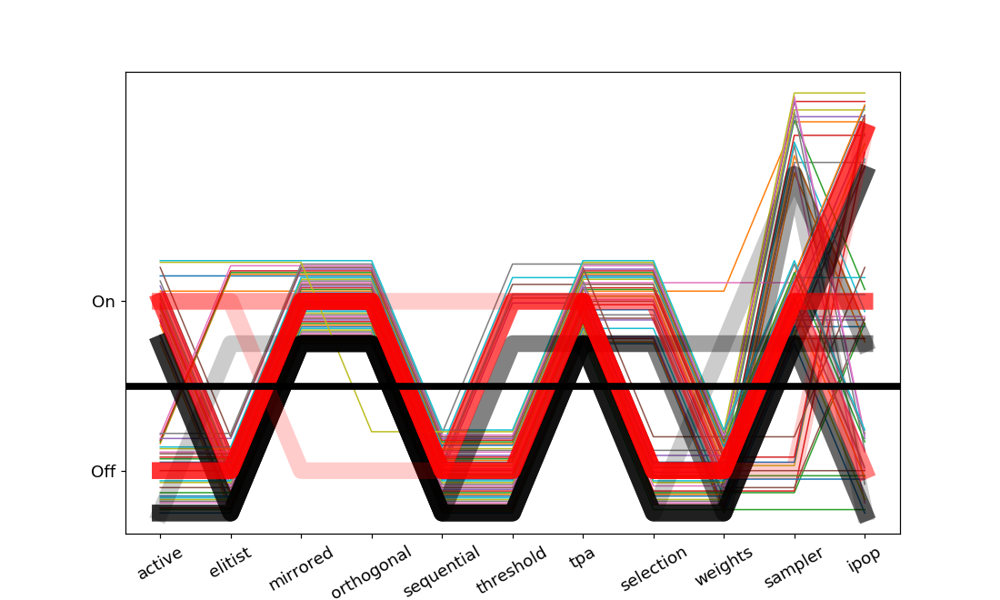

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


In [208]:
# plt.figure(figsize=(20,40))
plt.figure(figsize=(10,6))
# irace_idx = 0
fid = 1
df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
erts_fx = []
for c in range(4608):
    if fid == 1:
        hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
        hts[np.isnan(hts)] = 50000
        erts_fx.append(np.sum(hts)/ (20-np.sum(hts == 50000)))
    else:
        hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
        hts[np.isnan(hts)] = 50000
        erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))

configs = np.argsort(erts_fx)[:50]
plt.xticks(range(11),conf_names[:11], rotation=30)
plt.yticks([0.5,2.5],["Off","On"])


for i in range(len(configs)):
    plt.plot([2*j +i/50 for j in intToRepr(int(configs[i]))[:11]],alpha=1,lw=1)
    
for i in range(15):
    data_fx = pd.read_csv(f"{Data_loc}one_search_comparison/F{fid}_{i}", index_col=0)
    idx = np.argmin(data_fx["fitness"])
    plt.plot([2*data_fx["d0"][idx], 2*data_fx["d1"][idx], 2*data_fx["d2"][idx], 2*data_fx["d3"][idx], 2*data_fx["d4"][idx], 2*data_fx["d5"][idx], 2*data_fx["d6"][idx], 2*data_fx["d7"][idx], 2*data_fx["d8"][idx], 2*data_fx["d9"][idx], 2*data_fx["d10"][idx]]
                   ,lw=12, color='k', alpha=0.2)

for i in range(15):
    plt.plot([0.5 + 2*x for x in confs_irace[i][-11:]], lw=12, color='r', alpha=0.2)
    
plt.axhline(1.5,color='k',lw=5)
plt.show()

In [367]:
records = []
for i in range(15):
#     vals_temp = full_25_run_data[i]
    vals_temp_250 = full_250_run_data[i]
#     for j in range(25):
#         records.append((i, vals_temp[j], "25 Runs"))
    vals_temp_irace = achieved_erts[i]
    for inst in range(5):
        for j in range(50*inst,50*(1+inst)):
            records.append((i, vals_temp_250[j], "MIP-EGO", inst))
            records.append((i, vals_temp_irace[j], "irace", inst))
df_temp = pd.DataFrame.from_records(records, columns=["Conf_idx","ERT", "Version", "Inst"])

In [101]:
print(np.sum([np.sum([full_250_run_data[i][x] >= 25000 for x in range(250)]) for i in range(15)]))
print(np.sum([np.sum([full_250_run_data[i][x] <= 20000 for x in range(250)]) for i in range(15)]))

432
3145


In [100]:
print(np.sum([np.sum([achieved_erts[i][x] >= 25000 for x in range(250)]) for i in range(15)]))
print(np.sum([np.sum([achieved_erts[i][x] <= 20000 for x in range(250)]) for i in range(15)]))

275
3264


In [504]:
def calc_ert(x):
    x = np.array(x)
    x[x >= 25000] = 25000
    return np.sum(x)/(len(x)-np.sum([y==25000 for y in x]))

In [123]:
1-9185.205470589526/10397.853970233764

0.11662488270326954

In [128]:
1-422.2261333333334/458.9909333333333

0.08009918569197572

In [126]:
np.mean([calc_ert(achieved_erts[i]) for i in range(15)])

422.2261333333334

In [127]:
np.mean([calc_ert(full_250_run_data[i]) for i in range(15)])

458.9909333333333

In [306]:
imprs_250 = [1-np.mean(y)/np.mean(x) for x,y in zip(full_25_run_data,full_250_run_data)]

In [304]:
np.mean(full_25_run_data[0]),np.mean(full_250_run_data[0])

(472.64, 487.424)

In [36]:
import seaborn as sns

<IPython.core.display.Javascript object>


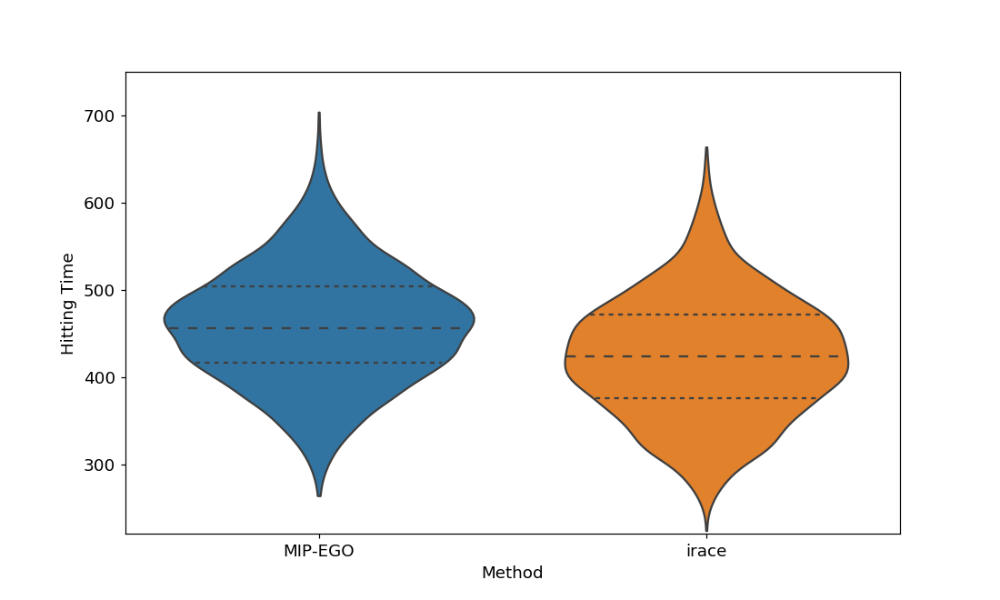

In [235]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Version", y="ERT", data=df_temp, inner="quartile", cut=0) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(220,750)
# ax.set_yscale('log')
# ax.axhline(50000,color='k',ls='--',alpha=0.9)
# ax.grid(False)
ax.set_xlabel("Method")
ax.set_ylabel("Hitting Time")
# ax.axhline(def_erts_250[0],color='r')
# ax.axhline(def_with_params[0], color='g')
# axy1 = ax.twinx()
# axy1.set_ylim(-0.5,1)
# axy1.axhline(0,color='k')
# axy1.plot(range(15), imprs_250, marker="+", color="red", alpha=0.3,lw=5)
# axy1.set_ylabel("ERT Improvement")
# axy1.grid(False)
fig.show()
fig.savefig("Violins_F1.pdf")

<IPython.core.display.Javascript object>


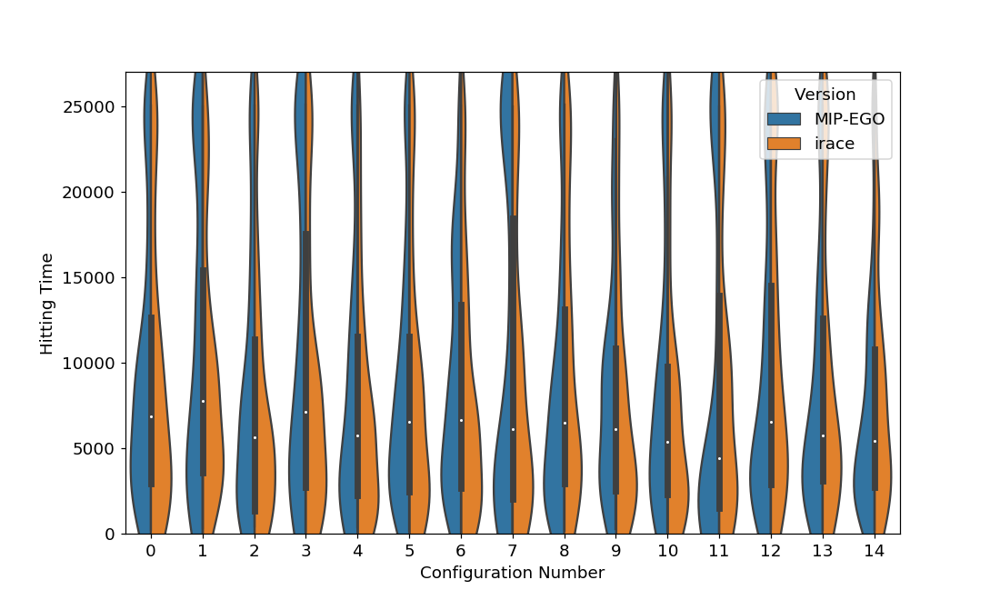

Text(0, 0.5, 'Hitting Time')

In [369]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Conf_idx", y="ERT", hue="Version", split=True, data=df_temp) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(0,27000)
# ax.set_yscale('log')
# ax.axhline(50000,color='k',ls='--',alpha=0.9)
# ax.grid(False)
ax.set_xlabel("Configuration Number")
ax.set_ylabel("Hitting Time")


In [370]:
records = []
for i in range(15):
    vals_temp_250 = full_250_run_data[i]
    vals_temp_25 = full_25_run_data[i]
    for inst in range(5):
        for j in range(inst*5,(inst+1)*5):
            records.append((i, vals_temp_25[j], inst, "25 runs"))
        for j in range(inst*50,(inst+1)*50):
            records.append((i, vals_temp_250[j], inst, "250 runs"))
#             records.append((i, achieved_erts[i][j], inst, "250"))

df_temp_inst = pd.DataFrame.from_records(records, columns=["Conf_idx","ERT", "Inst", "Type"])

<IPython.core.display.Javascript object>


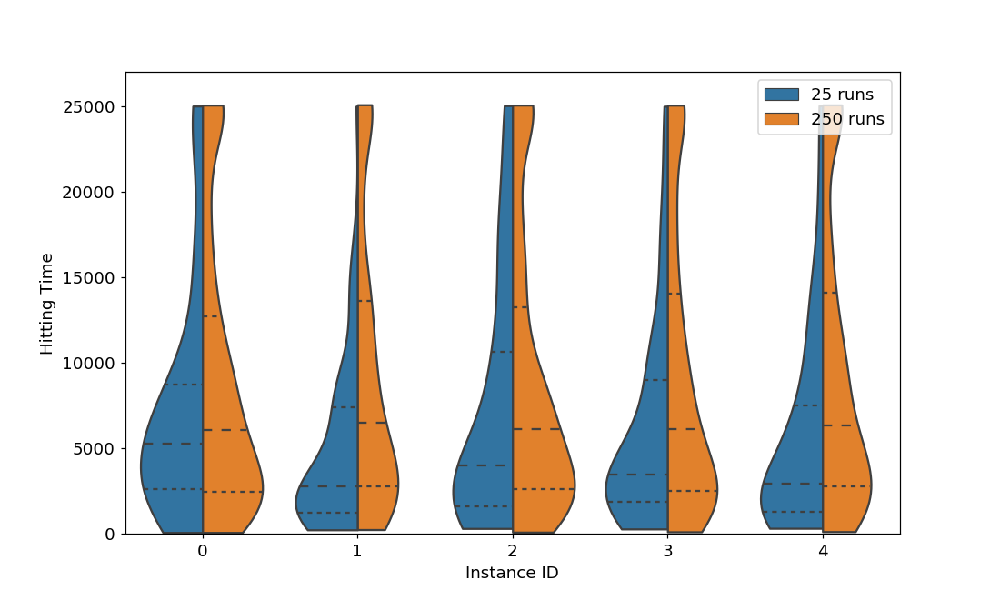

In [378]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Inst", y="ERT", hue="Type", split=True, data=df_temp_inst, inner='quartile', cut=0) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(0,27000)
# fig.legend()
ax.legend()
ax.set_xlabel("Instance ID")
ax.set_ylabel("Hitting Time")
fig.savefig("Inst_effect_violins_F20.pdf")

In [283]:
per_inst_vals_250 = []
for inst in range(5):
    temp = []
    for j in range(15):
        vals_temp_250 = full_250_run_data[j]
        for k in range(5):
            temp.append(vals_temp_250[inst*50+k])
    per_inst_vals_250.append(temp)

per_inst_vals = []
for inst in range(5):
    temp = []
    for j in range(15):
        vals_temp_25 = full_25_run_data[j]
        for k in range(5):
            temp.append(vals_temp_25[inst*5+k])
    per_inst_vals.append(temp)


In [287]:
for i in range(5):
    for j in range(i+1,5):
        print(ss.stats.mannwhitneyu(per_inst_vals[i], per_inst_vals[j]), i, j)
print(np.mean(per_inst_vals,axis=1))
for i in range(5):
    for j in range(i+1,5):
        print(ss.stats.mannwhitneyu(per_inst_vals_250[i], per_inst_vals_250[j]), i, j)
print(np.mean(per_inst_vals_250,axis=1))

for i in range(5):
    print(ss.stats.mannwhitneyu(per_inst_vals[i], per_inst_vals_250[i]))

MannwhitneyuResult(statistic=2092.0, pvalue=0.003401744923976819) 0 1
MannwhitneyuResult(statistic=2628.0, pvalue=0.24458527321695656) 0 2
MannwhitneyuResult(statistic=2459.0, pvalue=0.09227976935197968) 0 3
MannwhitneyuResult(statistic=2285.5, pvalue=0.023908589558106295) 0 4
MannwhitneyuResult(statistic=2289.0, pvalue=0.024658899864062073) 1 2
MannwhitneyuResult(statistic=2404.5, pvalue=0.06280017473599979) 1 3
MannwhitneyuResult(statistic=2672.5, pvalue=0.3000196707626799) 1 4
MannwhitneyuResult(statistic=2675.0, pvalue=0.30329323612154696) 2 3
MannwhitneyuResult(statistic=2440.5, pvalue=0.08129970037018885) 2 4
MannwhitneyuResult(statistic=2571.5, pvalue=0.1830041529758613) 3 4
[7306.57333333 4775.76       7321.65333333 6029.85333333 5670.44      ]
MannwhitneyuResult(statistic=2518.0, pvalue=0.13452995232705706) 0 1
MannwhitneyuResult(statistic=2777.0, pvalue=0.447654534021758) 0 2
MannwhitneyuResult(statistic=2592.5, pvalue=0.2046144563047681) 0 3
MannwhitneyuResult(statistic=2725

In [294]:
for i in range(15):
    print(ss.stats.mannwhitneyu(np.array(full_25_run_data[i]).flatten(), np.array(full_250_run_data[i]).flatten()))

MannwhitneyuResult(statistic=2636.5, pvalue=0.09893258106966385)
MannwhitneyuResult(statistic=2430.5, pvalue=0.033251021221221345)
MannwhitneyuResult(statistic=2634.5, pvalue=0.09810912033186764)
MannwhitneyuResult(statistic=2313.0, pvalue=0.016162226069395717)
MannwhitneyuResult(statistic=2647.5, pvalue=0.10404466117107203)
MannwhitneyuResult(statistic=2153.0, pvalue=0.005189769091918418)
MannwhitneyuResult(statistic=2542.5, pvalue=0.06238325389422279)
MannwhitneyuResult(statistic=2142.5, pvalue=0.004479661786325448)
MannwhitneyuResult(statistic=2633.5, pvalue=0.09762475042488655)
MannwhitneyuResult(statistic=2534.5, pvalue=0.05983650273104937)
MannwhitneyuResult(statistic=2864.5, pvalue=0.2464319058402305)
MannwhitneyuResult(statistic=2580.0, pvalue=0.07436452017705414)
MannwhitneyuResult(statistic=2581.5, pvalue=0.07599449231463098)
MannwhitneyuResult(statistic=2565.5, pvalue=0.07015690606287368)
MannwhitneyuResult(statistic=2261.5, pvalue=0.011416516748195044)


<IPython.core.display.Javascript object>


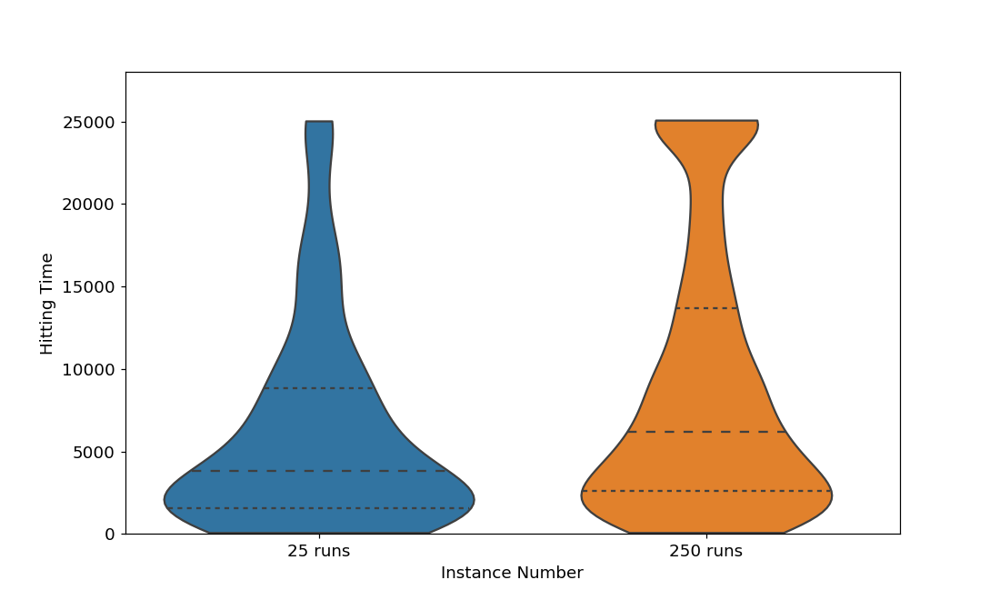

Text(0, 0.5, 'Hitting Time')

In [289]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Type", y="ERT", data=df_temp_inst, inner="quartile", split=True, cut=0) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(0,28000)

ax.set_xlabel("Instance Number")
ax.set_ylabel("Hitting Time")
# fig.savefig("Inst_effect_violins_F20.pdf")

In [764]:
dfs = []
for i in range(15):
    dfs.append(pd.read_csv(f"{Data_loc}one_search_comparison/F20_{i}", index_col=0))
df_full = pd.concat(dfs, axis=0, join='outer', ignore_index=True, keys=None)

In [466]:
data_fx = pd.read_csv(f"{Data_loc}one_search_comparison/F1_{0}", index_col=0)


In [774]:
data_good = df_full[df_full["fitness"]<12000]

In [775]:
len(data_good)

712

In [492]:
conf_vals = []
for i in range(9):
    conf_vals.append(np.sum(data_good)[f'd{i}']/len(data_good))
conf_vals

[0.4462809917355372,
 0.5,
 0.7892561983471075,
 0.6900826446280992,
 0.3415977961432507,
 0.12258953168044077,
 0.8126721763085399,
 0.33608815426997246,
 0.4297520661157025]

<IPython.core.display.Javascript object>


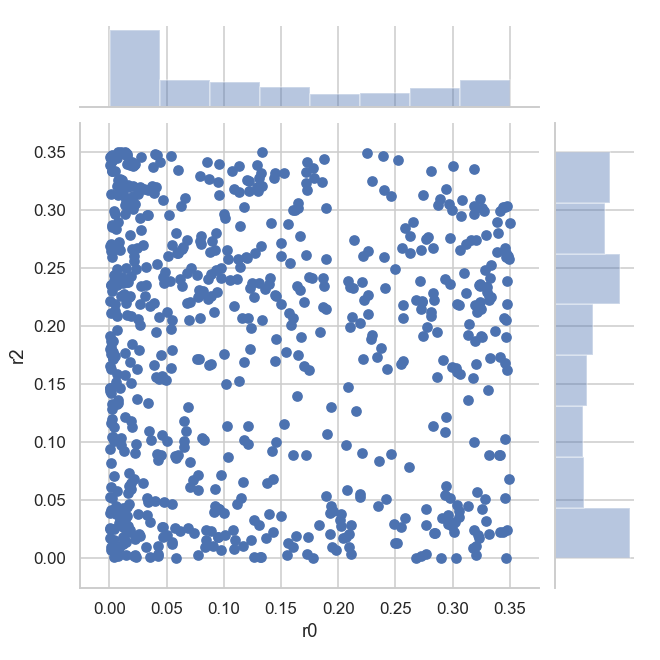

In [780]:
# fig, ax = plt.subplots(3,4, figsize=(15,25))
# ax = ax.flatten()
# for i in range(11):
sns.jointplot(f"r0","r2", data=data_good, kind="scatter")

In [660]:
records = []
for i in range(15):
    vals_temp_25 = full_25_run_data[i]
    for inst in range(5):
        for j in range(inst*5,(inst+1)*5):
            records.append((i, vals_temp_25[j], inst))
df_temp_inst = pd.DataFrame.from_records(records, columns=["Conf_idx","ERT", "Inst"])

<IPython.core.display.Javascript object>


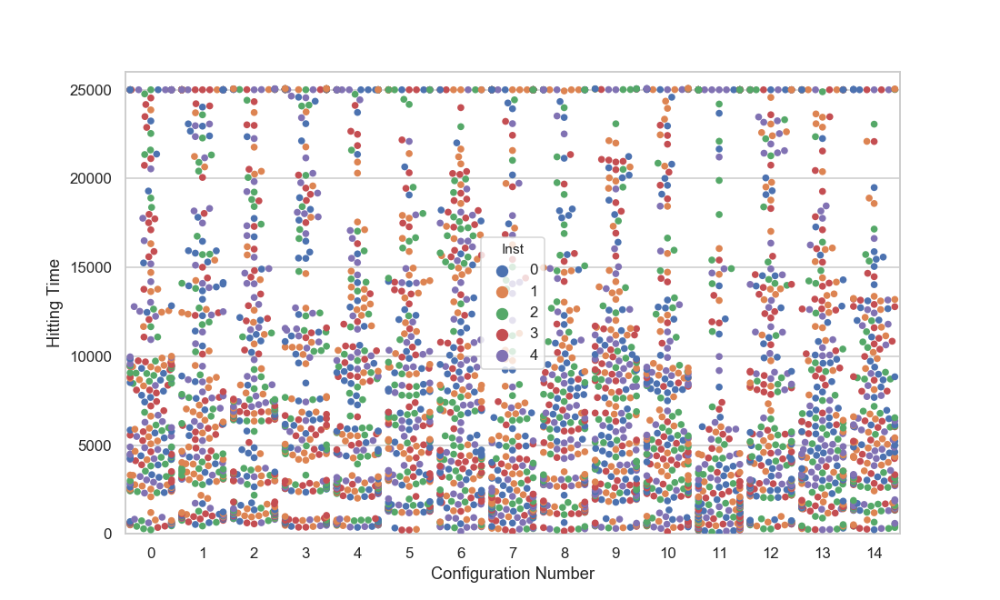

Text(0, 0.5, 'Hitting Time')

In [732]:
fig, ax = plt.subplots(figsize=(10,6))
sns.swarmplot(ax = ax, x="Conf_idx", y="ERT", hue="Inst", data=df_temp_inst) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(0,26000)

ax.set_xlabel("Configuration Number")
ax.set_ylabel("Hitting Time")


<IPython.core.display.Javascript object>


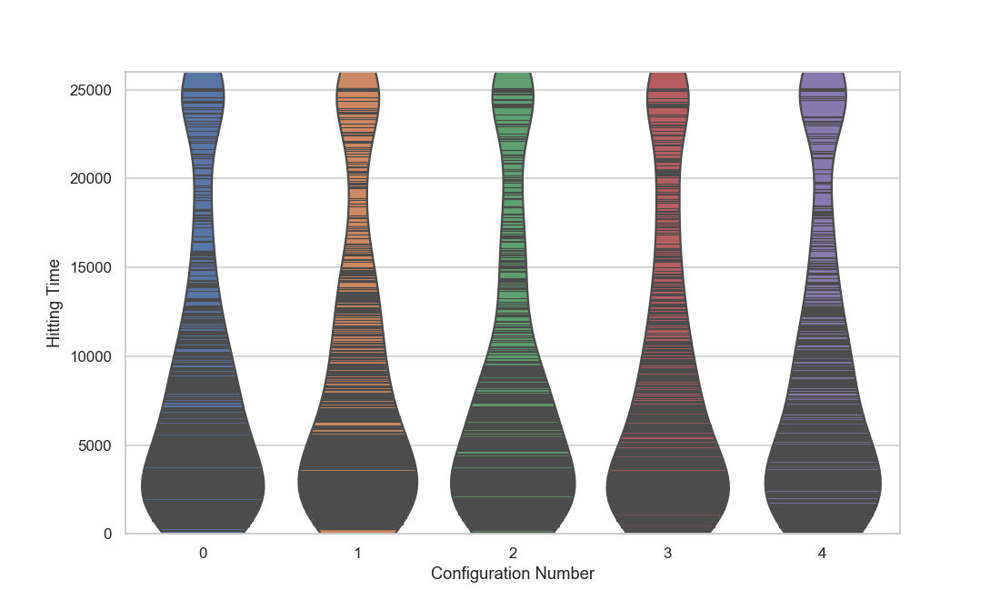

Text(0, 0.5, 'Hitting Time')

In [734]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Inst", y="ERT", data=df_temp_inst, inner="stick") #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(0,26000)

ax.set_xlabel("Configuration Number")
ax.set_ylabel("Hitting Time")

## Rerun sequential approach for 30 configs/function

In [ ]:
confs_per_fid = []
confs_fid_full = []
for fid in range(1,25):
    confs_fid = [0,2304,1152,1,2,3457,3458,2305,2306,594]
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    erts_fx = []
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (20-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    for idx in range(10):
        confs_fid.append(np.argsort(erts_fx)[idx])
        confs_fid.append(np.argsort(erts_fx)[200+idx])
    confs_fid = np.unique(confs_fid)
    for j in confs_fid:
        confs_fid_full.append((fid, j))
#     print(len(confs_fid))
confs_per_fid.append(confs_fid)

In [693]:
np.save("to_opt_confs_per_fid", confs_fid_full)

In [399]:
confs_fid_full = np.load("to_opt_confs_per_fid.npy")

In [177]:
to_rerun = []
still_to_run = []
for (fid, conf) in confs_fid_full:
    try:
        data_fx = pd.read_csv(f"{Data_loc}/Data_MIP_full/F{fid}_{conf}", index_col=0)
        idx = 19
        to_rerun.append((fid, conf, data_fx['c_1'][idx], data_fx['c_c'][idx], data_fx['c_mu'][idx]))
    except:
        still_to_run.append((fid,conf))
np.save("MIP_exp_rerun", to_rerun)
np.save("MIP_exp_still_to_run", still_to_run)

In [135]:
# records_data = []
# data_full_250 = []
# data_full_25 = []
full_records = []
# data_def_25 = []
# data_def_250 = []
# data_var = []
records_comp = []
records_impr = []
records_full = []
records_temp = []
for (fid, conf) in confs_fid_full:
    try:
        data_fx = pd.read_csv(f"{Data_loc}/Data_MIP_full/F{fid}_{conf}", index_col=0)
        idx = np.argmin(data_fx['fitness'])
        lines = [[int(v) for v in line.split(',')] for line in open(f"{Data_loc}/Data_MIP_full_runs/F{fid}_rep{conf}.csv")]
#         records_data.append((fid, conf, data_fx['c_1'][idx], data_fx['c_c'][idx], data_fx['c_mu'][idx], np.mean(lines[idx]), np.mean(lines[200]), np.mean(lines[19]), np.mean(lines([201]))))
#         data_full_25.append(lines[idx])
#         data_full_250.append(lines[200])
#         data_var.append((fid, conf, np.std(lines[200])))
#         data_def_25.append(lines[19])
#         data_def_250.append(lines[201])
        records_temp.append((fid, conf, calc_ert(lines[idx]), calc_ert(lines[-2])))
        for inst in range(5):
            for j in range(5):
                full_records.append((fid, conf, inst, 25, min(25000, lines[idx][5*inst+j])))
            for j in range(50):
                full_records.append((fid, conf, inst, 250, min(25000, lines[-1][50*inst+j])))
#         print(len(lines[201]))
        records_full.append((fid, conf, 1-calc_ert(lines[-2])/calc_ert(lines[-1]), calc_ert(lines[-2]), calc_ert(lines[-1])))
        records_impr.append((fid, 1-calc_ert(lines[-2])/calc_ert(lines[-1])))
        for i in range(250):
            records_comp.append((fid, conf, "opt", min(25000, lines[-2][i])))
            records_comp.append((fid, conf, "def", min(25000, lines[-1][i])))
    except:
        print((fid,conf))
# np.save("MIP_exp_rerun", to_rerun)
# np.save("MIP_exp_still_to_run", still_to_run)

c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\numpy\core\fromnumeric.py:61: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return bound(*args, **kwds)


(18, 1152)
(17, 1152)


c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in long_scalars
  after removing the cwd from sys.path.


In [136]:
df_temp = pd.DataFrame.from_records(records_temp, columns=["fid","conf","pred","ach"])

In [94]:
df_full = pd.DataFrame.from_records(records_full, columns=["fid", "conf", "impr", "opt", "def"])

In [367]:
df_impr = pd.DataFrame.from_records(records_impr, columns=["fid","impr"])

In [385]:
df_comp = pd.DataFrame.from_records(records_comp, columns=["fid", "conf", "version","HT"])

In [388]:
# df_temp = pd.DataFrame.from_records(records_data, columns=["fid", "conf", "c1","cc","cmu","pred","ach"])
df_large = pd.DataFrame.from_records(full_records, columns=["fid", "conf", "inst", "version", "HT"])

In [271]:
df_var = pd.DataFrame.from_records(data_var, columns=["fid","conf","var"])

In [252]:
pred_err = []
for r in records_data:
    pred_err.append((r[0],1-min(r[-2], r[-1])/max(r[-1],r[-2])))

In [253]:
df_pred_err_fid = pd.DataFrame.from_records(pred_err, columns=["fid", "err"])

In [ ]:
[np.mean(df_var[df_var["fid"] == x]["var"]) for x in range(1,25)]

<IPython.core.display.Javascript object>


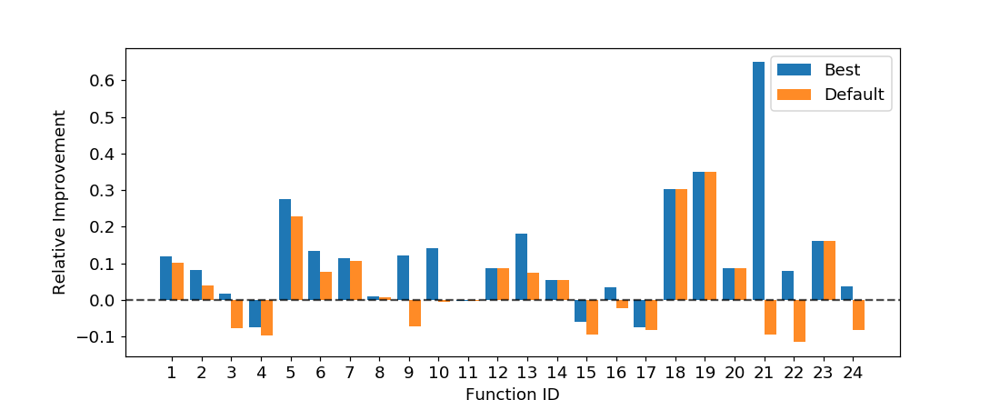

In [452]:
plt.figure(figsize=(10,4))
aggr_df = df_full.groupby('fid').agg('min')
plt.bar([i-0.2 for i in range(24)], [1-x/y for x,y in zip(aggr_df["opt"], aggr_df["def"])], width=0.4, label="Best")
plt.bar([i+0.2 for i in range(24)], [1-x/y for x,y in zip([df_full["opt"][np.argmin(df_full[df_full["fid"] == fid]["def"])] for fid in range(1,25)],aggr_df["def"])], width=0.4, alpha=0.9, label="Default")
plt.axhline(0,color='k',ls='--',alpha=0.7)
plt.xticks(range(24),range(1,25))
plt.xlabel("Function ID")
plt.ylabel("Relative Improvement")
plt.legend()
plt.savefig("Rel_impr_best_def.pdf")
plt.show()

In [380]:
aggr_df[0]

,conf,impr,opt,def
fid,,,,
1,0,-0.019745,392.160000,444.832000
2,0,-0.005664,1572.624000,1711.104000
3,0,-0.253746,11688.336364,11895.728111
4,0,-0.679526,12747.125581,11866.199074
5,0,0.010343,1114.688000,1538.736000
6,0,-0.005176,1101.540000,1270.624000
7,0,0.000000,3071.264000,3467.676000
8,0,-0.466454,1872.288000,1891.488000
9,0,-0.153390,1695.424000,1930.976000


In [374]:
[df_full.groupby('fid').agg('min')]

[     conf      impr           opt           def
 fid                                            
 1       0 -0.019745    392.160000    444.832000
 2       0 -0.005664   1572.624000   1711.104000
 3       0 -0.253746  11688.336364  11895.728111
 4       0 -0.679526  12747.125581  11866.199074
 5       0  0.010343   1114.688000   1538.736000
 6       0 -0.005176   1101.540000   1270.624000
 7       0  0.000000   3071.264000   3467.676000
 8       0 -0.466454   1872.288000   1891.488000
 9       0 -0.153390   1695.424000   1930.976000
 10      0 -0.069442   1615.460000   1882.320000
 11      0 -0.451164   1471.616000   1467.296000
 12      0 -0.111276   2824.512000   3095.616000
 13      0  0.072514   2740.064000   3349.952000
 14      0 -0.072799   1538.408000   1625.068000
 15      0 -0.464224   8629.243697   8145.045643
 16      0 -0.109966   5244.538153   5436.538462
 17      0 -0.119086   2858.528000   2657.876000
 18      0 -0.002161  11149.089286  15967.633663
 19      0 -0.083126

<IPython.core.display.Javascript object>


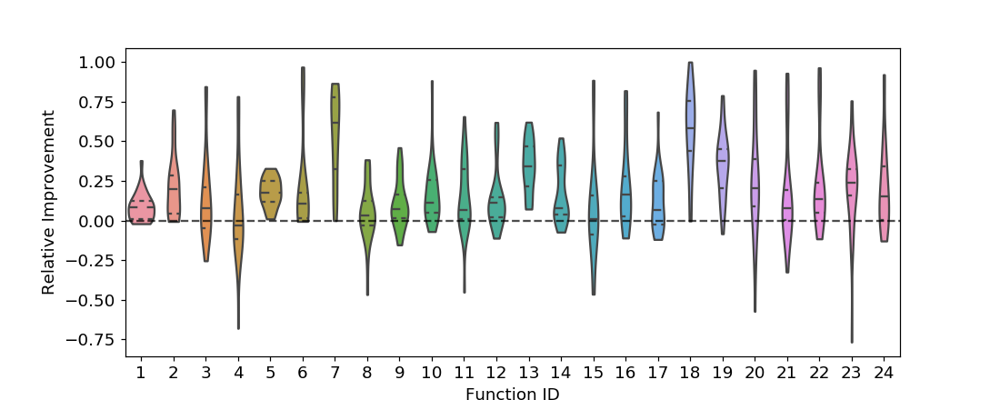

In [371]:
fig, ax = plt.subplots(figsize=(10,4))
sns.violinplot(data=df_impr, x="fid", y="impr", inner="quartile", ax=ax, cut=0)
ax.axhline(0,color='k',ls='--', alpha=0.7)
ax.set_xlabel("Function ID")
ax.set_ylabel("Relative Improvement")
fig.savefig("impr_distr.pdf")

<IPython.core.display.Javascript object>


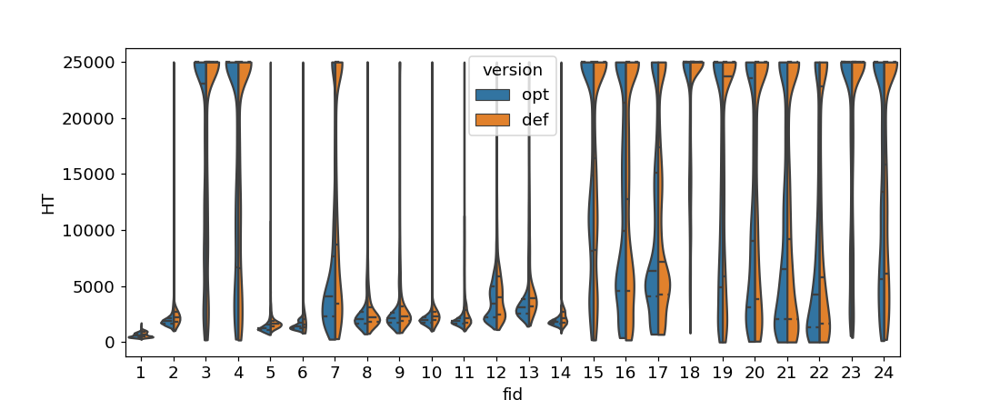

In [386]:
fig, ax = plt.subplots(figsize=(10,4))
sns.violinplot(data=df_comp, x="fid", y="HT", hue="version", split=True, inner="quartile", ax=ax, cut=0)

<IPython.core.display.Javascript object>


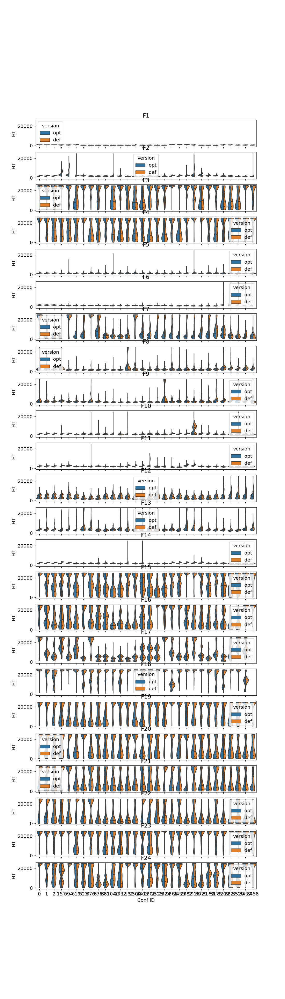

In [485]:
fig, ax = plt.subplots(24, 1, figsize=(10,35), sharex=True, sharey=True)
ax = ax.flatten()
for i in range(1,25):
    sns.violinplot(x="conf", y="HT", data=df_comp[df_comp["fid"]==i], ax=ax[i-1], hue="version", split=True, cut=0, inner="quartile")
    ax[i-1].set_title(f"F{i}")
    if i <24:
        ax[i-1].set_xlabel("")
    else:
        ax[i-1].set_xlabel("Conf ID")
#     if (i-1)%3:
#         ax[i-1].set_ylabel("")
#     else:
#         ax[i-1].set_ylabel("Hitting Time")
#     ax[i-1].set_yscale('log')
#     ax[i-1].set_ylim(300,26000)
fig.show()
fig.savefig("Conf_diff_per_fid.pdf")

<IPython.core.display.Javascript object>


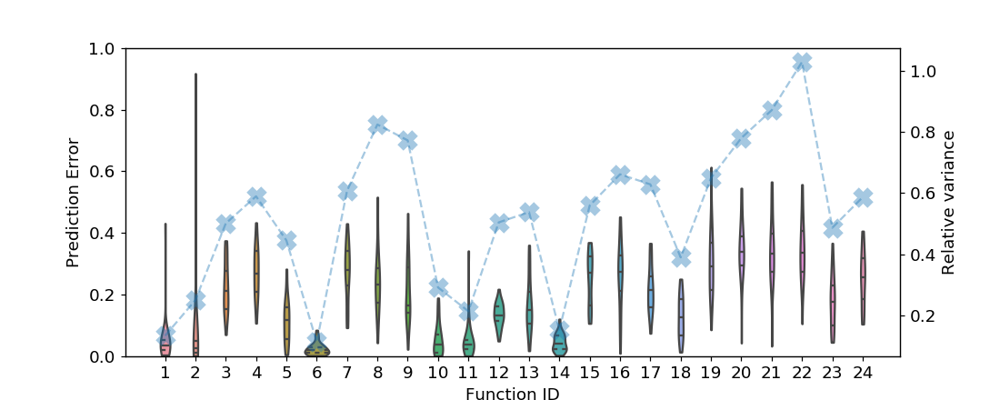

In [290]:
fig, ax = plt.subplots(figsize=(10,4))
sns.violinplot(data=df_pred_err_fid, x="fid", y="err", inner="quartile", ax=ax, cut=0)

ax.set_ylim(0,1)
ax1 = ax.twinx()
ax1.plot([np.mean(df_var[df_var["fid"] == x]["var"])/np.mean(df_temp[df_temp["fid"] == x]["ach"]) for x in range(1,25)], ls='--', marker='x', markersize=10, mew=6, alpha=0.4)
# ax.legend()
# ax.set_yscale("log")
ax.set_xlabel("Function ID")
ax.set_ylabel("Prediction Error")
ax1.set_ylabel("Relative variance")
fig.savefig("Pred_errs_per_fid.pdf")

In [248]:
np.mean(pred_err)

0.1891256797040032

In [137]:
baseline2 = []
baseline2_25 = []

for fid in range(1,25):
    baseline2.append(np.min(df_temp[df_temp["fid"]==fid]["ach"]))
    baseline2_25.append(df_temp["pred"][np.argmin(df_temp[df_temp["fid"]==fid]["ach"])])

#     print(np.argmin(df_temp[df_temp["fid"]==fid]["ach"]))
#     print(df_temp["conf"][np.argmin(df_temp[df_temp["fid"]==fid]["ach"])])
#     print(df_temp["conf"][np.argmin(df_temp[df_temp["fid"]==fid]["pred"])])

In [144]:
np.mean([1-min(i,j)/max(i,j) for i,j in zip(baseline2,baseline2_25)])

0.18838407648954428

In [458]:
np.mean([1-x/y for (x,y) in zip(irace_250,baseline2)])

-0.09444473082003878

In [457]:
np.sum([i<j for i,j in zip(irace_250,baseline2)])

11

In [340]:
df_table_full["Static ERT (25)"]

Function
1       447.296000
2      2042.484000
3     12827.976636
4     11933.241860
5      1607.032000
6      1353.656000
7      4439.392000
8      1984.960000
9      2044.816000
10     2160.704000
11     1871.840000
12     3568.128000
13     3241.248000
14     1912.128000
15    15350.761062
16    12035.288136
17     2889.376000
18    18382.828452
19    17810.235294
20    11438.695853
21    11148.901869
22     4767.185185
23    17548.740933
24     8272.094262
Name: Static ERT (25), dtype: float64

<IPython.core.display.Javascript object>


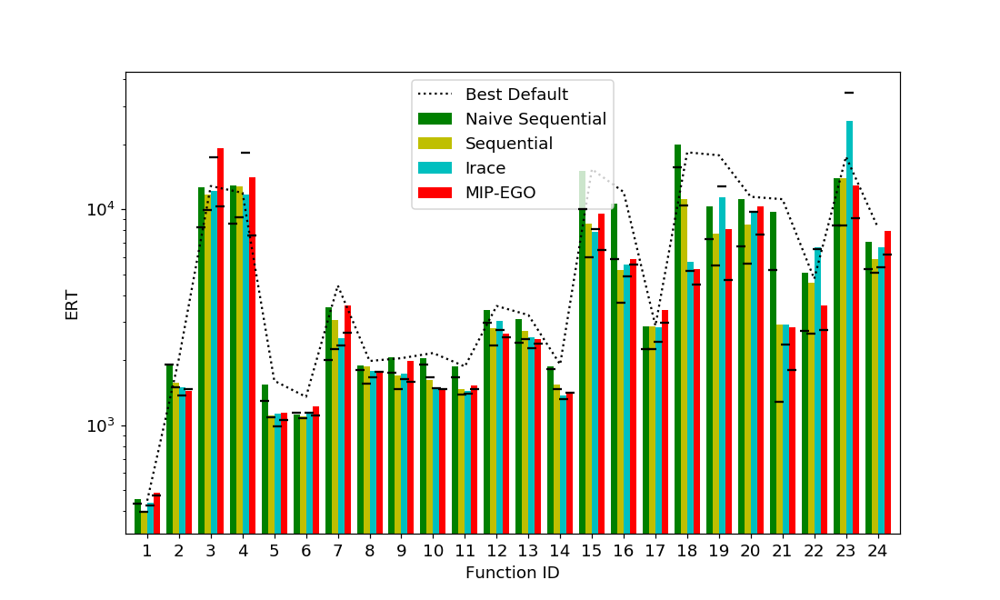

In [346]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)],     def_with_params,      label="Naive Sequential", width=0.2,       color='g', zorder=1)
plt.bar([i-0.1 for i in range(24)],     baseline2,            label="Sequential",       width=0.2,       color='y', zorder=1)
plt.bar([i+0.1 for i in range(24)],     irace_250,            label="Irace",            width=0.2,       color='c', zorder=1)
plt.bar([i+0.3 for i in range(24)],     mip_ego_erts_250,     label="MIP-EGO",          width=0.2,       color='r', zorder=1)


plt.scatter([i-0.3 for i in range(24)], def_with_params_pred, marker='_',      color='k', zorder=10)
plt.scatter([i-0.1 for i in range(24)], baseline2_25,         marker='_',      color='k', zorder=10)
plt.scatter([i+0.1 for i in range(24)], irace_ert_25,         marker='_',      color='k', zorder=10)
plt.scatter([i+0.3 for i in range(24)], best_mip_ego,         marker='_',      color='k', zorder=10)

plt.plot(range(24), df_table_full["Static ERT (25)"], color='k', ls=':', label='Best Default')
# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.xlim(-0.7,23.7)
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function ID")
plt.xticks(range(24),[i+1 for i in range(24)])
plt.savefig("integrated_vs_sequential_var2.pdf")
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], def_with_params_pred, label="Naive Sequential (25)",width=0.2, color='g')
plt.bar([i-0.3 for i in range(24)], def_with_params, label="Naive Sequential (250)",width=0.2, alpha=0.5, color='g')
plt.bar([i-0.1 for i in range(24)], baseline2_25, label="Sequential (25)",width=0.2, alpha=0.8, hatch='xxx', color='y')
plt.bar([i-0.1 for i in range(24)], baseline2, label="Sequential (250)",width=0.2, alpha=0.4, hatch='xxx', color='k')
plt.bar([i+0.1 for i in range(24)], irace_ert_25, label="Irace (Predicted)",width=0.2, color='b', hatch='\\\\\\', alpha=0.6)
plt.bar([i+0.1 for i in range(24)], irace_250, label="Irace (250)",width=0.2, alpha=0.5, color='c')
plt.bar([i+0.3 for i in range(24)], best_mip_ego, label="MIP-EGO (25)",width=0.2, color='r', hatch='///')
plt.bar([i+0.3 for i in range(24)], mip_ego_erts_250, alpha=0.3, label="MIP-EGO (250)",width=0.2, color='r')



# plt.bar(range(24), irace_ert_25,alpha=0.3)
plt.legend()
plt.xlim(-0.7,23.7)
plt.yscale('log')
plt.ylabel("ERT")
plt.xlabel("Function ID")
plt.xticks(range(24),[i+1 for i in range(24)])
plt.savefig("integrated_vs_sequential_var2.pdf")
plt.show()

<IPython.core.display.Javascript object>


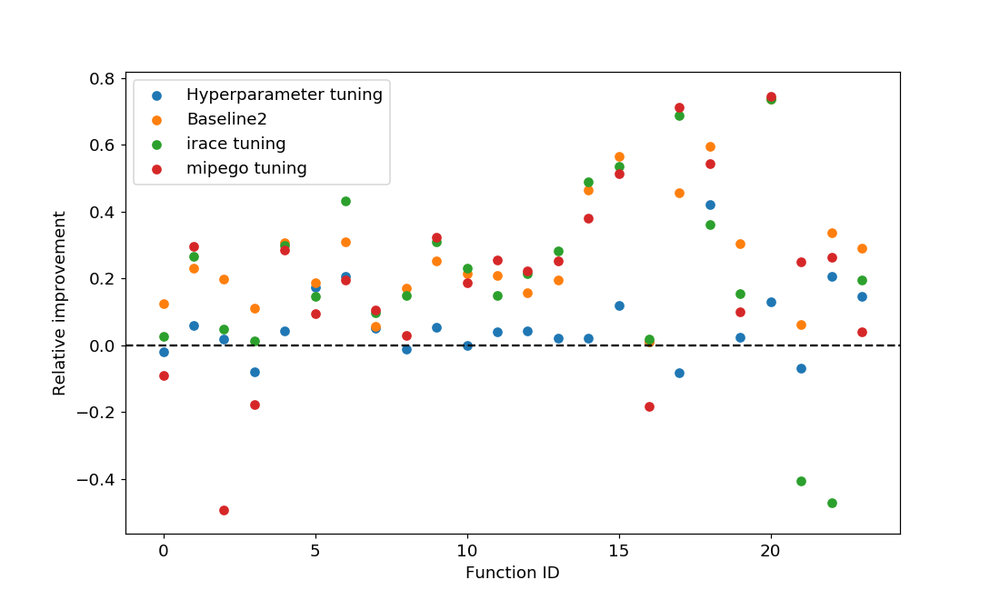

In [231]:
plt.figure(figsize=(10,6))
# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(mip_ego_erts_250,def_with_params)]))
# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(irace_250,def_with_params)]))
plt.scatter(range(24),[1-w/v for w,v in zip(def_with_params,def_erts_250)], label="Hyperparameter tuning")
plt.scatter(range(24),[1-w/v for w,v in zip(baseline2,def_erts_250)], label="Baseline2")
plt.scatter(range(24),[1-w/v for w,v in zip(irace_250,def_erts_250)], label="irace tuning")
plt.scatter(range(24),[1-w/v for w,v in zip(mip_ego_erts_250,def_erts_250)], label="mipego tuning")

# plt.scatter(range(24),np.sort([1-w/v for w,v in zip(def_with_params_pred,best_statics)]))
# plt.scatter(range(24),[1-w/v for w,v in zip(def_with_params_pred,def_erts_250)])
# plt.scatter(range(24),np.sort([x/100 for x in [1.4,14.6,1.4,6.3,24,21.3,13.5,0.8,-0.1,11.5,9.4,6,-8.9,3.3,-3.7,-3.7,3.7,-19.2,12.8,9.6,50.9,20.6,4.8,-9.4]]), label="Configuration Switching", marker='^', linewidth=3)
plt.xlabel("Function ID")
plt.ylabel("Relative improvement")
plt.legend()
# plt.legend()
plt.axhline(0,color='k',ls='--')
# plt.savefig("Brute-force_perc_impr.pdf")
plt.show()

<IPython.core.display.Javascript object>


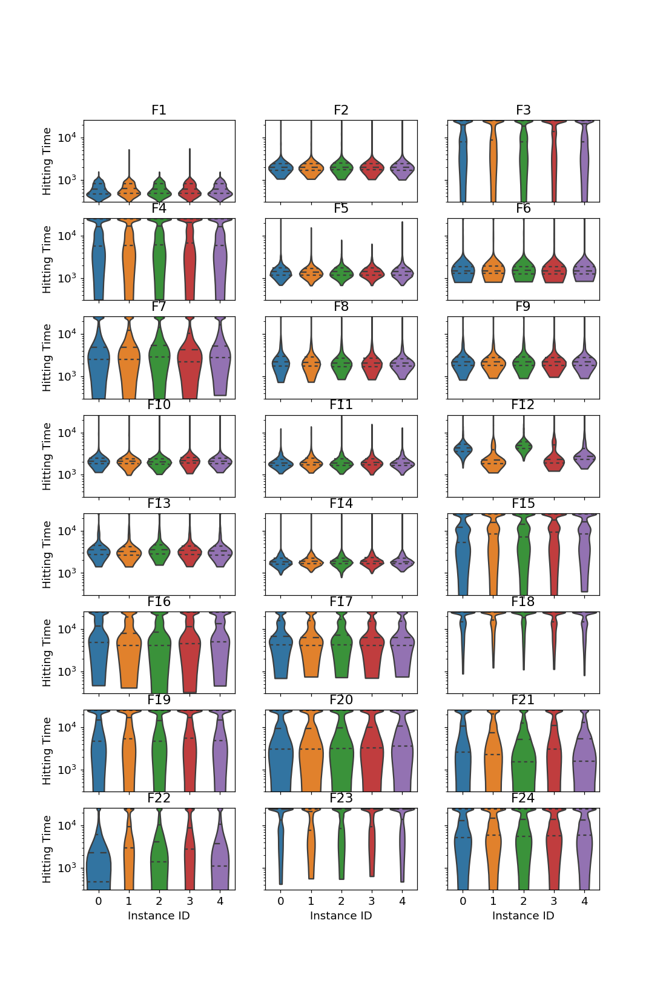

In [389]:
fig, ax = plt.subplots(8, 3, figsize=(10,15), sharex=True, sharey=True)
ax = ax.flatten()
for i in range(1,25):
    sns.violinplot(x="inst", y="HT", data=df_large[df_large["fid"]==i], ax=ax[i-1], cut=0, inner="quartile")
    ax[i-1].set_title(f"F{i}")
    if i <22:
        ax[i-1].set_xlabel("")
    else:
        ax[i-1].set_xlabel("Instance ID")
    if (i-1)%3:
        ax[i-1].set_ylabel("")
    else:
        ax[i-1].set_ylabel("Hitting Time")
    ax[i-1].set_yscale('log')
    ax[i-1].set_ylim(300,26000)
fig.show()
fig.savefig("Inst_diff_per_fid.pdf")

In [155]:
lines = [[int(v) for v in line.split(',')] for line in open(f"{Data_loc}/Data_MIP_full_runs/F{fid}_rep{conf}.csv")]

## Table creation

In [400]:
common_confs = [0,2304,1152,1,2,3457,3458,2305,2306,594]

In [85]:
calc_ert

NameError: name 'calc_ert' is not defined

In [115]:
best_common_confs = []
best_common_250 = []
def_erts_250_var2 = []
best_tuned_250 = []
for fid in range(1,25):
    temp_vals = []
    for conf in common_confs:
        try:
            lines = [[int(v) for v in line.split(',')] for line in open(f"{Data_loc}/Data_MIP_full_runs/F{fid}_rep{conf}.csv")]
            temp_vals.append(calc_ert(lines[-1]))
        except:
            print(conf)
    best_common_250.append(np.min(temp_vals))
    best_common_confs.append(common_confs[np.argmin(temp_vals)])

records_table_small = []
for (fid,conf) in confs_fid_full:
    try:
        data_fx = pd.read_csv(f"{Data_loc}/Data_MIP_full/F{fid}_{conf}", index_col=0)
        idx = np.argmin(data_fx['fitness'])
        lines = [[int(v) for v in line.split(',')] for line in open(f"{Data_loc}/Data_MIP_full_runs/F{fid}_rep{conf}.csv")]
        def_erts_250_var2.append(calc_ert(lines[-1]))
        best_tuned_250.append(calc_ert(lines[-2]))
        records_table_small.append((fid, conf, calc_ert(lines[-1]), calc_ert(lines[-2]) ))
    except:
        print((fid,conf))
# np.save("MIP_exp_rerun", to_rerun)
# np.save("MIP_exp_still_to_run", still_to_run)

c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in long_scalars
  after removing the cwd from sys.path.
c:\users\diedi\appdata\local\programs\python\python37\lib\site-packages\numpy\core\fromnumeric.py:61: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return bound(*args, **kwds)


(18, 1152)
(17, 1152)


In [312]:
best_static_confs, def_erts_250, def_with_params

array([  447.296     ,  2042.484     , 12827.97663551, 11933.24186047,
        1607.032     ,  1353.656     ,  4439.392     ,  1984.96      ,
        2044.816     ,  2160.704     ,  1871.84      ,  3568.128     ,
        3241.248     ,  1912.128     , 15350.76106195, 12035.28813559,
        2889.376     , 18382.82845188, 17810.23529412, 11438.69585253,
       11148.90186916,  4767.18518519, 17548.74093264,  8272.0942623 ])

In [ ]:
irace_to_rep, irace_250

In [ ]:
mip_ego_confs, mip_ego_erts_250

In [ ]:
df_full.groupby('fid').agg('min')

In [116]:
records_table_complete = []

for fid in range(1,25):
    temp_target = targets_per_fid[fid-1]
    temp_common_conf = best_common_confs[fid-1]
    temp_common_ert = best_common_250[fid-1]
    temp_static_25_conf = best_static_confs[fid-1]
    temp_static_25_250 = def_erts_250[fid-1]
    temp_static_25_tuned = def_with_params[fid-1]
    temp_static_250_conf = df_full["conf"][np.argmin(df_full[df_full["fid"] == fid]["def"])]
    temp_static_250_250 = df_full["def"][np.argmin(df_full[df_full["fid"] == fid]["def"])]
    temp_tuned_25_conf = df_full["conf"][np.argmin(df_full[df_full["fid"] == fid]["opt"])]
    temp_tuned_25_c250 = df_full["opt"][np.argmin(df_full[df_full["fid"] == fid]["opt"])]
    temp_mip_conf = mip_ego_confs[fid-1]
    temp_mip_250 = mip_ego_erts_250[fid-1]
    temp_irace_conf = irace_to_rep[fid-1][1]
    temp_irace_250 = irace_250[fid-1]
    records_table_complete.append((fid, temp_target, temp_common_conf, temp_common_ert, 
                                   temp_static_25_conf, temp_static_25_250,
                                  temp_static_25_tuned, temp_static_250_conf, temp_static_250_250,
                                  temp_tuned_25_conf, temp_tuned_25_c250, temp_mip_conf,
                                  temp_mip_250, temp_irace_conf, temp_irace_250))

In [117]:
df_table_full = pd.DataFrame.from_records(records_table_complete, columns=["Function", "Target", "Common Conf", "Common ERT",
                                                                          "Static Conf (25)", "Static ERT (25)", 
                                                                          "Static Tuned ERT", "Static Conf (250)", "Static ERT (250)",
                                                                          "Sequential Conf", "Sequential ERT", "MIP-EGO Conf",
                                                                          "MIP-EGO ERT", "Irace Conf", "Irace ERT"], index="Function")

In [433]:
df_table_full.to_latex("Table_full.tex", formatters = {"Common ERT": ERT_formatter,
                           "Static ERT (25)": ERT_formatter,
                           "Static Tuned ERT": ERT_formatter,
                           "Static ERT (250)": ERT_formatter,
                           "Sequential ERT": ERT_formatter,
                           "MIP-EGO ERT": ERT_formatter,
                           "Irace ERT": ERT_formatter})

In [104]:
def ERT_formatter(val):
    if val == np.inf:
        return "\infty"
    return f"{val:,.0f}"

In [427]:
df_table_full = df_table_full.style.format({"Common ERT": ERT_formatter,
                           "Static ERT (25)": ERT_formatter,
                           "Static Tuned ERT": ERT_formatter,
                           "Static ERT (250)": ERT_formatter,
                           "Sequential ERT": ERT_formatter,
                           "MIP-EGO ERT": ERT_formatter,
                           "Irace ERT": ERT_formatter})
                           


In [118]:
df_table_full

,Target,Common Conf,Common ERT,Static Conf (25),Static ERT (25),Static Tuned ERT,Static Conf (250),Static ERT (250),Sequential Conf,Sequential ERT,MIP-EGO Conf,MIP-EGO ERT,Irace Conf,Irace ERT
Function,,,,,,,,,,,,,,
1,10e-8.0,1152,837.472000,921,447.296000,456.128000,3227,444.832000,3229,392.160000,903,487.424000,4598,436.040000
2,10e-8.0,1152,2332.096000,3714,2042.484000,1921.288000,1281,1711.104000,4585,1572.624000,1264,1437.888000,867,1501.333333
3,10e0.4,2,32371.641221,869,12827.976636,12604.235023,872,11895.728111,149,11688.336364,617,19158.358696,3173,12221.436620
4,10e0.8,2,19522.834286,884,11933.241860,12896.402913,599,11866.199074,896,12747.125581,1028,14042.985577,884,11766.680556
5,10e-8.0,594,1758.592000,1311,1607.032000,1540.204000,1010,1538.736000,3190,1114.688000,1034,1148.404000,1029,1128.372000
6,10e-8.0,1152,1609.920000,2166,1353.656000,1119.768000,2039,1270.624000,2165,1101.540000,2176,1224.232000,1902,1156.184000
7,10e-8.0,2,5715.887550,3208,4439.392000,3525.024000,1436,3467.676000,40,3071.264000,1570,3577.024000,1274,2527.180000
8,10e-8.0,2,2972.384000,1016,1984.960000,1883.572000,866,1891.488000,864,1872.288000,869,1773.728000,3176,1790.112000
9,10e-8.0,2,2977.792000,1015,2044.816000,2068.276000,870,1930.976000,869,1695.424000,869,1982.880000,3176,1742.176000


In [468]:
np.sum([y<x for x,y in zip(df_table_full["Sequential ERT"],df_table_full["Irace ERT"])])

12

In [398]:
np.argmin(df_full[df_full["fid"] == 2]["def"])
df_full[df_full["fid"] == 2]["def"]
df_full["conf"][np.argmin(df_full[df_full["fid"] == 2]["def"])]

1281

In [129]:
np.mean([1-i/j for j,i in zip(df_table_full["Static ERT (25)"],df_table_full["MIP-EGO ERT"])])

0.20199813127966346

In [132]:
np.mean([1-i/j for j,i in zip(df_table_full["Static ERT (25)"],df_table_full["Irace ERT"])])

0.2066456141390152

In [131]:
np.mean([1-i/j for j,i in zip(df_table_full["Static ERT (25)"],df_table_full["Sequential ERT"])])

0.24709500572164708

In [279]:
np.mean([1-i/j for j,i in zip(df_table_full["Static ERT (25)"],df_table_full["Static Tuned ERT"])])

0.06324815083987152

<IPython.core.display.Javascript object>


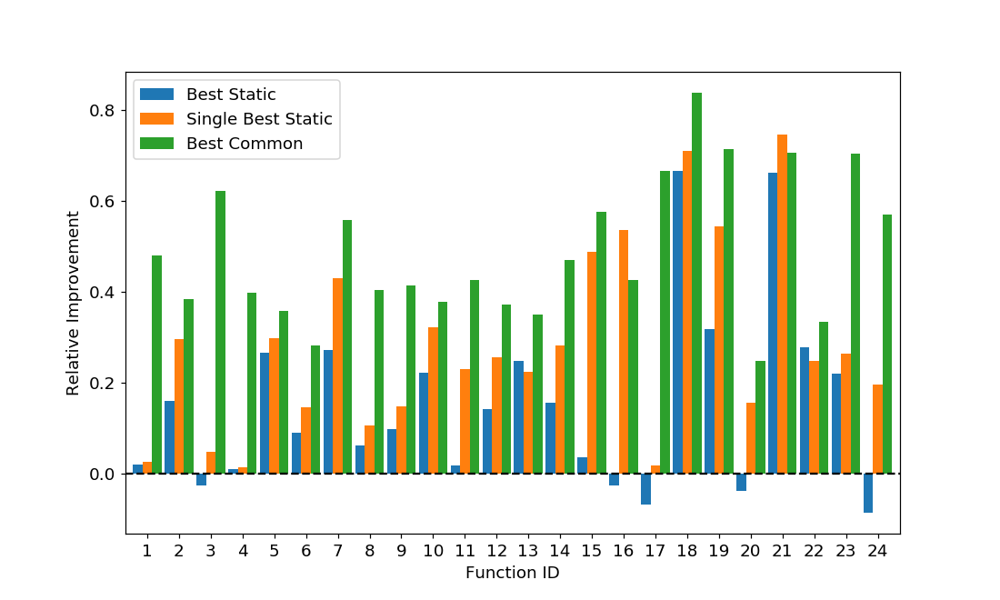

In [124]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], [1-min(j,k)/i for i,j,k in zip(df_table_full["Static ERT (250)"],df_table_full["MIP-EGO ERT"], df_table_full["Irace ERT"])], width=0.3, label="Best Static")
plt.bar([i for i in range(24)], [1-min(j,k)/i for i,j,k in zip(df_table_full["Static ERT (25)"],df_table_full["MIP-EGO ERT"], df_table_full["Irace ERT"])], width=0.3, label="Single Best Static")
plt.bar([i+0.3 for i in range(24)], [1-min(j,k)/i for i,j,k in zip(df_table_full["Common ERT"],df_table_full["MIP-EGO ERT"], df_table_full["Irace ERT"])], width=0.3, label="Best Common")
plt.legend()
plt.axhline(0, color='k', ls='--')
plt.xlabel("Function ID")
plt.xticks(range(24), range(1,25))
plt.ylabel("Relative Improvement")
plt.xlim(-0.7,23.7)
plt.savefig("Rel_Imprs_VBS.pdf")
plt.show()

<IPython.core.display.Javascript object>


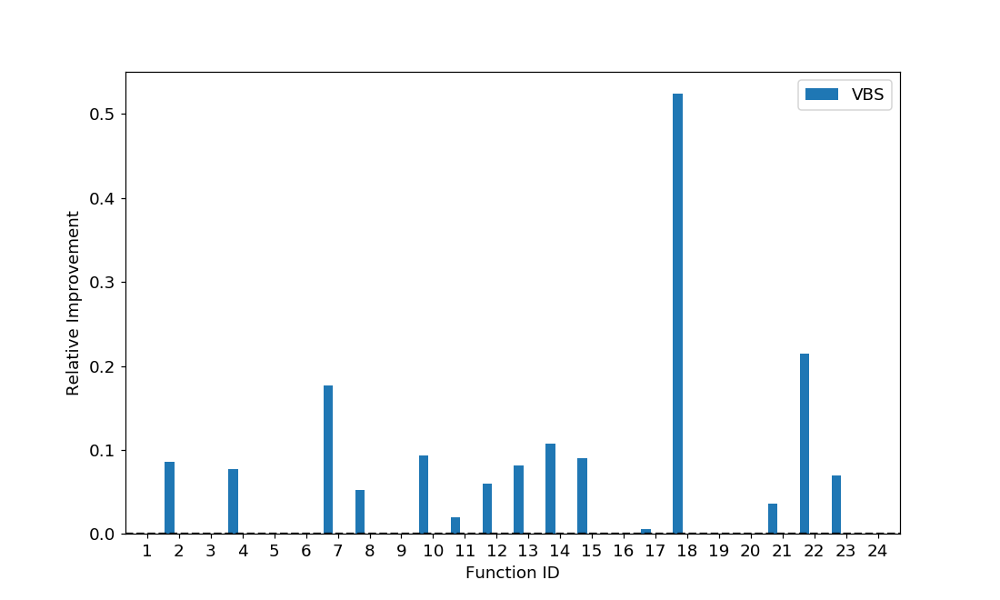

In [283]:
plt.figure(figsize=(10,6))
plt.bar([i-0.3 for i in range(24)], [1-min(i,j,k,l)/j for i,j,k,l in zip(df_table_full["Static Tuned ERT"], df_table_full["Sequential ERT"],df_table_full["MIP-EGO ERT"], df_table_full["Irace ERT"])], width=0.3, label="VBS")
plt.legend()
plt.axhline(0, color='k', ls='--')
plt.xlabel("Function ID")
plt.xticks(range(24), range(1,25))
plt.ylabel("Relative Improvement")
plt.xlim(-0.7,23.7)
plt.savefig("Rel_Imprs_VBS_vs_SBS.pdf")
plt.show()

In [128]:
np.mean(df_table_full["Irace ERT"]), np.mean(df_table_full["MIP-EGO ERT"]), np.mean(df_table_full["Sequential ERT"]), np.mean(df_table_full["Static Tuned ERT"])

(5387.272245054196, 5177.233544441674, 4869.080286700628, 6500.90125016872)

## Impact of budget on irace

### Load data

In [506]:
# irace_confs = {}
irace_confs_1500 = []
irace_confs_3000 = []
irace_confs_5000 = []
irace_confs_10000 = []
irace_confs_15000 = []
irace_confs_20000 = []
irace_confs_25000 = []

irace_confs_1500.append([0.098, 0.3416, 0.0188, reprToInt([0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 2])])
irace_confs_1500.append([0.0371, 0.1912, 0.0906 ,reprToInt([0 ,0 ,1 ,1 ,1 ,0 ,1 ,1 ,0 ,0 , 0])])
irace_confs_1500.append([0.0477, 0.6199, 0.1323 ,reprToInt([0 ,1 ,0 ,0 ,0 ,0 ,0 ,0 ,1 ,1 , 2])])
irace_confs_3000.append([0.0967, 0.4132, 0.1251 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,1 ,0 ,1 , 2])])
irace_confs_3000.append([0.0673, 0.484, 0.145 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,0 , 1])])
irace_confs_3000.append([0.0721, 0.6019, 0.1404 ,reprToInt([1 ,0 ,0 ,0 ,0 ,0 ,0 ,0 ,0 ,1 , 2])])
irace_confs_5000.append([0.0509, 0.4916, 0.0712 ,reprToInt([1 ,1 ,1 ,1 ,0 ,0 ,0 ,0 ,1 ,2 , 2])])
irace_confs_5000.append([0.1115, 0.5743, 0.1118 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 0])])
irace_confs_5000.append([0.0639, 0.3801, 0.1343 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,1 ,0 ,0 , 2])])
irace_confs_10000.append([0.0646, 0.4506, 0.2022 ,reprToInt([1 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 2])])
irace_confs_10000.append([0.0887, 0.3444, 0.0593 ,reprToInt([1 ,1 ,1 ,1 ,1 ,0 ,1 ,0 ,0 ,1 , 2])])
irace_confs_10000.append([0.0875, 0.5466, 0.163 ,reprToInt([1 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 1])])
irace_confs_15000.append([0.058, 0.4673, 0.2127 ,reprToInt([1 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 0])])
irace_confs_15000.append([0.0907, 0.4286, 0.1298 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 1])])
irace_confs_15000.append([0.0796, 0.4582, 0.1600 ,reprToInt([1 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 1])])
irace_confs_20000.append([0.1066, 0.7176, 0.0341 ,reprToInt([0 ,1 ,1 ,1 ,0 ,0 ,0 ,1 ,1 ,1 , 1])])
irace_confs_20000.append([0.0944, 0.5996, 0.0473 ,reprToInt([1 ,1 ,0 ,0 ,1 ,0 ,0 ,0 ,0 ,1 , 0])])
irace_confs_20000.append([0.1322, 0.4255, 0.0829 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,1 ,0 ,1 , 0])])
irace_confs_25000.append([0.071, 0.3005, 0.1482 ,reprToInt([0 ,0 ,1 ,1 ,0 ,0 ,0 ,1 ,0 ,1 , 0])])
irace_confs_25000.append([0.0971, 0.5143, 0.1266 ,reprToInt([1 ,0 ,1 ,1 ,0 ,0 ,0 ,0 ,0 ,1 , 2])])
irace_confs_25000.append([0.0648, 0.376, 0.1171 ,reprToInt([0 ,0 ,1 ,1 ,1 ,0 ,0 ,0 ,0 ,1 , 1])])

irace_preds_1500 = []
irace_preds_3000 = []
irace_preds_5000 = []
irace_preds_10000 = []
irace_preds_15000 = []
irace_preds_20000 = []
irace_preds_25000 = []

irace_preds_1500.append(3850.846154)
irace_preds_1500.append(4501.683333)
irace_preds_1500.append(3122.707692)
irace_preds_3000.append(2629.642105)
irace_preds_3000.append(2515.485149)
irace_preds_3000.append(2884.814159)
irace_preds_5000.append(3184.834783)
irace_preds_5000.append(2426.086957)
irace_preds_5000.append(2755.541985)
irace_preds_10000.append(2449.200000)
irace_preds_10000.append(3892.614286)
irace_preds_10000.append(2400.914286)
irace_preds_15000.append(2573.879070)
irace_preds_15000.append(2376.463158)
irace_preds_15000.append(2445.811321)
irace_preds_20000.append(3309.208511)
irace_preds_20000.append(2961.245000)
irace_preds_20000.append(2659.144828)
irace_preds_25000.append(2683.469388)
irace_preds_25000.append(2474.329114)
irace_preds_25000.append(2709.865672)



In [508]:
irace_ach_1500 = []
irace_ach_3000 = []
irace_ach_5000 = []
irace_ach_10000 = []
irace_ach_15000 = []
irace_ach_20000 = []
irace_ach_25000 = []

irace_ach_1500.append([4537,4031,4400,4609,6373,5721,4841,5323,6033,5901,5010,4678,5794,4003,5723,5142,4646,4010,5528,5085,4030,4054,5952,5103,4582,6048,3254,4110,4899,2826,7416,3165,3510,4176,3271,4388,3968,4673,5115,5132,5971,3740,4610,6012,3945,5414,6391,3488,4799,5872,1662,1583,1824,1930,2680,2194,4168,1744,4496,7210,1467,3091,2949,2444,6772,1585,2193,1876,6096,2214,2082,2599,2115,5425,7860,1712,1833,1614,2139,1841,2334,2588,1683,5149,1758,1308,1900,5679,1943,6181,6126,4746,6568,1998,2055,4564,8249,1702,7257,2755,4675,5430,4260,6148,5940,4703,6238,4466,6440,6392,7192,4973,4298,6700,6098,4625,5320,6435,3565,4769,6329,3682,4743,4407,4562,7459,7751,4083,6556,5371,5349,7312,6854,5930,5298,4675,7385,6802,5342,4418,5627,4013,5718,3509,6464,4057,4811,6034,4919,4354,1779,2091,1739,2010,5629,1505,1657,10526,2168,1639,1851,6833,2855,1872,7127,1680,1766,1830,6574,2219,2010,1683,5664,1832,2184,1742,1872,5467,9339,2150,2139,2021,2076,2350,5109,7237,8140,3141,1706,1988,2082,2161,1871,5555,6245,1922,1812,10637,1778,1876,8185,3105,2720,2472,2277,2950,2423,2098,2247,10155,2795,3910,2111,2354,2603,2195,2845,5770,2595,3068,12651,2617,2715,7302,2608,2332,7097,2217,6385,2424,2055,3527,2909,2794,6476,2375,2120,11446,2641,2457,2437,2794,2281,2448,5013,2807,2613,6585,2589,2134
])
irace_ach_1500.append([4642,6925,7144,4263,5262,3971,4954,4852,5040,7140,5924,4777,5455,5277,4992,5508,4589,5513,5392,4582,4204,3725,5682,4293,4680,6771,5393,6486,5651,3986,6464,5392,7189,3486,6920,4115,4930,6332,4173,5130,2172,4866,5065,3162,4753,6219,5634,4449,6163,2959,1979,1965,5701,5527,5982,5632,4624,7744,4527,1953,2047,1618,5523,1901,2209,1869,2028,2070,2231,1990,7007,1808,1780,2111,1778,1858,2044,1905,4456,6186,4652,1697,4891,2353,1977,1927,6017,5878,2067,1894,1644,2389,1989,1817,1806,2134,4773,1926,1911,1742,6520,4769,4117,7406,5088,6340,4792,4764,5373,7554,7617,7963,7297,6567,6356,4526,4889,6420,4500,6778,4907,6803,7452,7705,6922,5918,6029,6612,4480,6607,8654,6949,6971,5336,6794,4819,4901,7081,5295,4266,6141,6435,4572,4142,7917,7657,7057,6000,4695,5591,1819,11419,2251,10652,2050,7203,11687,2030,2059,4050,1922,1821,2071,2042,10582,7130,2055,2186,2218,3023,7604,2052,1906,2048,7836,1825,1895,6854,2008,1805,2168,1970,2290,1997,1994,7648,6703,4902,1859,8500,1997,9610,10023,1939,2128,10589,6973,9281,4485,6491,2022,12284,2854,2901,2641,3073,6791,8165,2650,3370,1894,9510,2373,9523,3427,7899,2734,2368,2698,2787,3003,6553,3065,11964,10604,11442,2448,2820,2235,5146,3179,12712,2779,2624,9116,2425,2412,11979,2489,2898,2690,6129,2963,7203,2321,2922,2780,2560,6379,3295
])
irace_ach_1500.append([4048,3296,3184,2984,3960,5792,3592,3248,4792,3504,3896,3792,4600,5304,3880,3968,2736,4864,3360,4448,3008,2728,4632,2816,5072,2648,4824,2912,3464,3792,2984,3248,4096,3696,3768,3216,4552,4344,5208,3688,3760,3272,4640,4504,3832,3880,4856,1904,3048,4480,1808,1440,1456,2136,4520,1816,1656,1792,6256,1896,1696,2016,1872,1944,2168,1752,2008,2136,1424,1496,2632,2000,2152,1488,1912,2864,1912,1480,1456,1392,1656,2016,1872,1472,1808,3968,1912,5248,2264,1648,4232,2200,1736,1752,6064,1344,3520,1400,1856,2128,6232,4816,4312,5320,6208,4408,4664,4888,4832,5824,4120,4336,4400,3824,3904,3592,3232,5576,4624,3600,3272,4656,5656,4376,4632,4104,3808,4712,4040,4328,4880,5008,5432,3024,4160,4976,4784,5976,6648,4088,4904,4704,4024,5408,4496,3904,5416,4648,3784,5840,1840,1680,1384,2080,1576,1704,5048,1896,2040,1976,1720,1848,2464,9520,1800,2200,4496,1848,1416,1568,1496,6920,2296,1424,6024,1432,2040,5032,1776,1360,1384,9288,11968,1576,1920,1768,1840,2008,2024,1352,1624,5560,9552,1968,6960,1480,9208,1528,10440,3928,6832,2176,1680,7544,2216,9712,2312,5512,2304,2736,9592,5728,2264,5000,2320,2152,5840,2152,2024,2128,2152,3136,9616,1864,2744,1928,1880,8752,2256,1544,2272,2240,2312,10192,2776,4096,2416,2736,2464,1888,1952,3472,2848,4088,2688,10848,2304,1656,3176,2920
])
irace_ach_3000.append([3072,4208,4264,2368,2872,2216,3560,3448,2592,2616,3480,3400,2880,2688,3832,3336,3720,3456,2704,2216,2504,3544,3160,2008,3800,3072,3320,4272,2736,2856,3304,3040,2784,3216,2816,2648,3240,3808,3792,2648,3136,2976,2968,4384,2728,3544,3096,8248,2960,2128,1568,1928,1520,4560,3008,3336,1384,1688,2904,3688,4624,1936,1552,1544,1568,1608,4432,4760,1616,3288,1392,3904,1720,1608,1712,1832,1432,4488,3152,1344,1448,1616,1520,4016,2968,1744,4592,2888,4168,1576,1496,1744,3552,1448,4272,1512,3016,6232,2912,1528,2920,4088,4504,4712,3496,3208,3408,3992,4168,3416,2912,2656,4080,3096,3824,3896,3664,3072,4440,2968,3096,3408,3952,3256,2944,4704,2848,3472,2920,4216,3304,3344,4360,2736,3552,3640,3848,4208,3824,4176,3328,2928,3368,4312,4672,3576,2936,3248,3952,3776,1616,1976,1680,1520,1680,1512,4176,1568,1616,1680,1648,1448,1792,1736,1472,3640,3224,9080,3576,1480,1368,3600,1704,4864,1792,1672,2880,4552,1552,3840,3744,1520,1784,1448,1616,1640,1520,1560,1640,1584,1504,1624,1696,1480,1568,3504,1536,1808,1720,3592,1968,4272,2008,4024,2056,5144,2240,3784,2152,2280,1888,1944,6904,2096,2224,1984,1672,2488,8544,3928,1472,2072,2048,2296,2160,4736,2136,1864,1840,1944,1632,2032,2176,2104,1984,4040,1808,2128,5024,2008,1560,3144,2032,1864,1848,2056,1928,2272,4232,1776
])
irace_ach_3000.append([4104,4008,3856,3384,3264,2464,3584,3048,4664,2256,2600,2832,4416,3568,2664,3864,2760,4056,3560,2224,3104,2488,2896,2152,3560,4112,3544,2224,2528,2400,3184,3168,3200,2888,2952,3336,3064,2304,3344,3128,2768,3872,2816,2488,4040,2416,2784,2616,3800,3192,4736,4504,4616,1344,1568,1544,1504,1416,2696,4184,1464,3520,1656,1408,1632,1672,1384,1432,1480,1312,3576,1536,4760,1824,1576,1752,2872,1432,1384,1432,1656,1648,1472,3912,1528,1480,3312,1392,1544,1216,1680,1664,1344,1552,1480,1608,1336,1528,3472,1432,3576,4656,3888,3048,3800,4056,4360,4136,3760,3256,2920,3512,2912,2712,4488,3304,2760,3856,3208,2768,3256,2864,4752,2960,4336,3264,4024,3648,3592,3984,2800,3760,5072,3432,3104,2992,2680,3872,2960,4144,3160,5200,3496,4408,2936,3432,3624,3040,3960,3992,5432,4096,1736,1520,1632,1632,1632,1480,3792,1584,4184,1528,4888,1408,1560,1608,1560,3776,1448,4144,1448,4040,1640,3696,1512,1720,1560,1392,1440,1472,1648,4464,1528,3728,1488,1536,1648,3608,1640,1336,1568,1600,1456,1456,4760,6688,1456,1624,1544,1376,1824,1952,2208,1896,3336,2128,2136,1792,2056,1848,1336,2024,2008,1936,1968,3936,3584,5312,2000,1824,1984,1888,2008,2168,2096,2056,1928,1912,1728,1920,2120,2224,3976,5632,4040,1720,1776,2080,2064,3824,2200,2136,3448,2112,2112,2080,1864,4368,1824,2040
])
irace_ach_3000.append([3456,3984,4392,3552,3912,3776,2936,3672,2512,2992,3264,3848,3928,3536,4056,4008,4200,3888,4760,4376,2944,4624,4672,2912,2912,4208,3664,4640,4336,3664,2752,3600,3640,3616,4096,2960,2960,5088,3344,3904,2888,4112,3344,4744,3768,3176,2920,4544,2904,3592,1928,3872,3928,3688,1728,1976,1576,1776,1704,1720,1688,1672,1664,6856,1824,1712,1728,4296,1824,1384,1392,1856,1640,1920,1960,3600,7248,1824,3480,3528,1512,1712,1688,3840,1632,1752,1616,1720,5304,1896,3624,1712,1840,1848,1840,5048,3176,1864,1720,1760,3440,3832,3512,3152,3968,4328,4104,3768,5296,4368,5208,3728,3296,3440,3720,3856,3992,3888,4640,2952,3216,5120,3144,5088,3608,4176,5096,8384,3984,3144,3720,4560,3304,4704,3368,4312,5240,4128,5248,4760,3768,4432,4248,3512,4976,4816,3160,3488,3592,4800,1728,1376,4032,1720,1896,1720,1520,3416,1712,1496,9672,4504,1728,1856,4344,1784,5032,4768,3904,1816,1480,1864,1912,4552,9648,1720,3744,12304,5096,1416,1464,1664,1848,1456,1608,1728,1856,1920,5608,1928,1744,1896,4848,1840,4128,1872,1360,2240,2000,2168,2464,3400,2640,2280,5064,6920,2072,1752,4824,1896,2224,4536,2040,2368,7712,2192,1888,2504,3992,1984,2008,2184,2208,2776,2392,2480,2160,9256,2032,1968,2296,2224,2472,1832,2064,7208,2160,2088,1896,7616,2080,2360,2448,2616,2040,2352,1904,2088,3416,1968
])
irace_ach_5000.append([3272,3864,3208,2504,4640,3784,3472,4504,3544,3480,4472,4184,4544,4648,4744,2744,5128,4232,4000,3256,3528,4080,5008,3072,4144,2712,3800,4368,4688,3464,5104,3744,3600,2496,3616,2872,4544,3800,4648,3032,3120,3360,3880,3304,3760,4600,3504,2912,4232,4792,1784,1416,1440,1624,1408,1744,4440,1640,1352,1720,1624,4088,1448,3280,1752,1440,1888,1480,1536,1600,1536,1768,5080,1424,1744,3952,1768,1344,5072,1568,1440,1416,1840,1648,1760,4024,5072,3296,1736,1344,4480,1440,5216,5720,1904,4248,1480,1848,1960,5968,3768,2760,3712,5464,5744,4336,5976,4704,4408,5264,4176,5704,5600,4232,5344,5056,4488,4584,4288,3512,4496,4680,3408,5256,5704,4696,3776,4024,6040,4576,3464,4760,5624,3792,4016,3600,5152,4984,5128,4088,4400,4432,4832,3624,4920,3920,5328,5568,6496,4896,1720,1456,4272,1712,6968,1808,2016,4856,1568,2064,1704,1784,1632,4336,1944,1536,1888,1768,5408,1840,1744,8296,1872,4880,1960,1504,2008,1632,1744,1680,2016,1424,4752,5616,1608,1728,1992,1752,7640,1464,1944,1512,1704,1824,4616,1536,1624,1768,8016,5568,2328,1704,4272,6080,1952,8792,2296,2400,5072,2912,2136,2120,2096,2408,2216,2048,2208,2536,2048,2168,2560,2096,2360,1936,2544,1904,4488,1912,2344,8792,2224,1808,5664,2272,2008,4896,2104,2400,2528,1872,2496,1864,2352,2192,2832,2224,6616,2280,5080,2336
])
irace_ach_5000.append([3528,2680,2664,2848,2392,2704,3000,3088,2712,3336,3952,3896,3544,2664,2352,2536,2496,4144,2960,3152,3424,2424,2632,2080,2568,2600,3192,2760,3232,2776,3336,2568,2160,3888,3520,2632,2744,3416,3192,2688,3536,3560,2656,3456,2872,3760,3848,3624,2624,3000,1512,1408,1640,1432,1384,1440,1512,1472,3360,4128,1328,5688,1488,1344,1472,1376,3704,1432,1384,1440,1536,3824,1544,1320,1448,3240,1416,1240,1400,1464,1520,1248,1264,1544,1488,4288,1384,1424,1280,1280,1376,3328,1240,1344,1560,4424,4816,1304,1520,1688,2808,3272,3536,3896,2624,3320,8200,3584,3816,3312,3760,3432,3232,3672,3504,3976,3792,2992,3640,3512,3520,3992,3328,3504,4736,3544,3224,3248,2504,3952,2880,3208,4032,3000,2360,3416,4056,3960,2824,3288,4216,2792,3640,3832,7416,3552,3952,3848,4408,3640,1512,1592,1680,3816,2176,1384,1800,1416,1288,1392,1496,1640,1432,1408,1400,1384,1848,1656,1480,1360,1536,4288,1424,1424,1640,1384,1376,1320,1424,1552,1544,1344,1240,4296,1640,1424,3904,1416,1240,1280,3776,1304,5968,3048,1512,1392,1376,1664,1536,3608,1832,2144,4136,2144,1944,5624,1584,2816,1640,2152,1784,2136,1880,1864,1968,1840,1976,1664,2184,1704,2232,1696,8032,1816,2144,1808,3992,1664,1624,1848,1760,1744,5840,2104,2000,1760,2000,2032,1680,1984,2168,2016,1864,1904,1992,1792,1760,1976,1808,2112
])
irace_ach_5000.append([3456,3080,4240,3456,3840,3464,2544,2992,3112,2736,2824,2528,3640,2496,3056,3976,3064,2608,3584,2696,3448,4328,2912,3680,3944,2888,2504,3616,3720,1832,3432,4200,3376,2000,3016,2784,3168,3248,3864,2800,4152,4336,4032,2352,4232,2784,2656,2656,2720,3272,1712,3360,4272,1624,3968,3160,1672,1592,1656,5208,1632,3544,1952,1608,1664,1912,2808,1368,1384,3416,1712,3672,1752,1976,1696,1816,4440,1392,3944,1528,3664,1848,3288,3104,1688,4792,1672,1568,1544,4096,5104,1784,1560,1656,1656,4264,1560,1664,4912,3760,4424,4472,3952,3832,3000,4008,3616,3520,3232,3296,4272,3480,4088,3680,3824,4656,4144,3376,4136,3616,2984,3224,5024,3088,3920,3648,3096,2944,2984,4688,4000,2936,4264,4712,3272,3536,4480,3104,2912,4424,3056,4408,4192,4376,4136,4464,4200,4136,3616,2624,1816,1880,4424,5856,1736,1840,1616,8416,3816,1848,4072,3712,1784,1680,1744,1912,1792,3824,4384,1640,4616,1768,4928,1864,1816,11592,1864,3584,5560,1720,3232,1800,1704,4472,1720,1656,1744,4968,1800,2048,4040,2048,1592,1656,1736,1712,3904,1688,5304,5152,2128,4656,2200,4248,2104,1968,2200,1824,2048,1960,2200,4072,2056,2056,2312,2480,2224,1912,2280,1760,2160,4312,2168,2024,2200,2120,1848,1736,2104,4288,2080,2504,2168,1872,7104,3440,1976,2152,2272,2504,2512,2432,2048,4560,2080,2424,1928,2208,2264,1960
])
irace_ach_10000.append([3984,1992,2664,3096,2968,2752,2320,2640,2376,3112,4104,2840,2776,3208,2832,3432,3248,3248,4008,2288,3496,3984,4120,3144,3688,2688,2936,3736,2528,3096,3376,3272,3128,3976,2840,2424,2128,3728,3744,6616,2552,3632,2344,3344,2752,3728,4224,2680,3704,2936,3984,1208,3944,1464,1488,1944,1504,1464,1472,1432,1328,1240,1384,1456,1408,1536,1296,1656,1584,1200,1128,5912,1624,1648,1584,1576,1352,1664,1320,1128,2768,4384,1440,1080,1440,1424,2992,3272,1496,1728,1184,1680,4904,1336,2936,1672,4168,3408,1584,1328,3480,3768,2792,3744,3128,3208,3264,3800,4072,3576,3272,3608,2736,3848,4232,4072,3560,3752,4072,2864,2576,4056,2944,2400,8416,3576,3032,3824,3776,2992,3312,4432,3816,4120,3704,3400,4112,3736,8264,3360,3568,3976,6256,7544,6768,4488,3064,4224,3672,2720,1496,1280,3768,1504,1760,1544,1272,1448,1512,1352,3432,1384,1440,4232,1616,1320,3352,1416,1808,1184,1104,3688,3752,5184,4960,1128,2288,1792,3544,1200,3440,1456,4168,1208,1440,1432,1368,1560,6064,5056,1344,1560,8568,4352,1496,1616,1384,5616,1480,1688,1752,1360,2104,1728,1816,5160,6248,4240,1912,1936,2160,1488,1520,5768,2040,1728,1472,1944,2120,1656,1576,2032,1744,1936,2040,1944,1584,1928,1624,1640,1864,1520,1688,1504,1712,1672,1760,1936,5000,1952,3920,1992,3904,1864,1968,2000,3648,2032,3528,1680
])
irace_ach_10000.append([5578,3364,4543,4303,3661,5622,4437,3192,5828,4308,3579,4565,6064,6296,2372,7368,3610,3360,3865,5760,6565,6034,4664,5927,3205,3876,5647,3636,5571,4101,4309,3433,2866,4366,3080,5608,3553,4408,3202,5941,4079,4405,4279,3600,5922,5694,6227,4115,2862,6417,3863,1882,3466,2003,5033,1648,1907,1781,1647,1738,2551,2139,1494,2486,4242,7280,1725,1786,1733,1800,1582,1897,1512,5429,6175,1859,1617,1730,1769,7162,1921,2114,1525,2114,8888,1826,1278,3028,1619,2568,2124,6992,1834,7241,1860,3579,1947,4586,7754,5570,6123,3890,4256,6566,4182,3628,4420,4326,3926,6643,6821,6282,6318,5970,4065,4633,7145,4682,4064,5770,7298,5845,6620,4456,6064,6671,6501,7023,7018,4828,6605,5596,7198,4433,4575,7137,4266,5704,5967,6014,6162,6645,6286,6582,4598,6543,4021,6126,7041,6140,5556,1727,7959,1996,1919,1572,9054,1978,6263,4774,10634,7763,2537,2652,9956,1867,8194,1678,1998,2017,3626,2002,1628,5931,6247,1750,1844,5738,1664,1548,1765,1530,2342,1871,2196,1572,10374,6550,5266,1735,1634,1923,1800,6254,2004,6943,3608,2023,2144,5940,5841,2590,2424,10484,2159,6934,1974,9136,2630,6546,9127,2650,2436,2302,2383,2264,1800,2490,2944,3057,2135,4677,2603,2520,7665,2195,2151,2181,6204,2397,1926,2248,2694,2650,2062,9404,2934,2835,2278,2368,6248,2668,2474,2490,1777,2635,2336,2241,2451,2404
])
irace_ach_10000.append([3048,2640,2792,3472,3584,2896,2352,3896,3832,3408,3112,3288,3104,2992,2920,3472,3048,2504,2200,2952,2832,2616,3552,3808,2624,3240,3784,4224,3928,2944,3680,2456,2912,3640,2712,3032,2000,4184,3472,3992,3672,2960,2672,6848,2760,4264,3216,3808,2248,2352,2776,1240,1536,3840,2592,1416,1384,2072,1336,3928,1416,1264,1456,1456,1448,3400,1384,1472,1600,1232,1168,1520,1424,3152,1616,1512,1400,1744,1384,2664,4544,2792,1440,4464,3712,1424,1448,1312,1400,1424,1400,1384,1592,4304,1416,1512,1600,1664,1496,1528,4032,3752,8240,4192,3936,3744,4072,2008,7184,4400,4160,4208,3256,3416,4432,4344,2976,4168,3592,3352,2584,3016,4088,3736,3920,4248,2832,7416,3336,3336,2720,2168,4392,3896,3056,3408,2976,2792,2856,3640,4144,4296,4208,3664,3208,4280,3088,7968,3992,3912,3392,1200,3976,1224,3888,3888,1376,3176,1336,1512,1488,1552,8592,1520,1336,1632,1328,1440,5600,1120,1296,1568,1600,1760,1560,1256,1392,4384,4128,1264,4568,1408,1480,1368,3616,1280,1368,1448,1512,1536,1336,1408,1720,1368,3704,1712,1520,3176,1496,1448,1848,1408,2240,1968,2096,1824,1704,1888,2128,2048,1976,4528,1520,1848,2096,1856,1744,7984,1792,1824,1472,2072,1944,2208,1936,1760,1800,1912,1608,6104,1672,4192,1880,1688,1808,1808,1680,3944,1848,2048,3552,1832,2128,2120,1712,3912,1760,2064,1856,1960
])
irace_ach_15000.append([3360,3872,3752,2960,2184,2536,6600,3552,2792,3672,2536,2744,3056,3656,2448,2328,2512,2360,3232,2424,3384,2288,3528,2696,6760,2928,3408,2216,2504,4152,2816,5984,3488,3360,2968,2384,2368,3472,3024,2744,7856,3560,3000,4152,7088,2712,2896,2176,3704,3112,1528,3784,1504,1600,1320,1360,7720,1480,1712,3064,2344,1640,1384,1352,1392,1408,4296,1504,1368,1224,1576,1280,5952,1424,1616,3496,3984,1256,1424,1440,1600,1416,1296,3368,3056,1280,3832,1336,1264,1128,3632,1304,4160,1584,4352,1512,1432,1336,3880,1648,3608,2992,3536,7584,3680,3664,3200,3672,3328,2856,2832,7848,2680,2832,3992,13184,3384,3784,3048,3536,11192,3800,7136,3072,3120,3072,3704,3720,3440,3048,8432,2568,2792,3976,4168,2848,3784,4088,3688,2944,7392,2912,3544,3888,3232,3272,3448,3872,6592,3376,1528,1560,4760,1400,6880,1512,1824,3568,1176,1464,1328,1656,1440,3336,4760,1400,1456,1536,1376,1488,1600,3824,1360,5264,1536,1512,1576,4032,1384,8448,6632,1304,1400,1472,3976,1280,1400,1352,1248,1384,5112,3976,1280,1552,1728,1472,1376,4840,4760,1576,1808,1688,2176,1864,1944,1936,1912,1984,1656,1864,1976,4344,1760,1728,2008,3032,2176,3312,1864,2136,2184,1840,1944,2008,1800,1792,1704,1400,1784,3480,1856,1856,1728,2096,6600,1496,1952,1824,1744,1816,1968,1680,1536,2184,1640,4744,2096,1776,2352,2080
])
irace_ach_15000.append([2216,4016,3072,2744,3904,3960,3536,3632,2568,3128,3360,2920,2968,3680,4280,3888,3328,4072,3488,2280,3304,3088,7624,3760,2552,2624,2824,4192,2608,2240,2976,2104,3072,3112,3512,2912,2896,4312,1976,3704,1880,2760,2992,2896,3192,3312,3368,4184,2960,3616,1480,1168,1616,1472,1536,1448,1400,1408,2464,1320,1392,1264,1368,1600,1400,1392,1344,1472,3400,2912,1200,1480,1696,1608,4440,1424,1440,4984,3600,3992,1264,1384,3072,1192,2672,1400,1344,1688,1512,1344,1304,1528,1496,3496,1512,3360,1376,1576,1504,1488,3320,3336,3768,3160,3384,4408,3888,4488,4376,3088,2656,3752,3704,2360,3600,3728,3216,3888,3336,3000,3048,4256,2648,4384,3704,4232,3936,3144,2904,3096,3416,4304,3200,3568,3800,4488,4104,3768,3176,3056,4136,3184,2432,3256,4248,3560,3352,4040,4416,4536,1384,1296,4792,5096,6552,4064,4384,1472,1536,1400,1304,1368,1480,6840,1440,1536,1272,4008,3528,1168,3616,1600,1536,1528,1600,3480,1464,1560,4928,1104,1240,3512,1496,1176,1480,1360,3592,3136,4720,1464,1312,1496,1704,6360,1424,1664,3752,1528,1520,1496,1880,1496,1848,1936,1984,1816,1952,1824,1528,1656,3736,1856,1536,2008,1968,1744,1776,2208,1624,1728,1552,4088,3528,2016,2024,2032,1584,5112,1656,1976,1696,1896,1880,1784,1800,2112,1992,1848,1944,2032,2008,2168,2048,2088,3752,2016,1976,2232,1952,2056
])
irace_ach_15000.append([1736,3864,4120,3760,3840,3336,3848,3016,3008,3328,3984,1840,1880,3680,3392,3504,3848,2624,2720,2280,2904,3800,3488,2792,2776,2984,2136,3336,3592,3256,1904,3224,2832,2920,2888,2760,2808,2592,7136,3416,3432,2408,3520,2248,3768,2736,2600,2992,3456,3128,1504,1208,1600,1384,1560,1408,1384,1416,1288,1424,1352,1304,2960,1520,4048,2976,3696,1664,3808,1200,3184,8264,1464,1648,1512,1520,1224,3720,1320,1136,3120,2760,1464,1192,1424,1504,2752,1440,1440,2688,3504,1584,1480,1360,1496,1576,3136,1664,4544,5040,4024,2840,3400,3400,3624,2952,3528,2448,2504,3648,3896,3432,3656,2736,3936,3240,3264,4408,3104,2680,2536,2712,3768,3344,2544,3752,2624,2920,2488,3232,2768,2720,4072,3888,3896,4376,3040,4048,4376,4560,3088,3512,4024,3256,3304,3688,4856,4040,2312,2760,1552,1160,3920,1520,1680,1496,1472,1432,1640,1472,1288,1328,1520,3336,1640,1400,1272,1720,1656,1384,1200,1560,1472,4424,6512,1336,3392,3632,1176,1184,1448,1456,1472,1368,1344,1448,1368,1288,1496,4728,1344,1640,3408,1656,1480,1680,1520,5776,4856,3328,1912,1544,1944,2160,2144,2048,1848,4480,1808,3040,4136,3592,1856,1968,1968,1768,1824,2120,8176,1784,1632,1960,1992,1728,1768,5688,1912,6984,1648,1600,1776,1792,1904,1576,2016,1896,1728,1952,1992,1984,1624,2024,1432,1840,8752,2040,3464,1872,6960,1992
])
irace_ach_20000.append([3744,4496,4504,3968,3680,2944,3248,5040,2728,3232,5240,2696,4656,4536,3832,4960,3688,5928,4768,3104,3216,4088,4112,4336,3312,4496,4032,3904,3616,2736,2912,4952,3016,3184,2696,3280,1848,4624,3952,3568,3560,4512,3824,3728,3720,3496,3640,3904,4592,5840,4160,2064,1968,1752,1936,1688,5128,4816,4120,1752,1816,5416,1736,1784,4968,3464,1632,3424,2048,1456,1432,2112,1864,2024,1872,1736,4064,4552,1488,1488,5368,1728,4152,1432,1760,1800,1648,1680,1720,4424,4288,5080,2760,3736,1944,2032,9408,6176,5376,1784,4752,4672,4392,2896,5208,3960,3744,4568,3040,3680,3856,5728,3968,5208,3496,3672,3944,5064,5288,5096,4128,4472,4032,4544,3960,4984,4968,4552,3376,3544,4664,4344,5128,4072,3632,4032,5056,5568,4048,5248,3352,3920,5232,4352,4304,5328,4320,4184,5232,4896,5504,6456,5432,1936,1856,1664,1616,1824,6536,1704,1760,4176,4520,6064,4672,1768,1520,9120,1864,1480,1608,1936,4912,2072,1936,4456,5640,1984,1712,1472,1640,6200,5880,1600,2352,1840,3832,9560,2048,1992,1792,1896,1920,2072,4600,1872,10032,2112,4240,10384,2584,2600,2472,5952,2184,2456,2344,4144,2568,9096,2072,2264,1912,4096,6080,6280,4200,2320,2096,2072,5200,2616,2200,2392,2256,2600,2192,10152,2072,2088,2240,2736,9384,2144,2320,2472,2256,2176,2528,2344,2248,4128,2496,5944,2144,2488,2144,6176,2536,2104
])
irace_ach_20000.append([3407,6466,3477,3866,4240,2992,3978,3286,4134,4046,2927,3216,3232,3742,2816,4243,3399,3055,3539,3980,3552,3952,3710,4502,2629,2720,2890,3523,2758,3229,3392,3229,2576,3990,3076,3971,2610,3808,2438,2758,4093,3824,4159,2526,3558,3032,3646,3076,2657,4477,5798,1525,1863,1424,3244,4267,1578,1590,1700,2790,1544,1361,1660,1397,6945,2221,1633,3281,1552,1551,1610,1551,1390,1394,4571,2669,1418,1573,1388,4555,1671,3538,1278,3171,1830,1825,4234,1458,1463,3679,3582,1473,3310,1539,1663,3673,1264,1534,5320,1752,4430,5293,4296,5651,3523,4043,3762,4375,4681,4939,3812,3841,4188,3518,4438,3022,5351,4284,4595,4904,4125,3224,4704,4571,3597,4598,3346,3666,3899,3396,3847,4484,3126,5091,5443,3705,3732,4486,3240,3948,3279,4808,3167,5050,4059,3457,3938,4251,4329,4366,5255,4187,1715,1528,1771,1474,5838,6769,7086,7958,8963,1387,1574,8990,4262,1287,7845,1369,1485,1561,4833,5152,7465,4342,1924,8195,7366,1280,2031,1733,1875,1497,1467,4108,1702,1391,1360,1626,8335,1371,1684,4515,1335,5313,1833,1572,1384,1612,1803,1836,2271,7678,2100,1968,2041,2168,2256,2051,1486,2396,2161,1676,7719,1812,3966,2065,7136,2048,1968,2113,8159,2100,4670,1875,1781,2241,6884,1869,1945,2398,2114,1766,1430,2246,3376,9168,1829,2059,4780,2041,2130,1943,1621,4702,7818,7224,5348,1526,5304,2366
])
irace_ach_20000.append([2840,2968,2760,3744,4184,3320,2848,3376,2888,2512,2504,3944,3648,3872,2616,2992,4640,2784,3424,2480,2608,3200,2408,3032,2600,3416,4576,3248,3824,3824,3544,3120,2640,4832,3128,3680,3232,3792,3344,3856,4200,3528,3584,3512,3600,3280,3776,2680,4080,4224,1584,5072,1888,1688,1664,1608,1704,2552,4712,1616,1504,1904,1672,1528,1584,1408,1752,4104,1480,1392,4064,1608,1512,1528,2600,1656,1520,3056,1664,3848,3360,4312,1512,1528,3568,1456,1536,3112,1544,2848,1768,3392,1400,1576,1760,1408,1592,1656,1616,1864,3904,2992,2528,5168,3944,3560,3432,3992,4096,3592,3816,3384,3624,3680,3928,4496,2896,4072,3040,3936,3840,3864,3048,3192,3968,4472,4496,3776,3368,3928,4056,3016,3288,4312,3864,4328,3368,4176,3920,2216,3672,4168,2776,3800,3712,3848,3384,4192,3432,3464,1624,3856,4256,1688,5088,4232,1704,4648,5080,9688,1480,1752,1576,1384,1760,1576,1632,1656,1456,1512,3792,1624,1664,3656,1640,1616,1744,1264,5160,3880,1744,6904,1656,4240,1784,4992,3600,1680,4464,1368,1672,1544,1536,3320,1752,1616,1568,5280,1736,1744,1712,4280,1992,2232,3400,2248,2088,1520,2288,2120,1840,2392,1856,1888,2152,1816,2088,2192,1568,3608,1856,2104,6992,1776,3648,2160,5048,7104,1984,3776,2288,1944,1768,2240,2032,2160,1928,2000,1848,1824,5040,1904,1832,1840,2280,3224,1800,2088,2416,2056
])
irace_ach_25000.append([3624,3768,3616,4032,3296,2984,4080,2944,2904,3976,2840,2488,2992,3000,3656,2312,3720,3760,2448,3376,2408,3072,2376,2864,3056,3432,3064,2200,2424,4536,4184,3080,3096,2280,3240,4056,3376,3152,2712,3552,2856,2840,3168,2872,2808,3216,3960,3320,2912,2000,1760,3552,1856,3656,1344,1616,4280,1568,1704,3336,1560,2904,1528,1536,1488,1504,3312,3344,1520,1544,1544,4744,1424,1368,3280,1600,1544,1464,1408,1640,1616,1576,1472,1528,1600,3696,2952,4280,3456,1408,4192,1488,1400,1520,1744,3896,1464,1656,4016,1776,8224,3768,3296,3280,3272,2960,4848,3160,4656,3344,3848,2928,3320,4520,3288,4088,4808,3680,3032,3816,2744,4408,4592,3552,4088,3808,3896,3720,3976,3728,3912,2648,4408,4336,3720,2976,3552,4232,4208,2824,4112,3128,3528,3688,2056,3128,2744,3376,4584,3744,1640,4280,1616,1720,1608,1672,1704,1640,5720,1464,1648,1792,1536,1296,1608,1552,1736,1744,1416,1592,1632,1656,4136,1512,1776,1584,8096,4032,1472,1600,4352,6728,4168,1768,4976,1584,4016,14424,1456,3128,6376,1520,1416,1616,5032,1672,1592,1656,1768,1800,2112,3936,3744,1920,6080,1872,2184,2032,2360,1856,3368,2144,3136,1904,2088,2168,2272,1712,2072,1560,1944,2272,2096,1760,3800,4768,6232,2608,1920,2096,1992,1928,1904,2024,1864,2208,3672,1680,1824,1784,2096,1904,2088,1984,2040,1880,2208,2008,2080,2288
])
irace_ach_25000.append([3872,3072,3944,3328,2952,4176,3720,2456,2768,2616,2848,3504,2280,3952,2904,3096,3072,3736,3120,3368,2224,3400,4152,2608,4216,3552,2440,3304,4128,3344,3096,2592,3136,3224,3712,2672,3352,2640,3456,2344,2224,3008,4440,3312,3744,2936,3376,2944,2880,2688,1240,1288,1544,2968,1464,1288,3496,1384,3344,2992,1352,1400,1464,4320,1488,1320,1296,1616,1528,1280,1248,1520,1656,1608,1536,1480,1456,1560,1296,3784,1328,1368,1440,1280,1376,1376,1360,1520,3416,1392,3320,1544,1600,1472,1536,1632,1392,6280,1504,1440,3720,2576,3792,3896,3008,3704,3528,4464,4552,3544,3144,3952,3184,2912,3576,4264,2672,4072,3128,3176,2968,3968,3904,4232,3536,2712,3192,4648,2616,3848,2928,2656,2840,4088,2704,3464,4648,3032,3448,4312,2872,4152,3232,3144,3912,4464,3536,3704,3136,4024,1392,1296,1560,1648,1528,1456,3568,4336,1560,1488,1392,1376,1384,1480,1656,1448,1296,4224,1600,4712,3488,4528,4520,1632,1520,1280,1256,1552,1344,1368,4376,1544,4152,1216,1504,1488,3688,1448,1640,1376,1384,3800,3736,1400,8112,1656,1464,4920,4200,1640,1832,1816,1872,2064,1840,1704,3736,2216,2080,1960,2016,1704,1760,2072,1688,7864,1616,2000,1792,1648,1616,2120,2200,1872,1760,2080,1736,1960,1600,1544,1560,1792,1824,1576,2000,1728,2016,1864,1984,1896,1960,2128,1992,1880,1800,2056,1776,5360,1816,1848
])
irace_ach_25000.append([3806,5069,3106,2668,3980,4541,3242,2114,3779,3319,5358,2670,3565,5083,2722,4147,2627,3424,3655,3549,3101,2877,3454,4053,3808,3480,2973,3749,2269,2563,3538,4810,2399,2273,2929,2561,3940,4899,3293,4122,2637,2965,4568,3421,2496,3874,3388,4365,3566,3205,1493,1363,7492,1489,1662,1675,1409,1415,1624,1560,3182,1462,1425,1684,1702,1572,3254,4484,1612,1300,1270,1560,6018,1978,1471,1579,3229,4782,1327,1248,3884,1290,1509,4194,1581,1371,1634,1696,1638,1538,4442,1782,1687,1792,1584,5085,1494,1659,1567,1550,3379,3554,3329,3902,4925,3878,3823,3485,3341,3345,5425,4518,3734,3741,3613,4333,3949,5029,4976,3399,4182,4176,4100,4077,4514,3352,4515,3995,3177,3326,3450,3839,3371,3177,4014,2981,4497,3276,3990,3908,4390,4721,4084,4015,4572,4322,3965,4770,5077,3953,5091,1194,1789,1410,1824,1480,1618,1511,1664,1526,4997,1406,1515,4083,1514,1550,1416,1690,1457,1381,1278,1780,4308,1785,5472,1437,1491,1845,5579,1197,4418,1467,1558,1468,1482,1585,7086,1459,9265,3995,1279,1632,1708,1595,1594,4162,1558,1745,1691,1686,2157,1732,4616,2283,2106,2112,1945,1785,1970,2162,3520,1768,2191,2380,1890,2512,1693,2188,2010,1765,1950,2591,1851,4668,1948,2226,1851,2116,1978,1983,2115,1907,1931,2103,2026,2125,2122,7619,2091,2195,1875,2155,1925,1944,2063,2379,2129,9739,2012,2132
])

### Experiments

In [32]:
to_rerun_f12 = []
for i in range(3):
    to_rerun_f12.append([1500,i,12, irace_confs_1500[i][-1], irace_confs_1500[i][0], irace_confs_1500[i][1], irace_confs_1500[i][2]])
    to_rerun_f12.append([3000,i,12, irace_confs_3000[i][-1], irace_confs_3000[i][0], irace_confs_3000[i][1], irace_confs_3000[i][2]])
    to_rerun_f12.append([5000,i,12, irace_confs_5000[i][-1], irace_confs_5000[i][0], irace_confs_5000[i][1], irace_confs_5000[i][2]])
    to_rerun_f12.append([10000,i,12, irace_confs_10000[i][-1], irace_confs_10000[i][0], irace_confs_10000[i][1], irace_confs_10000[i][2]])
    try:
        to_rerun_f12.append([15000,i,12, irace_confs_15000[i][-1], irace_confs_15000[i][0], irace_confs_15000[i][1], irace_confs_15000[i][2]])
    except:
        print(i)
    to_rerun_f12.append([20000,i,12, irace_confs_20000[i][-1], irace_confs_20000[i][0], irace_confs_20000[i][1], irace_confs_20000[i][2]])
    to_rerun_f12.append([25000,i,12, irace_confs_25000[i][-1], irace_confs_25000[i][0], irace_confs_25000[i][1], irace_confs_25000[i][2]])

2


In [29]:
np.save("irace_budget_rerun",to_rerun_f12)

In [33]:
to_rerun_f12

[[1500, 0, 12, 1409, 0.098, 0.3416, 0.0188],
 [3000, 0, 12, 887, 0.0967, 0.4132, 0.1251],
 [5000, 0, 12, 4337, 0.0509, 0.4916, 0.0712],
 [10000, 0, 12, 3173, 0.0646, 0.4506, 0.2022],
 [15000, 0, 12, 3171, 0.058, 0.4673, 0.2127],
 [20000, 0, 12, 2047, 0.1066, 0.7176, 0.0341],
 [25000, 0, 12, 885, 0.071, 0.3005, 0.1482],
 [1500, 1, 12, 1062, 0.0371, 0.1912, 0.0906],
 [3000, 1, 12, 865, 0.0673, 0.484, 0.145],
 [5000, 1, 12, 867, 0.1115, 0.5743, 0.1118],
 [10000, 1, 12, 4505, 0.0887, 0.3444, 0.0593],
 [15000, 1, 12, 868, 0.0907, 0.4286, 0.1298],
 [20000, 1, 12, 3603, 0.0944, 0.5996, 0.0473],
 [25000, 1, 12, 3173, 0.0971, 0.5143, 0.1266],
 [1500, 2, 12, 1166, 0.0477, 0.6199, 0.1323],
 [3000, 2, 12, 2309, 0.0721, 0.6019, 0.1404],
 [5000, 2, 12, 884, 0.0639, 0.3801, 0.1343],
 [10000, 2, 12, 3172, 0.0875, 0.5466, 0.163],
 [20000, 2, 12, 885, 0.1322, 0.4255, 0.0829],
 [25000, 2, 12, 1012, 0.0648, 0.376, 0.1171]]

In [509]:
records = []
for i in range(3):
    for inst in range(5):
        for j in range(50):
            records.append((1500, inst, irace_ach_1500[i][(50*inst)+j],i))
            records.append((3000, inst, irace_ach_3000[i][(50*inst)+j],i))
            records.append((5000, inst, irace_ach_5000[i][(50*inst)+j],i))
            records.append((10000, inst, irace_ach_10000[i][(50*inst)+j],i))
            records.append((20000, inst, irace_ach_20000[i][(50*inst)+j],i))
            records.append((25000, inst, irace_ach_25000[i][(50*inst)+j],i))
            records.append((15000, inst, irace_ach_15000[i][(50*inst)+j],i))

df_temp = pd.DataFrame.from_records(records, columns=["budget", "inst", "HT", "exec"])

In [510]:
pred_errs = []
for i in range(3):
    pred_errs.append((1500,1-np.mean(irace_ach_1500[i])/irace_preds_1500[i], 1-min(np.mean(irace_ach_1500[i]),irace_preds_1500[i])/max(np.mean(irace_ach_1500[i]),irace_preds_1500[i]),np.mean(irace_ach_1500[i]),np.std(irace_ach_1500[i])))
    pred_errs.append((3000,1-np.mean(irace_ach_3000[i])/irace_preds_3000[i],1-min(np.mean(irace_ach_3000[i]),irace_preds_3000[i])/max(np.mean(irace_ach_3000[i]),irace_preds_3000[i]),np.mean(irace_ach_3000[i]),np.std(irace_ach_3000[i])))
    pred_errs.append((5000,1-np.mean(irace_ach_5000[i])/irace_preds_5000[i],1-min(np.mean(irace_ach_5000[i]),irace_preds_5000[i])/max(np.mean(irace_ach_5000[i]),irace_preds_5000[i]),np.mean(irace_ach_5000[i]),np.std(irace_ach_5000[i])))
    pred_errs.append((10000,1-np.mean(irace_ach_10000[i])/irace_preds_10000[i],1-min(np.mean(irace_ach_10000[i]),irace_preds_10000[i])/max(np.mean(irace_ach_10000[i]),irace_preds_10000[i]),np.mean(irace_ach_10000[i]),np.std(irace_ach_10000[i])))
    pred_errs.append((20000,1-np.mean(irace_ach_20000[i])/irace_preds_20000[i],1-min(np.mean(irace_ach_20000[i]),irace_preds_20000[i])/max(np.mean(irace_ach_20000[i]),irace_preds_20000[i]),np.mean(irace_ach_20000[i]),np.std(irace_ach_20000[i])))
    pred_errs.append((25000,1-np.mean(irace_ach_25000[i])/irace_preds_25000[i],1-min(np.mean(irace_ach_25000[i]),irace_preds_25000[i])/max(np.mean(irace_ach_25000[i]),irace_preds_25000[i]),np.mean(irace_ach_25000[i]),np.std(irace_ach_25000[i])))
    pred_errs.append((15000,1-np.mean(irace_ach_15000[i])/irace_preds_15000[i],1-min(np.mean(irace_ach_15000[i]),irace_preds_15000[i])/max(np.mean(irace_ach_15000[i]),irace_preds_15000[i]),np.mean(irace_ach_15000[i]),np.std(irace_ach_15000[i])))

df_pred_err = pd.DataFrame.from_records(pred_errs, columns=["budget", "impr", "err", "ert", "var"])

In [512]:
df_pred_err

,budget,impr,err,ert,var
0,1500,-0.078817,0.073059,4154.360,2112.998822
1,3000,-0.094111,0.086016,2877.120,1240.487295
2,5000,-0.048831,0.046557,3340.352,1598.686662
3,10000,-0.134999,0.118942,2779.840,1412.444657
4,20000,-0.094014,0.085935,3620.320,1743.652376
5,25000,-0.067490,0.063223,2864.576,1422.209994
6,15000,-0.126306,0.112142,2898.976,1750.227590
7,1500,-0.056739,0.053692,4757.104,2544.066948
8,3000,-0.077931,0.072297,2711.520,1116.819496
9,5000,-0.058613,0.055368,2568.288,1204.057851


<IPython.core.display.Javascript object>


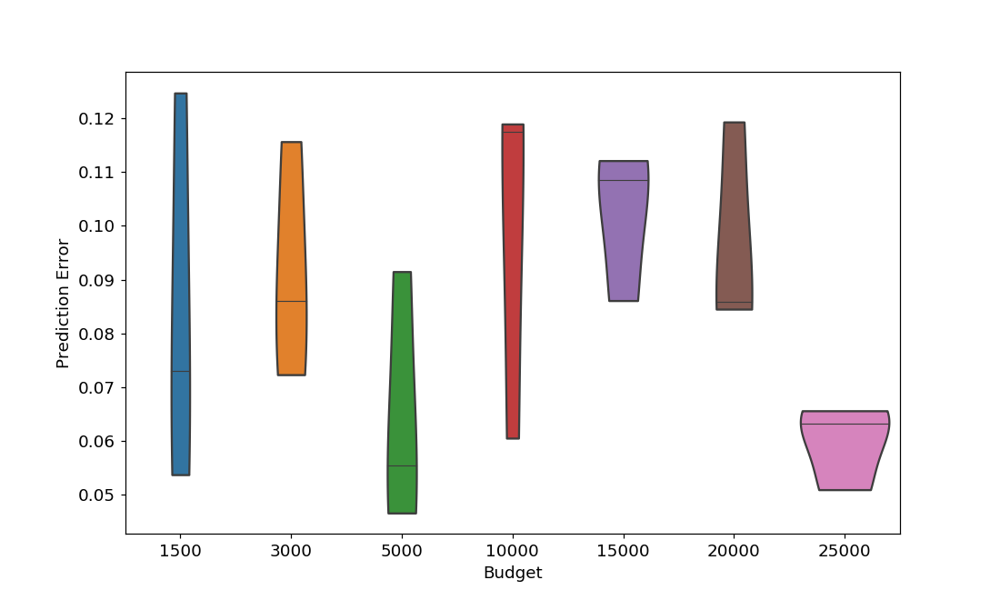

In [513]:
fig, ax = plt.subplots(figsize=(10,6))
# ax.set_xticks(range(len(budgets)))
# ax.set_xticklabels(budgets)
# ax1 = ax.twinx()
# ax1.scatter(range(len(budgets)), [np.mean(df_pred_err[df_pred_err["budget"]==budget]["err"]) for budget in budgets], marker='x', s=150, color='r', lw=10, label="Prediction Error")
# ax.bar(range(len(budgets)), [np.mean(df_pred_err[df_pred_err["budget"]==budget]["ert"]) for budget in budgets], yerr = [np.mean(df_pred_err[df_pred_err["budget"]==budget]["var"]) for budget in budgets], color='b', alpha=0.7, label="ERT")
# ax.legend()
# ax1.legend(loc=9)
# ax.ylabel("")
# fig.show()
sns.violinplot(x="budget", y="err", data= df_pred_err, ax=ax, cut=0, inner="stick")
ax.set_ylabel("Prediction Error")
ax.set_xlabel("Budget")
fig.show()
fig.savefig("F12_Pred_err_violin.pdf")

In [92]:
budgets = [1500,3000,5000,10000,15000,20000,25000]
for budget in budgets:
    print(np.mean(df_pred_err[df_pred_err["budget"]==budget]["err"]))
    print(np.mean(df_pred_err[df_pred_err["budget"]==budget]["ert"]))
    print(np.mean(df_pred_err[df_pred_err["budget"]==budget]["impr"]))
    print(np.mean(df_pred_err[df_pred_err["budget"]==budget]["var"]))

0.08382229532430674
4159.704000000001
-0.09268059448351955
2228.7094575700576
0.09132738381923929
2950.2613333333334
-0.10094692016820606
1326.5021948769488
0.0644706932817057
2980.5546666666664
-0.06938116400781154
1359.6365865327614
0.09897040984614676
3214.5333333333333
-0.11083372542733223
1651.8088929339756
0.11030049411798287
2782.272
-0.12397981278801384
1473.103675440641
0.09658527448755787
3295.786666666667
-0.10726695636546084
1585.8028172517359
0.059904373117798025
2790.5613333333336
-0.06377122131019138
1345.5998578939152


In [44]:
import seaborn as sns

<IPython.core.display.Javascript object>


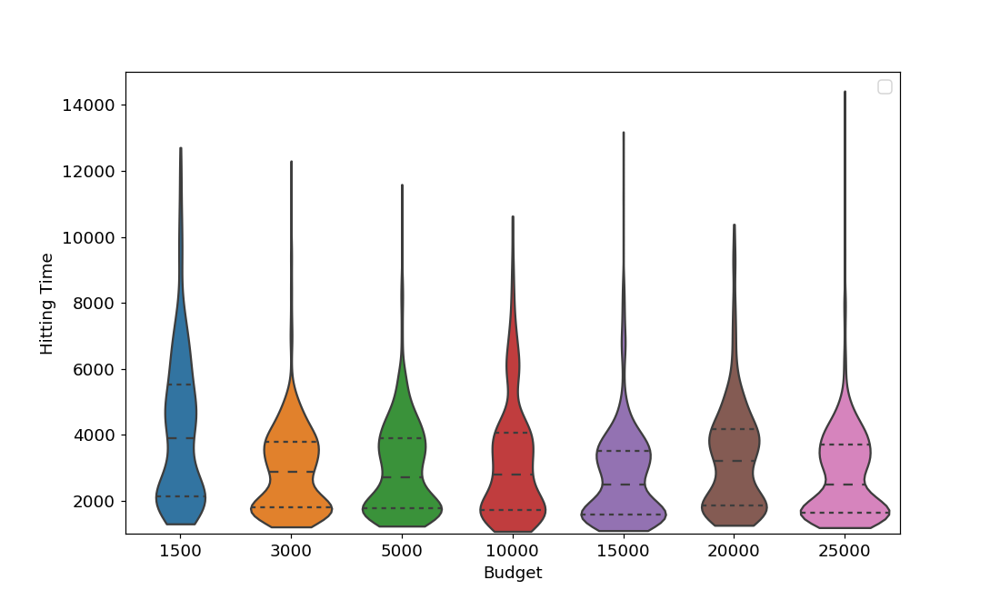

No handles with labels found to put in legend.


In [511]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(data=df_temp, x="budget", y="HT", inner="quartile", ax=ax, cut=0)

ax.set_ylim(1000,15000)
ax.legend()
# ax.set_yscale("log")
ax.set_xlabel("Budget")
ax.set_ylabel("Hitting Time")
fig.savefig("Budget_violins_F12.pdf")

# Appendix

## Exploring Nacim's data

In [196]:
nacim = pd.read_csv(f"{Data_loc}other/nacim.csv")

imprs = {}

for dim in np.unique(nacim["Dimension"]):
    for fid in np.unique(nacim["FID"]):
        data = nacim[nacim['FID']==fid]
        data = data[data['Dimension'] == dim]
        imprs[(fid,dim)] = abs(np.log10(10**-9+np.min(data['Performance']))-np.mean(np.log10(10**-9+data['Performance'])))
        

<IPython.core.display.Javascript object>


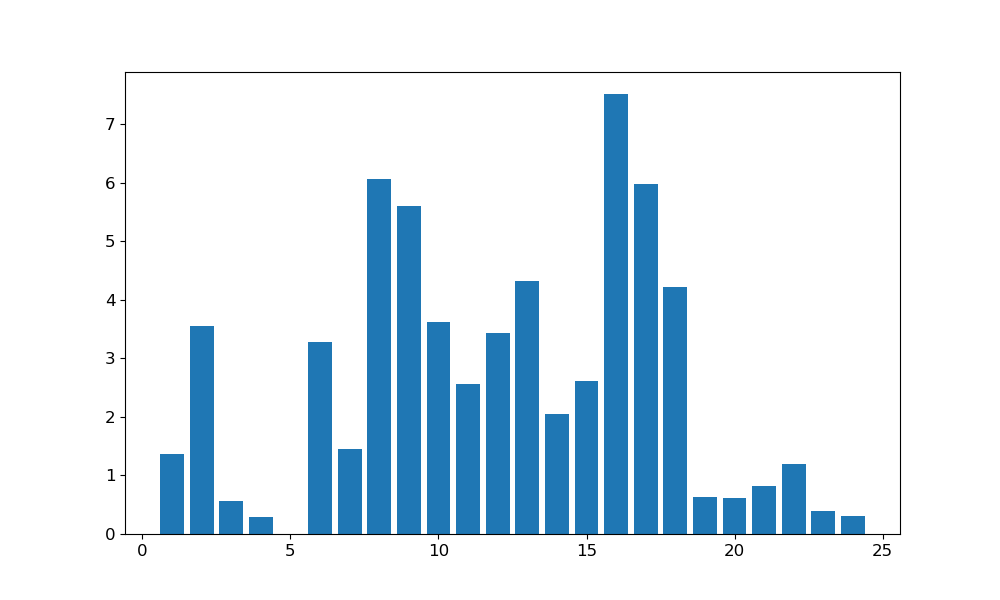

In [197]:
plt.figure(figsize=(10,6))
plt.bar(np.unique(nacim["FID"]), [imprs[(x, 5)] for x in np.unique(nacim["FID"])])
# plt.bar(np.unique(nacim["FID"]), [np.mean([imprs[(x, dim)] for dim in np.unique(nacim["Dimension"])]) for x in np.unique(nacim["FID"])])

plt.show()

While we do not know exactly what the default hyperparameters are (or exactly which configuration the used CMA-ES corresponds to), we can use this data to get an idea of the improvement gained when using optimized hyperparameters vs random ones. We compare the log-distances between the value reached with optimal hyperparameters vs the average log-distance by all hyperparameter values.

From this, it seems like F16 would be a good candidate for hyper-parameter tuning,

## Detecting what causes large improvements

In [306]:
normal_imprs = []
strange_imprs = []
for c in confs_tot:
    print(best_params[c][1], data[c]['c_c'][19], 1-best_erts[c]/default_erts[c], c)
    if (data[c]['c_c'][19] < 0.1):
        strange_imprs.append(1-best_erts[c]/default_erts[c])
        print(best_erts[c])
    else:
        normal_imprs.append(1-best_erts[c]/default_erts[c])

0.8272569634469998 0.4501995579928079 0.20303004365317123 1155
0.237939807240858 0.4501995579928079 0.23240002688352712 6
0.5857852369093014 0.04861196361538393 0.5888046166529266 3207
3546.88
0.29122993899648353 0.4497983804816624 0.2298816124681553 903
0.4519172885860933 0.4528301886792453 0.14032580737353528 1164
0.4931305861811748 0.4509803921568628 0.09813111318118306 2061
0.4464406448456511 0.4528301886792453 0.21431192660550458 1167
0.5968775307819232 0.4501995579928079 0.08924559002040344 1299
0.4877770663329694 0.4501995579928079 0.3580133363991722 147
0.4630530880412952 0.4501995579928079 0.15689649676452777 1302
0.6051627296828557 0.04861196361538393 0.6731205516014235 4374
4199.0
0.2576027011736131 0.4486346118633365 0.3048435521794176 1176
0.3872757002613418 0.4486346118633365 0.3310126582278481 918
0.5186088974509588 0.4486346118633365 0.3495902820671196 921
0.7047588378373679 0.4528301886792453 0.2337787651329003 1308
0.6051627296828557 0.04861196361538393 0.673120551601

## F16 pred

In [87]:
fid = 6
a = np.arange(4608)
np.random.shuffle(a)
for i in range(14):
    np.save(f"Statics_F{fid}_part{i}", a[8*i:8*(i+1)])

In [185]:
f6_vals = []
for c in a[:128]:
    try:
        data_params = pd.read_csv(f"{Data_loc}Statics_F6/F6_st_{c}", index_col=0)
        f6_val = np.min(data_params['fitness'])
        if (f6_val < 1250):
            print(c, f6_val)
            idx = np.argmin(data_params['fitness'])
            print(data_params['c_1'][idx], data_params['c_c'][idx], data_params['c_mu'][idx])
    except:
        continue


NameError: name 'a' is not defined

In [113]:
reprToInt([0,  1,  1,  0,  1,  0,  0,  1,  1,  1,   0])

1902

In [104]:
np.sort(f6_vals)

array([  1158.28      ,   1218.88      ,   1243.88      ,   1327.36      ,
         1334.68      ,   1392.        ,   1472.24      ,   1473.2       ,
         1473.24      ,   1513.56      ,   1576.64      ,   1705.92      ,
         1724.72      ,   1752.32      ,   1777.72      ,   1790.08      ,
         1804.8       ,   1846.28      ,   1862.32      ,   1892.8       ,
         1909.12      ,   2126.4       ,   2300.        ,   2490.24      ,
         3126.08      ,   3189.12      ,   3208.96      ,   3285.56      ,
         3841.76      ,   3926.68      ,   3936.08      ,   4023.44      ,
         4117.92      ,   4224.        ,   4232.4       ,   4258.88      ,
         4490.64      ,   6820.39130435,   7247.8       ,  10426.84      ,
        12862.33333333,  13051.44      ,  13910.4       ,  13995.6       ,
        14348.8       ,  14727.56      ,  14823.68      ,  15442.24      ,
        15603.4       ,  16598.48      ,  18255.36      ,  25145.6       ,
       111907.4       , 6

In [141]:
np.random.randint(0, 4608, (14, 4))

array([[1171, 4232, 1175, 4477],
       [ 561,  260, 4125,  504],
       [2044, 4175, 4167,  176],
       [ 672,  760,  534, 1604],
       [4510, 2794, 3036, 2335],
       [2592,  540, 4264, 1935],
       [3631, 3044, 3081, 1514],
       [2321, 2831,  874, 2665],
       [ 633, 4559, 1404, 1509],
       [3096,  606, 4452, 1710],
       [2603, 1807, 4134, 2458],
       [ 398, 1580, 4099, 1349],
       [1081, 3487, 4112,  560],
       [4493, 2937, 3785, 1739]])

In [183]:
df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{6}.csv", index_col=0)


In [184]:
erts_f6 = []
for c in range(4608):
    hts = np.array(df['10e-8.0'])[25*c:25*(c+1)]
    hts[np.isnan(hts)] = 50000
    erts_f6.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
np.min(erts_f6),np.argsort(erts_f6)[:100]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


(1106.36,
 array([2166, 2167, 2168, 2165, 2039, 1304, 2051, 1474, 1591, 1177, 1173,
        1303, 2040, 2036, 1301, 1762, 1178, 1592, 1590, 2050, 1754, 2038,
        1464, 1176, 2024, 1302, 2164, 1877, 1753, 2037, 2042, 2045, 2163,
        2023, 1475, 1752, 2041, 1185, 2031, 1446, 2049, 1184, 1447, 2047,
        2021, 1589, 1749, 1182, 1175, 1466, 2032, 1300, 1299, 1879, 2035,
        2034, 2022, 1875, 1760, 1160, 1463, 2044, 1880, 1465, 1761, 1462,
        1174, 1186, 2046, 2048, 2175, 1460, 1758, 2018, 1732, 1750, 1470,
        1748, 1588, 2020, 1459, 1735, 1187, 1756, 1759, 2160, 2019, 1183,
        2016, 1763, 1473, 2177, 2043, 1012, 1458, 1445, 1157, 1158, 1461,
        1170], dtype=int64))

In [90]:
fid = 16
f16_confs = []
for i in range(14):
    f16_confs.append(np.load(f"Statics_F{fid}_part{i}.npy"))
f16_confs = np.array(f16_confs).flatten()

In [63]:
succ_conf = []
f16_best_erts = []
f16_default_erts = []
for c in f16_confs:
    try:
        data =  pd.read_csv(f"{Data_loc}Statics_F16/F16_rep{c}.csv", header=None)
        data_params = pd.read_csv(f"{Data_loc}Statics_F16/F16_st_{c}", index_col=0)
        print(np.min(np.mean(data, axis = 1)))
        print(np.min(data_params['fitness']))
        print("__________")
        succ_conf.append(c)
        f16_best_erts.append(np.min(data_params['fitness']))
        f16_default_erts.append(data_params['fitness'][19])
    except:
        print("----NA----")

12202.2
16306.3
__________
----NA----
24187.84
302348.0
__________
18731.6
46829.0
__________
23728.56
36309.58823529412
__________
26607.12
39131.27777777778
__________
----NA----
21689.52
54223.8
__________
20729.6
43186.66666666666
__________
----NA----
30368.24
58880.15384615384
__________
17045.8
31481.46666666667
__________
----NA----
----NA----
----NA----
----NA----
11462.72
13025.818181818182
__________
13134.68
13681.958333333336
__________
17619.2
21722.285714285714
__________
21820.48
55155.2
__________
22110.08
92125.33333333331
__________
23665.36
197211.3333333333
__________
20781.28
52077.454545454544
__________
----NA----
----NA----
14738.56
15360.96
__________
24196.16
42022.0
__________
25000.0
37494.45
__________
----NA----
----NA----
24753.84
50003.23076923077
__________
19005.52
23938.9
__________
25994.04
146208.66666666663
__________
7420.64
8065.91304347826
__________
----NA----
23886.16
199596.0
__________
20752.96
43235.333333333336
__________
24698.24
30872.8

In [70]:
diff_vals = []
coeffs = []
to_predict = f16_best_erts
for rep in range(100):
    model = RandomForestRegressor(10)
    rep_vector = []
    selected_idx = np.random.choice(range(len(succ_conf)), 35, replace=False)
    values = []
    for i in selected_idx:
        c = succ_conf[i]
        rep = intToRepr(c)
        rep_vector.append(rep)
        values.append(to_predict[i])
    model.fit(rep_vector, values)
    test_set = np.setdiff1d(range(len(succ_conf)), selected_idx)
    rep_vector_test = []
    real_values = []
    for i in test_set:
        c = succ_conf[i]
        rep = intToRepr(c)
        rep_vector_test.append(rep)
        real_values.append(to_predict[i])
    preds = model.predict(rep_vector_test)
    diffs = []
    for i,j in zip(preds,real_values):
        diffs.append(1-min(i,j)/max(i,j))
    diff_vals.append(np.mean(diffs))
    coeffs.append(kendall_rank_coeff(preds, real_values))
#     print(np.mean(diff_vals), np.mean(coeffs))
print(np.mean(diff_vals), np.mean(coeffs))

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [71]:
vector_new = []
for i in range(4608):
    vector_new.append(intToRepr(i))
preds_new = model.predict(vector_new)  

In [72]:
np.min(preds_new)

10861.8817208238

In [73]:
np.argmin(preds_new)

598

In [76]:
np.mean(df['10e-8.0'][598*25:599*25])

6853.041666666667

In [93]:
erts_f16 = []
for c in range(4608):
    hts = np.array(df['10e-8.0'])[25*c:25*(c+1)]
    hts[np.isnan(hts)] = 50000
    erts_f16.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
np.min(erts_f16),np.argsort(erts_f16)[:100]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


(5088.72,
 array([ 899, 3187,  887,  602,  890,  595, 2902,  871,   61,  886,  889,
        1048,  868,  584,  601,    7,  892, 1033,  907,  580,   26,   25,
           4,  898,  439,  895,  148,  295,  307,  893,  310,  866,  883,
         760,  884, 3190,  583, 1030,  598,  904, 1013,  746,  169, 3203,
         608, 3188, 1016,  743,  922, 1045,  331,  184,  289,   22,  619,
        1051,   40, 3194,   58,  616,  721,  599, 3337,  149,  607,  322,
         613, 3193,  925,  454,    8, 3202,  896, 1028,  187, 1034,  605,
        1336, 2899,  872,  604,  596,   43,  739,  185,  328,  472,  781,
        3191,   23,  728,  727,  754, 1015,  763, 3196,  457,  905, 1063,
         325], dtype=int64))

In [86]:
succ_conf[np.argmin(f16_best_erts)]

884

In [84]:
erts_f16[884]

8725.44

In [81]:
np.sort(erts_f16)[:50]

array([5088.72      , 5150.16      , 5573.56      , 5863.24      ,
       6181.76      , 6586.72      , 6656.4       , 6769.04      ,
       6839.32      , 7019.25      , 7165.72      , 7199.08      ,
       7290.28      , 7329.        , 7360.76      , 7386.6       ,
       7393.04      , 7408.12      , 7459.6       , 7615.2       ,
       7732.4       , 7804.52      , 7899.        , 7924.44      ,
       8074.48      , 8122.8       , 8153.56      , 8155.04      ,
       8160.84      , 8285.04      , 8405.52      , 8416.36      ,
       8532.66666667, 8554.32      , 8725.44      , 8730.75      ,
       8767.54166667, 8903.2       , 8936.375     , 9124.79166667,
       9167.88      , 9228.84      , 9267.08333333, 9272.20833333,
       9284.92      , 9353.84      , 9383.68      , 9393.28      ,
       9421.24      , 9440.76      ])

In [64]:
len(succ_conf)

40

In [163]:
hts[np.isnan(hts)] = 50000
np.sum(hts == 50000)

16

In [165]:
for c in a[:4*14]:
    hts = np.array(df['10e-8.0'])[25*c:25*(c+1)]
    hts[np.isnan(hts)] = 50000
    print(np.sum(hts)/ (25-np.sum(hts == 50000)))

119733.77777777778
inf
396626.6666666667
183240.0
47839.529411764706
240515.6
inf
73721.71428571429
inf
inf
1239662.0
406407.3333333333
inf
186151.83333333334
67482.69230769231
12313.68
10718.958333333334
19829.043478260868
123938.0
401593.6666666667
168425.2857142857
inf
107494.9
inf
inf
14145.181818181818
26215.478260869564
inf
inf
inf
88469.66666666667
46071.75
inf
11551.24
inf
1240649.0
191789.33333333334
59807.92307692308
inf
79721.75
1229772.0
64447.46666666667
1226249.0
46169.375
35876.26315789474
inf
96932.2
63258.846153846156
100241.7
59907.07142857143
inf
189225.66666666666
114161.77777777778
71257.57142857143
8725.44
21384.041666666668


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


In [186]:
fid = 6
f6_confs_init = []
for i in range(14):
    f6_confs_init.append(np.load(f"Statics_F{fid}_part{i}.npy"))
f6_confs_init = np.array(f6_confs_init).flatten()
f6_confs = []

In [187]:
f6_vals = []
f6_def_vals = []
for c in f6_confs_init:
    try:
        data_params = pd.read_csv(f"{Data_loc}Statics_F6/F6_st_{c}", index_col=0)
        f6_val = np.min(data_params['fitness'])
        f6_vals.append(f6_val)
        f6_def_vals.append(data_params['fitness'][19])
        if (f6_val < 1250):
            print(c, f6_val)
            idx = np.argmin(data_params['fitness'])
            print(data_params['c_1'][idx], data_params['c_c'][idx], data_params['c_mu'][idx])
        f6_confs.append(c)
    except:
        continue

3461 1202.56
0.10918565028631552 0.8396180448575815 0.0
2019 1218.88
0.08520918047058733 0.9684760183844938 0.0
3923 1243.88
0.068141212039054 0.993474375598816 0.0


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)


4037 1230.4
0.08601755868612211 0.5836563121167245 0.0
2044 1214.4
0.1268404955919 0.8090802442863482 0.0
2191 1160.76
0.10840832897525136 0.9119964378279356 0.0
2181 1107.52
0.11080803796184653 1.100399115985616 0.0
1891 1170.36
0.08228315037597743 0.7760268168212505 0.0
4331 1173.44
0.04927483242179621 1.066276780044332 0.015632580222711218
1875 1158.28
0.059671515857157985 0.6025300921420377 0.0


In [189]:
len(f6_confs_init)

112

In [190]:
diff_vals = []
coeffs = []
to_predict = f6_def_vals
for rep in range(1000):
    model = RandomForestRegressor(100)
    rep_vector = []
    selected_idx = np.random.choice(range(len(f6_confs)), 90, replace=False)
    values = []
    for i in selected_idx:
        c = f6_confs[i]
        rep = intToRepr(c)
        rep_vector.append(rep)
        values.append(to_predict[i])
    model.fit(rep_vector, values)
    test_set = np.setdiff1d(range(len(f6_confs)), selected_idx)
    rep_vector_test = []
    real_values = []
    for i in test_set:
        c = f6_confs[i]
        rep = intToRepr(c)
        rep_vector_test.append(rep)
        real_values.append(to_predict[i])
    preds = model.predict(rep_vector_test)
    diffs = []
    for i,j in zip(preds,real_values):
        diffs.append(1-min(i,j)/max(i,j))
    diff_vals.append(np.mean(diffs))
    coeffs.append(kendall_rank_coeff(preds, real_values))
np.mean(diff_vals),np.mean(coeffs)

(0.6127598097091088, 0.5584105263157894)

In [48]:
[preds[np.argsort(real_values)[i]] for i in range(len(preds))]

[1214.7959999999998,
 1712.324,
 1599.348,
 3624.7465,
 1593.5840000000003,
 2071.7200000000003,
 8613.468444444443,
 8297.016444444444,
 3028.216,
 11085.608444444444,
 195065.8337777778,
 32600.79466666666,
 3280.572,
 64729.18400000001,
 376163.06799999997,
 14539.287999999997,
 15879.535999999998,
 268660.7638333334,
 446259.25688888895,
 103729.0822222222]

In [58]:
preds_new = model.predict([intToRepr(i) for i in range(4608)])
x = [(np.argsort(preds_new)[i], np.sort(preds_new)[i]) for i in range(50)]

In [59]:
[(x[i][0], x[i][1], np.mean(df['10e-8.0'][x[i][0]*25:(x[i][0]+1)*25])) for i in range(50)]

[(2040, 1265.032, 1210.96),
 (2037, 1265.032, 1246.12),
 (2181, 1265.032, 3048.3333333333335),
 (2184, 1265.032, 1685.0),
 (2034, 1314.536, 1285.16),
 (2182, 1331.216, 1949.16),
 (2041, 1331.216, 1254.28),
 (2185, 1331.216, 1608.64),
 (2038, 1331.216, 1236.6),
 (1752, 1363.4, 1252.52),
 (1893, 1363.4, 5240.8),
 (1749, 1363.4, 1272.2),
 (1896, 1363.4, 3240.24),
 (1753, 1371.976, 1245.6),
 (1897, 1371.976, 2406.6),
 (1750, 1371.976, 1320.48),
 (1894, 1371.976, 3513.68),
 (1746, 1378.512, 1376.04),
 (2035, 1380.72, 1285.0),
 (1747, 1387.0880000000002, 1367.64),
 (2043, 1425.792, 1346.76),
 (2019, 1437.916, 1331.0),
 (2163, 1443.6999999999998, 1250.56),
 (2082, 1452.4, 1470.28),
 (2085, 1466.616, 1360.12),
 (2022, 1467.116, 1286.96),
 (1756, 1471.192, 1328.04),
 (2166, 1472.8999999999999, 1106.36),
 (1755, 1476.192, 1391.56),
 (2079, 1477.152, 1516.96),
 (2044, 1478.4, 1291.32),
 (2046, 1480.816, 1302.4),
 (2049, 1480.816, 1265.44),
 (1794, 1513.976, 1567.96),
 (2083, 1514.904, 1462.4),
 (

## F12 ML for predicting ERT + hyperparams

In [117]:
for x in data[confs_tot[0]]:
    print(x)

c_1
c_c
c_mu
n_eval
fitness


In [123]:
c_conf = intToRepr(1232)[:10]
c_conf.append(0.1)
c_conf.append(0.4)
c_conf.append(0.1)
c_conf

[0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0.1, 0.4, 0.1]

In [125]:
ML_vars = []
ML_vals = []

for c in confs_tot:
    for i in range(len(data[c])):
        var = intToRepr(c)[:10]
        var.append(data[c]['c_1'][i])
        var.append(data[c]['c_c'][i])
        var.append(data[c]['c_mu'][i])
        ML_vars.append(var)
        ML_vals.append(data[c]['fitness'][i])


In [128]:
diff_vals = []
coeffs = []
for rep in range(5):
    model = RandomForestRegressor()
    rep_vector = []
    selected_idx = np.random.choice(range(len(ML_vals)), int(len(ML_vals)*0.9), replace=False)
    values = []
    for i in selected_idx:
        rep_vector.append(ML_vars[i])
        values.append(ML_vals[i])
    model.fit(rep_vector, values)
    test_set = np.setdiff1d(range(len(ML_vals)), selected_idx)
    rep_vector_test = []
    real_values = []
    for i in test_set:
        rep_vector_test.append(ML_vars[i])
        real_values.append(ML_vals[i])
    preds = model.predict(rep_vector_test)
    diffs = []
    for i,j in zip(preds,real_values):
        diffs.append(1-min(i,j)/max(i,j))
    diff_vals.append(np.mean(diffs))
    coeffs.append(kendall_rank_coeff(preds, real_values))
np.mean(diff_vals)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: F

0.17507644891018465

<IPython.core.display.Javascript object>


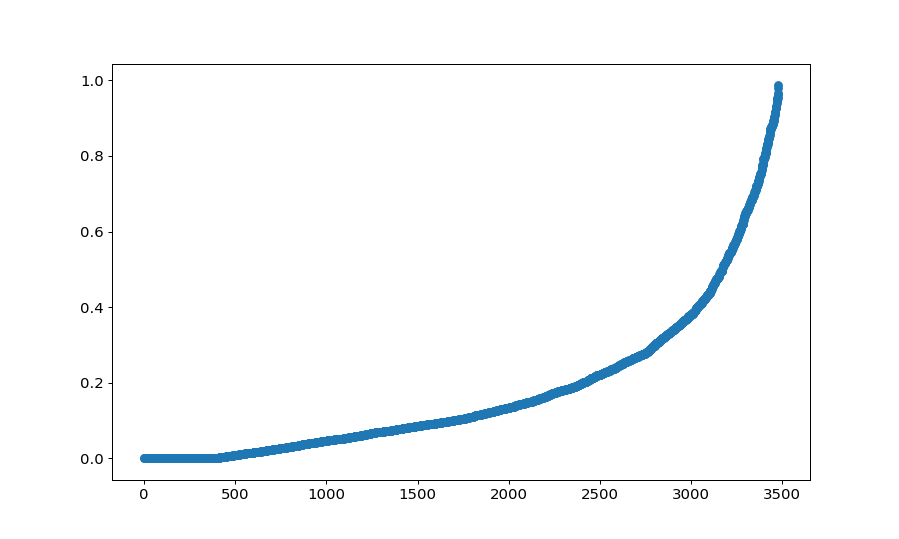

In [132]:
plt.figure(figsize=(10,6))
plt.scatter(range(len(diffs)),np.sort(diffs))

In [137]:
x = intToRepr(confs_tot[99])[:10]
vals_to_pred = []
for c1 in range(100):
    for cc in range(100):
        for cmu in range(100):
            y = x
            y.append(c1/100*0.3)
            y.append(cc/100)
            y.append(cmu/100*0.3)
            vals_to_pred.append(y)
len(vals_to_pred)

1000000

In [ ]:
model.predict(vals_to_pred)

## Predicting based on the 25 runs

In [169]:
df = pd.read_csv(f"{Data_loc}/Static_orig/ERT_data_5D-f12.csv", index_col=0)

In [170]:
idxs = [np.array(df["10e-8.0"]) == np.array(df["10e-8.0"])]
np.array(df["10e-8.0"])[idxs]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  


array([ 4785.92      ,  4700.12      ,  5558.08      , ...,
       48502.25      , 15511.84      , 93074.54545455])

In [184]:
len(vals_pred)

2676

In [191]:
samplesizes = [100, 200, 400, 800, 1600, 3200]

In [193]:
diffs_tot = []
coeffs_tot = []
idxs = [np.array(df["10e-8.0"]) < 50000]
selected_idxs = np.array(range(4608))[idxs]
vals_pred = np.array(df["10e-8.0"])[idxs]
print(len(vals_pred))
# vals_pred = np.nan_to_num(vals_pred, 500000)
for ssize in samplesizes:
    diff_vals = []
    coeffs = []
    for rep in range(10):
        model = RandomForestRegressor(100)
        rep_vector = []
        selected_idx = np.random.choice(range(len(vals_pred)), (ssize,), replace=False)
        values = []
        for i in selected_idx:
            c = selected_idxs[i]
            rep = intToRepr(c)[:10]
            rep_vector.append(rep)
            values.append(vals_pred[i])
        model.fit(rep_vector, values)
        test_set = np.setdiff1d(range(len(vals_pred)), selected_idx)
        rep_vector_test = []
        real_values = []
        for i in test_set:
            c = selected_idxs[i]
            rep = intToRepr(c)[:10]
            rep_vector_test.append(rep)
            real_values.append(vals_pred[i])
        preds = model.predict(rep_vector_test)
        diffs = []
        for i,j in zip(preds,real_values):
            diffs.append(1-min(i,j)/max(i,j))
        diff_vals.append(np.nanmean(diffs))
        coeffs.append(kendall_rank_coeff(preds, real_values))
    np.mean(diff_vals), np.mean(coeffs)
    diffs_tot.append(np.mean(diff_vals))
    coeffs_tot.append(np.mean(coeffs))
diffs_tot

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  after removing the cwd from sys.path.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """


2449


ValueError: Cannot take a larger sample than population when 'replace=False'

<IPython.core.display.Javascript object>


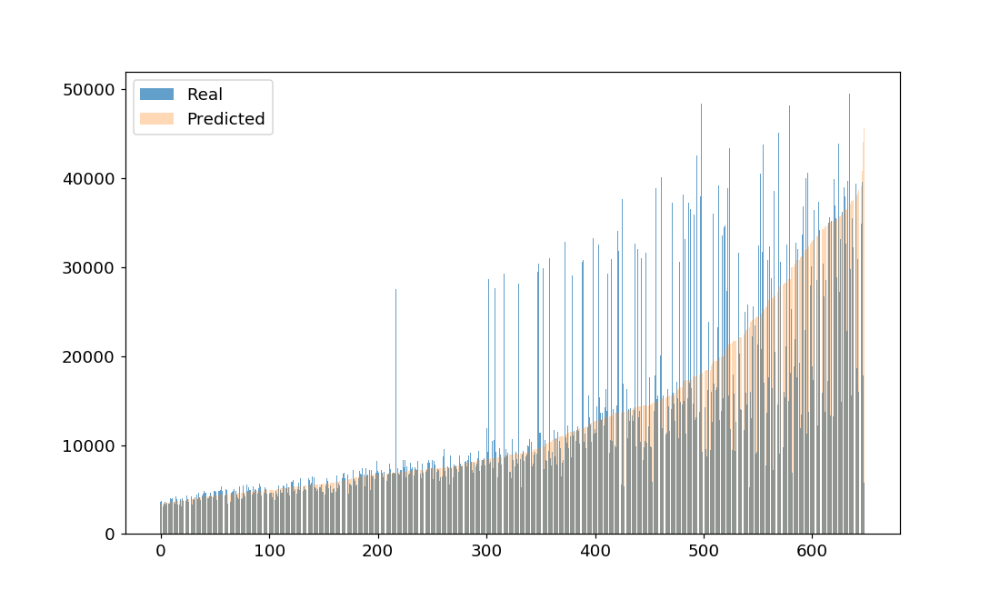

In [181]:
plt.figure(figsize=(10,6))
order = np.argsort(preds)
plt.bar(range(len(preds)), [real_values[i] for i in order],alpha=0.7, label = "Real")
plt.bar(range(len(preds)), [preds[i] for i in order],alpha=0.3, label= "Predicted")
plt.legend()
plt.show()

In [189]:
np.nanmean(diffs)
for i,j in zip(preds,real_values):
    if( 1-min(i,j)/max(i,j) > 0.3):
        print(i,j)

25280.108833333325 6399.72
9663.100000000002 25746.54166666667
9663.100000000002 5327.6
24001.25933333333 10507.24
24001.25933333333 35847.375
13554.482166666665 6460.28
13554.482166666665 7967.72
13554.482166666665 7334.8
7146.807999999999 4908.4
51601.977449275364 30053.2
44666.84602898551 30740.72
46705.22576811593 28041.68
62674.03954216074 26297.44
24087.214424275364 53293.5652173913
42247.40338164251 10477.56
13929.495766666665 36909.458333333336
13929.495766666665 38261.79166666666
45816.62398405797 24058.88
33633.40348888889 20624.08
33633.40348888889 16658.2
46315.16927294686 18558.04
46315.16927294686 18824.44
25213.372833333327 49724.260869565216
25213.372833333327 49644.43478260869
25213.372833333327 6364.92
22082.849166666674 5160.28
22082.849166666674 6706.8
11539.944333333335 25349.33333333333
11539.944333333335 25829.75
11539.944333333335 5302.76
21519.589499999995 9610.12
21519.589499999995 9623.64
21519.589499999995 9453.76
10643.028 7437.68
56774.94481159419 31919.12

In [177]:
np.median(preds), np.median(real_values)

(70011.13278780945, 21589.32)

<IPython.core.display.Javascript object>


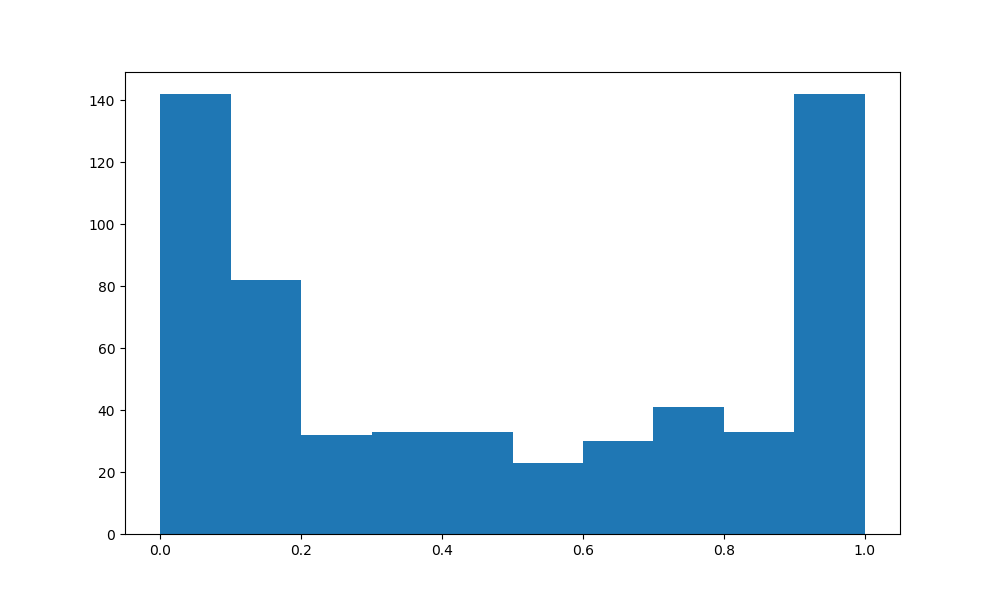

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([142.,  82.,  32.,  33.,  33.,  23.,  30.,  41.,  33., 142.]),
 array([7.60167311e-04, 1.00684151e-01, 2.00608134e-01, 3.00532117e-01,
        4.00456100e-01, 5.00380084e-01, 6.00304067e-01, 7.00228050e-01,
        8.00152033e-01, 9.00076017e-01, 1.00000000e+00]),
 <a list of 10 Patch objects>)

In [163]:
plt.figure(figsize=(10,6))
plt.hist(diffs)

In [139]:
df

,Representation,ndim,function ID,10e2.0,10e1.8,10e1.6,10e1.4,10e1.2,10e1.0,10e0.8,...,10e-6.2,10e-6.4,10e-6.6,10e-6.8,10e-7.0,10e-7.2,10e-7.4,10e-7.6,10e-7.8,10e-8.0
0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",5,12,639.08,659.44,681.40,698.12,750.08,805.60,920.44,...,4.354280e+03,4.413800e+03,4.471040e+03,4.519040e+03,4.561680e+03,4.608520e+03,4.649160e+03,4.699160e+03,4.745320e+03,4.785920e+03
1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",5,12,636.00,652.28,665.20,735.56,789.12,842.28,901.44,...,4.256240e+03,4.316280e+03,4.374040e+03,4.429920e+03,4.476960e+03,4.519600e+03,4.571040e+03,4.617960e+03,4.661240e+03,4.700120e+03
2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]",5,12,655.28,668.64,688.48,706.20,735.80,872.20,1000.56,...,5.069720e+03,5.134200e+03,5.201400e+03,5.261600e+03,5.311040e+03,5.356360e+03,5.396360e+03,5.446160e+03,5.496680e+03,5.558080e+03
3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]",5,12,587.32,597.40,613.76,632.56,673.60,720.88,801.48,...,3.662240e+03,3.700600e+03,3.748280e+03,3.795760e+03,3.842800e+03,3.888280e+03,3.928600e+03,3.971400e+03,4.006640e+03,4.044600e+03
4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]",5,12,580.12,596.20,609.68,629.40,696.76,760.08,886.76,...,3.485640e+03,3.515960e+03,3.557040e+03,3.600400e+03,3.644760e+03,3.688800e+03,3.720520e+03,3.754600e+03,3.786360e+03,3.814360e+03
5,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2]",5,12,622.52,636.52,650.72,665.88,708.24,757.88,848.40,...,3.771720e+03,3.814120e+03,3.859760e+03,3.903440e+03,3.952920e+03,3.993760e+03,4.030320e+03,4.070280e+03,4.107400e+03,4.141000e+03
6,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0]",5,12,531.08,545.52,558.72,597.60,650.16,696.60,816.16,...,3.555480e+03,3.596600e+03,3.640400e+03,3.693400e+03,3.736840e+03,3.772240e+03,3.806360e+03,3.849480e+03,3.885880e+03,3.915720e+03
7,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1]",5,12,514.24,529.12,543.60,555.16,567.04,580.72,624.28,...,3.832440e+03,3.890000e+03,3.935560e+03,3.984840e+03,4.023560e+03,4.069000e+03,4.113240e+03,4.164280e+03,4.239200e+03,4.280880e+03
8,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2]",5,12,525.48,541.56,556.56,593.44,623.16,680.72,837.04,...,3.446360e+03,3.492400e+03,3.538120e+03,3.573400e+03,3.613200e+03,3.658760e+03,3.699760e+03,3.737520e+03,3.772440e+03,3.809200e+03
9,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]",5,12,607.24,631.40,655.68,675.80,733.16,786.24,875.24,...,5.769840e+03,5.856160e+03,5.930120e+03,6.020000e+03,6.093120e+03,6.157200e+03,6.217960e+03,6.282520e+03,6.336200e+03,6.399720e+03


In [26]:
vals = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{867}_optimized.csv", header = None))[0]
np.mean(vals[:50]),np.mean(vals[50:100]),np.mean(vals[100:150]),np.mean(vals[150:200]),np.mean(vals[200:250]),

(3278.72, 1887.84, 3839.36, 1943.2, 2064.48)

In [27]:
vals = np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{867}_default.csv", header = None))[0]
np.mean(vals[:50]),np.mean(vals[50:100]),np.mean(vals[100:150]),np.mean(vals[150:200]),np.mean(vals[200:250]),

(3719.52, 2758.56, 4223.52, 2512.0, 2701.44)

In [25]:
# vals[0][:2]

array([3208, 2784], dtype=int64)

In [19]:
best_params[867][0], best_params[867][1], best_params[867][2]

(0.07674210949214576, 0.2877980157050455, 0.1420801768479136)

In [18]:
np.mean([2320,2928,4960,14824,8048,2416,5280,2152,12072,8560,12056,5496,2920,2824,2432,2296,8448,5096,2200,14720,2712,4960,8736,4744,2496,5128,2720,10776,2120,4760,4960,5976,2384,5912,11968,10992,3008,2328,2096,2968,14816,8384,25000,2992,5552,8520,5576,14808,13744,3072,1416,1600,3920,1680,1408,1512,3840,1416,4272,1256,1248,4464,1392,1368,1576,1416,1664,1336,1456,7568,1616,1520,4216,1376,6904,1336,1272,1368,1368,5984,5784,1328,1336,1616,1680,1256,1320,1520,1256,1216,1416,1280,1416,7472,6048,1552,1400,7848,2016,3224,2744,4536,18472,5176,17920,8640,20520,6232,9640,5816,8712,4032,11832,14808,8712,6288,9440,5256,6344,8864,14192,11048,2592,1848,14912,8360,18224,2760,14800,3144,5272,2872,3080,11952,8432,5864,11008,3000,8280,25000,3056,2936,20976,6184,9016,5752,9144,25000,9184,5360,1408,1544,1504,1384,1544,1416,1552,1392,1240,1352,3112,3944,1376,1112,1440,1304,1432,1392,1384,1312,1472,1440,1608,1288,4112,1320,1440,4976,4248,1848,1560,3944,1216,7584,1536,1280,6800,1192,1384,1200,1808,1224,6224,1336,1680,1584,1416,4160,1568,4456,1752,1816,2304,4888,5088,1968,7496,1816,1472,1672,1880,2056,1880,2104,4584,5104,1888,1616,1512,4408,1672,1784,1888,1664,2040,1640,1760,1872,1680,1864,1656,1768,1736,2208,2248,1576,4848,2032,2040,1904,4392,2104,4680,5168,2032,1696,1712,1864,8112,2048])


4593.12

## Differences between instances

In [129]:
rankings = []
for fid in range(24):
    fid = fid + 1
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    rankings.append(ss.rankdata([np.mean(df['10e-8.0'][i*25*3:(i+1)*25*3]) for i in range(int(4608/3))]))


In [142]:
rankings = []
for fid in range(24):
    fid = fid+1
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    erts_fx = []
    for c in range(4608):
        if fid == 1:
            hts = np.array(df[targets_per_fid[fid-1]])[20*c:20*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
        else:
            hts = np.array(df[targets_per_fid[fid-1]])[25*c:25*(c+1)]
            hts[np.isnan(hts)] = 50000
            erts_fx.append(np.sum(hts)/ (25-np.sum(hts == 50000)))
    rankings.append(ss.rankdata(erts_fx))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  


In [133]:
scipy.stats.kendalltau(rankings[0], rankings[1])[0]

-0.020224314984255014

In [401]:
import scipy.stats

In [143]:
len(rankings[0])

4608

In [146]:
corrs = np.zeros((24,24))
for i in range(24):
    for j in range(24):
        corrs[i,j] = scipy.stats.kendalltau(rankings[i],rankings[j])[0]

In [147]:
np.mean(corrs)

0.41202386557110354

In [378]:
(np.sum(corrs2)-120)/(119*119)

0.3555589468270371

<IPython.core.display.Javascript object>


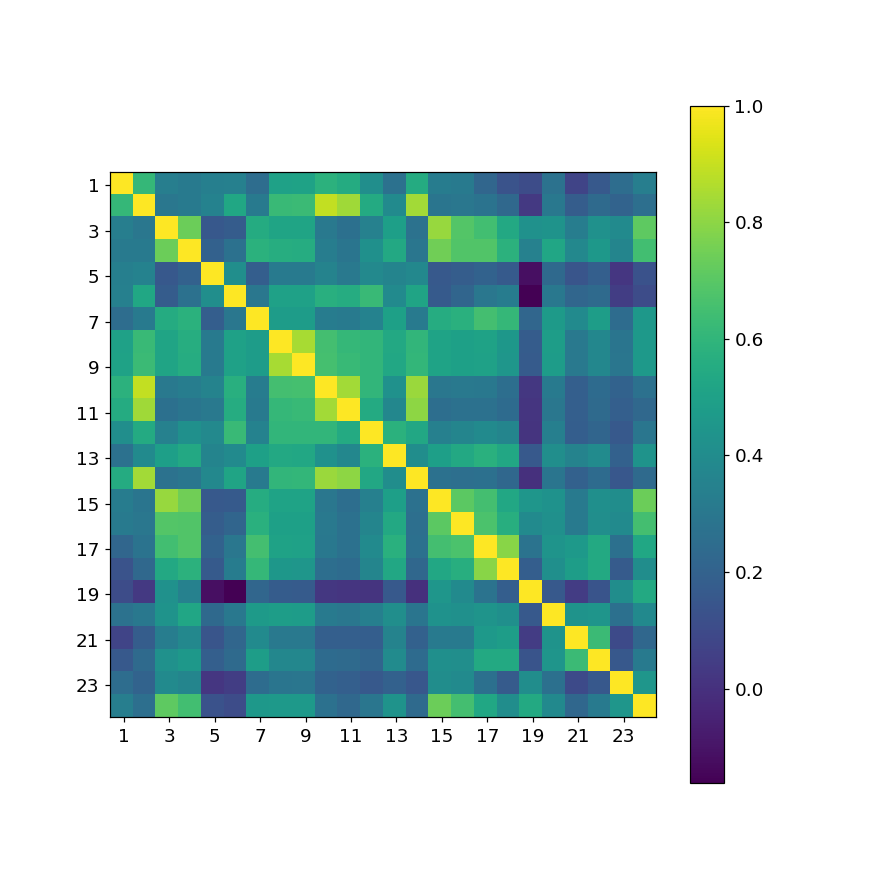

In [233]:
plt.figure(figsize=(8,8))
plt.imshow(corrs)
plt.xticks([(2*i)+0.1 for i in range(12)],[2*i+1 for i in range(12)])
plt.yticks([(2*i)+0.1 for i in range(12)],[2*i+1 for i in range(12)])
plt.colorbar()
plt.show()

In [291]:
rankings2 = []
for fid in range(24):
    fid = fid+1
    df = pd.read_csv(f"{Data_loc}/Static_orig/interpolated_ART_data_5D-f{fid}.csv", index_col=0)
    for iid in range(5):
        erts_fx = []
        for c in range(4608):
            if fid == 1:
                hts = np.array(df[targets_per_fid[fid-1]])[20*c+4*iid:20*(c)+(4*(iid+1))]
                hts[np.isnan(hts)] = 50000
                erts_fx.append(np.sum(hts)/ (4-np.sum(hts == 50000)))
            else:
                hts = np.array(df[targets_per_fid[fid-1]])[25*c+5*iid:25*c+(iid+1)*5]
                hts[np.isnan(hts)] = 50000
                erts_fx.append(np.sum(hts)/ (5-np.sum(hts == 50000)))
        rankings2.append(ss.rankdata(erts_fx))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in double_scalars
  from ipykernel import kernelapp as app


In [294]:
corrs2 = np.zeros((24*5,5*24))
for i in range(24*5):
    for j in range(24*5):
        corrs2[i,j] = scipy.stats.kendalltau(rankings2[i],rankings2[j])[0]

In [295]:
np.mean(corrs2)

0.3579909893067828

<IPython.core.display.Javascript object>


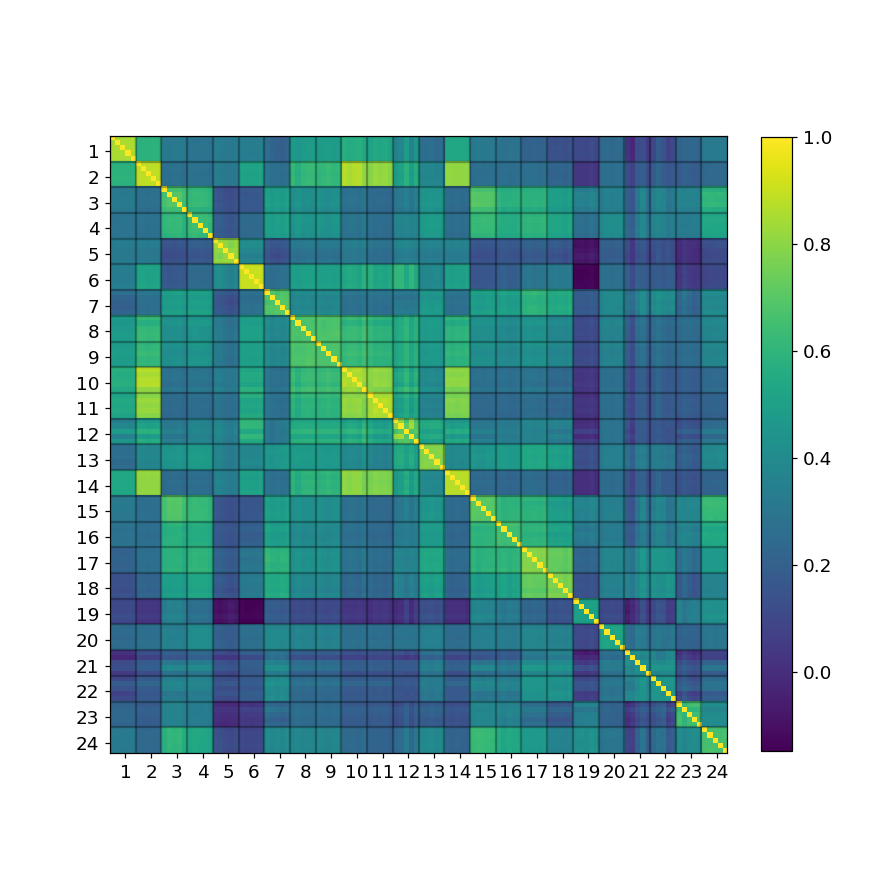

In [305]:
plt.figure(figsize=(8,8))
plt.imshow(corrs2,cmap="viridis")
plt.xticks([i*5+2.5 for i in range(24)],[i+1 for i in range(24)])
plt.yticks([i*5+2.5 for i in range(24)],[i+1 for i in range(24)])
for i in range(24):
    plt.axhline(i*5-0.5,color='k',alpha=0.3)
    plt.axvline(i*5-0.5,color='k',alpha=0.3)
plt.grid(False)
plt.colorbar(fraction=0.045)
# plt.colorbar()
plt.savefig("Inst_kendall_corr_full.pdf")
plt.show()

<IPython.core.display.Javascript object>


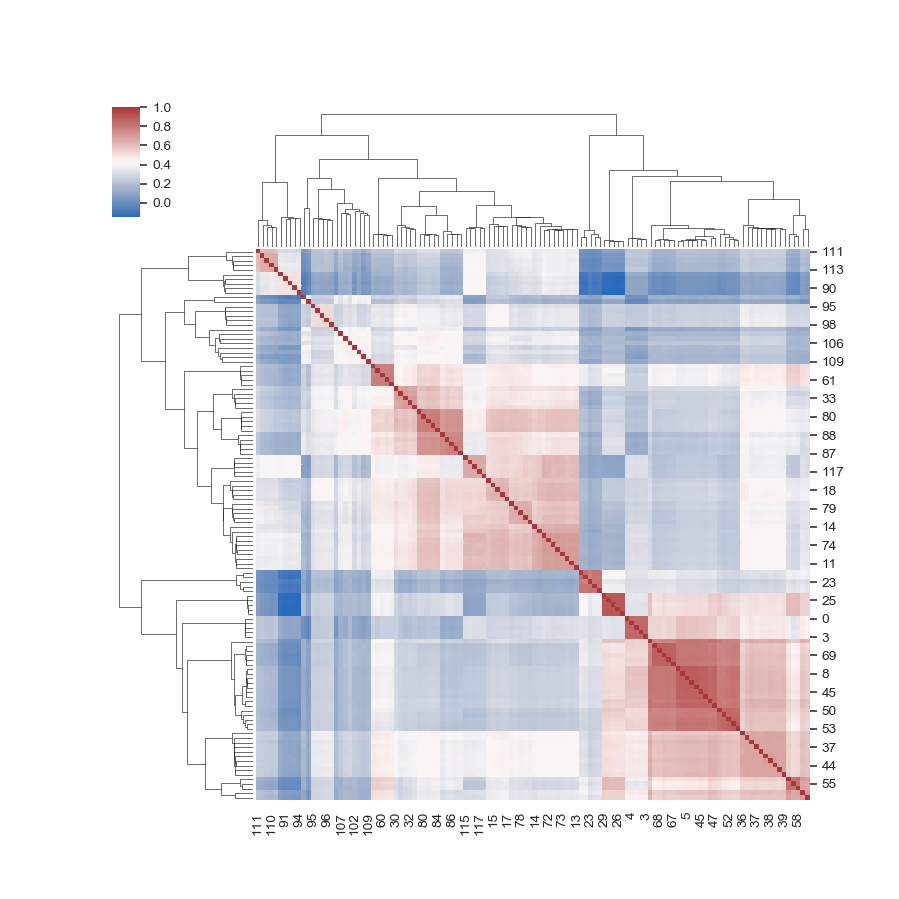

In [396]:
sns.clustermap(corrs2, cmap="vlag")

In [336]:
clustergrid.dendrogram_row.reordered_ind

[111,
 112,
 114,
 110,
 113,
 93,
 91,
 92,
 90,
 94,
 100,
 101,
 95,
 97,
 99,
 96,
 98,
 104,
 107,
 103,
 106,
 102,
 105,
 108,
 109,
 62,
 63,
 60,
 61,
 64,
 30,
 31,
 33,
 32,
 34,
 83,
 80,
 82,
 81,
 84,
 88,
 89,
 86,
 85,
 87,
 115,
 116,
 119,
 117,
 118,
 19,
 15,
 18,
 16,
 17,
 76,
 79,
 78,
 75,
 77,
 14,
 10,
 71,
 72,
 74,
 70,
 73,
 12,
 11,
 13,
 20,
 21,
 23,
 22,
 24,
 29,
 25,
 28,
 26,
 27,
 0,
 4,
 1,
 2,
 3,
 49,
 66,
 68,
 69,
 65,
 67,
 7,
 8,
 5,
 6,
 9,
 45,
 48,
 46,
 47,
 50,
 54,
 52,
 51,
 53,
 36,
 40,
 42,
 37,
 41,
 43,
 38,
 44,
 35,
 39,
 56,
 55,
 58,
 57,
 59]

In [340]:
mean_corrs = []
min_corrs = []
for i in range(24):
    mean_corrs.append(np.mean(corrs2[5*i:5*(i+1),5*i:5*(i+1)]))
    min_corrs.append(np.min(corrs2[5*i:5*(i+1),5*i:5*(i+1)]))

mean_corrs

[0.8828478091504088,
 0.909199288178572,
 0.7322190596974946,
 0.7006783193838055,
 0.8503472488085552,
 0.9223912887024426,
 0.7502886233614143,
 0.7406543406838461,
 0.742516308151044,
 0.8770572031977545,
 0.8880098790751552,
 0.7800909231869398,
 0.8304704249993188,
 0.9030787528738964,
 0.7631154090918826,
 0.7193352971176594,
 0.8313066520850155,
 0.8144124771667407,
 0.6002161405212988,
 0.615104083957065,
 0.5235910059557775,
 0.5588069018030155,
 0.7083988939822454,
 0.7317466353305491]

<IPython.core.display.Javascript object>


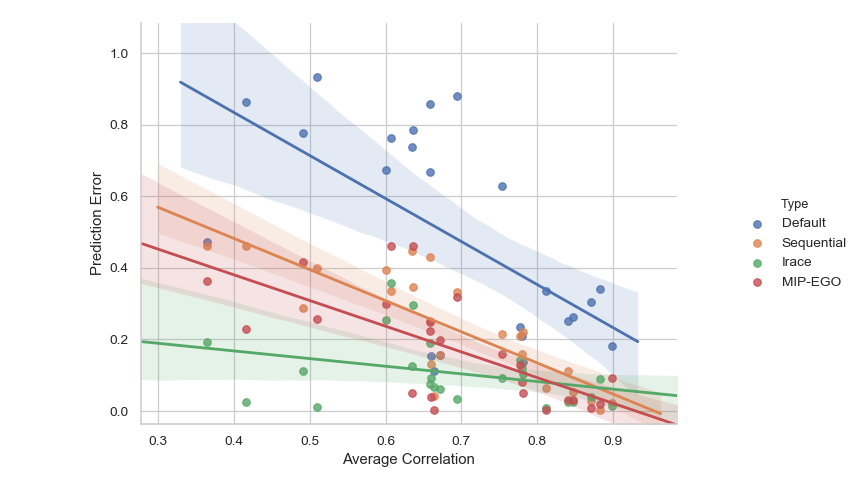

In [341]:
# plt.figure(figsize=(10,6))
records = []
for i in range(24):
    records.append((min_corrs[i], pred_err_def[i], "Default"))
    records.append((min_corrs[i], pred_err_seq[i], "Sequential"))
    records.append((min_corrs[i], pred_err_ira[i], "Irace"))
    records.append((min_corrs[i], pred_err_mip[i], "MIP-EGO"))
df_temp_corr = pd.DataFrame.from_records(records, columns=["Average Correlation", "Prediction Error", "Type"])
sns.lmplot(data = df_temp_corr, x="Average Correlation", y="Prediction Error", hue="Type")
# plt.scatter(mean_corrs, pred_err_ira)
# plt.scatter(mean_corrs, pred_err_seq)
# plt.scatter(mean_corrs, pred_err_mip)
# plt.show()

In [302]:
records = []
idxs = [np.argsort([1-x/y for x,y in zip(opt_vals,def_vals)])[x] for x in [0,1,2,56,57,58,109,112, 113, -3,-2,-1]]
for c in idxs:
    opt_vals_temp = data_full[c]
    def_vals_temp = data_full_def[c]
    for inst in range(5):
        for i in range(50*inst,(inst+1)*50):
            records.append((confs_tot[c],opt_vals_temp[i], "Optimized", inst))
            records.append((confs_tot[c],def_vals_temp[i], "Default", inst))
        
df_temp = pd.DataFrame.from_records(records, columns=["Conf","ERT", "Type", "Inst"])

<IPython.core.display.Javascript object>


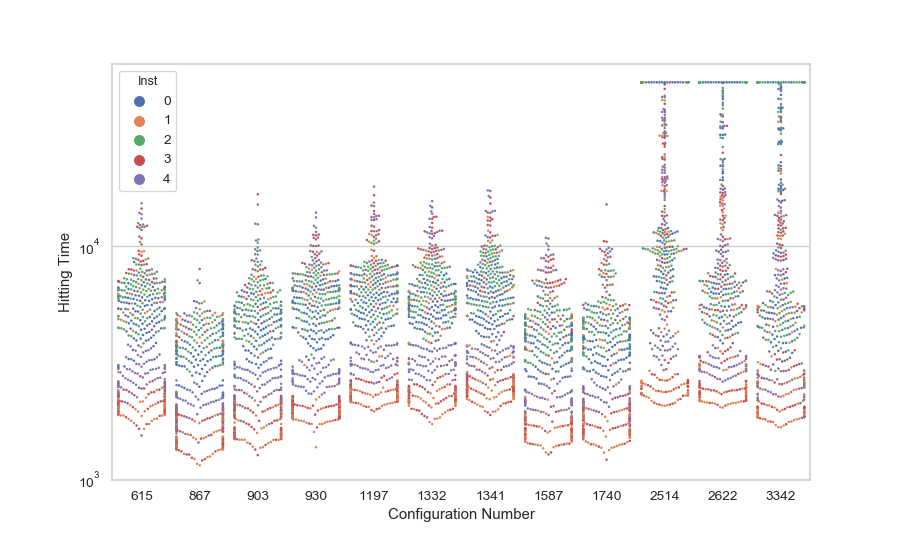

Text(0, 0.5, 'Hitting Time')

In [516]:
fig, ax = plt.subplots(figsize=(10,6))

sns.swarmplot(ax=ax, x="Conf", y="ERT", data=df_temp, hue="Inst",size=2) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(1000,60000)
ax.set_yscale('log')
# ax.axhline(50000,color='k',ls='--',alpha=0.9)
# ax.grid(False)
ax.set_xlabel("Configuration Number")
ax.set_ylabel("Hitting Time")


In [519]:
df_temp_cut = df_temp[df_temp["ERT"] < 30000]

<IPython.core.display.Javascript object>


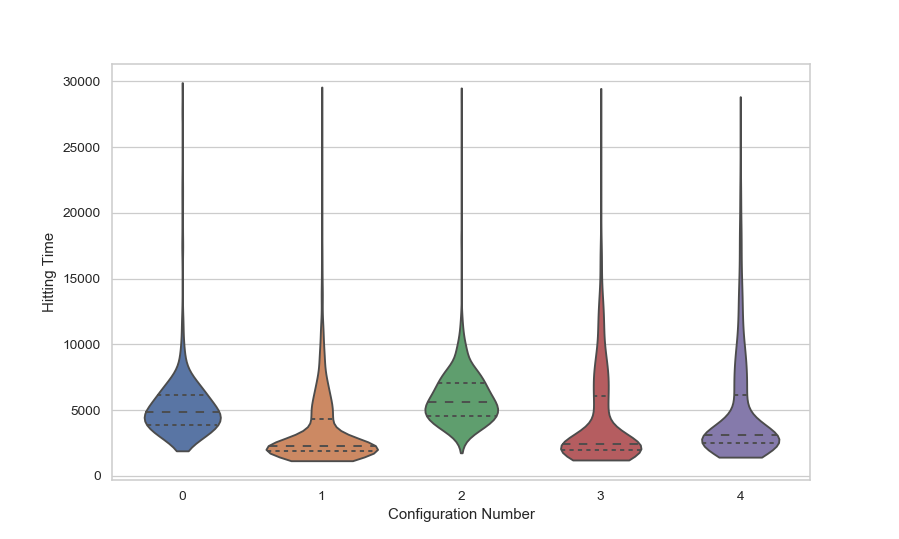

Text(0, 0.5, 'Hitting Time')

In [521]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Inst", y="ERT", data=df_temp_cut, inner="quartile", cut=0) #, palette={"Default":"red", "Optimized":"blue"}
# ax.set_ylim(250,750)

ax.set_xlabel("Configuration Number")
ax.set_ylabel("Hitting Time")

In [99]:
[[1-x/y for x,y in zip(opt_vals,def_vals)][x] for x in idxs]

[-0.2026750639044863,
 -0.1348372358652199,
 0.0392914248947247,
 0.0392914248947247,
 0.1374596661958909,
 0.1374596661958909,
 0.8081845082367936,
 0.826595717296689]

Using this data, we will first show the individual hitting times of the final target for each configuration, both with the default and optimized hyperparameters.

In [105]:
import seaborn as sns
# sns.set(style="whitegrid")

In [35]:
tips = sns.load_dataset("tips")

<IPython.core.display.Javascript object>


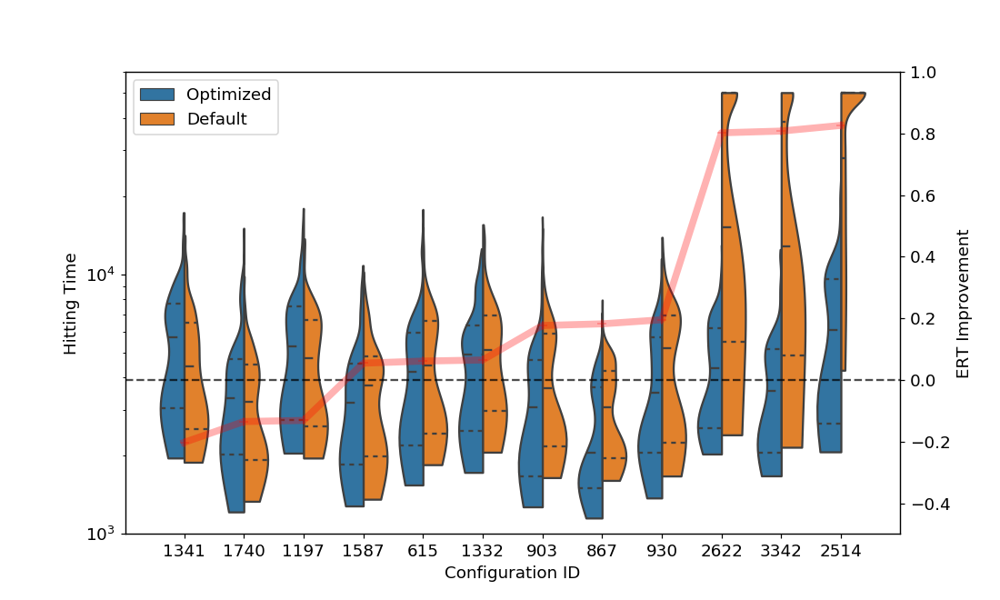

In [312]:
fig, ax = plt.subplots(figsize=(10,6))
sns.violinplot(ax = ax, x="Conf", y="ERT", hue="Type", data=df_temp, split=True, inner="quartile",scale="count", cut=0, order = [confs_tot[x] for x in idxs]) #, palette={"Default":"red", "Optimized":"blue"}
ax.set_ylim(1000,60000)
ax.set_yscale('log')
# ax.axhline(50000,color='k',ls='--',alpha=0.9)
# ax.grid(False)
ax.set_xlabel("Configuration ID")
ax.set_ylabel("Hitting Time")
ax.legend()
axy1 = ax.twinx()
axy1.axhline(0,color='k',ls='--',alpha=0.7)
axy1.set_ylim(-0.5,1)
axy1.plot(range(len(idxs)), [[1-x/y for x,y in zip(opt_vals,def_vals)][x] for x in idxs], marker="+", color="red", alpha=0.3,lw=5)
axy1.set_ylabel("ERT Improvement")
axy1.grid(False)
fig.show()
fig.savefig("Violin_plots_F12.pdf")

In [719]:
idx = np.argsort([1-x/y for x,y in zip(opt_vals,def_vals)])[0]
ss.stats.mannwhitneyu(data_full[idx],data_full_def[idx])

MannwhitneyuResult(statistic=24173.0, pvalue=5.913030345003815e-06)

In [731]:
nr_succ = 0
data_def = data_full_def[idxs[0]]
data_opt = data_full[idxs[0]]
for rep in range(1000000):
    temp_def = 0
    temp_opt = 0
    for inst in range(5):
        temp_def += np.sum(np.random.choice(data_def[inst*50:(1+inst)*50]))
        temp_opt += np.sum(np.random.choice(data_opt[inst*50:(1+inst)*50]))
    if temp_def >= temp_opt:
        nr_succ = nr_succ + 1
print(nr_succ)

265938


<IPython.core.display.Javascript object>


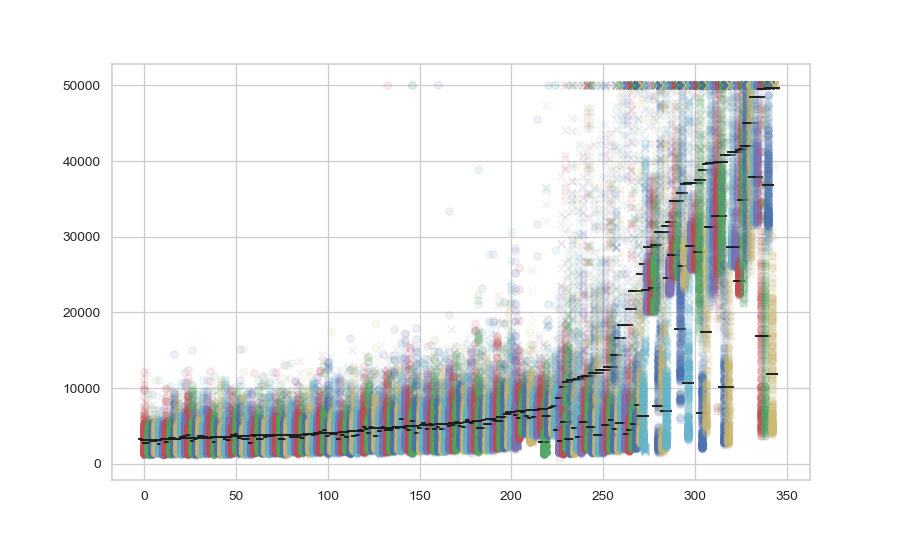

3297
3297


In [88]:
plt.figure(figsize=(10,6))
order = np.argsort(def_vals)
i = 0
j = 0
colors = ['r','g','b','y','c','m']
for c in order:
    try:
        plt.scatter(i*np.ones((250,)), np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{confs_tot[c]}_optimized.csv", header = None)).flatten(), color = colors[j%6],alpha=0.1)
        plt.scatter(i,opt_vals[c],color='k', s=100, marker="_")
        plt.scatter((i+1)*np.ones((250,)), np.array(pd.read_csv(f"{Data_loc}250runs/F12_rep{confs_tot[c]}_default.csv", header = None)).flatten(), marker='x',alpha=0.1, color= colors[j%6])
        plt.scatter((i+1),def_vals[c],color='k', s=100, marker="_")
        j += 1
        i += 2
    except: 
        print(confs_tot[c])
plt.show()

From this figure, we can see see that the distribution of hitting times is not quite normal, and the variance is quite large relative to the difference between ERTs. We can now use this information to recreate the experiment we performed for F21 to determine how much of the ranking difference can be explained by variance.

## Statistical tests


In [34]:
best_10_idx = np.argsort(def_vals)[:10]
best_10_confs = [confs_tot[i] for i in best_10_idx]

In [37]:
best_10_idx

array([116,  95, 101, 111, 106,  99,  63, 108,  90,  89], dtype=int64)

In [ ]:
data_full

In [38]:
df_best = np.zeros((10,250))
k=0
for i,j in zip(best_10_idx, best_10_confs):
    df_best[k] = data_full[i]
    k+=1
df_best

array([[2657., 2405., 3719., ..., 2163., 5363., 1672.],
       [3320., 3616., 2544., ..., 2136., 4344., 2112.],
       [3320., 3616., 2544., ..., 2136., 4344., 2112.],
       ...,
       [3277., 3129., 4343., ..., 2148., 2317., 1875.],
       [3029., 4224., 4371., ..., 2121., 1988., 2275.],
       [4066., 4450., 4580., ..., 6897., 2574., 2378.]])

In [43]:
np.savetxt("Testdata_F12_HTs.csv", df_best, delimiter=',')

In [34]:
best_10_idx = np.argsort(opt_vals)[:10]
best_10_confs = [confs_tot[i] for i in best_10_idx]

In [37]:
best_10_idx

array([116,  95, 101, 111, 106,  99,  63, 108,  90,  89], dtype=int64)

In [49]:
df_best = np.zeros((20,250))
k=0
for i,j in zip(best_10_idx, best_10_confs):
    df_best[k] = data_full_def[i]
    k+=1
    df_best[k] = data_full[i]
    k+=1
df_best

array([[3462., 3674., 3402., ..., 2340., 1877., 1787.],
       [2657., 2405., 3719., ..., 2163., 5363., 1672.],
       [4832., 3080., 3168., ..., 2296., 2336., 2400.],
       ...,
       [3029., 4224., 4371., ..., 2121., 1988., 2275.],
       [2922., 3862., 4620., ..., 2419., 2397., 4532.],
       [4066., 4450., 4580., ..., 6897., 2574., 2378.]])

In [50]:
np.savetxt("Testdata_F12_HTs_full.csv", df_best, delimiter=',')

## rerun of param value distr

In [470]:
test = np.loadtxt(open("F12_rep4374.csv", "rb"), delimiter=",", skiprows=0)

In [471]:
len(test)

200

In [472]:
1-np.min([calc_ert(test[i]) for i in range(200)])/calc_ert(test[19])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


0.6428418556028912

In [473]:
new_250_erts = [calc_ert(test[i]) for i in range(200)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


In [474]:
np.argmin(new_250_erts)

62

In [397]:
calc_ert(test[116])

3969.312

In [395]:
np.argmin(data[918]['fitness'])

116

In [398]:
data[918]['fitness'][178]

4883.478260869565

In [479]:
min(new_250_erts)

4308.32

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


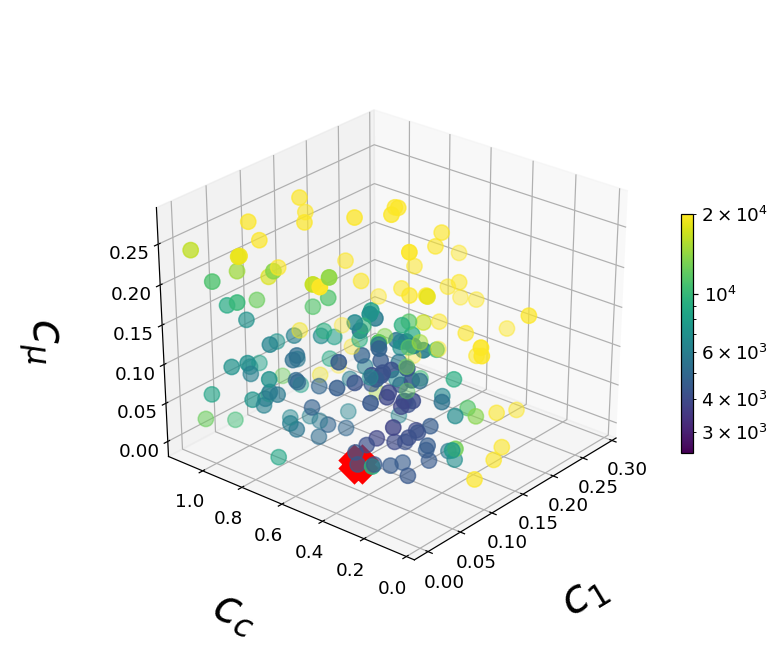

<IPython.core.display.Javascript object>


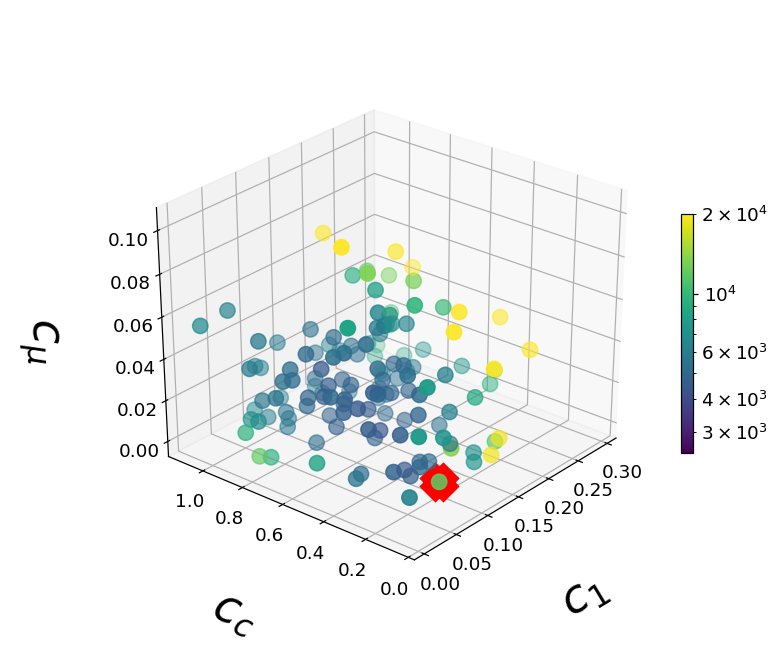

In [484]:
# idx_nr = 12
# conf_nr = 918 #4374
for conf_nr in [918, 4374]:
    test = np.loadtxt(open(f"F12_rep{conf_nr}.csv", "rb"), delimiter=",", skiprows=0)
    new_250_erts = [calc_ert(test[i]) for i in range(200)]
    data_single = np.array(data[conf_nr]).T
    fig = plt.figure(figsize=(7,6))
    ax = fig.add_subplot(111, projection='3d')
    p = ax.scatter(data_single[0], data_single[1], data_single[2], c=[calc_ert(test[i]) for i in range(200)],cmap='viridis', vmin=2500, vmax=20000, s=100, norm=colors.LogNorm(vmin=2500, vmax=20000))
    ax.scatter(data_single[0][19], data_single[1][19], data_single[2][19], color='r', s=250, marker='x', lw=15)
#     ax.scatter(data_single[0][np.argmin(data[conf_nr]['fitness'])], data_single[1][np.argmin(data[conf_nr]['fitness'])], data_single[2][np.argmin(data[conf_nr]['fitness'])], color='k', s=250, marker='x', lw=15)
#     ax.scatter(data_single[0][np.argmin(new_250_erts)], data_single[1][np.argmin(new_250_erts)], data_single[2][np.argmin(new_250_erts)], color='b', s=250, marker='x', lw=15)
    ax.set_xlabel("\n$c_1$", fontsize=30, rotation = 0, linespacing=3.2)
    ax.set_ylabel("\n$c_c$", fontsize=30, rotation = 0, linespacing=3.2)
    ax.set_zlabel("\n$c_{\mu}$", fontsize=30, rotation = 0, linespacing=3.2)
    ax.view_init(30, 220)
    fig.colorbar(p, label="ERT", fraction=0.02, pad=0.01)
    # plt.title(f"F12 (config {confs2[idx_nr]}): Distribution of ERT-values during hyperparameter optimization")
#     plt.show()
    plt.savefig(f"F12_3D_param_{conf_nr}_250.pdf")

## RF for integrated approach

In [70]:
fid = 12
confs_tot = [0,2304,1152,1,2,3457,3458,2305,2306,594]
for (f, conf) in confs_fid_full:
    if f == fid and conf not in common_confs:
        confs_tot.append(conf)

In [76]:
records = []
values = []
for conf in confs_tot:
    try:
        data_fx = pd.read_csv(f"{Data_loc}/Data_MIP_full/F{fid}_{conf}", index_col=0)
        for i in range(len(data_fx)):
            comp_rec = intToRepr(conf)
            comp_rec.append(data_fx['c_1'][i])
            comp_rec.append(data_fx['c_c'][i])
            comp_rec.append(data_fx['c_mu'][i])
            records.append(comp_rec)
            values.append(data_fx['fitness'][i])
    except:
        print(conf)

In [72]:
model = RandomForestRegressor(1000)
# selected_idx = np.random.choice(range(len(records)), (int(len(records)*0.8),), replace=False)
selected_idx = range(2000,6000)
train_vec = []
train_val = []
for i in selected_idx:
    train_vec.append(records[i])
    train_val.append(values[i])
model.fit(train_vec, train_val)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=1000,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [73]:
test_set = np.setdiff1d(range(len(records)), selected_idx)
test_vec = []
test_val = []
for i in test_set:
    test_vec.append(records[i])
    test_val.append(values[i])
preds = model.predict(test_vec)

In [74]:
diffs = []
for i,j in zip(preds,test_val):
    diffs.append(1-min(i,j)/max(i,j))
np.mean(diffs), np.median(diffs)

(0.18782869047291018, 0.1167154154117434)

In [75]:
scipy.stats.kendalltau(preds, test_val)

KendalltauResult(correlation=0.7194899130766514, pvalue=0.0)

In [80]:
total_diff = []
total_rk = []
for fid in range(1,25):
    confs_tot = [0,2304,1152,1,2,3457,3458,2305,2306,594]
    for (f, conf) in confs_fid_full:
        if f == fid and conf not in common_confs:
            confs_tot.append(conf)
            
    records = []
    values = []
    for conf in confs_tot:
        try:
            data_fx = pd.read_csv(f"{Data_loc}/Data_MIP_full/F{fid}_{conf}", index_col=0)
            for i in range(len(data_fx)):
                comp_rec = intToRepr(conf)
                comp_rec.append(data_fx['c_1'][i])
                comp_rec.append(data_fx['c_c'][i])
                comp_rec.append(data_fx['c_mu'][i])
                records.append(comp_rec)
                values.append(data_fx['fitness'][i])
        except:
            print(conf)  
    model = RandomForestRegressor(1000)
    # selected_idx = np.random.choice(range(len(records)), (int(len(records)*0.8),), replace=False)
    selected_idx = range(2000,len(records))
    train_vec = []
    train_val = []
    for i in selected_idx:
        train_vec.append(records[i])
        train_val.append(values[i])
    model.fit(train_vec, train_val)
    test_set = np.setdiff1d(range(len(records)), selected_idx)
    test_vec = []
    test_val = []
    for i in test_set:
        test_vec.append(records[i])
        test_val.append(values[i])
    preds = model.predict(test_vec)        
    diffs = []
    for i,j in zip(preds,test_val):
        diffs.append(1-min(i,j)/max(i,j))
    total_diff.append(np.mean(diffs))
    total_rk.append(scipy.stats.kendalltau(preds, test_val))

1152
1152


In [12]:
%matplotlib nbagg

plt.figure(figsize=(10,6))
# plt.scatter(range(24), total_diff)
# plt.scatter(range(24), [x[1] for x in total_rk])
plt.show()

<IPython.core.display.Javascript object>

In [11]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets